### NN - AIDS Dataset and All Features

#### Method_1: BatchNormalization + Binary Cross Entropy with Logits Loss — torch.nn.BCEWithLogitsLoss() - this automatically applies the the Sigmoid activation

Notes: OoD Score formula changes slighly to include e (epsilon) <br>
       e = 0.00001   # small epsilon value is subtracted from predProb to avoid becoming inf when preDProb = 1

In [4]:
#! pip install torch
#! pip install pytorchtools

In [5]:
# Import Libaries
import numpy as np
from numpy import inf
import pandas as pd
import math 
import statistics

# viz
from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import seaborn as sns
from scipy.stats import f_oneway
from scipy.stats import ttest_ind
import scipy.stats as stats
from scipy.stats import levene

# NN
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler 
from sklearn.metrics import precision_recall_curve 
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
import scipy.stats as st
from sklearn.model_selection import train_test_split

#!pip install jenkspy
import jenkspy

# supress warnings
import warnings
warnings.filterwarnings('ignore')

In [6]:
# Read CSV data
data = pd.read_csv("MaxSlices_newMode_Manuf_Int.csv", index_col = 0)

# Print data
data.head(5)

,Subtlety,InternalStructure,Calcification,Sphericity,Margin,Lobulation,Spiculation,Texture,Malignancy,noduleID,...,My_MaxIntensity_bNormalize,My_MinIntensity_aGlobalNormalize,My_MaxIntensity_aGlobalNormalize,My_MinIntensity_aLocalNormalize,My_MaxIntensity_aLocalNormalize,d_MalignancyDesc,d_Malignancy,noduleID_,Agreement_Score,Agreement_Desc
MY_ID,,,,,,,,,,,,,,,,,,,,,
1,5,1.0,6.0,3,4,3,5,5,5,1,...,1707.0,86.0,155.0,0.0,255.0,Malignant,1.0,1.0,3 out of 4,High
2,2,1.0,6.0,4,2,1,1,2,5,2,...,2211.0,86.0,176.0,0.0,255.0,Malignant,1.0,2.0,1 out of 1,Only One
3,5,1.0,6.0,4,3,2,2,4,5,3,...,1852.0,88.0,161.0,0.0,254.0,Malignant,1.0,3.0,2 out of 4,Low
4,4,1.0,6.0,4,4,1,2,5,4,4,...,1703.0,86.0,155.0,0.0,254.0,Malignant,1.0,4.0,2 out of 4,Low
5,4,1.0,6.0,5,5,1,1,5,4,5,...,1577.0,87.0,150.0,0.0,254.0,Malignant,1.0,5.0,0 out of 4,No Rating


In [7]:
# remove observations for which text version of the images do not exist
# nodules : 309, 1212, 1281, 1459, 1712, 2507, 2596

print("Before")
print(len(data))
print(data.shape)

# before removal
dfx = data.loc[(data["noduleID"] != 309) & (data["noduleID"] != 1212) & (data["noduleID"] != 1281) & (data["noduleID"] != 1459) & (data["noduleID"] != 1712) & (data["noduleID"] != 2507) & (data["noduleID"] != 2596)]
data = dfx

# remove extreme outliers
data_io = data.loc[(data["noduleID"] != 67) & (data["noduleID"] != 426)]

# remove Indeterminant
dmx = data.loc[(data["d_MalignancyDesc"] != 'Indeterminant')]
data = dmx

print("\nAfter")
print(len(data))
print(data.shape)


# Counts
print("\nCounts")
print(data['Malignancy'].value_counts()[1])
print(data['Malignancy'].value_counts()[2])
print(data['Malignancy'].value_counts()[4])
print(data['Malignancy'].value_counts()[5])

print("----------")
print(data['d_MalignancyDesc'].value_counts()['Benign'])
print(data['d_MalignancyDesc'].value_counts()['Malignant'])
#print(data['d_MalignancyDesc'].value_counts()['Indeterminant'])

Before
2687
(2687, 136)

After
1488
(1488, 136)

Counts
335
562
356
235
----------
897
591


### Recoding and Create Dummy Variables

In [8]:
# Recoding
# Manufacture types = GE MEDICAL SYSTEMS (1623), SIEMENS (586), TOSHIBA (191), Philips (287) - before removing
# Manufacture types = GE MEDICAL SYSTEMS (1623), SIEMENS (580), TOSHIBA (191), Philips (286) - after removing
Manuf_GE = data[data['Manufacturer']== "GE Medical Systems"]
Manuf_S = data[data['Manufacturer']== "Siemens"]
Manuf_T = data[data['Manufacturer']== "Toshiba"]
Manuf_P = data[data['Manufacturer']== "Philips"]

# Print data counts
print(Manuf_GE.shape)
print(Manuf_S.shape)
print(Manuf_T.shape)
print(Manuf_P.shape)


# ALL Agreements - 'Full', 'High', 'Low', 'Only One'
data_io = data_io.loc[(data_io["Agreement_Desc"] == 'Full') | (data_io["Agreement_Desc"] ==  'High') | (data_io["Agreement_Desc"] == 'Low') | (data_io["Agreement_Desc"] ==  'Only One')]
data_io.shape

# Dummy Variables
# Calcification (has balnk obs) = 1Popcorn, 2Laminated, 3Solid, 4Non-central, 5Central, 6Absent (set as base) | null gets zero
# new mode field for calcification did not include 1,2
data["dCal1"] = 0
data["dCal2"] = 0
data["dCal3"] = 0
data["dCal4"] = 0
data["dCal5"] = 0
data.loc[data["Calcification"] == 1, "dCal1"] = 1
data.loc[data["Calcification"] == 2, "dCal2"] = 1
data.loc[data["Calcification"] == 3, "dCal3"] = 1
data.loc[data["Calcification"] == 4, "dCal4"] = 1
data.loc[data["Calcification"] == 5, "dCal5"] = 1

# Internal (has balnk obs) = 1Soft tissue, 2Fluid, 3Fat, 4Air (set as base) | null also gets zero
data["dIstru1"] = 0
data["dIstru2"] = 0
data["dIstru3"] = 0
data.loc[data["InternalStructure"] == 1, "dIstru1"] = 1
data.loc[data["InternalStructure"] == 2, "dIstru2"] = 1
data.loc[data["InternalStructure"] == 3, "dIstru3"] = 1

# Lobulation = 1None (set as base), 2,3,4, 5Marked --> 1None (set as base), 2-5 (lobulation)
# Using Amal's convension --> from Spiculation field for lobulation --> 1-noLob, 2-5 lobulated 
data["dLob2_5"] = 0
data.loc[data["Lobulation"] == 2, "dLob2_5"] = 1
data.loc[data["Lobulation"] == 3, "dLob2_5"] = 1
data.loc[data["Lobulation"] == 4, "dLob2_5"] = 1
data.loc[data["Lobulation"] == 5, "dLob2_5"] = 1

# Spiculation = 1None (set as base), 2,3,4, 5Marked --> 1None (set as base), 2-5 (spiculated)
# Using Amal's convension --> for Spiculation field --> 1-noSpic, 2-5 spiculated
data["dSpic2_5"] = 0
data.loc[data["Spiculation"] == 2, "dSpic2_5"] = 1
data.loc[data["Spiculation"] == 3, "dSpic2_5"] = 1
data.loc[data["Spiculation"] == 4, "dSpic2_5"] = 1
data.loc[data["Spiculation"] == 5, "dSpic2_5"] = 1

# Margin = 1Poorly defined (set as base), 2,3,4, 5Sharp --> 1Poorly defined (set as base), 2-5 (sparp)
data["dMargin2_5"] = 0
data.loc[data["Margin"] == 2, "dMargin2_5"] = 1
data.loc[data["Margin"] == 3, "dMargin2_5"] = 1
data.loc[data["Margin"] == 4, "dMargin2_5"] = 1
data.loc[data["Margin"] == 5, "dMargin2_5"] = 1

#Sphericity = 1Linear, 3Ovoid,5Round --> 1Linear, 2-4Oviod, 5round (set as base)
data["dSpher1"] = 0
data["dSpher2_4"] = 0
data.loc[data["Sphericity"] == 1, "dSpher1"] = 1
data.loc[data["Sphericity"] == 2, "dSpher2_4"] = 1
data.loc[data["Sphericity"] == 3, "dSpher2_4"] = 1
data.loc[data["Sphericity"] == 4, "dSpher2_4"] = 1

# Subtlety = 1Extremely subtle, 2Moderately subtle, 3Fairly subtle, 4Moderately Obvious, 5Obvious (set as base) 
#                --> 1-3Subtle, 4-5Obvious(base)
data["dSubtl1_3"] = 0
data.loc[data["Subtlety"] == 1, "dSubtl1_3"] = 1
data.loc[data["Subtlety"] == 2, "dSubtl1_3"] = 1
data.loc[data["Subtlety"] == 3, "dSubtl1_3"] = 1

# Texture= 1Non-solid, 3Part solid (mixed), 5Solid --> 1-4Notsolid(set as base), 5Solid
data["dTexture5"] = 0
data.loc[data["Texture"] == 5, "dTexture5"] = 1

# Manufacturer Name:  GE Medical Systems, Siemens, Toshiba, Philips --> GE, Siemens, Philips, Toshiba (coded as 0)
data["dManuf_GE"] = 0
data["dManuf_S"] = 0
data["dManuf_P"] = 0
data.loc[data["Manufacturer"] == "GE Medical Systems", "dManuf_GE"] = 1
data.loc[data["Manufacturer"] == "Siemens", "dManuf_S"] = 1
data.loc[data["Manufacturer"] == "Philips", "dManuf_P"] = 1

data_io = data

(934, 136)
(321, 136)
(100, 136)
(133, 136)


In [9]:
print(len(data_io))
data_io = data_io[~ (data_io.isnull().any(axis=1))]
print(len(data_io))

1488
1434


In [10]:
benign = data_io['d_Malignancy'].value_counts()[0]
malignant = data_io['d_Malignancy'].value_counts()[1]
total = benign + malignant

pct_b = round((benign/total)*100,2)
pct_m = round((malignant/total)*100,2)

print("Benign = ", str(benign))
print("Malignant = ", str(malignant))
print("% Benign = ", str(pct_b))
print("% Malignant = ", str(pct_m))

Benign =  849
Malignant =  585
% Benign =  59.21
% Malignant =  40.79


## Functions

In [11]:
# T-TEST - decision

def sigPval(p_value):

    if (p_value > 0.05):
        resultDesc = 'Same'
    else:
        resultDesc = 'Different'

    return resultDesc

In [12]:
# Fisher-TEST - decision

# Null (H0): There is no association between gender and voting. They are independent.
# Alternative (HA): A relationship between gender and voting exists in the population
    
def sigFisherPval(p_value):

    if (p_value > 0.05):
        resultDesc = 'No Association'
    else:
        resultDesc = 'Association'

    return resultDesc

In [13]:
def tetrachoricCorr(data_new):

    a = data_new[0][0]
    b = data_new[1][0]
    c = data_new[0][1]
    d = data_new[1][1]

    a1 = math.sqrt(a*d/b/c)
    a2 = 1 + a1
    a3 = math.pi / a2
    tCorr = math.cos(a3)
    return tCorr

In [14]:
def computeCorr_binaryToBinary (x, y):
    
    data_new = pd.crosstab(x, y).round(0)

    # Fisher Test
    # stat1 is the odd's ratio
    stat1, p_value1 = stats.fisher_exact(data_new)
    sigDesc1 = sigFisherPval(p_value1)

    #tetrachoric Correlation
    tCorr = tetrachoricCorr(data_new)

    return tCorr

In [15]:
# CROSS ENTROPY LOSS

# https://towardsdatascience.com/intuition-behind-log-loss-score-4e0c9979680a
def logLoss(act, predProb):
    
    e = 0.00001   # small epsilon value is subtracted from predProb to avoid becoming inf when 
                  # label = 0 and preDProb = 1 OR label = 1 and preDProb = 0 

    act_lnProb     = act * np.log(predProb-e)
    act_lnDiffProb = (1-act) * (np.log(1 - (predProb-e)))
    log_loss  = -(act_lnProb  + act_lnDiffProb)
    return log_loss

In [16]:
# WEIGHTED CROSS ENTROPY LOSS

def wighted_logLoss(act, predProb, w0, w1):

    e = 0.00001   # small epsilon value is subtracted from predProb to avoid becoming inf when 
                  # label = 0 and preDProb = 1 OR label = 1 and preDProb = 0 
    
    wtact_lnProb     = w0 * (act * np.log(predProb-e))                  # first part
    wtact_lnDiffProb = w1 * ((1-act) * (np.log(1 - (predProb-e))))      # second part
    wtlog_loss       = -(wtact_lnProb  + wtact_lnDiffProb)

    return wtlog_loss

In [17]:
# computeate 95% confidence interval and mean - for performance indicators

def compute_avg_CI (input_df):

    ci= st.t.interval(alpha=0.95, df=len(input_df)-1,
                  loc=np.mean(input_df),
                  scale=st.sem(input_df)),1
    avg = round(np.mean(input_df),1)
    lcl = round((ci[0][0]),1)
    ucl = round((ci[0][1]),1)
    ciRange = str("(") + str(lcl) + str(", ") + str(ucl) + str(")")
    return avg, ciRange


In [18]:
# Generate confusion matrix and compute Sen, Spe, Acc, Pre, F1S
# pass observed/actual y and predicted y

def confMatrixResults (yTrain, yPred):
    
    cmat = confusion_matrix(yTrain, yPred)
    TN = (cmat[0][0])
    FN = (cmat[1][0])
    FP = (cmat[0][1])
    TP = (cmat[1][1])
    
    Sen = (TP/(TP+FN))
    Spe = TN / (TN + FP)
    Acc = (TP + TN) / (TP + TN + FP + FN)
    Pre = TP / (TP + FP)
    F1S = (2 * Pre * Sen)/(Pre + Sen)
           
    Sen = round((Sen*100),2)
    Spe = round((Spe*100),2)
    Acc = round((Acc*100),2)
    
    Pre = round((Pre*100),2)
    F1S =  round((F1S*100),2)
    
    return Sen, Spe, Acc, Pre, F1S, TN, FN, FP, TP

In [19]:
# COUNTS: Print counts for training, reserve, test sets
def getCounts(df_Counts, experimentID): 
    nOOD_trainD  = df_Counts.where((df_Counts.Method== experimentID)).dropna()['trainSet_nOOD']
    OOD_trainD   = df_Counts.where((df_Counts.Method== experimentID)).dropna()['trainSet_OOD']
    nOOD_reserveD  = df_Counts.where((df_Counts.Method== experimentID)).dropna()['reserveSet_nOOD']
    nOOD_testD     = df_Counts.where((df_Counts.Method== experimentID)).dropna()['testSet_nOOD']
    OOD_reserveD   = df_Counts.where((df_Counts.Method== experimentID)).dropna()['reserveSet_OOD']
    OOD_testD      = df_Counts.where((df_Counts.Method== experimentID)).dropna()['testSet_OOD']
    nOODRetrainD   = df_Counts.where((df_Counts.Method== experimentID)).dropna()['retrainSet_nOOD']
    OOD_RetrainD   = df_Counts.where((df_Counts.Method== experimentID)).dropna()['retrainSet_OOD']

    nOOD_trainD_Avg, nOOD_trainD_CI   = compute_avg_CI (nOOD_trainD)
    OOD_trainD_Avg, OOD_trainD_CI     = compute_avg_CI (OOD_trainD)
    nOOD_reserveD_Avg, nOOD_reserveD_CI = compute_avg_CI (nOOD_reserveD)
    nOOD_testD_Avg, nOOD_testD_CI       = compute_avg_CI (nOOD_testD)
    OOD_reserveD_Avg, OOD_reserveD_CI   = compute_avg_CI (OOD_reserveD)
    OOD_testD_Avg, OOD_testD_CI        = compute_avg_CI (OOD_testD)
    nOODRetrainD_Avg, nOODRetrainDl_CI = compute_avg_CI (nOODRetrainD)
    OOD_RetrainD_Avg, OOD_RetrainD_CI  = compute_avg_CI (OOD_RetrainD)

    print('COUNTS: ', str(experimentID))
    print('Train   - ID   =%f' % (nOOD_trainD_Avg))
    print('Train   - OoD  =%f' % (OOD_trainD_Avg))
    print('reserve - ID   =%f' % (nOOD_reserveD_Avg)) 
    print('reserve - OoD  =%f' % (OOD_reserveD_Avg)) 
    print('Test    - ID   =%f' % (nOOD_testD_Avg))
    print('Test    - OoD  =%f' % (OOD_testD_Avg)) 
    print('Retrain - ID   =%f' % (nOODRetrainD_Avg)) 
    print('Retrain - OoD  =%f' % (OOD_RetrainD_Avg))

In [20]:
# COUNTS: Print counts for training, reserve, test sets
def getEpochs(df_Counts, experimentID): 
    trainE    = df_Counts.where((df_Counts.Method== experimentID)).dropna()['trainEpochs']
    retrainE  = df_Counts.where((df_Counts.Method== experimentID)).dropna()['retrainEpochs']

    trainE_Avg, trainE_CI   = compute_avg_CI (trainE)
    retrainE_Avg, retrainE_CI   = compute_avg_CI (retrainE)

    print('\nEpochs: ', str(experimentID))
    print('Train Epochs    =%f' % (trainE_Avg))
    print('Retrain  Epochs  =%f' % (retrainE_Avg))

In [21]:
# COMPUTE PERFORMANCES: create subsets to compute avg and CI

def getPerformance(df_CM, experimentID):

    Sen_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Sen_train']
    Spe_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Spe_train']
    Acc_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Acc_train']
    Pre_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Pre_train']
    F1_trainD  = df_CM.where((df_CM.Method== experimentID)).dropna()['F1_train']

    Sen_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Sen_retrain']
    Spe_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Spe_retrain']
    Acc_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Acc_retrain']
    Pre_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['Pre_retrain']
    F1_retrainD  = df_CM.where((df_CM.Method== experimentID)).dropna()['F1_retrain']

    Sen_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['Sen_test']
    Spe_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['Spe_test']
    Acc_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['Acc_test']
    Pre_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['Pre_test']
    F1_testD  = df_CM.where((df_CM.Method== experimentID)).dropna()['F1_test']
    
    
    TP_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['train_TP']
    TN_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['train_TN']
    FP_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['train_FP']
    FN_trainD = df_CM.where((df_CM.Method== experimentID)).dropna()['train_FN']    
    TP_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['retrain_TP']
    TN_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['retrain_TN']
    FP_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['retrain_FP']
    FN_retrainD = df_CM.where((df_CM.Method== experimentID)).dropna()['retrain_FN']     
    TP_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['test_TP']
    TN_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['test_TN']
    FP_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['test_FP']
    FN_testD = df_CM.where((df_CM.Method== experimentID)).dropna()['test_FN']      
    
    

    # Step-3: compute avg and CI
    Sen_Train_Avg, Sen_Train_CI = compute_avg_CI (Sen_trainD)
    Spe_Train_Avg, Spe_Train_CI = compute_avg_CI (Spe_trainD)
    Acc_Train_Avg, Acc_Train_CI = compute_avg_CI (Acc_trainD)
    Pre_Train_Avg, Pre_Train_CI = compute_avg_CI (Pre_trainD)
    F1_Train_Avg, F1_Train_CI   = compute_avg_CI (F1_trainD)

    Sen_retrain_Avg, Sen_retrain_CI = compute_avg_CI (Sen_retrainD)
    Spe_retrain_Avg, Spe_retrain_CI = compute_avg_CI (Spe_retrainD)
    Acc_retrain_Avg, Acc_retrain_CI = compute_avg_CI (Acc_retrainD)
    Pre_retrain_Avg, Pre_retrain_CI = compute_avg_CI (Pre_retrainD)
    F1_retrain_Avg, F1_retrain_CI   = compute_avg_CI (F1_retrainD)

    Sen_test_Avg, Sen_test_CI = compute_avg_CI (Sen_testD)
    Spe_test_Avg, Spe_test_CI = compute_avg_CI (Spe_testD)
    Acc_test_Avg, Acc_test_CI = compute_avg_CI (Acc_testD)
    Pre_test_Avg, Pre_test_CI = compute_avg_CI (Pre_testD)
    F1_test_Avg, F1_test_CI   = compute_avg_CI (F1_testD)
    
    
    train_TP,  train_TP_ci = compute_avg_CI (TP_trainD)
    train_TN,  train_TN_ci = compute_avg_CI (TN_trainD)
    train_FP,  train_FP_ci = compute_avg_CI (FP_trainD)
    train_FN,  train_FN_ci = compute_avg_CI (FN_trainD)
    retrain_TP,  retrain_TP_ci = compute_avg_CI (TP_retrainD)
    retrain_TN,  retrain_TN_ci = compute_avg_CI (TN_retrainD)
    retrain_FP,  retrain_FP_ci = compute_avg_CI (FP_retrainD)
    retrain_FN,  retrain_FN_ci = compute_avg_CI (FN_retrainD)     
    test_TP,  test_TP_ci = compute_avg_CI (TP_testD)
    test_TN,  test_TN_ci = compute_avg_CI (TN_testD)
    test_FP,  test_FP_ci = compute_avg_CI (FP_testD)
    test_FN,  test_FN_ci = compute_avg_CI (FN_testD)
    
    


    # Step-4: print avg and CI
    print('-------------------------------')
    print('PERFORMANCE:', str(experimentID))
    print('Training')
    #print('Sen = ', str(Sen_Train_Avg), str(Sen_Train_CI))
    #print('Spe = ', str(Spe_Train_Avg), str(Spe_Train_CI))
    print('Acc = ', str(Acc_Train_Avg), str(Acc_Train_CI))
    # print('P = ', str(Pre_Train_Avg), str(Pre_Train_CI))
    # print('F1 = ', str(F1_Train_Avg), str(F1_Train_CI))
    print('--------------------------')

    print('Retraining')
    #print('Sen = ', str(Sen_retrain_Avg), str(Sen_retrain_CI))
    #print('Spe = ', str(Spe_retrain_Avg), str(Spe_retrain_CI)) 
    print('Acc = ', str(Acc_retrain_Avg), str(Acc_retrain_CI)) 
    # print('P = ', str(Pre_retrain_Avg), str(Pre_retrain_CI)) 
    # print('F1 = ', str(F1_retrain_Avg), str(F1_retrain_CI)) 
    print('--------------------------')

    print('Test')
    #print('Sen = ', str(Sen_test_Avg), str(Sen_test_CI)) 
    #print('Spe = ', str(Spe_test_Avg), str(Spe_test_CI)) 
    print('Acc = ', str(Acc_test_Avg), str(Acc_test_CI)) 
    # print('P = ', str(Pre_test_Avg), str(Pre_test_CI)) 
    # print('F1 = ', str(F1_test_Avg), str(F1_test_CI)) 
    
    
    print('--------------------------')
    print('Classification Results')
    print('Train : TP , TN, FP, FN = ', str(train_TP), str(train_TN), str(train_FP), str(train_FN))
    print('Retrain : TP , TN, FP, FN = ', str(retrain_TP), str(retrain_TN), str(retrain_FP), str(retrain_FN))
    print('Test : TP , TN, FP, FN = ', str(test_TP), str(test_TN), str(test_FP), str(test_FN))

In [22]:
# OoD Score Range for ID and OoD Samples
def getOoDScoreRange(df_OodRange, experimentID): 
    Train_ID    = df_OodRange.loc[(df_OodRange["Method"] == experimentID) & (df_OodRange["TType"] == "Train") & (df_OodRange["SampleType"] == "ID")]
    Retrain_ID  = df_OodRange.loc[(df_OodRange["Method"] == experimentID) & (df_OodRange["TType"] == "Retrain") & (df_OodRange["SampleType"] == "ID")]
    Retrain_OOD = df_OodRange.loc[(df_OodRange["Method"] == experimentID) & (df_OodRange["TType"] == "Retrain") & (df_OodRange["SampleType"] == "OOD")]
    Test_ID     = df_OodRange.loc[(df_OodRange["Method"] == experimentID) & (df_OodRange["TType"] == "Test") & (df_OodRange["SampleType"] == "ID")]
    Test_OOD    = df_OodRange.loc[(df_OodRange["Method"] == experimentID) & (df_OodRange["TType"] == "Test") & (df_OodRange["SampleType"] == "OOD")]

       
    print("------------------------------")
    print("OoD Score Range")
    print(experimentID)
    print("Train ID   : ", Train_ID['MinOodScore'].min(), Train_ID['MaxOodScore'].max())
    print("Retrain ID : ", Retrain_ID['MinOodScore'].min(), Retrain_ID['MaxOodScore'].max())
    print("Retrain OOD: ", Retrain_OOD['MinOodScore'].min(), Retrain_OOD['MaxOodScore'].max())
    print("Test ID    : ", Test_ID['MinOodScore'].min(), Test_ID['MaxOodScore'].max())
    print("Test OOD   : ", Test_OOD['MinOodScore'].min(), Test_OOD['MaxOodScore'].max())



In [23]:
def getKLDRange(experimentID, C):
    
    expKLD_sumByFeatureTT = []
    expKLD_sumByFeatureRT = []

    maxLength = (df_KLD["Iter_ID"]).max()

    for j in range (1, maxLength+1):
        
        expKLD_sumTT = df_KLD.loc[((df_KLD["Iter_ID"] == j) & (df_KLD["Method"] == experimentID) & (df_KLD["Types"] == C)), 'KLD_t_t'].sum()
        expKLD_sumByFeatureTT.append(expKLD_sumTT)

        expKLD_sumRT = df_KLD.loc[((df_KLD["Iter_ID"] == j) & (df_KLD["Method"] == experimentID) & (df_KLD["Types"] == C)), 'KLD_rt_t'].sum()
        expKLD_sumByFeatureRT.append(expKLD_sumRT)


    expKLD_avgTT,  expKLD_ciTT = compute_avg_CI (expKLD_sumByFeatureTT)    
    expKLD_avgRT,  expKLD_ciRT = compute_avg_CI (expKLD_sumByFeatureRT)
    print('---------------------------')
    print('KLD - ', C , '-----------------------')
    print("Train-Test", str(expKLD_avgTT), str(expKLD_ciTT))
    print("Retrain-Test", str(expKLD_avgRT), str(expKLD_ciRT))    

In [24]:
# KLD Functions

def KL_Continious(data_1, data_2):
    # Epsilon is used here to avoid conditional code for checking that neither P nor Q is equal to 0. """
    epsilon = 0.00001

    # binn the continious value to be able to compute probabilities
    # https://www.geeksforgeeks.org/how-to-calculate-and-plot-a-cumulative-distribution-function-with-matplotlib-in-python/
    count1, bins_count1 = np.histogram(data_1, bins=50)
    count2, bins_count2 = np.histogram(data_2, bins=50)

    # compute probability - number of itemts in the bin/total
    P = count1/np.sum(count1)
    Q = count2/np.sum(count2)

    # You may want to instead make copies to avoid changing the np arrays.
    P = P+epsilon
    Q = Q+epsilon
    
    divergence = round(np.sum(P*np.log(P/Q)),4)
    return divergence


# for discrete and categorical
def KL_binary(data_1, data_2):
    # Epsilon is used here to avoid conditional code for checking that neither P nor Q is equal to 0. """
    epsilon = 0.00001

    # bin the binary varibale to 2 bins value to be able to compute probabilities
    # https://www.geeksforgeeks.org/how-to-calculate-and-plot-a-cumulative-distribution-function-with-matplotlib-in-python/
    count1, bins_count1 = np.histogram(data_1, bins=2)
    count2, bins_count2 = np.histogram(data_2, bins=2)

    # compute probability - number of itemts in the bin/total
    P = count1/np.sum(count1)
    Q = count2/np.sum(count2)

    # You may want to instead make copies to avoid changing the np arrays.
    P = P+epsilon
    Q = Q+epsilon
    
    divergence = round(np.sum(P*np.log(P/Q)),4)
    return divergence


# to create sns.count plots for binary variables
def createDF(f1, f2, f3, f4, ds1, ds2, ds3, ds4, var):

    df1 = pd.DataFrame(columns=['MainType', 'Type', var])
    df2 = pd.DataFrame(columns=['MainType', 'Type', var])
    df3 = pd.DataFrame(columns=['MainType', 'Type', var])
    df4 = pd.DataFrame(columns=['MainType', 'Type', var])

    for i in range (0, len(ds1)):
        df1['MainType'] = 'Train and Test'
        df1['Type'] = 'Train'
        df1[var] = f1

    for i in range (0, len(ds2)):
        df2['MainType'] = 'Train and Test'
        df2['Type'] = 'Test'
        df2[var] = f2

    frames = [df1, df2]
    df1 = pd.concat(frames)

    for i in range (0, len(ds3)):
        df3['MainType'] = 'Retrain and Test'
        df3['Type'] = 'Retrain'
        df3[var] = f3

    for i in range (0, len(ds4)):
        df4['MainType'] = 'Retrain and Test'
        df4['Type'] = 'Test'
        df4[var] = f4

    frames = [df3, df4]
    df2 = pd.concat(frames)
    
    return df1, df2


# KLD - computation for cumulative graphs
# continious
def create_KLD_datasetC(T, T1, RT, T2, feature, numIter, experimentID, C ):

    global df_KLD
    
    result_KL12 = KL_Continious(T, T1)
    result_KL34 = KL_Continious(RT, T2) 
    diff = round(result_KL12 - result_KL34,4)

    df_KLD = df_KLD.append({'Iter_ID': numIter , 'Method': experimentID, 
                            'Features': feature , 'KLD_t_t': result_KL12 , 'KLD_rt_t': result_KL34,
                            'Types': C}, ignore_index=True)  

    return result_KL12, result_KL34


# binary
def create_KLD_datasetB(T, T1, RT, T2, feature, numIter, experimentID, C ):

    global df_KLD
    
    result_KL12 = KL_binary(T, T1)
    result_KL34 = KL_binary(RT, T2) 
    diff = round(result_KL12 - result_KL34,4)

    df_KLD = df_KLD.append({'Iter_ID': numIter , 'Method': experimentID, 
                            'Features': feature , 'KLD_t_t': result_KL12 , 'KLD_rt_t': result_KL34,
                            'Types': C}, ignore_index=True)  
        

    #return result_KL12, result_KL34




def KLD_cummValues(numIter, experimentID, gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, C):
    # KLD Cumulative graph
    
    create_KLD_datasetC(gf1Smm_train_dataF.Area, gf1Smm_reserve_dataF.Area, 
       gf1Smm_retrain_dataF.Area, gf1Smm_test_dataF.Area, 'Area', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.ConvexArea, gf1Smm_reserve_dataF.ConvexArea, 
       gf1Smm_retrain_dataF.ConvexArea, gf1Smm_test_dataF.ConvexArea, 'ConvexArea', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.Perimeter, gf1Smm_reserve_dataF.Perimeter, 
       gf1Smm_retrain_dataF.Perimeter, gf1Smm_test_dataF.Perimeter, 'Perimeter', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.ConvexPerimeter, gf1Smm_reserve_dataF.ConvexPerimeter, 
       gf1Smm_retrain_dataF.ConvexPerimeter, gf1Smm_test_dataF.ConvexPerimeter, 'ConvexPerimeter', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.EquivDiameter, gf1Smm_reserve_dataF.EquivDiameter, 
       gf1Smm_retrain_dataF.EquivDiameter, gf1Smm_test_dataF.EquivDiameter, 'EquivDiameter', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.MajorAxisLength, gf1Smm_reserve_dataF.MajorAxisLength, 
       gf1Smm_retrain_dataF.MajorAxisLength, gf1Smm_test_dataF.MajorAxisLength, 'MajorAxisLength', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.MinorAxisLength, gf1Smm_reserve_dataF.MinorAxisLength, 
       gf1Smm_retrain_dataF.MinorAxisLength, gf1Smm_test_dataF.MinorAxisLength, 'MinorAxisLength', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.Elongation, gf1Smm_reserve_dataF.Elongation, 
       gf1Smm_retrain_dataF.Elongation, gf1Smm_test_dataF.Elongation, 'Elongation', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.Compactness, gf1Smm_reserve_dataF.Compactness, 
       gf1Smm_retrain_dataF.Compactness, gf1Smm_test_dataF.Compactness, 'Compactness', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.Eccentricity, gf1Smm_reserve_dataF.Eccentricity, 
       gf1Smm_retrain_dataF.Eccentricity, gf1Smm_test_dataF.Eccentricity, 'Eccentricity', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.Solidity, gf1Smm_reserve_dataF.Solidity, 
       gf1Smm_retrain_dataF.Solidity, gf1Smm_test_dataF.Solidity, 'Solidity', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.Extent, gf1Smm_reserve_dataF.Extent, 
       gf1Smm_retrain_dataF.Extent, gf1Smm_test_dataF.Extent, 'Extent', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.Circularity, gf1Smm_reserve_dataF.Circularity, 
       gf1Smm_retrain_dataF.Circularity, gf1Smm_test_dataF.Circularity, 'Circularity', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.RadialDistanceSD, gf1Smm_reserve_dataF.RadialDistanceSD, 
       gf1Smm_retrain_dataF.RadialDistanceSD, gf1Smm_test_dataF.RadialDistanceSD, 'RadialDistanceSD', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.SecondMoment, gf1Smm_reserve_dataF.SecondMoment, 
       gf1Smm_retrain_dataF.SecondMoment, gf1Smm_test_dataF.SecondMoment, 'SecondMoment', numIter, experimentID, C)
        
    create_KLD_datasetC(gf1Smm_train_dataF.Energy, gf1Smm_reserve_dataF.Roughness, 
       gf1Smm_retrain_dataF.Roughness, gf1Smm_test_dataF.Roughness, 'Roughness', numIter, experimentID, C)        
        
    create_KLD_datasetC(gf1Smm_train_dataF.MinIntensity, gf1Smm_reserve_dataF.MinIntensity, 
       gf1Smm_retrain_dataF.MinIntensity, gf1Smm_test_dataF.MinIntensity, 'MinIntensity', numIter, experimentID, C)        
        
    create_KLD_datasetC(gf1Smm_train_dataF.MaxIntensity, gf1Smm_reserve_dataF.MaxIntensity, 
       gf1Smm_retrain_dataF.MaxIntensity, gf1Smm_test_dataF.MaxIntensity, 'MaxIntensity', numIter, experimentID, C)        
        
    create_KLD_datasetC(gf1Smm_train_dataF.MeanIntensity, gf1Smm_reserve_dataF.MeanIntensity, 
       gf1Smm_retrain_dataF.MeanIntensity, gf1Smm_test_dataF.MeanIntensity, 'MeanIntensity', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.SDIntensity, gf1Smm_reserve_dataF.SDIntensity, 
       gf1Smm_retrain_dataF.SDIntensity, gf1Smm_test_dataF.SDIntensity, 'SDIntensity', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.MinIntensityBG, gf1Smm_reserve_dataF.MinIntensityBG, 
       gf1Smm_retrain_dataF.MinIntensityBG, gf1Smm_test_dataF.MinIntensityBG, 'MinIntensityBG', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.MaxIntensityBG, gf1Smm_reserve_dataF.MaxIntensityBG, 
       gf1Smm_retrain_dataF.MaxIntensityBG, gf1Smm_test_dataF.MaxIntensityBG, 'MaxIntensityBG', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.MeanIntensityBG, gf1Smm_reserve_dataF.MeanIntensityBG, 
       gf1Smm_retrain_dataF.MeanIntensityBG, gf1Smm_test_dataF.MeanIntensityBG, 'MeanIntensityBG', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.SDIntensityBG, gf1Smm_reserve_dataF.SDIntensityBG, 
       gf1Smm_retrain_dataF.SDIntensityBG, gf1Smm_test_dataF.SDIntensityBG, 'SDIntensityBG', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.IntensityDifference, gf1Smm_reserve_dataF.IntensityDifference, 
       gf1Smm_retrain_dataF.IntensityDifference, gf1Smm_test_dataF.IntensityDifference, 'IntensityDifference', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.markov1, gf1Smm_reserve_dataF.markov1, 
       gf1Smm_retrain_dataF.markov1, gf1Smm_test_dataF.markov1, 'markov1', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.markov1, gf1Smm_reserve_dataF.markov1, 
       gf1Smm_retrain_dataF.markov1, gf1Smm_test_dataF.markov1, 'markov1', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.markov2, gf1Smm_reserve_dataF.markov2, 
       gf1Smm_retrain_dataF.markov2, gf1Smm_test_dataF.markov2, 'markov2', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.markov3, gf1Smm_reserve_dataF.markov3, 
       gf1Smm_retrain_dataF.markov3, gf1Smm_test_dataF.markov3, 'markov3', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.markov4, gf1Smm_reserve_dataF.markov4, 
       gf1Smm_retrain_dataF.markov4, gf1Smm_test_dataF.markov4, 'markov4', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.markov5, gf1Smm_reserve_dataF.markov5, 
       gf1Smm_retrain_dataF.markov5, gf1Smm_test_dataF.markov5, 'markov5', numIter, experimentID, C) 
    
    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_0_0, gf1Smm_reserve_dataF.gabormean_0_0, 
       gf1Smm_retrain_dataF.gabormean_0_0, gf1Smm_test_dataF.gabormean_0_0, 'gabormean_0_0', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_0_0, gf1Smm_reserve_dataF.gaborSD_0_0, 
       gf1Smm_retrain_dataF.gaborSD_0_0, gf1Smm_test_dataF.gaborSD_0_0, 'gaborSD_0_0', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_0_1, gf1Smm_reserve_dataF.gabormean_0_1, 
       gf1Smm_retrain_dataF.gabormean_0_1, gf1Smm_test_dataF.gabormean_0_1, 'gabormean_0_1', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_0_1, gf1Smm_reserve_dataF.gaborSD_0_1, 
       gf1Smm_retrain_dataF.gaborSD_0_1, gf1Smm_test_dataF.gaborSD_0_1, 'gaborSD_0_1', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_0_2, gf1Smm_reserve_dataF.gabormean_0_2, 
       gf1Smm_retrain_dataF.gabormean_0_2, gf1Smm_test_dataF.gabormean_0_2, 'gabormean_0_2', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_0_2, gf1Smm_reserve_dataF.gaborSD_0_2, 
       gf1Smm_retrain_dataF.gaborSD_0_2, gf1Smm_test_dataF.gaborSD_0_2, 'gaborSD_0_2', numIter, experimentID, C)    

    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_1_0, gf1Smm_reserve_dataF.gabormean_1_0, 
       gf1Smm_retrain_dataF.gabormean_1_0, gf1Smm_test_dataF.gabormean_1_0, 'gabormean_1_0', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_1_0, gf1Smm_reserve_dataF.gaborSD_1_0, 
       gf1Smm_retrain_dataF.gaborSD_1_0, gf1Smm_test_dataF.gaborSD_1_0, 'gaborSD_1_0', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_1_1, gf1Smm_reserve_dataF.gabormean_1_1, 
       gf1Smm_retrain_dataF.gabormean_1_1, gf1Smm_test_dataF.gabormean_1_1, 'gabormean_1_1', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_1_1, gf1Smm_reserve_dataF.gaborSD_1_1, 
       gf1Smm_retrain_dataF.gaborSD_1_1, gf1Smm_test_dataF.gaborSD_1_1, 'gaborSD_1_1', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_1_2, gf1Smm_reserve_dataF.gabormean_1_2, 
       gf1Smm_retrain_dataF.gabormean_1_2, gf1Smm_test_dataF.gabormean_1_2, 'gabormean_1_2', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_1_2, gf1Smm_reserve_dataF.gaborSD_1_2, 
       gf1Smm_retrain_dataF.gaborSD_1_2, gf1Smm_test_dataF.gaborSD_1_2, 'gaborSD_1_2', numIter, experimentID, C)    
   
    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_2_0, gf1Smm_reserve_dataF.gabormean_2_0, 
       gf1Smm_retrain_dataF.gabormean_2_0, gf1Smm_test_dataF.gabormean_2_0, 'gabormean_2_0', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_2_0, gf1Smm_reserve_dataF.gaborSD_2_0, 
       gf1Smm_retrain_dataF.gaborSD_2_0, gf1Smm_test_dataF.gaborSD_2_0, 'gaborSD_2_0', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_2_1, gf1Smm_reserve_dataF.gabormean_2_1, 
       gf1Smm_retrain_dataF.gabormean_2_1, gf1Smm_test_dataF.gabormean_2_1, 'gabormean_2_1', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_2_1, gf1Smm_reserve_dataF.gaborSD_2_1, 
       gf1Smm_retrain_dataF.gaborSD_2_1, gf1Smm_test_dataF.gaborSD_2_1, 'gaborSD_2_1', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_2_2, gf1Smm_reserve_dataF.gabormean_2_2, 
       gf1Smm_retrain_dataF.gabormean_2_2, gf1Smm_test_dataF.gabormean_2_2, 'gabormean_2_2', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_2_2, gf1Smm_reserve_dataF.gaborSD_2_2, 
       gf1Smm_retrain_dataF.gaborSD_2_2, gf1Smm_test_dataF.gaborSD_2_2, 'gaborSD_2_2', numIter, experimentID, C)
        
    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_3_0, gf1Smm_reserve_dataF.gabormean_3_0, 
       gf1Smm_retrain_dataF.gabormean_3_0, gf1Smm_test_dataF.gabormean_3_0, 'gabormean_3_0', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_3_0, gf1Smm_reserve_dataF.gaborSD_3_0, 
       gf1Smm_retrain_dataF.gaborSD_3_0, gf1Smm_test_dataF.gaborSD_3_0, 'gaborSD_3_0', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_3_1, gf1Smm_reserve_dataF.gabormean_3_1, 
       gf1Smm_retrain_dataF.gabormean_3_1, gf1Smm_test_dataF.gabormean_3_1, 'gabormean_3_1', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_3_1, gf1Smm_reserve_dataF.gaborSD_3_1, 
       gf1Smm_retrain_dataF.gaborSD_3_1, gf1Smm_test_dataF.gaborSD_3_1, 'gaborSD_3_1', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.gabormean_3_2, gf1Smm_reserve_dataF.gabormean_3_2, 
       gf1Smm_retrain_dataF.gabormean_3_2, gf1Smm_test_dataF.gabormean_3_2, 'gabormean_3_2', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.gaborSD_3_2, gf1Smm_reserve_dataF.gaborSD_3_2, 
       gf1Smm_retrain_dataF.gaborSD_3_2, gf1Smm_test_dataF.gaborSD_3_2, 'gaborSD_3_2', numIter, experimentID, C)   

    create_KLD_datasetC(gf1Smm_train_dataF.Contrast, gf1Smm_reserve_dataF.Contrast, 
       gf1Smm_retrain_dataF.Contrast, gf1Smm_test_dataF.Contrast, 'Contrast', numIter, experimentID, C)

    create_KLD_datasetC(gf1Smm_train_dataF.Correlation, gf1Smm_reserve_dataF.Correlation, 
       gf1Smm_retrain_dataF.Correlation, gf1Smm_test_dataF.Correlation, 'Correlation', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.Energy, gf1Smm_reserve_dataF.Energy, 
       gf1Smm_retrain_dataF.Energy, gf1Smm_test_dataF.Energy, 'Energy', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.Homogeneity, gf1Smm_reserve_dataF.Homogeneity, 
       gf1Smm_retrain_dataF.Homogeneity, gf1Smm_test_dataF.Homogeneity, 'Homogeneity', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.Entropy, gf1Smm_reserve_dataF.Entropy, 
       gf1Smm_retrain_dataF.Entropy, gf1Smm_test_dataF.Entropy, 'Entropy', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.x_3rdordermoment, gf1Smm_reserve_dataF.x_3rdordermoment, 
       gf1Smm_retrain_dataF.x_3rdordermoment, gf1Smm_test_dataF.x_3rdordermoment, 'x_3rdordermoment', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.Inversevariance, gf1Smm_reserve_dataF.Inversevariance, 
       gf1Smm_retrain_dataF.Inversevariance, gf1Smm_test_dataF.Inversevariance, 'Inversevariance', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.Sumaverage, gf1Smm_reserve_dataF.Sumaverage, 
       gf1Smm_retrain_dataF.Sumaverage, gf1Smm_test_dataF.Sumaverage, 'Sumaverage', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.Variance, gf1Smm_reserve_dataF.Variance, 
       gf1Smm_retrain_dataF.Variance, gf1Smm_test_dataF.Variance, 'Variance', numIter, experimentID, C)    
    
    create_KLD_datasetC(gf1Smm_train_dataF.Clustertendency, gf1Smm_reserve_dataF.Clustertendency, 
       gf1Smm_retrain_dataF.Clustertendency, gf1Smm_test_dataF.Clustertendency, 'Clustertendency', numIter, experimentID, C)
    
    create_KLD_datasetC(gf1Smm_train_dataF.MaxProbability, gf1Smm_reserve_dataF.MaxProbability, 
       gf1Smm_retrain_dataF.MaxProbability, gf1Smm_test_dataF.MaxProbability, 'MaxProbability', numIter, experimentID, C)  
    
    create_KLD_datasetB(gf1Smm_train_dataF.dSpic2_5, gf1Smm_reserve_dataF.dSpic2_5, 
       gf1Smm_retrain_dataF.dSpic2_5, gf1Smm_test_dataF.dSpic2_5, 'dSpic2_5', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dLob2_5, gf1Smm_reserve_dataF.dLob2_5, 
       gf1Smm_retrain_dataF.dLob2_5, gf1Smm_test_dataF.dLob2_5, 'dLob2_5', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dCal1, gf1Smm_reserve_dataF.dCal1, 
       gf1Smm_retrain_dataF.dCal1, gf1Smm_test_dataF.dCal1, 'dCal1', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dCal2, gf1Smm_reserve_dataF.dCal2, 
       gf1Smm_retrain_dataF.dCal2, gf1Smm_test_dataF.dCal2, 'dCal2', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dCal3, gf1Smm_reserve_dataF.dCal3, 
       gf1Smm_retrain_dataF.dCal3, gf1Smm_test_dataF.dCal3, 'dCal3', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dCal4, gf1Smm_reserve_dataF.dCal4, 
       gf1Smm_retrain_dataF.dCal4, gf1Smm_test_dataF.dCal4, 'dCal4', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dCal5, gf1Smm_reserve_dataF.dCal5, 
       gf1Smm_retrain_dataF.dCal5, gf1Smm_test_dataF.dCal5, 'dCal5', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dSubtl1_3, gf1Smm_reserve_dataF.dSubtl1_3, 
       gf1Smm_retrain_dataF.dSubtl1_3, gf1Smm_test_dataF.dSubtl1_3, 'dSubtl1_3', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dIstru2, gf1Smm_reserve_dataF.dIstru2, 
       gf1Smm_retrain_dataF.dIstru2, gf1Smm_test_dataF.dIstru2, 'dIstru2', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dIstru3, gf1Smm_reserve_dataF.dIstru3, 
       gf1Smm_retrain_dataF.dIstru3, gf1Smm_test_dataF.dIstru3, 'dIstru3', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dSpher2_4, gf1Smm_reserve_dataF.dSpher2_4, 
       gf1Smm_retrain_dataF.dSpher2_4, gf1Smm_test_dataF.dSpher2_4, 'dSpher2_4', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dMargin2_5, gf1Smm_reserve_dataF.dMargin2_5, 
       gf1Smm_retrain_dataF.dMargin2_5, gf1Smm_test_dataF.dMargin2_5, 'dMargin2_5', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dTexture5, gf1Smm_reserve_dataF.dTexture5, 
       gf1Smm_retrain_dataF.dTexture5, gf1Smm_test_dataF.dTexture5, 'dTexture5', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dManuf_GE, gf1Smm_reserve_dataF.dManuf_GE, 
       gf1Smm_retrain_dataF.dManuf_GE, gf1Smm_test_dataF.dManuf_GE, 'dManuf_GE', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dManuf_S, gf1Smm_reserve_dataF.dManuf_S, 
       gf1Smm_retrain_dataF.dManuf_S, gf1Smm_test_dataF.dManuf_S, 'dManuf_S', numIter, experimentID, C)

    create_KLD_datasetB(gf1Smm_train_dataF.dManuf_P, gf1Smm_reserve_dataF.dManuf_P, 
       gf1Smm_retrain_dataF.dManuf_P, gf1Smm_test_dataF.dManuf_P, 'dManuf_P', numIter, experimentID, C)



def avgKLDbyFeature(experimentID_orig, experimentID, C):
    
    feature = ['Area', 'ConvexArea', 'Perimeter', 'ConvexPerimeter', 'EquivDiameter', 'MajorAxisLength', 
            'MinorAxisLength', 'Elongation', 'Compactness', 'Eccentricity', 'Solidity', 'Extent', 
            'Circularity', 'RadialDistanceSD', 'SecondMoment', 'Roughness', 'MinIntensity', 
            'MaxIntensity', 'MeanIntensity', 'SDIntensity', 'MinIntensityBG', 'MaxIntensityBG', 
            'MeanIntensityBG', 'SDIntensityBG', 'IntensityDifference', 'markov1', 'markov2', 
            'markov3', 'markov4', 'markov5', 'gabormean_0_0', 'gaborSD_0_0', 'gabormean_0_1', 
            'gaborSD_0_1', 'gabormean_0_2', 'gaborSD_0_2', 'gabormean_1_0', 'gaborSD_1_0', 
            'gabormean_1_1', 'gaborSD_1_1', 'gabormean_1_2', 'gaborSD_1_2', 'gabormean_2_0', 
            'gaborSD_2_0', 'gabormean_2_1', 'gaborSD_2_1', 'gabormean_2_2', 'gaborSD_2_2', 
            'gabormean_3_0', 'gaborSD_3_0', 'gabormean_3_1', 'gaborSD_3_1', 'gabormean_3_2', 
            'gaborSD_3_2', 'Contrast', 'Correlation', 'Energy', 'Homogeneity', 'Entropy', 
            'x_3rdordermoment', 'Inversevariance', 'Sumaverage', 'Variance', 'Clustertendency', 
            'MaxProbability', 'dSpic2_5', 'dLob2_5', 'dCal1', 'dCal2', 'dCal3', 'dCal4', 'dCal5', 
            'dSubtl1_3', 'dIstru2', 'dIstru3','dSpher2_4','dMargin2_5', 'dTexture5', 'dManuf_GE', 
            'dManuf_S', 'dManuf_P']
    
    for i in range (len(feature)):

        KLD_tt = df_KLD.where((df_KLD.Method== experimentID_orig) & (df_KLD.Features == feature[i]) & (df_KLD.Types == C)).dropna()['KLD_t_t']
        KLD_rtt  = df_KLD.where((df_KLD.Method== experimentID) & (df_KLD.Features == feature[i]) & (df_KLD.Types == C)).dropna()['KLD_rt_t']

        avg_tt = round(np.mean(KLD_tt),4)
        avg2_rtt = round(np.mean(KLD_rtt),4)

        kl_divergenceALL_T_T1.append(avg_tt)
        kl_divergenceALL_RT_T2.append(avg2_rtt)
        kl_featuresALL_T_T1.append(feature[i])
        kl_featuresALL_RT_T2.append(feature[i])

    return (kl_divergenceALL_T_T1, kl_divergenceALL_RT_T2, kl_featuresALL_T_T1, kl_featuresALL_RT_T2)


# only for KLD All
def KLD_cummulativeGraph(kl_divergenceALL_T_T1, kl_divergenceALL_RT_T2, kl_featuresALL_T_T1, kl_featuresALL_RT_T2):

    tot_kl_divergence_T_T1 = round(np.sum(kl_divergenceALL_T_T1),1)
    tot_kl_divergence_RT_T2 = round(np.sum(kl_divergenceALL_RT_T2),1)
    klTitle = 'KL Divergence -  Train/Test= ' + str(tot_kl_divergence_T_T1) + ' vs. Retrain/Test= ' + str(tot_kl_divergence_RT_T2)


    plt.figure(figsize=(16, 5))
    plt.scatter(kl_featuresALL_T_T1, kl_divergenceALL_T_T1, s=35, c='red', label ='Train/Test')
    plt.scatter(kl_featuresALL_RT_T2, kl_divergenceALL_RT_T2, s=35, c='blue', label ='Retrain/Test')
    plt.xlabel("Features", fontsize = 13, fontweight='bold')
    plt.ylabel("KL Divergence", fontsize = 13, fontweight='bold' )
    plt.xticks(kl_featuresALL_T_T1,rotation=90)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.title(klTitle, fontsize = 16, fontweight='bold')
    plt.ylim(-1, 10)
    plt.legend(fontsize="14")
    plt.grid()
    plt.show()
    

In [25]:
def vizHist(x1, x2, l1, l2):
    fig, axes = plt.subplots(1, 2, figsize=(12,2.5), sharey=True, sharex=True, dpi=100)
    sns.distplot(x1, bins=100, color="blue", ax=axes[0],  axlabel=l1)
    sns.distplot(x2, bins=100, color="red", ax=axes[1],  axlabel=l2)
    plt.xlim(0, 5)
    plt.ylim(0, 5)

def vizHist2(x1, x2, l1, l2):
    fig, axes = plt.subplots(1, 2, figsize=(12,2.5), sharey=True, sharex=True, dpi=100)
    sns.distplot(x1, bins=100, color="blue", ax=axes[0],  axlabel=l1, kde = False)
    sns.distplot(x2, bins=100, color="red", ax=axes[1],  axlabel=l2, kde = False)
    plt.xlim(0, 5)
    plt.ylim(0, 180)

# Neural Network

Uses Weighted Cross Entropy -- CECK HOW TO USE Weighted CE

In [26]:
# Resource: https://towardsdatascience.com/pytorch-tabular-binary-classification-a0368da5bb89
#           https://www.analyticsvidhya.com/blog/2021/05/tuning-the-hyperparameters-and-layers-of-neural-network-deep-learning/
#           https://github.com/pytorch/pytorch/pull/7583

In [27]:
#---------------------------------------------------------------------------------------
# PART-1: Preprocessing
#---------------------------------------------------------------------------------------

In [28]:
# Create Variable List
def varList(dataset):

    cols = ['Area', 'ConvexArea', 'Perimeter', 'ConvexPerimeter', 'EquivDiameter', 'MajorAxisLength', 
            'MinorAxisLength', 'Elongation', 'Compactness', 'Eccentricity', 'Solidity', 'Extent', 
            'Circularity', 'RadialDistanceSD', 'SecondMoment', 'Roughness', 'MinIntensity', 
            'MaxIntensity', 'MeanIntensity', 'SDIntensity', 'MinIntensityBG', 'MaxIntensityBG', 
            'MeanIntensityBG', 'SDIntensityBG', 'IntensityDifference', 'markov1', 'markov2', 
            'markov3', 'markov4', 'markov5', 'gabormean_0_0', 'gaborSD_0_0', 'gabormean_0_1', 
            'gaborSD_0_1', 'gabormean_0_2', 'gaborSD_0_2', 'gabormean_1_0', 'gaborSD_1_0', 
            'gabormean_1_1', 'gaborSD_1_1', 'gabormean_1_2', 'gaborSD_1_2', 'gabormean_2_0', 
            'gaborSD_2_0', 'gabormean_2_1', 'gaborSD_2_1', 'gabormean_2_2', 'gaborSD_2_2', 
            'gabormean_3_0', 'gaborSD_3_0', 'gabormean_3_1', 'gaborSD_3_1', 'gabormean_3_2', 
            'gaborSD_3_2', 'Contrast', 'Correlation', 'Energy', 'Homogeneity', 'Entropy', 
            'x_3rdordermoment', 'Inversevariance', 'Sumaverage', 'Variance', 'Clustertendency', 
            'MaxProbability', 'dSpic2_5', 'dLob2_5', 'dCal1', 'dCal2', 'dCal3', 'dCal4', 'dCal5', 
            'dSubtl1_3', 'dIstru2', 'dIstru3','dSpher2_4','dMargin2_5', 'dTexture5', 'dManuf_GE', 
            'dManuf_S', 'dManuf_P']

    X=dataset[cols]
    y=dataset['d_Malignancy']
    yLname = 'd_Malignancy'
    
    return X, y, yLname

In [29]:
# Standardize Input values for NN to train properly
def standardizeInput(X):
    # z = (x — u) / s
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    
    return X

In [30]:
# construct train dataset
class TrainAllData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)
    
    
# train data
class TrainData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)


# test data    
class TestData(Dataset):
    
    def __init__(self, X_data):
        self.X_data = X_data
        
    def __getitem__(self, index):
        return self.X_data[index]
        
    def __len__ (self):
        return len(self.X_data)

In [31]:
#Network
class BinaryClassification(nn.Module):
    def __init__(self, INPUT_SIZE, HIDDEN_SIZE, OUTPUT_SIZE):
        super(BinaryClassification, self).__init__()
        self.layer_1 = nn.Linear(INPUT_SIZE, HIDDEN_SIZE) 
        self.layer_2 = nn.Linear(HIDDEN_SIZE, HIDDEN_SIZE)
        self.layer_out = nn.Linear(HIDDEN_SIZE, OUTPUT_SIZE) 
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.1)
        self.batchnorm1 = nn.BatchNorm1d(HIDDEN_SIZE)
        self.batchnorm2 = nn.BatchNorm1d(HIDDEN_SIZE)
        
    def forward(self, inputs):
        out = self.relu(self.layer_1(inputs))
        out = self.batchnorm1(out)
        out = self.relu(self.layer_2(out))
        out = self.batchnorm2(out)
        out = self.dropout(out)
        out = self.layer_out(out)
        
        return out

In [32]:
# compute accuracy
def binary_acc(y_pred, y):
    y_pred_tag = torch.round(torch.sigmoid(y_pred))

    correct_results_sum = (y_pred_tag == y).sum().float()
    acc = correct_results_sum/y.shape[0]
    acc = torch.round(acc * 100)
    
    return acc

In [33]:
# Model Parameters, Parameter Tuning, Loss Function and Optimizer
def setParameters(w0, w1):
    # Criterion
    #  Binary Cross Entropy Loss — torch.nn.BCELoss()
    #  Binary Cross Entropy with Logits Loss — torch.nn.BCEWithLogitsLoss() - this automatically applies the the Sigmoid 
    #                                          activation
    #  Negative Log Likelihood — torch.nn.NLLLoss()
    #  CrossEntropyLoss — torch.nn.CrossEntropyLoss()


    # Model parameters
    INPUT_SIZE = 81   # Number of features (for LIDC 40K - DF = 65, dummy = 16)
    HIDDEN_SIZE = 64  # Number of neurons in the hidden layer
    OUTPUT_SIZE = 1   # Binary classification, so output size is 1

    #Parameter Tuning, Loss Function and Optimizer
    EPOCHS = 100                     # 100, 200
    BATCH_SIZE = 16                  # 64, 32
    LEARNING_RATE = 0.001            # 0.001, 0.0001, 0.01

    # Calculate class weights
    class_weights = torch.tensor([w0, w1], dtype=torch.float32)
    
    model = BinaryClassification(INPUT_SIZE, HIDDEN_SIZE, OUTPUT_SIZE)
    #model.to(device)
    criterion = nn.BCEWithLogitsLoss(pos_weight = class_weights[1]) 
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    
    return model, INPUT_SIZE, HIDDEN_SIZE, OUTPUT_SIZE, EPOCHS, BATCH_SIZE, LEARNING_RATE, criterion, optimizer

In [34]:
def trainDataLoader(dataset, BATCH_SIZE):
    train_loader = DataLoader(dataset=all_data, batch_size=BATCH_SIZE, shuffle=True)
    
def testDataLoader(dataset):
    test_loader = DataLoader(dataset=all_data, batch_size=BATCH_SIZE)

In [35]:
def trainModel(EPOCHS, train_loader, model, criterion, optimizer):
    
    patience = 5             # Stop training if the loss does not improve for 'patience' epochs
    best_loss = np.inf
    counter = 0
    train_losses = []        # Lists to store the losses
    train_accuracies = []    # Lists to store the accuracies
    
   
    for e in range(1, EPOCHS+1):
        epoch_loss = 0
        epoch_acc = 0
        model.train()
        epoch_lossAvg = 0.0
        
        for X_batch, y_batch in train_loader:
            #X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()

            y_pred = model(X_batch)
            #y_pred_proba = torch.sigmoid(y_pred)
            #print(y_pred_proba)

            # backpropagation
            loss = criterion(y_pred, y_batch.unsqueeze(1))       
            acc = binary_acc(y_pred, y_batch.unsqueeze(1))

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            epoch_acc += acc.item()
            
            
        # Store the training loss - for graph
        train_losses.append(epoch_loss/len(train_loader))
        train_accuracies.append(epoch_acc/len(train_loader))

        #print(f'Epoch {e+0:03}: | Loss: {epoch_loss/len(train_loader):.5f} | Acc: {epoch_acc/len(train_loader):.3f}')
        
        
        # Check for early stopping
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            counter = 0
            best_model = model.state_dict()
        else:
            counter += 1
            if counter >= patience:
                print("Early stopping...")
                break

    # Load the best model
    model.load_state_dict(best_model)
    
    
    # Plot the loss vs epoch
    plt.plot(train_losses, label='Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss vs Epoch')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot the accuracy vs epoch
    plt.plot(train_accuracies, label='Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs Epoch')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return epoch_loss, epoch_acc, e

In [36]:
# compute predicted probability and predicted label
def computePredProbs(test_loader, model):
    y_pred_list = []
    y_pred_probs = []

    model.eval()
    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            #X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            y_pred = model(X_batch)
            y_pred = torch.sigmoid(y_pred)
            y_pred_probs.append(y_pred.cpu().numpy())
            y_pred_tag = torch.round(y_pred)
            y_pred_list.append(y_pred_tag.cpu().numpy())

    y_pred_list = [a.squeeze().tolist() for a in y_pred_list]
    y_pred_probs = [a.squeeze().tolist() for a in y_pred_probs]
    
    return y_pred_list, y_pred_probs

In [37]:
# Compute OoD Score and Initial Threshold - Will be used for all experiments
def computeOoDScore(dataset, yLname):

    # Cost
    mCountA = len(dataset[dataset[yLname]== 1])
    bCountA = len(dataset[dataset[yLname]== 0])
    IR      = mCountA/bCountA


    # Compute log loss (OoD Score) for all samples to seperate ID/OoD Samples
    data_io["Log_Loss_ALL"] = 0

    mCount = len(dataset[dataset[yLname]== 1])
    bCount = len(dataset[dataset[yLname]== 0])
    w0     = (mCount + bCount)/ (2 * bCount)      # benign
    w1     = (mCount + bCount)/ (2 * mCount)      # malignant

    act = dataset.d_Malignancy
    predProb = dataset.Pred_prob_ALL
    wtLogLoss = wighted_logLoss(act, predProb, w0, w1) 
    wtLogLoss = round(wtLogLoss, 6)
    dataset['Log_Loss_ALL'] = wtLogLoss

    # assign zero for null values, 0 for inf
    dataset['Log_Loss_ALL'].fillna(0, inplace = True)
    dataset.replace([np.nan, -np.inf], 0)

    return dataset


In [38]:
# Compute threshold to seperate ID/OoD Scamples using Precision-Recall curve
def computeThreshold(y, y_pred_probs):

    df_f1thresh = pd.DataFrame(columns = ['f1_threshold']) 
        
    precision, recall, thresholds_pr = precision_recall_curve(y, y_pred_probs)
    # Calculate the f-score
    fscore = (2 * precision * recall) / (precision + recall)

    # Find the optimal threshold
    index_pr = np.argmax(fscore)
    thresholdOpt_pr = round(thresholds_pr[index_pr], ndigits = 4)

    #print(thresholdOpt_pr)
    df_f1thresh.loc[len(df_f1thresh)] = thresholdOpt_pr

    avgf1 = df_f1thresh["f1_threshold"].mean()

    return avgf1

In [39]:
# Imbalance Ratio
def computeIR(dataset, yLname):

    # IR ratio
    mCountA = len(dataset[dataset[yLname]== 1])
    bCountA = len(dataset[dataset[yLname]== 0])
    IR      = mCountA/bCountA

    mCount = len(dataset[dataset[yLname]== 1])
    bCount = len(dataset[dataset[yLname]== 0])
    w0     = (mCount + bCount)/ (2 * bCount)      # class - 0
    w1     = (mCount + bCount)/ (2 * mCount)      # class - 1
    
    return w0, w1

Training Model in Progress... 1
Early stopping...


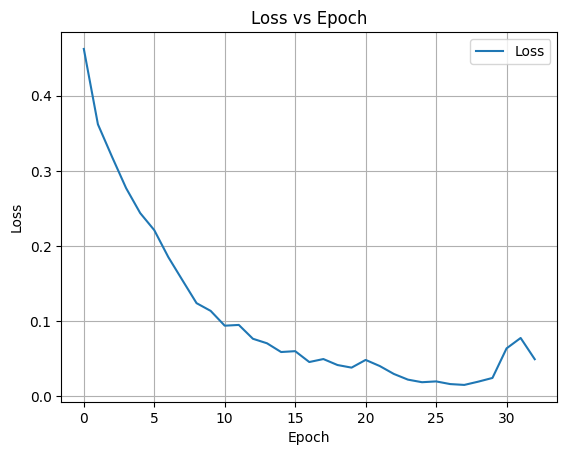

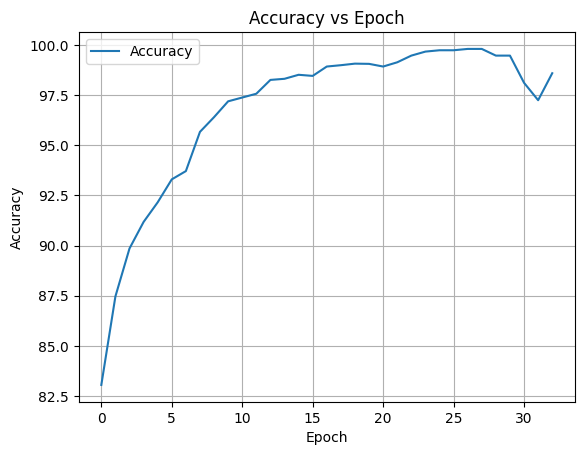

Training Model in Progress... 2
Early stopping...


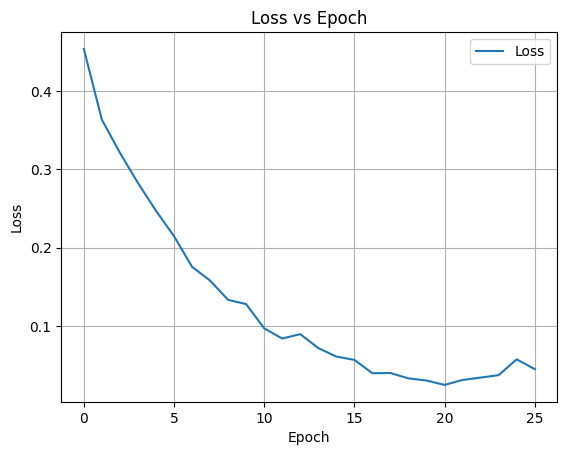

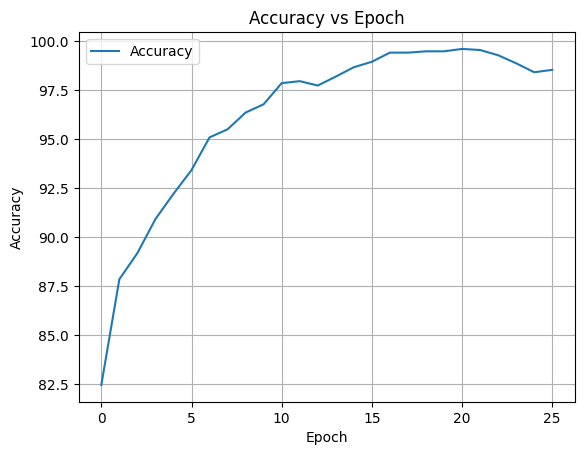

Training Model in Progress... 3
Early stopping...


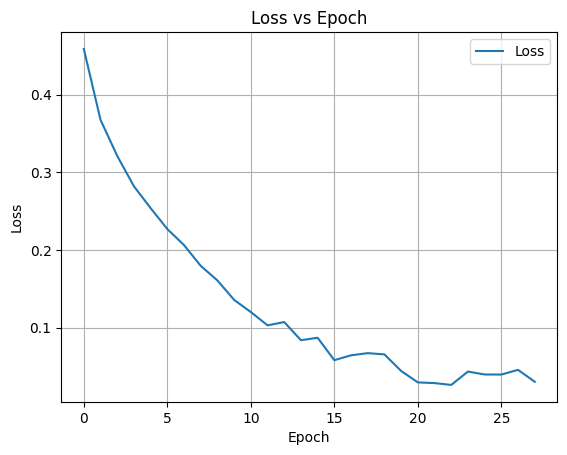

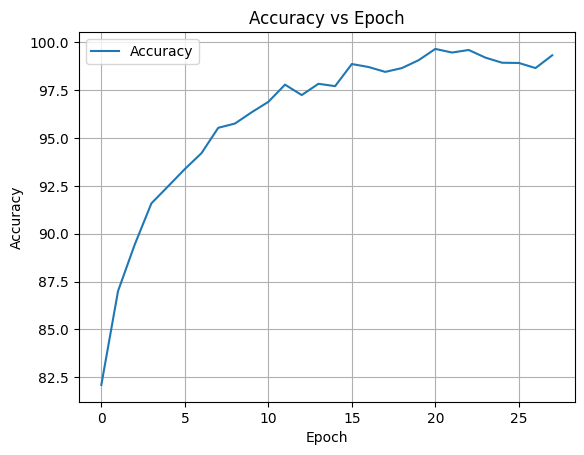

Training Model in Progress... 4
Early stopping...


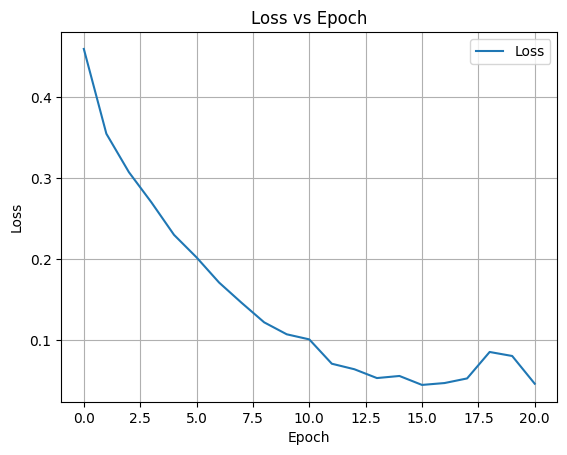

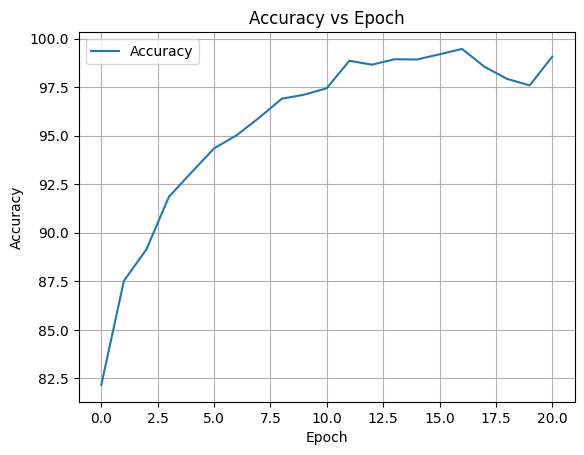

Training Model in Progress... 5
Early stopping...


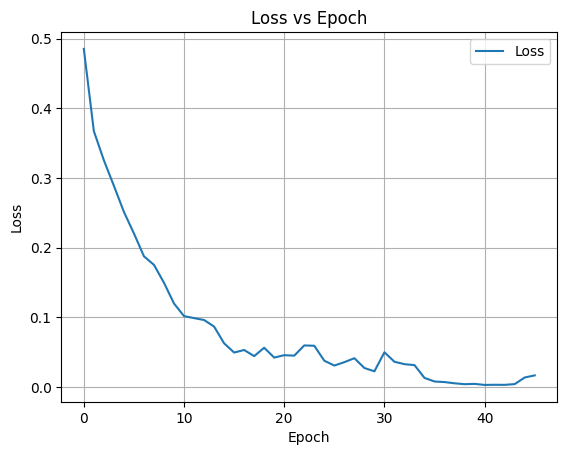

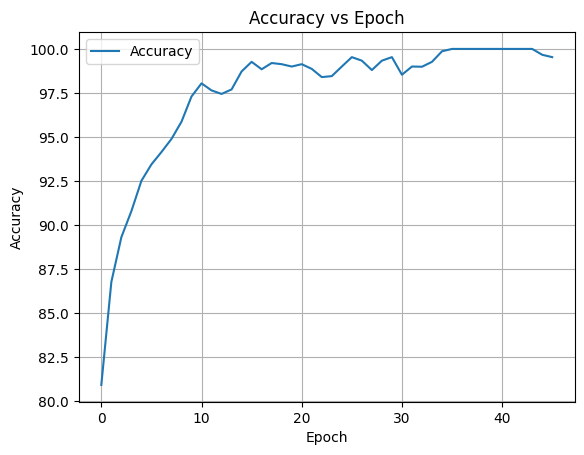

Training Model in Progress... 6
Early stopping...


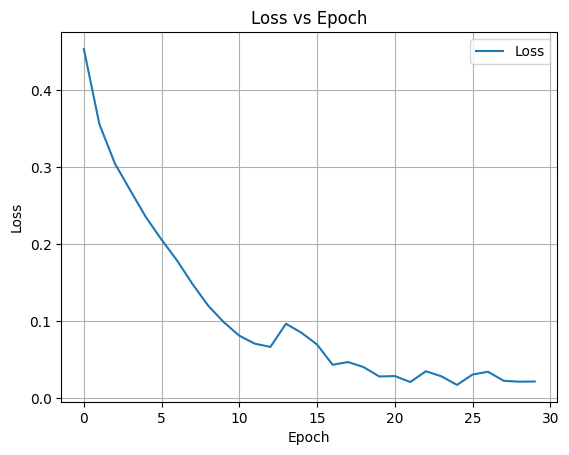

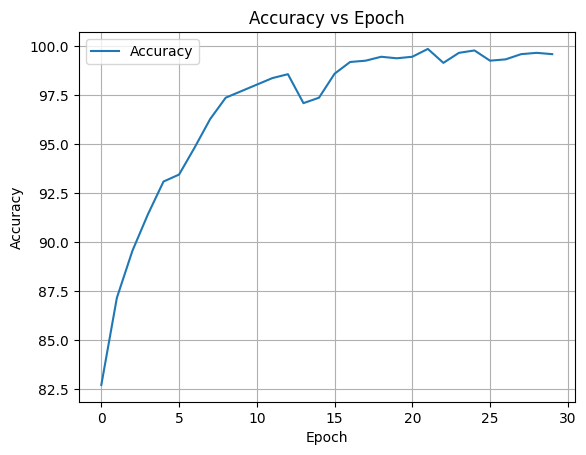

Training Model in Progress... 7
Early stopping...


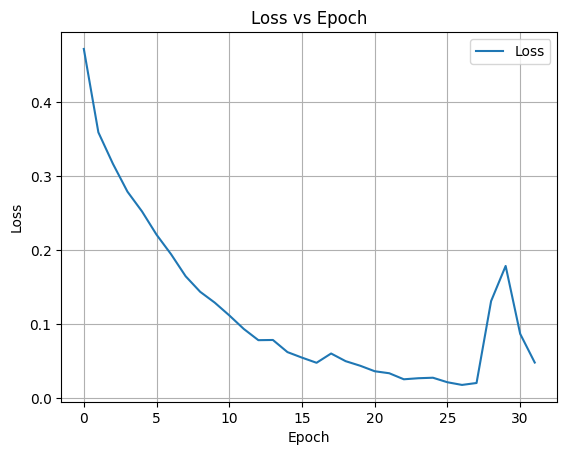

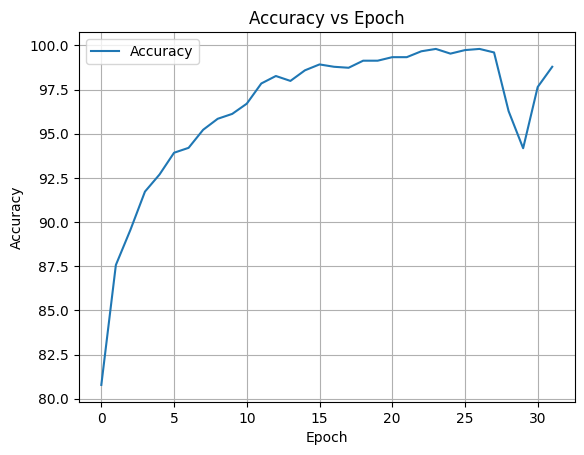

Training Model in Progress... 8
Early stopping...


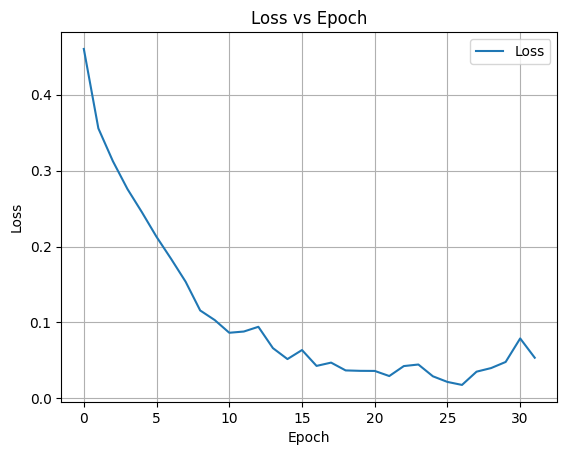

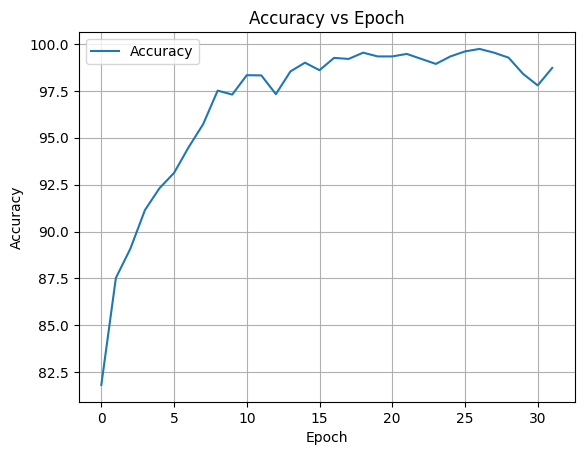

Training Model in Progress... 9
Early stopping...


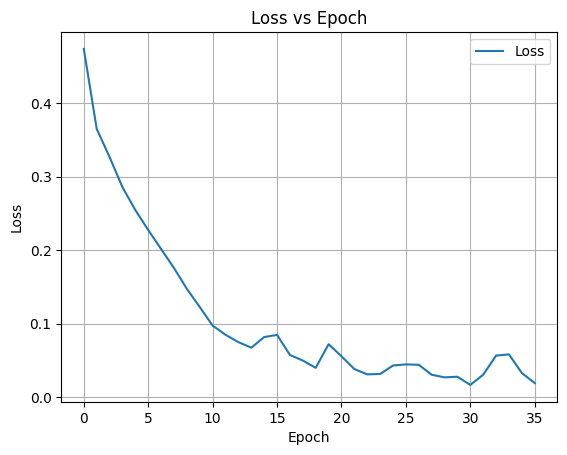

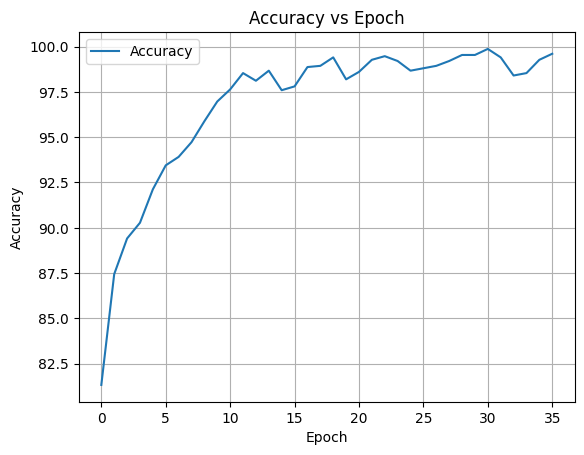

Training Model in Progress... 10
Early stopping...


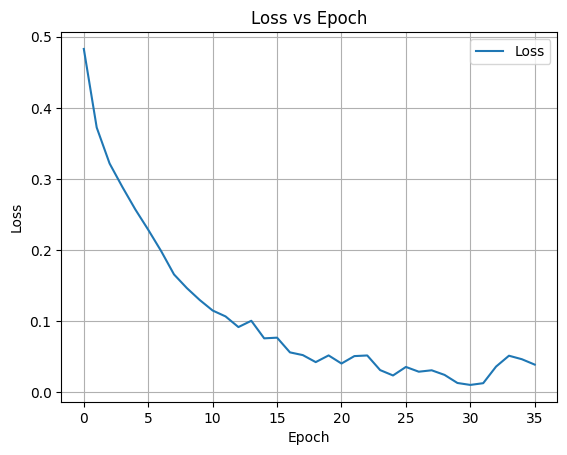

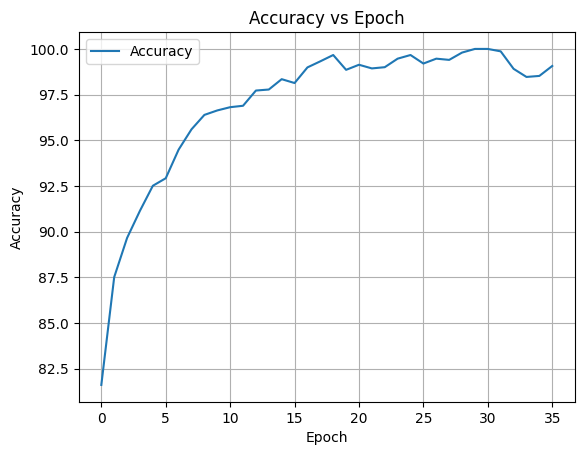

Training Model in Progress... 11
Early stopping...


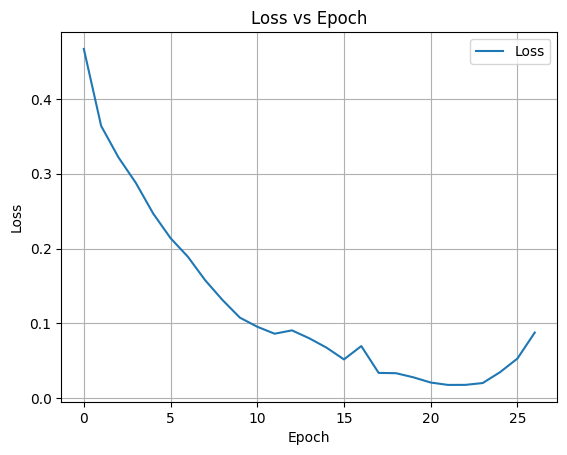

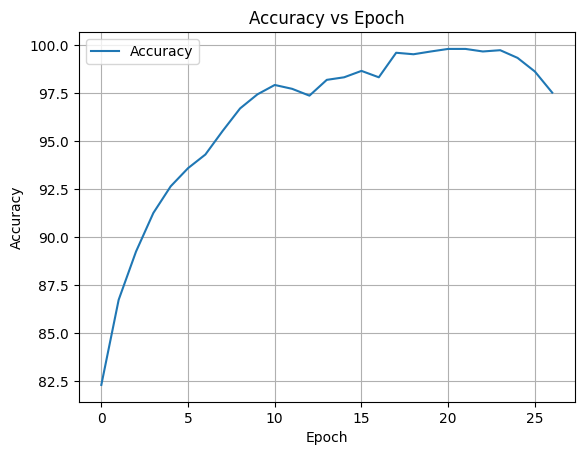

Training Model in Progress... 12
Early stopping...


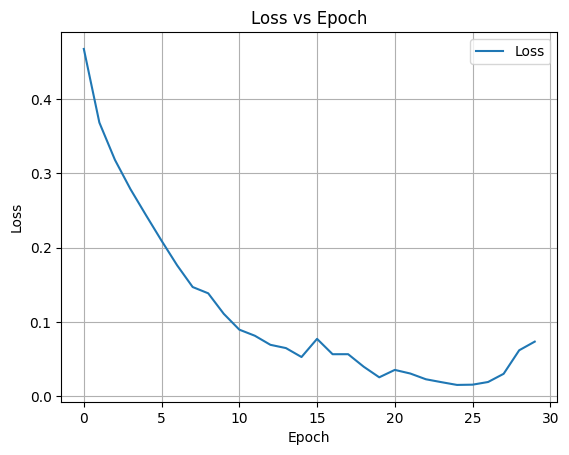

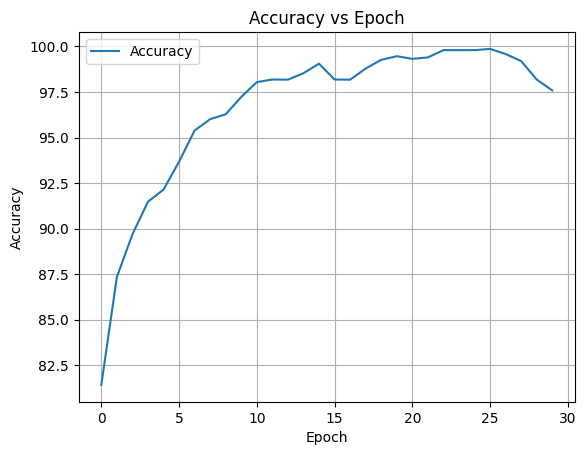

Training Model in Progress... 13
Early stopping...


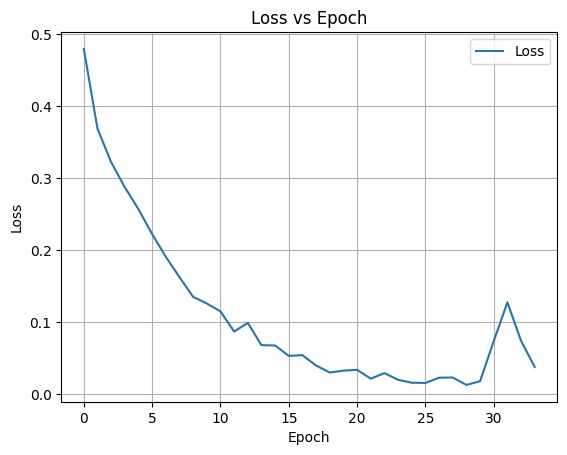

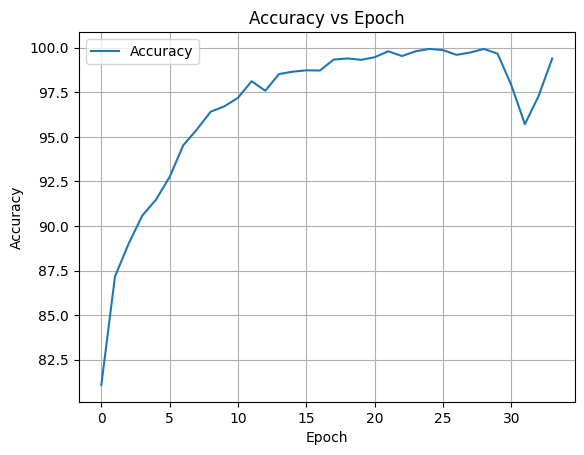

Training Model in Progress... 14
Early stopping...


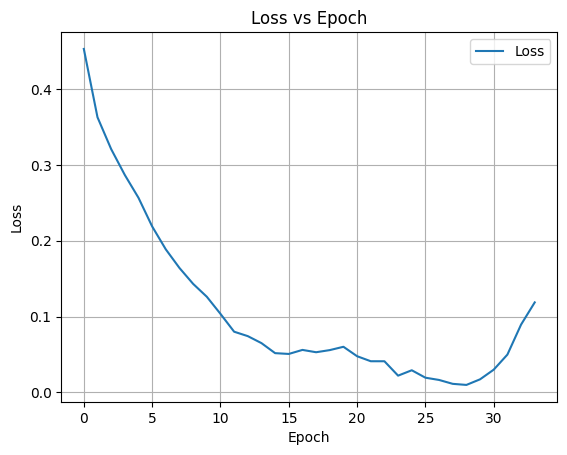

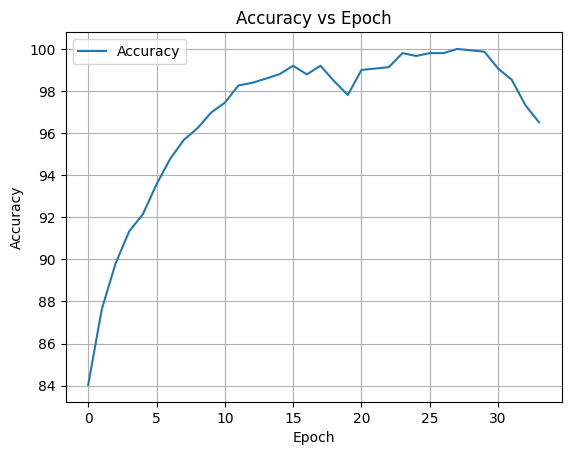

Training Model in Progress... 15
Early stopping...


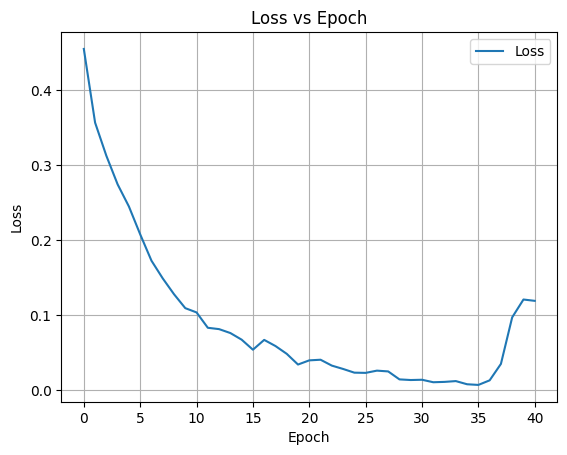

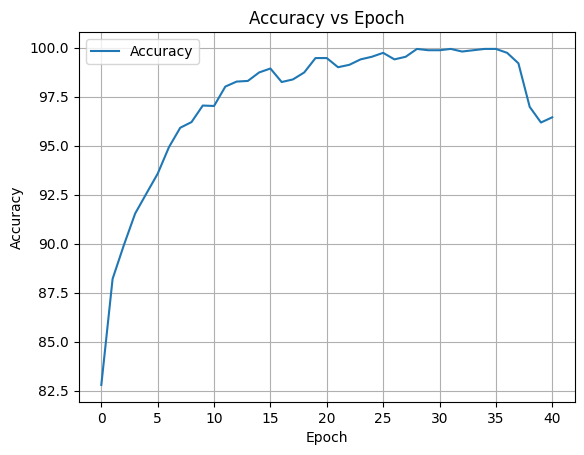

Training Model in Progress... 16
Early stopping...


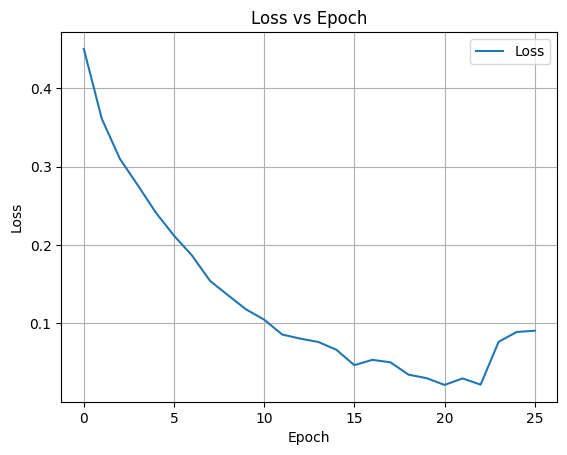

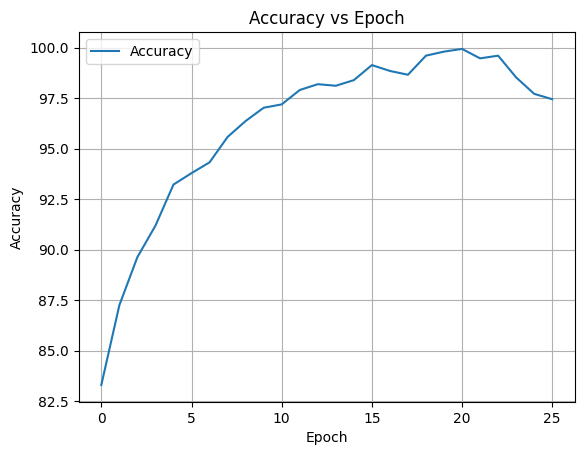

Training Model in Progress... 17
Early stopping...


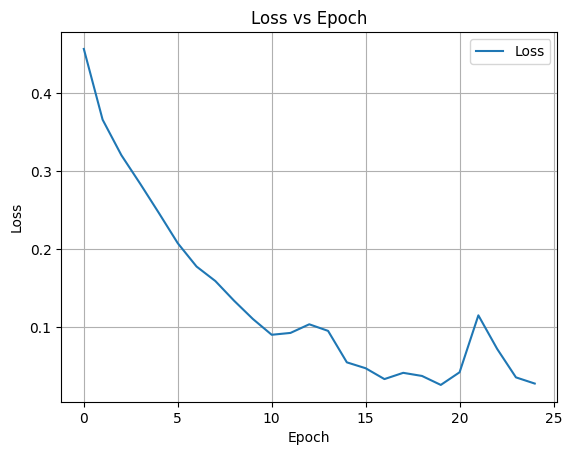

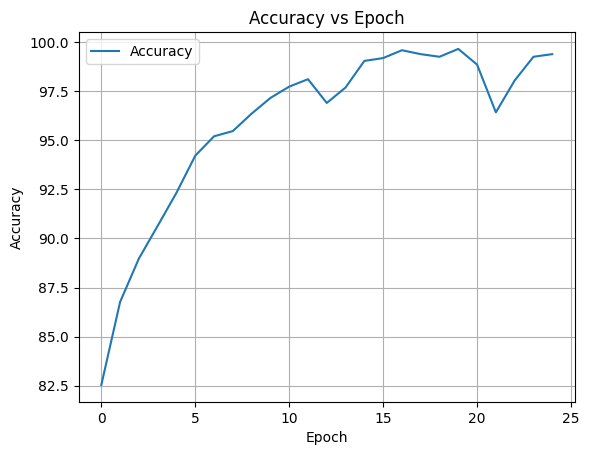

Training Model in Progress... 18
Early stopping...


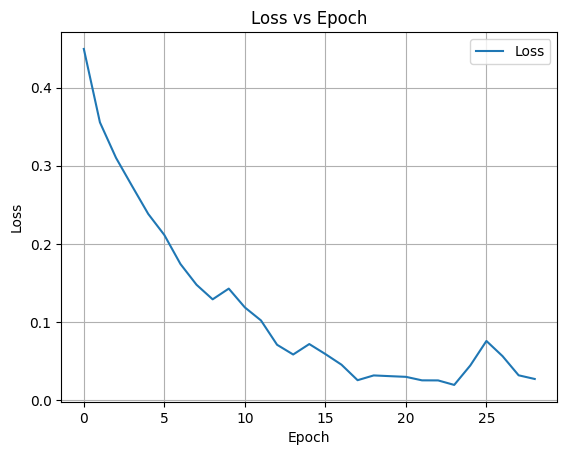

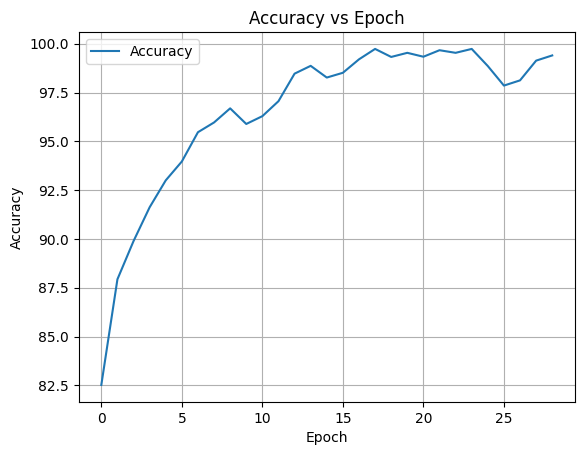

Training Model in Progress... 19
Early stopping...


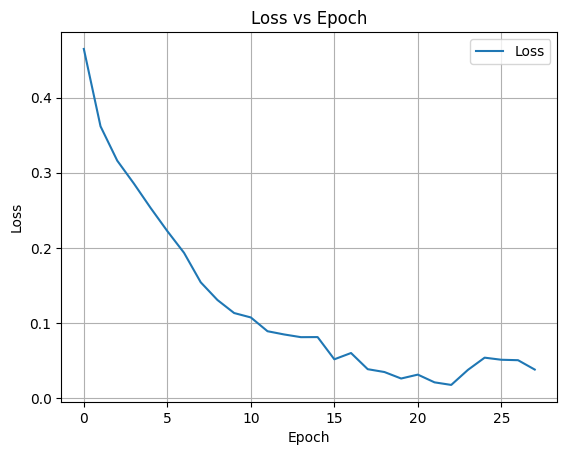

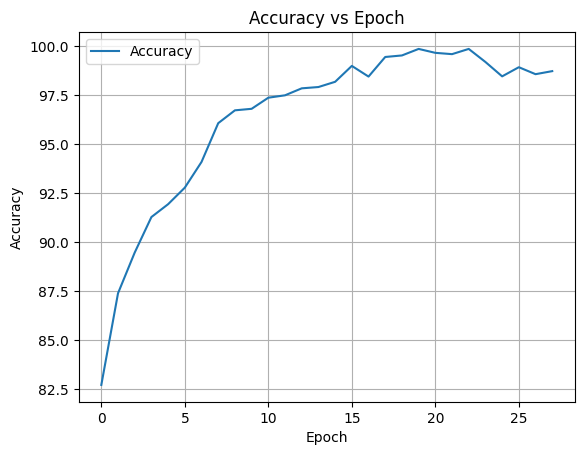

Training Model in Progress... 20
Early stopping...


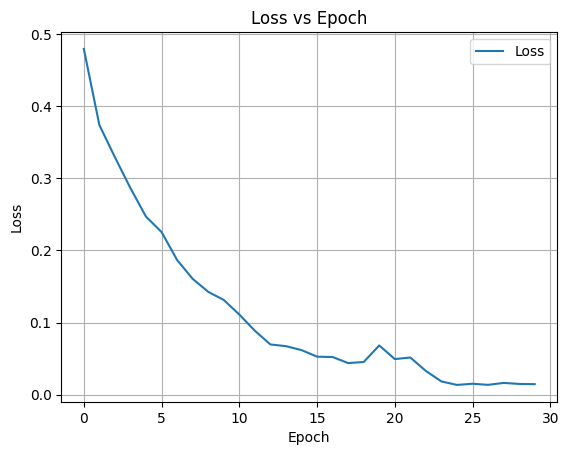

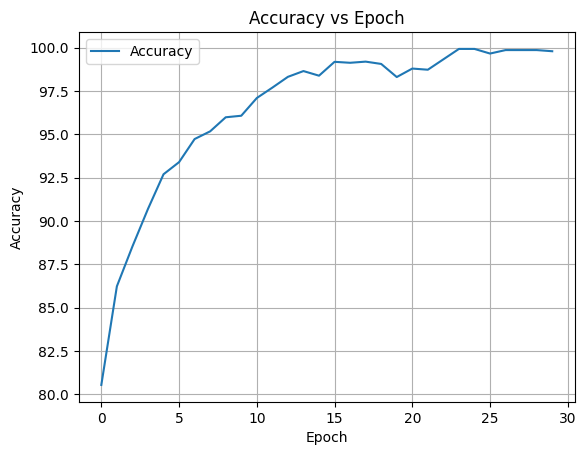

Training Model in Progress... 21
Early stopping...


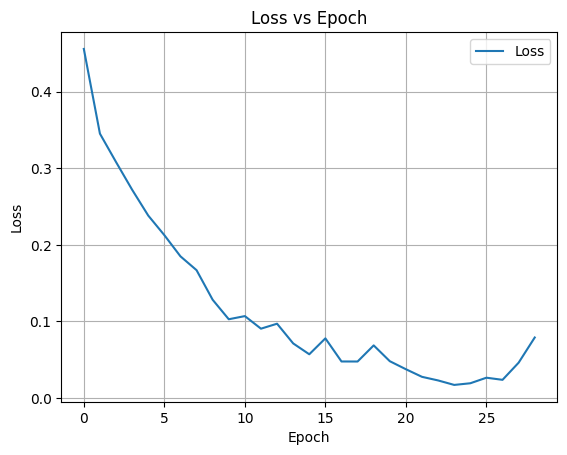

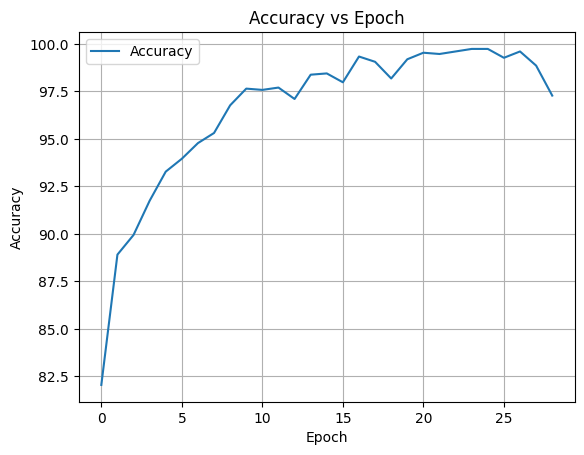

Training Model in Progress... 22
Early stopping...


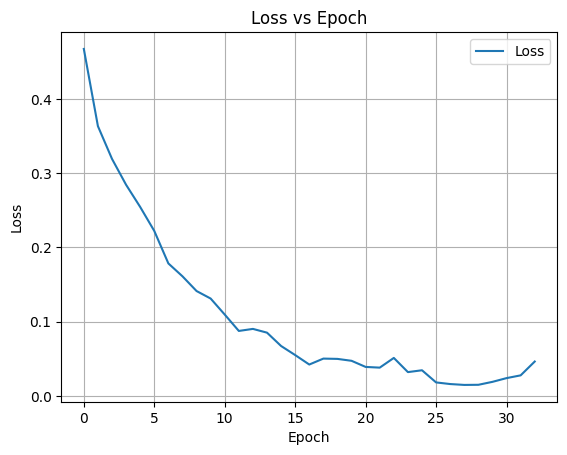

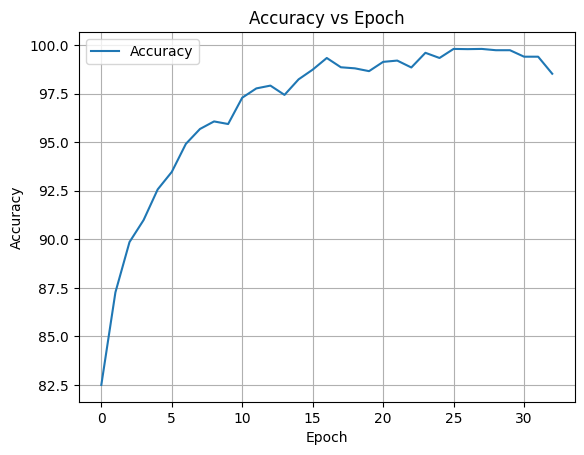

Training Model in Progress... 23
Early stopping...


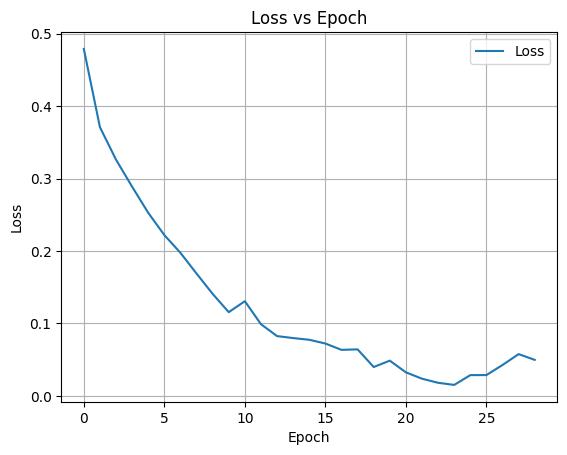

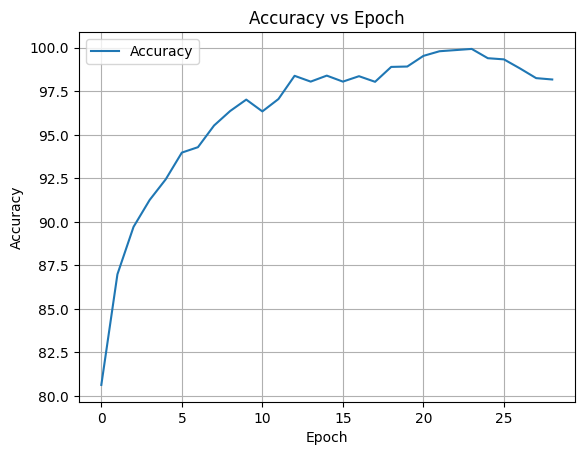

Training Model in Progress... 24
Early stopping...


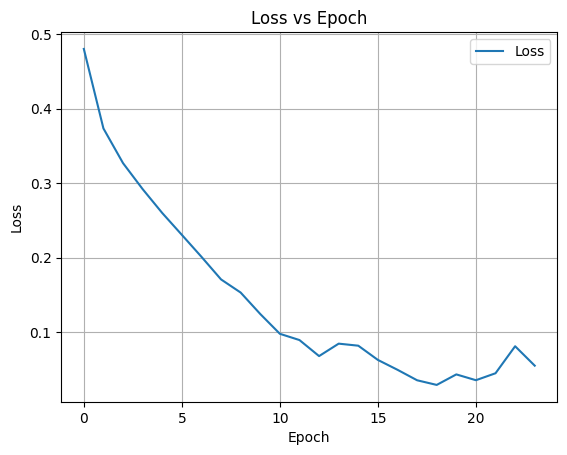

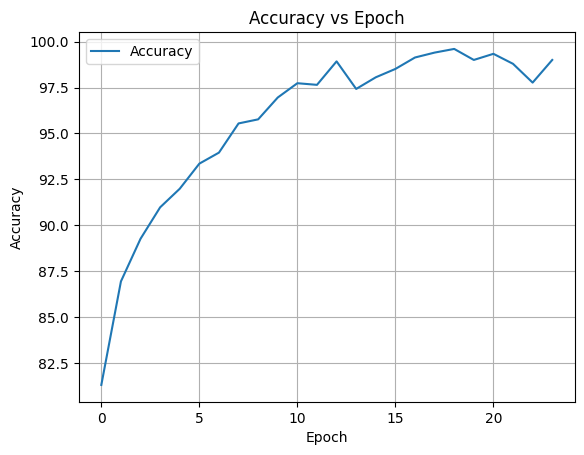

Training Model in Progress... 25
Early stopping...


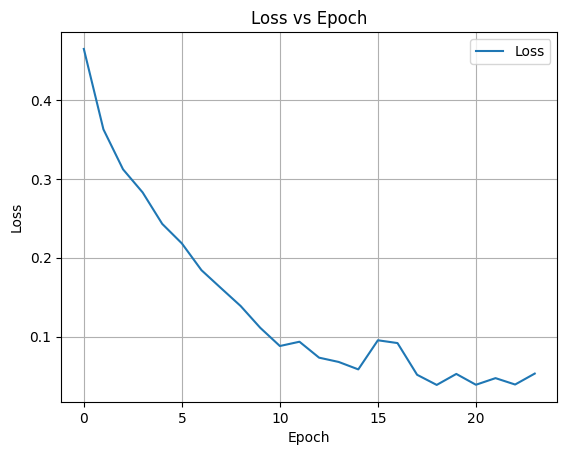

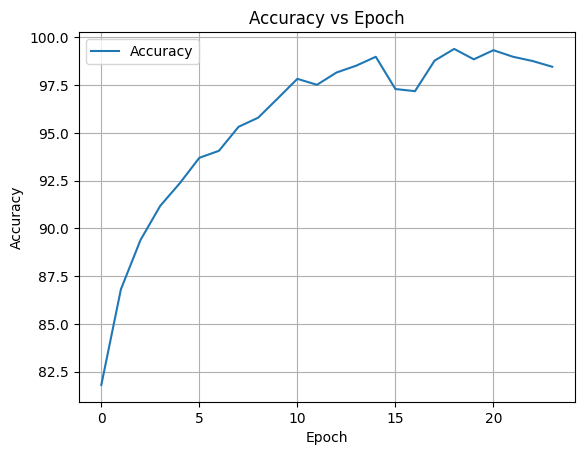

Training Model in Progress... 26
Early stopping...


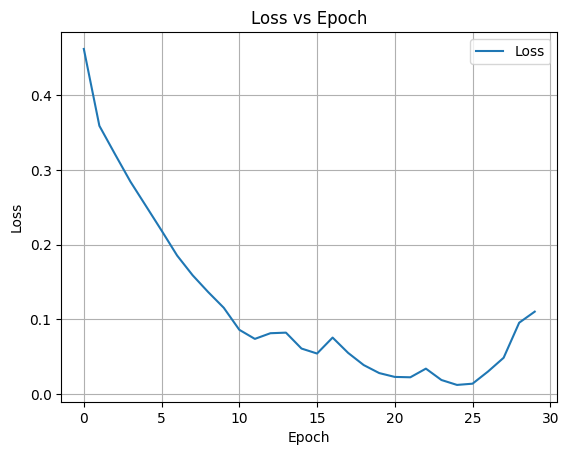

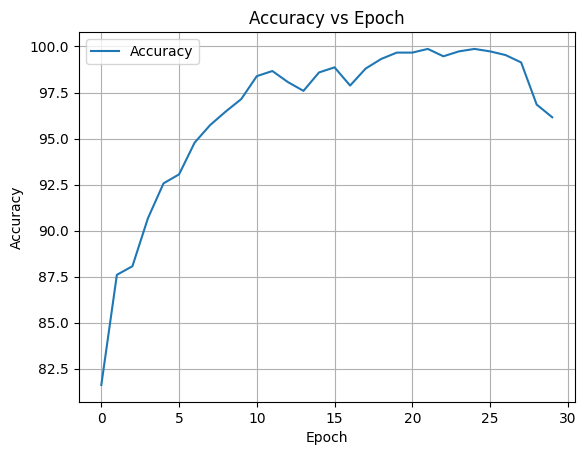

Training Model in Progress... 27
Early stopping...


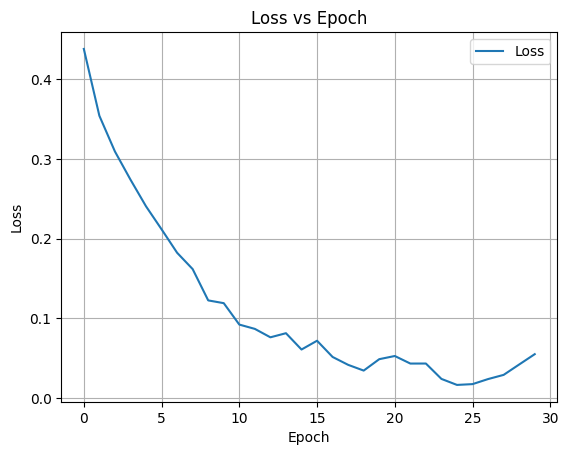

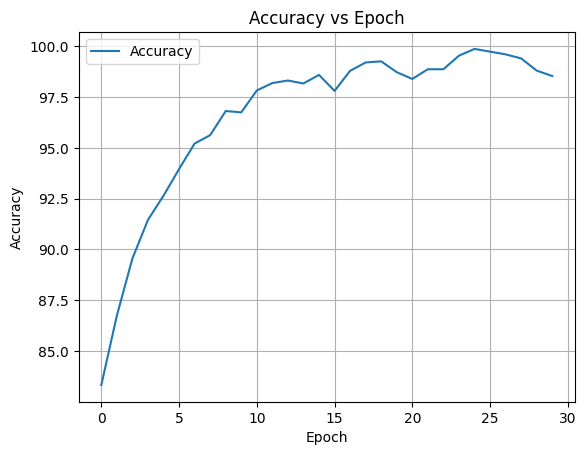

Training Model in Progress... 28
Early stopping...


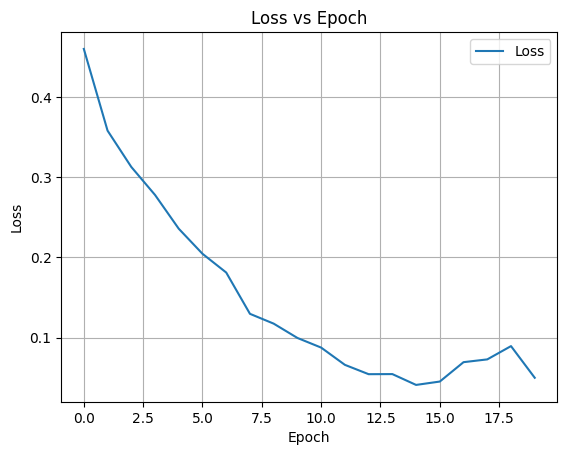

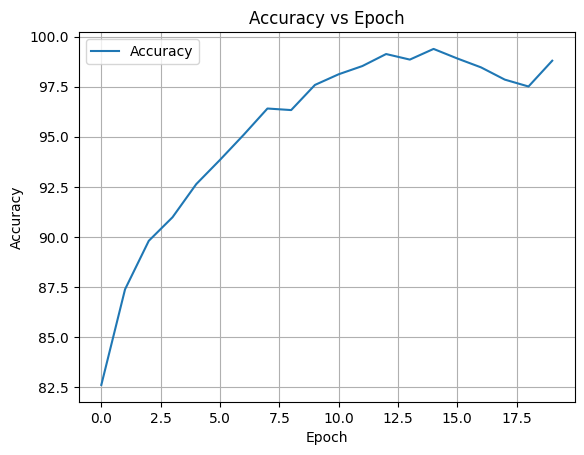

Training Model in Progress... 29
Early stopping...


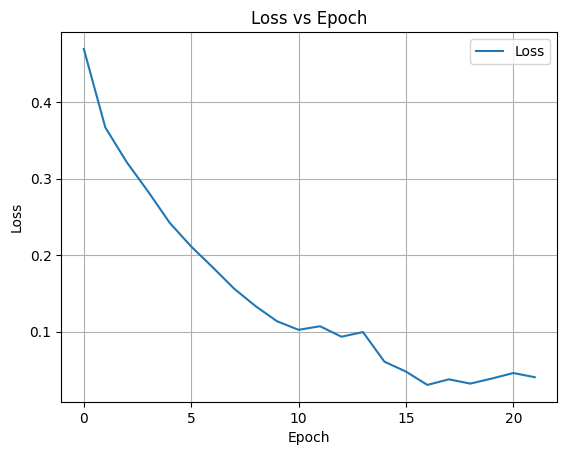

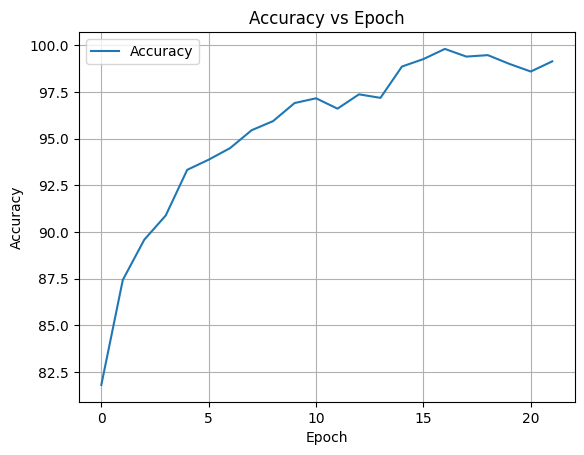

Training Model in Progress... 30
Early stopping...


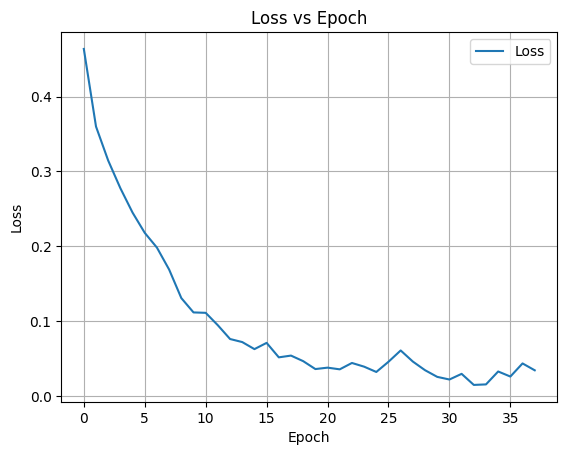

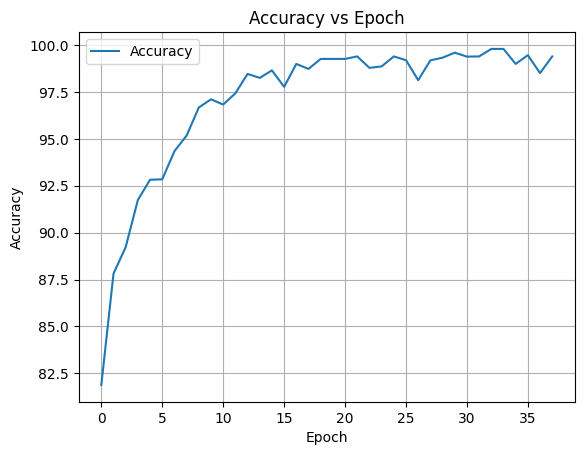

0.49889999999999995


In [40]:
#----------------------------------------------------------------------------------------------
# Preprocessing
#----------------------------------------------------------------------------------------------

compThresholds = []

for i in range(1, 31):
    # create variable list for label (y) and features (X), yLname - label name (variable name)
    X, y, yLname = varList(data_io)
    # Standardize input values (features)
    X    = standardizeInput(X)

    # train data
    all_data = TrainAllData(torch.FloatTensor(X), 
                           torch.FloatTensor(y.to_numpy()))

    # Compute Imbalance Ratio
    w0, w1 = computeIR(data_io, yLname)
    
    
    # set model parameters
    model, INPUT_SIZE, HIDDEN_SIZE, OUTPUT_SIZE, EPOCHS, BATCH_SIZE, LEARNING_RATE, criterion, optimizer = setParameters(w0, w1)
    if ( i == 0):
        print(model)

    # train and test data loaders
    train_loader = DataLoader(dataset=all_data, batch_size=BATCH_SIZE)
    test_loader = DataLoader(dataset=all_data, batch_size=1)
   
    # train model
    print("Training Model in Progress...", i)
    epoch_loss, epoch_acc, e = trainModel(EPOCHS, train_loader, model, criterion, optimizer) 

    # compute predicted probability and predicted label
    y_pred_list, y_pred_probs = computePredProbs(test_loader, model)

    # Save predicted probability to dataframe
    data_io['Pred_prob_ALL'] = (y_pred_probs)

    # compute OoD Score
    data_io = computeOoDScore(data_io, yLname)

    # Compute threshold to seperate ID/OoD Scamples using Precision-Recall curve
    avgf1 = computeThreshold(y, y_pred_probs)
    
    compThresholds.append(avgf1)

# Initial threshold for splitting OOD instances for all experiments
avgf1 = sum(compThresholds) / len(compThresholds) 
gf1_Threshold = avgf1
print(gf1_Threshold)

# write to .csv file w/OoD Score
data_io.to_csv("data_io_2K_wES.csv")


In [41]:
#gf1_Threshold  = round(0.4726344827586207, 4) # w/out ES
#gf1_Threshold  = round(0.3843766666666666, 4) # w ES 

gf1_Threshold  = round(0.48671999999999993, 4) # w ES and weights

#### Visualize by OoD Score

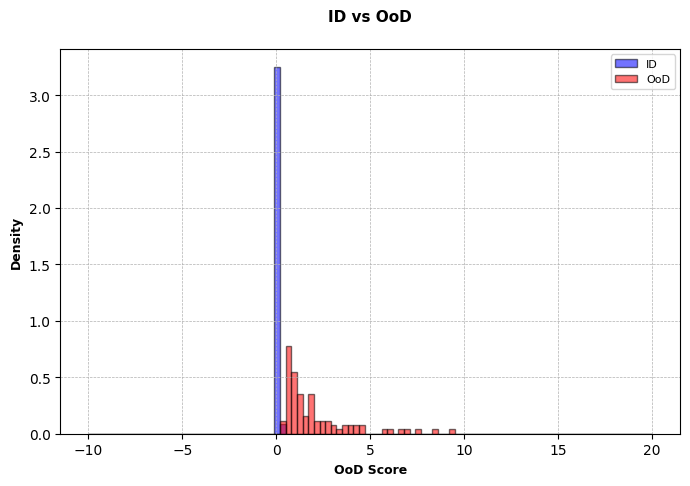

In [42]:
x1 = data_io.loc[(data_io["Log_Loss_ALL"] < gf1_Threshold).dropna(), ['Log_Loss_ALL']]    # ID
x2 = data_io.loc[(data_io["Log_Loss_ALL"] >= gf1_Threshold).dropna(), ['Log_Loss_ALL']]   # OoD


# set range
minRange = np.floor(data_io['Log_Loss_ALL'].min())   # min height - round down
maxRange = np.ceil(data_io['Log_Loss_ALL'].max())    # max height - round up
HRANGE = (minRange-10, maxRange+10)                  # to cover the whole data + padd 10 on either side for display
    
BINS = 100

# plot
plt.figure(figsize=(8,5))
plt.hist(x1, bins=BINS,  range=HRANGE, color='blue', edgecolor='k', alpha = 0.55, label='ID', density=True)
plt.hist(x2, bins=BINS, range=HRANGE, color='red', edgecolor='k', alpha = 0.55, label='OoD', density=True)
plt.grid(lw=.5, ls='--')
plt.title('ID vs OoD', y=1.05, size=11, fontweight='bold')
plt.ylabel('Density', fontsize=9, fontweight='bold')
plt.xlabel('OoD Score', fontsize=9, fontweight='bold')
plt.legend(fontsize=8)    

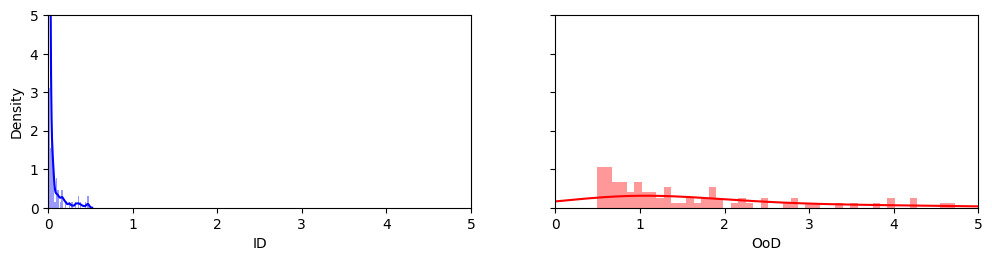

In [43]:
x1 = data_io.loc[(data_io["Log_Loss_ALL"] < gf1_Threshold), ['Log_Loss_ALL']]    # ID
x2 = data_io.loc[(data_io["Log_Loss_ALL"] >= gf1_Threshold), ['Log_Loss_ALL']]   # OoD
vizHist(x1, x2, "ID", "OoD")

## Experiments

In [44]:
# confusion matrics results for 30 iterations for all experiments
df_CM = pd.DataFrame(columns=['Iter_ID', 'Method', 'Sen_train', 'Spe_train', 'Acc_train', 'Pre_train', 'F1_train', 
                              'Sen_retrain', 'Spe_retrain', 'Acc_retrain', 'Pre_retrain', 'F1_retrain', 
                              'Sen_test', 'Spe_test', 'Acc_test', 'Pre_test', 'F1_test',
                              'train_TN', 'train_FN', 'train_FP', 'train_TP', 
                              'retrain_TN', 'retrain_FN', 'retrain_FP', 'retrain_TP',  
                              'test_TN', 'test_FN', 'test_FP', 'test_TP'])

# sampel counts for training, test1idation, test2 and retrain for 30 iterations
df_Counts = pd.DataFrame(columns=['Iter_ID', 'Method', 'trainSet_nOOD', 'trainSet_OOD', 'reserveSet_nOOD', 'reserveSet_OOD', 
                                   'retrainSet_nOOD', 'retrainSet_OOD', 'testSet_nOOD', 'testSet_OOD', 'trainEpochs', 
                                   'retrainEpochs'])

df_KLD = pd.DataFrame(columns=['Iter_ID', 'Method', 'Features', 'KLD_t_t', 'KLD_rt_t', 'Types'])


# to identify ood score ranges for ID/OoD samples. ALso capture correctly classified and misclassified
# SampleType - ID or OoD.    TType - training, retraining, testing
df_OodRange = pd.DataFrame(columns=['Iter_ID', 'Method', 'TType', 'SampleType', 'MinOodScore','MaxOodScore'])

# To identify correctly classified and misclassified
#df_CMresults = pd.DataFrame(columns=['Iter_ID', 'Method', 'TType', 'TP','TN', 'FP', 'FN'])

### Baseline - Train - 70% ID, 0% OoD | Test - 30% ID, 30% OoD

In [45]:
# This code is for experimenting
print("data_io - max = ", str(data_io['Log_Loss_ALL'].max()))

ID_set = data_io.loc[(data_io["Log_Loss_ALL"] < gf1_Threshold)] # ID samples
OoD_set = data_io.loc[(data_io["Log_Loss_ALL"] >= gf1_Threshold)] # OoD samples
bins_plt = jenkspy.jenks_breaks(OoD_set['Log_Loss_ALL'], n_classes=3) 

#topGroup5 = bins_plt[0]  #  lowest value
topGroup4 = bins_plt[0] 
topGroup3 = bins_plt[1] 
topGroup2 = bins_plt[2]  # Highest value
topGroup1 = bins_plt[3]

print("Total N = ", len(data_io))
print("ID Count = ", len(ID_set))
print("OoD Count = ", len(OoD_set))

print("")
print(topGroup1)
print(topGroup2)
print(topGroup3)
print(topGroup4)
#print(topGroup5)

print("   ")
print(OoD_set["Log_Loss_ALL"].max())
print(OoD_set["Log_Loss_ALL"].min())

data_io - max =  9.303887
Total N =  1434
ID Count =  1348
OoD Count =  86

9.303887
4.685113
2.150567
0.489232
   
9.303887
0.489232


In [46]:
# Compute thresholding using threshold moving method based on training set
def computeThresholdMoving(y, y_pred_probs):

    # calculate roc curves - Thresold based on Training
    precision_f1Smm, recall_f1Smm, thresholds_pr_f1Smm = precision_recall_curve(y, y_pred_probs)
    
    # Calculate the f-score
    fscore_f1Smm = (2 * precision_f1Smm * recall_f1Smm) / (precision_f1Smm + recall_f1Smm)

    # Find the optimal threshold
    index_pr_f1Smm = np.argmax(fscore_f1Smm)
    gf1Smm_trainThreshold = round(thresholds_pr_f1Smm[index_pr_f1Smm], ndigits = 4)
    
    return gf1Smm_trainThreshold

In [47]:
def consturctTRTsets(dataset, gf1_Threshold, yLname):

    data_io['LogLoss_Group'] = ''  # create a grouping field
    
    gf1Smm_ID_set = dataset.loc[(data_io["Log_Loss_ALL"] < gf1_Threshold)]   # ID samples
    gf1Smm_OoD_set = dataset.loc[(data_io["Log_Loss_ALL"] >= gf1_Threshold)] # OoD samples

    # ID Sample allocation for for Training and Testing
    # Stratify ID samples by malignancy and manufacturer. Train 70% test 30%
    gf1Smm_ID_set = shuffle(gf1Smm_ID_set)    # shuffle ID samples
    gf1Smm_train_ID, gf1Smm_test_ID = train_test_split(gf1Smm_ID_set, test_size=0.3, stratify=gf1Smm_ID_set[[yLname]])
        
    
    # OoD Sample allocation for Reserve and Test - Group log loss value to groups for stratification add top G%
    #n_plt, bins_plt, patches = plt.hist(gf1Smm_OoD_set.Log_Loss_ALL, bins=4)     # based on histogram
    bins_plt = jenkspy.jenks_breaks(OoD_set['Log_Loss_ALL'], n_classes=3)         # based on natural breaks
     
    topGroup4 = bins_plt[0] # Lowest value
    topGroup3 = 1.21 
    topGroup2 = 2.4 
    topGroup1 = bins_plt[3]  # Highest value
    
    print("topGroup4  = ", str(topGroup4))
    print("topGroup3  = ", str(topGroup3))
    print("topGroup2  = ", str(topGroup2))
    print("topGroup1  = ", str(topGroup1))
    
    # update group based on lower bound
    gf1Smm_OoD_set.loc[((gf1Smm_OoD_set["Log_Loss_ALL"] <= topGroup3)) , "LogLoss_Group"] = topGroup4 
    gf1Smm_OoD_set.loc[((gf1Smm_OoD_set["Log_Loss_ALL"] >topGroup3) & (gf1Smm_OoD_set["Log_Loss_ALL"] <= topGroup2)) , "LogLoss_Group"] = topGroup3
    gf1Smm_OoD_set.loc[((gf1Smm_OoD_set["Log_Loss_ALL"] >topGroup2) & (gf1Smm_OoD_set["Log_Loss_ALL"] <= topGroup1)) , "LogLoss_Group"] = topGroup2
    gf1Smm_OoD_set.loc[((gf1Smm_OoD_set["Log_Loss_ALL"] >topGroup1)) , "LogLoss_Group"] = topGroup1


    # OoD Samples: stratify OoD samples by malignancy ood score grouping and manufacturer. Train 70% test 30%
    gf1Smm_OoD_set = shuffle(gf1Smm_OoD_set) # shuffle ID samples
    gf1Smm_reserve_OOD, gf1Smm_test_OOD = train_test_split(gf1Smm_OoD_set, test_size=0.3, stratify=gf1Smm_OoD_set[[yLname, "LogLoss_Group"]])

    
    gf1Smm_train_dataF = gf1Smm_train_ID
    gf1Smm_reserve_dataF = gf1Smm_reserve_OOD
    gf1Smm_test_dataF = pd.concat([gf1Smm_test_ID, gf1Smm_test_OOD])
    
    return gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, topGroup1, topGroup2, topGroup3, topGroup4

In [48]:
def getCountsPeforIndicators(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, 
                             gf1Smm_oodSamples_toAdd, experimentID, numIter, Sen_gf1Smm_train, Spe_gf1Smm_train, 
                             Acc_gf1Smm_train, Pre_gf1Smm_train, F1_gf1Smm_train, Sen_gf1Smm_retrain, Spe_gf1Smm_retrain,
                             Acc_gf1Smm_retrain, Pre_gf1Smm_retrain, F1_gf1Smm_retrain, Sen_gf1Smm_test, Spe_gf1Smm_test, 
                             Acc_gf1Smm_test, Pre_gf1Smm_test, F1_gf1Smm_test, train_TN, train_FN, train_FP, train_TP, 
                             retrain_TN, retrain_FN, retrain_FP, retrain_TP, test_TN, test_FN, test_FP, test_TP, 
                             trainEpochs, retrainEpochs):
    
    global df_CM, df_Counts, df_KLD, df_OodRange, df_RetrainOoD

    # Get Counts for Training, reserve, test Set Counts to dataframe
    nOOD_Train  = len(gf1Smm_train_dataF)
    OOD_Train   = 0
    nOOD_reserve  = 0
    OOD_reserve   = len(gf1Smm_reserve_dataF)
    nOOD_test  = len(gf1Smm_test_ID)
    OOD_test   = len(gf1Smm_test_OOD)
    nOODRetrain = nOOD_Train 
    OOD_Retrain = len(gf1Smm_oodSamples_toAdd)


    # Write counts to dataset
    df_Counts = df_Counts.append({'Iter_ID': numIter , 'Method': experimentID, 
                                   'trainSet_nOOD': nOOD_Train ,  'trainSet_OOD': OOD_Train, 
                                   'reserveSet_nOOD': nOOD_reserve , 'reserveSet_OOD': OOD_reserve , 
                                   'retrainSet_nOOD': nOODRetrain , 'retrainSet_OOD': OOD_Retrain , 
                                   'testSet_nOOD': nOOD_test , 'testSet_OOD': OOD_test ,
                                   'trainEpochs': trainEpochs , 'retrainEpochs': retrainEpochs}, ignore_index=True)

    
    # Write OoD Score ranges for ID and OoD Samples for each experiment
    df_OodRange = df_OodRange.append({'Iter_ID': numIter, 'Method': experimentID, 
                                      'TType': 'Train', 'SampleType': 'ID', 
                                      'MinOodScore': gf1Smm_train_dataF['Log_Loss_ALL'].min() ,
                                      'MaxOodScore': gf1Smm_train_dataF['Log_Loss_ALL'].max() }, ignore_index=True)

    df_OodRange = df_OodRange.append({'Iter_ID': numIter, 'Method': experimentID, 
                                      'TType': 'Retrain', 'SampleType': 'ID', 
                                      'MinOodScore': gf1Smm_train_dataF['Log_Loss_ALL'].min() ,
                                      'MaxOodScore': gf1Smm_train_dataF['Log_Loss_ALL'].max() }, ignore_index=True)
    
    df_OodRange = df_OodRange.append({'Iter_ID': numIter, 'Method': experimentID, 
                                      'TType': 'Retrain', 'SampleType': 'OOD', 
                                      'MinOodScore': gf1Smm_oodSamples_toAdd['Log_Loss_ALL'].min() ,
                                      'MaxOodScore': gf1Smm_oodSamples_toAdd['Log_Loss_ALL'].max() }, ignore_index=True) 
    
    df_OodRange = df_OodRange.append({'Iter_ID': numIter, 'Method': experimentID, 
                                      'TType': 'Test', 'SampleType': 'ID', 
                                      'MinOodScore': gf1Smm_test_ID['Log_Loss_ALL'].min() ,
                                      'MaxOodScore': gf1Smm_test_ID['Log_Loss_ALL'].max() }, ignore_index=True)
    
    df_OodRange = df_OodRange.append({'Iter_ID': numIter, 'Method': experimentID, 
                                      'TType': 'Test', 'SampleType': 'OOD', 
                                      'MinOodScore': gf1Smm_test_OOD['Log_Loss_ALL'].min() ,
                                      'MaxOodScore': gf1Smm_test_OOD['Log_Loss_ALL'].max() }, ignore_index=True)  


    # Write all performance indicators to dataframe. Compute Average and CI
    df_CM = df_CM.append({'Iter_ID': numIter , 'Method': experimentID, 
                              'Sen_train': Sen_gf1Smm_train , 'Spe_train': Spe_gf1Smm_train , 'Acc_train': Acc_gf1Smm_train , 
                              'Pre_train': Pre_gf1Smm_train , 'F1_train': F1_gf1Smm_train,
                              'Sen_retrain': Sen_gf1Smm_retrain , 'Spe_retrain': Spe_gf1Smm_retrain , 'Acc_retrain': Acc_gf1Smm_retrain , 
                              'Pre_retrain': Pre_gf1Smm_retrain , 'F1_retrain' : F1_gf1Smm_retrain,
                              'Sen_test': Sen_gf1Smm_test , 'Spe_test': Spe_gf1Smm_test , 'Acc_test': Acc_gf1Smm_test , 
                              'Pre_test': Pre_gf1Smm_test , 'F1_test': F1_gf1Smm_test,
                              'train_TN' : train_TN, 'train_FN': train_FN, 'train_FP': train_FP, 'train_TP': train_TP, 
                              'retrain_TN': retrain_TN, 'retrain_FN':retrain_FN, 'retrain_FP':retrain_FP, 'retrain_TP': retrain_TP,  
                              'test_TN': test_TN, 'test_FN': test_FN, 'test_FP': test_FP, 'test_TP': test_TP }, ignore_index=True)




In [49]:
# Create train, reserve and test sets, run baseline (Train)
def assignSample_trainClassifier(numIter, dataset, gf1_Threshold, yLname):
    
    # Seperate ID and OoD Samples - Create training and test sets based on thresholded value
    gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, topGroup1, topGroup2, topGroup3, topGroup4 = consturctTRTsets(dataset, gf1_Threshold, yLname)
    
    # Create variable list x, y and yLname - label name (variable name) for training, reserve and testing
    gf1SmmX_train, gf1Smmy_train, yLname     = varList(gf1Smm_train_dataF)
    gf1SmmX_reserve, gf1Smmy_reserve, yLname = varList(gf1Smm_reserve_dataF)
    gf1SmmX_test, gf1Smmy_test, yLname       = varList(gf1Smm_test_dataF)
    
    # Standardize input values (features)
    gf1SmmX_train   = standardizeInput(gf1SmmX_train)
    gf1SmmX_reserve = standardizeInput(gf1SmmX_reserve)
    gf1SmmX_test    = standardizeInput(gf1SmmX_test)

    # train data
    train_data   = TrainAllData(torch.FloatTensor(gf1SmmX_train), torch.FloatTensor(gf1Smmy_train.to_numpy()))
    reserve_data = TrainAllData(torch.FloatTensor(gf1SmmX_reserve), torch.FloatTensor(gf1Smmy_reserve.to_numpy()))
    test_data    = TrainAllData(torch.FloatTensor(gf1SmmX_test), torch.FloatTensor(gf1Smmy_test.to_numpy()))
    
    # Compute Imbalance Ratio
    w0, w1 = computeIR(dataset, yLname)

    # set model parameters
    model, INPUT_SIZE, HIDDEN_SIZE, OUTPUT_SIZE, EPOCHS, BATCH_SIZE, LEARNING_RATE, criterion, optimizer = setParameters(w0, w1)
    EPOCHS = 100

    # train and get the performance for training set
    train_loader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, drop_last=True)
    trainPerf_loader = DataLoader(dataset=train_data, batch_size=1)

    # Compute Imbalance Ratio
    w0, w1 = computeIR(dataset, yLname)

    # train model
    print("\nTraining Model in Progress...")
    epoch_loss, epoch_acc, trainEpochs = trainModel(EPOCHS, train_loader, model, criterion, optimizer)

    # compute predicted probability and predicted label for training
    y_pred_listT, y_pred_probsT = computePredProbs(trainPerf_loader, model)

    # compute threshold based on training set to compute pred_Y
    T = computeThresholdMoving(gf1Smmy_train, y_pred_probsT)
    print("Train Threhold = ", str(T))

    # compute predicted probability for reserve and test sets
    reserve_loader = DataLoader(dataset=reserve_data, batch_size=1)
    y_pred_listR, y_pred_probsR = computePredProbs(reserve_loader, model)

    test_loader = DataLoader(dataset=test_data, batch_size=1)
    y_pred_listTst, y_pred_probsTst = computePredProbs(test_loader, model)

    
    # assign pred. prob to datasets
    gf1Smm_train_dataF['Pred_prob1']   = y_pred_probsT
    gf1Smm_reserve_dataF['Pred_prob1'] = y_pred_probsR
    gf1Smm_test_dataF['Pred_prob1']    = y_pred_probsTst
    
    
    # compute and assign Pred_Y for all sets
    gf1Smm_train_dataF["Pred_Y1"] = 0                                                  # train
    gf1Smm_train_dataF.loc[gf1Smm_train_dataF["Pred_prob1"] > T, "Pred_Y1"] = 1

    gf1Smm_reserve_dataF["Pred_Y1"] = 0                                                # reserve
    gf1Smm_reserve_dataF.loc[gf1Smm_reserve_dataF["Pred_prob1"] > T, "Pred_Y1"] = 1

    gf1Smm_test_dataF["Pred_Y1"] = 0                                                   # test
    gf1Smm_test_dataF.loc[gf1Smm_test_dataF["Pred_prob1"] > T, "Pred_Y1"] = 1
    

    # confusion matrix for training and test set (Baseline)
    # funcation to compute and return values for - training and test performance
    Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP = confMatrixResults(gf1Smm_train_dataF[yLname], gf1Smm_train_dataF.Pred_Y1)
    Sen_gf1Smm_test, Spe_gf1Smm_test, Acc_gf1Smm_test, Pre_gf1Smm_test, F1_gf1Smm_test, test_TN, test_FN, test_FP, test_TP = confMatrixResults(gf1Smm_test_dataF[yLname], gf1Smm_test_dataF.Pred_Y1)  
 
    # train, reserve, test samples, last 2 for counts
    return gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, gf1Smmy_reserve, gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, test_TP, trainEpochs, w0, w1

In [50]:
# Retraining Classifier 
def retrainClassifier(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, 
                      gf1Smm_test_OOD, reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, 
                      gf1SmmX_reserve, gf1Smmy_reserve, gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, 
                      Acc_gf1Smm_train, Pre_gf1Smm_train, F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, 
                      test_TN, test_FN, test_FP, test_TP, experimentID, numIter, gf1Smm_oodSamples_toAdd, trainEpochs, 
                      w0, w1):
    
    # Create variable list x, y and yLname - label name (variable name) for retraining
    gf1SmmX_retrain, gf1Smmy_retrain, yLname     = varList(gf1Smm_retrain_dataF)
    
    # Standardize input values (features)
    gf1SmmX_retrain   = standardizeInput(gf1SmmX_retrain)

    # retrain data
    retrain_data   = TrainAllData(torch.FloatTensor(gf1SmmX_retrain), torch.FloatTensor(gf1Smmy_retrain.to_numpy()))

    # set model parameters
    model, INPUT_SIZE, HIDDEN_SIZE, OUTPUT_SIZE, EPOCHS, BATCH_SIZE, LEARNING_RATE, criterion, optimizer = setParameters(w0, w1)
    EPOCHS = 100

    # retrain and get performance for retraining set
    retrain_loader = DataLoader(dataset=retrain_data, batch_size=BATCH_SIZE, drop_last=True)
    retrainPerf_loader = DataLoader(dataset=retrain_data, batch_size=1)

    # retrain model
    print("\nRetraining Model in Progress...")
    epoch_loss, epoch_acc, retrainEpochs = trainModel(EPOCHS, retrain_loader, model, criterion, optimizer)

    # compute predicted probability and predicted label for training
    y_pred_listRT, y_pred_probsRT = computePredProbs(retrainPerf_loader, model)

    # compute threshold based on training set to compute pred_Y
    T = computeThresholdMoving(gf1Smmy_retrain, y_pred_probsRT)
    print("RT Threhold = ", str(T))

    # compute predicted probability for reserve and test sets
    reserve_loader = DataLoader(dataset=reserve_data, batch_size=1)
    y_pred_listR, y_pred_probsR = computePredProbs(reserve_loader, model)

    test_loader = DataLoader(dataset=test_data, batch_size=1)
    y_pred_listTst, y_pred_probsTst = computePredProbs(test_loader, model)

    
    # assign pred. prob to datasets
    gf1Smm_retrain_dataF['Pred_prob2']   = y_pred_probsRT
    gf1Smm_reserve_dataF['Pred_prob2'] = y_pred_probsR
    gf1Smm_test_dataF['Pred_prob2']   = y_pred_probsTst
    
    
    # compute and assign Pred_Y for all sets
    gf1Smm_retrain_dataF["Pred_Y2"] = 0                                                       # retrain
    gf1Smm_retrain_dataF.loc[gf1Smm_retrain_dataF["Pred_prob2"] > T, "Pred_Y2"] = 1

    gf1Smm_test_dataF["Pred_Y2"] = 0                                                          # test
    gf1Smm_test_dataF.loc[gf1Smm_test_dataF["Pred_prob2"] > T, "Pred_Y2"] = 1

    gf1Smm_reserve_dataF["Pred_Y2"] = 0                                                       # reserve
    gf1Smm_reserve_dataF.loc[gf1Smm_reserve_dataF["Pred_prob2"] > T, "Pred_Y2"] = 1 
    
    
    # funcation to compute and return test1ues  retrain and test2 
    Sen_gf1Smm_retrain, Spe_gf1Smm_retrain, Acc_gf1Smm_retrain, Pre_gf1Smm_retrain, F1_gf1Smm_retrain,  retrain_TN, retrain_FN, retrain_FP, retrain_TP  = confMatrixResults(gf1Smm_retrain_dataF[yLname], gf1Smm_retrain_dataF.Pred_Y2)
    Sen_gf1Smm_test, Spe_gf1Smm_test, Acc_gf1Smm_test, Pre_gf1Smm_test, F1_gf1Smm_test, test_TN, test_FN, test_FP, test_TP  = confMatrixResults(gf1Smm_test_dataF[yLname], gf1Smm_test_dataF.Pred_Y2)

    #print(Sen_gf1Smm_retrain, Spe_gf1Smm_retrain, Acc_gf1Smm_retrain, Pre_gf1Smm_retrain, F1_gf1Smm_retrain,  retrain_TN, retrain_FN, retrain_FP, retrain_TP)
    #print(Sen_gf1Smm_test, Spe_gf1Smm_test, Acc_gf1Smm_test, Pre_gf1Smm_test, F1_gf1Smm_test, test_TN, test_FN, test_FP, test_TP)
    
    # write counts, performances to data frame
    getCountsPeforIndicators(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, 
                             gf1Smm_oodSamples_toAdd, experimentID, numIter, Sen_gf1Smm_train, Spe_gf1Smm_train, 
                             Acc_gf1Smm_train, Pre_gf1Smm_train, F1_gf1Smm_train, Sen_gf1Smm_retrain, Spe_gf1Smm_retrain,
                             Acc_gf1Smm_retrain, Pre_gf1Smm_retrain, F1_gf1Smm_retrain, Sen_gf1Smm_test, Spe_gf1Smm_test, 
                             Acc_gf1Smm_test, Pre_gf1Smm_test, F1_gf1Smm_test, train_TN, train_FN, train_FP, train_TP, 
                             retrain_TN, retrain_FN, retrain_FP, retrain_TP, test_TN, test_FN, test_FP, test_TP, 
                             trainEpochs, retrainEpochs)

In [51]:
# Create retraining sample and retrain classifier based on OoD Score group
def createRetrainSet(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, 
                     reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, 
                     gf1Smmy_reserve, gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, 
                     Pre_gf1Smm_train, F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, 
                     test_TP, numIter, trainEpoch, w0, w1):

   
    # TOP GROUP 0 
    # Add top group first topGroup1
    experimentID = 'Experiment1_0'
    
    gf1Smm_oodSamples_toAdd = gf1Smm_reserve_dataF.loc[gf1Smm_reserve_dataF['Log_Loss_ALL'] < topGroup4] # on OODs

    # create retraining set
    gf1Smm_retrain_dataF = pd.concat([gf1Smm_train_dataF, gf1Smm_oodSamples_toAdd])

    # call retrainClassifier
    retrainClassifier(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, 
                      gf1Smm_test_OOD, reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, gf1Smmy_reserve, 
                      gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, 
                      F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, test_TP,
                      experimentID, numIter, gf1Smm_oodSamples_toAdd, trainEpoch, w0, w1)

    # KLD Values
    KLD_cummValues(numIter, experimentID, gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, "All")
    KLD_cummValues(numIter, experimentID, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_test_OOD, "OOD")
    
    # Distribution
    x1 = gf1Smm_train_dataF.loc[(gf1Smm_train_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]    # Train
    x2 = gf1Smm_test_dataF.loc[(gf1Smm_test_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]      # Test
    vizHist(x1, x2, "Train", "Test")
    vizHist2(x1, x2, "Train", "Test")
    
    

    # TOP GROUP 1 
    # Add top group first topGroup1
    experimentID = 'Experiment1_1'
    
    gf1Smm_oodSamples_toAdd = gf1Smm_reserve_dataF.loc[gf1Smm_reserve_dataF['Log_Loss_ALL'] <= topGroup3]

    # create retraining set
    gf1Smm_retrain_dataF = pd.concat([gf1Smm_train_dataF, gf1Smm_oodSamples_toAdd])

    # call retrainClassifier
    retrainClassifier(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, 
                      gf1Smm_test_OOD, reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, gf1Smmy_reserve, 
                      gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, 
                      F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, test_TP,
                      experimentID, numIter, gf1Smm_oodSamples_toAdd, trainEpoch, w0, w1)
    
    # KLD Values
    KLD_cummValues(numIter, experimentID, gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, "All")
    KLD_cummValues(numIter, experimentID, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_test_OOD, "OOD")

    # Distribution
    x1 = gf1Smm_retrain_dataF.loc[(gf1Smm_retrain_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]    # Retrain
    x2 = gf1Smm_test_dataF.loc[(gf1Smm_test_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]          # Test
    vizHist(x1, x2, "Retrain-1", "Test")
    vizHist2(x1, x2, "Retrain-1", "Test")
    
    

    # TOP GROUP 2 
    # Add top group first topGroup2
    experimentID = 'Experiment1_2'
    
    gf1Smm_oodSamples_toAdd = gf1Smm_reserve_dataF.loc[gf1Smm_reserve_dataF['Log_Loss_ALL'] <= topGroup2]
    print("exp 1_2 = ", str(topGroup3), str(gf1Smm_oodSamples_toAdd.shape))

    # create retraining set
    gf1Smm_retrain_dataF = pd.concat([gf1Smm_train_dataF, gf1Smm_oodSamples_toAdd])

    # call retrainClassifier
    retrainClassifier(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, 
                      gf1Smm_test_OOD, reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, gf1Smmy_reserve, 
                      gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, 
                      F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, test_TP,
                      experimentID, numIter, gf1Smm_oodSamples_toAdd, trainEpoch, w0, w1)

    # KLD Values
    KLD_cummValues(numIter, experimentID, gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, "All")
    KLD_cummValues(numIter, experimentID, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_test_OOD, "OOD")

    # Distribution
    x1 = gf1Smm_retrain_dataF.loc[(gf1Smm_retrain_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]    # Retrain
    x2 = gf1Smm_test_dataF.loc[(gf1Smm_test_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]          # Test
    vizHist(x1, x2, "Retrain-2", "Test")
    vizHist2(x1, x2, "Retrain-2", "Test")

    
    # TOP GROUP 3 
    # Add top group first topGroup3
    experimentID = 'Experiment1_3'
    
    gf1Smm_oodSamples_toAdd = gf1Smm_reserve_dataF.loc[gf1Smm_reserve_dataF['Log_Loss_ALL'] <= topGroup1]

    # create retraining set
    gf1Smm_retrain_dataF = pd.concat([gf1Smm_train_dataF, gf1Smm_oodSamples_toAdd])

    # call retrainClassifier
    retrainClassifier(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, 
                      gf1Smm_test_OOD, reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, gf1Smmy_reserve, 
                      gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, 
                      F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, test_TP,
                      experimentID, numIter, gf1Smm_oodSamples_toAdd, trainEpoch, w0, w1)

    # KLD Values
    KLD_cummValues(numIter, experimentID, gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_retrain_dataF, gf1Smm_test_dataF, "All")
    KLD_cummValues(numIter, experimentID, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_oodSamples_toAdd, gf1Smm_test_OOD, "OOD")

    # Distribution
    x1 = gf1Smm_retrain_dataF.loc[(gf1Smm_retrain_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]    # Retrain
    x2 = gf1Smm_test_dataF.loc[(gf1Smm_test_dataF["Log_Loss_ALL"] >=0 ), ['Log_Loss_ALL']]          # Test
    vizHist(x1, x2, "Retrain-3", "Test")
    vizHist2(x1, x2, "Retrain-3", "Test")
    
    


1
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


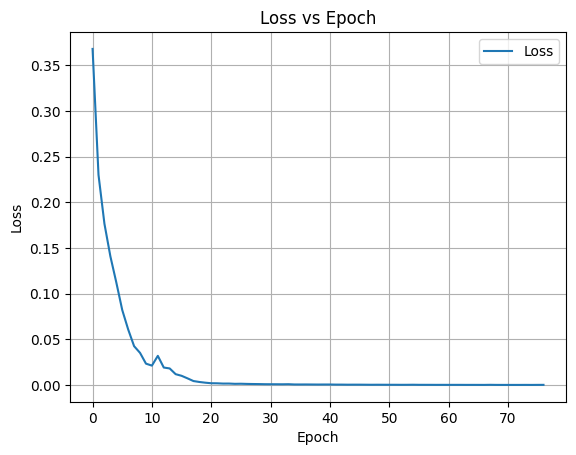

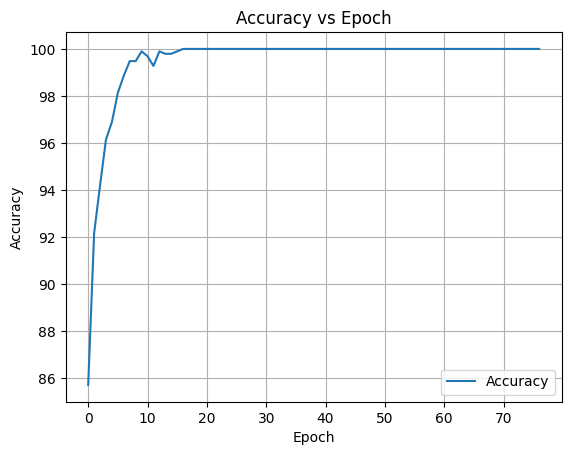

Train Threhold =  0.8016

Retraining Model in Progress...
Early stopping...


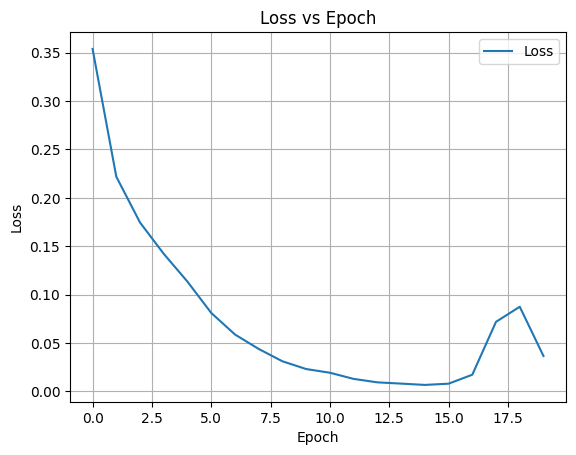

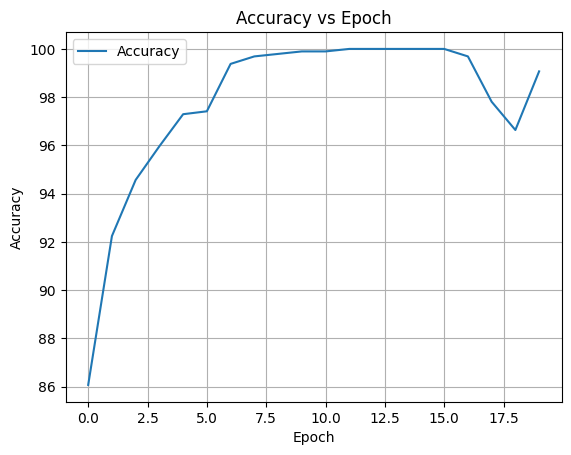

RT Threhold =  0.3568

Retraining Model in Progress...
Early stopping...


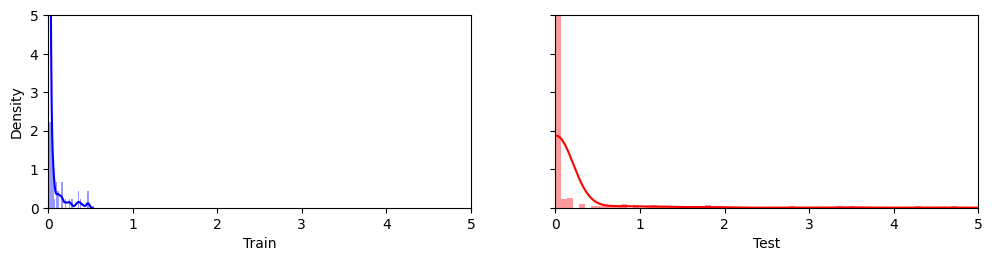

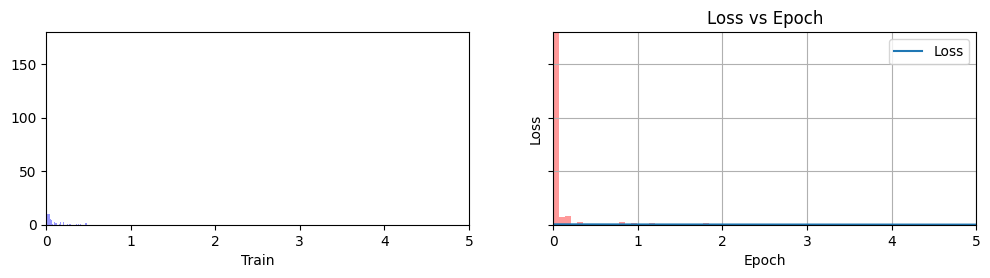

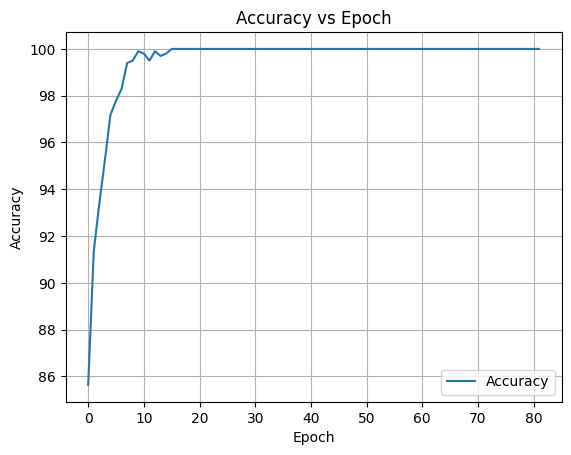

RT Threhold =  0.6724
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


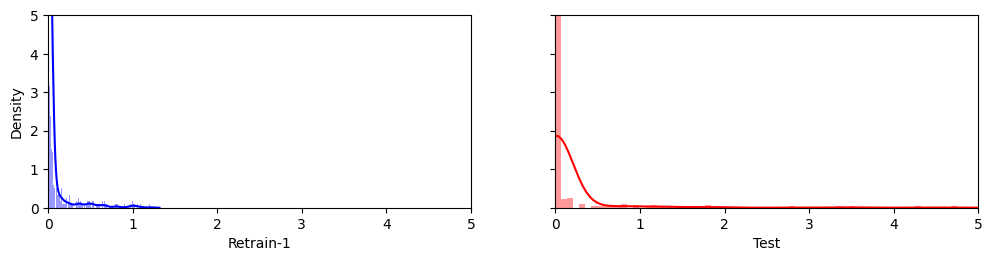

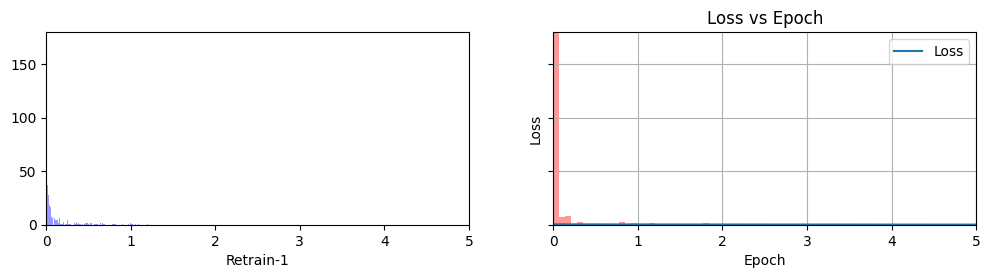

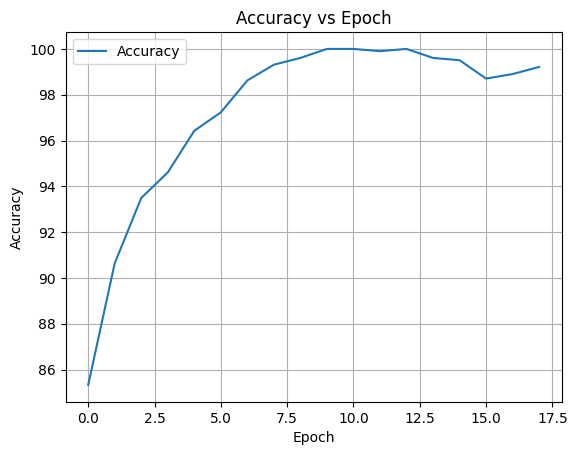

RT Threhold =  0.33

Retraining Model in Progress...
Early stopping...


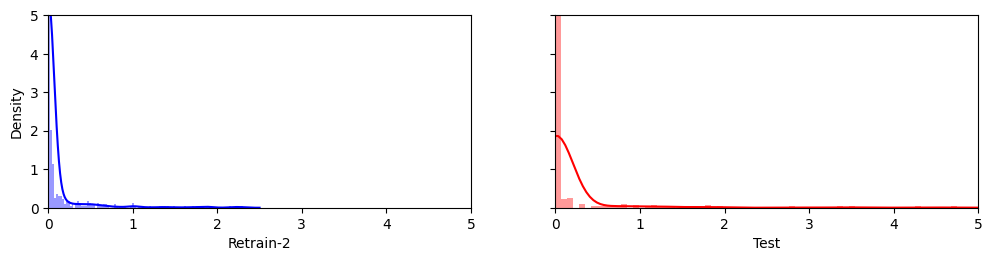

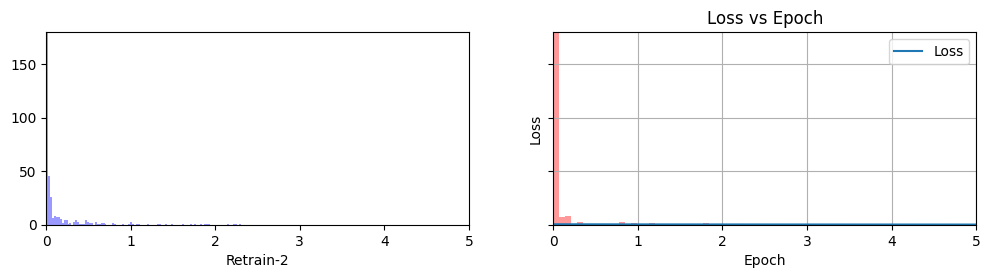

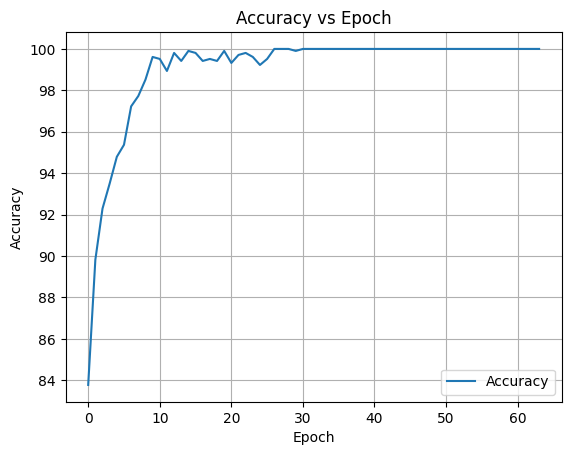

RT Threhold =  0.7995
2
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


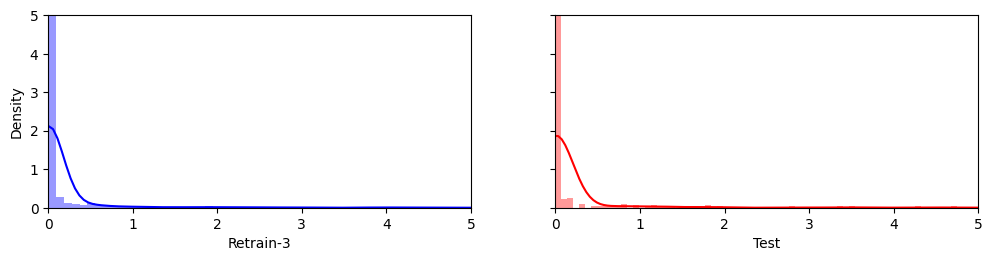

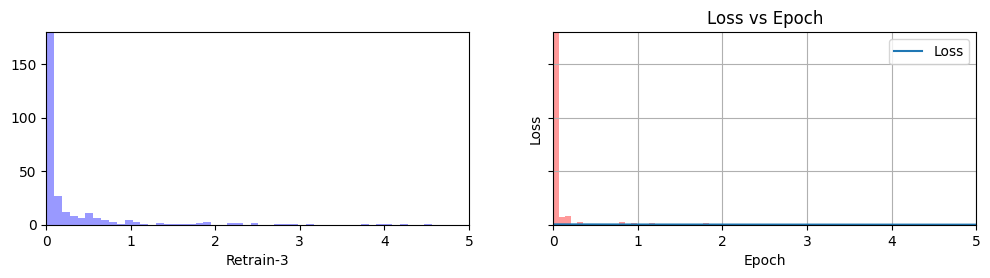

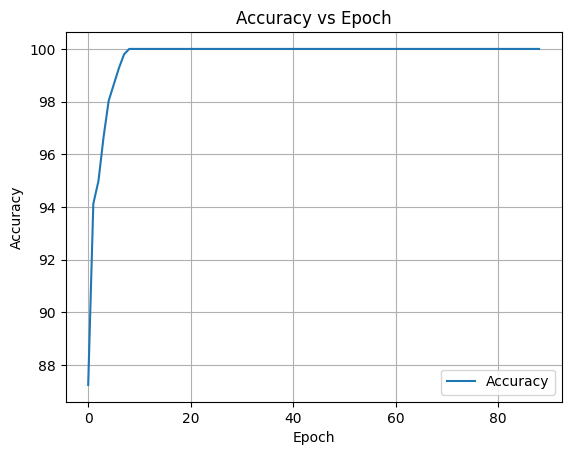

Train Threhold =  0.0981

Retraining Model in Progress...


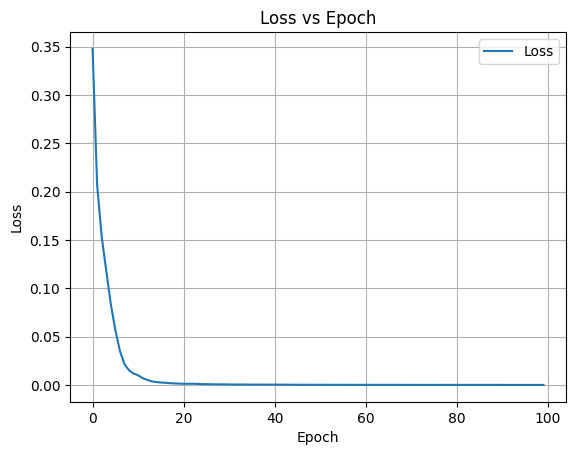

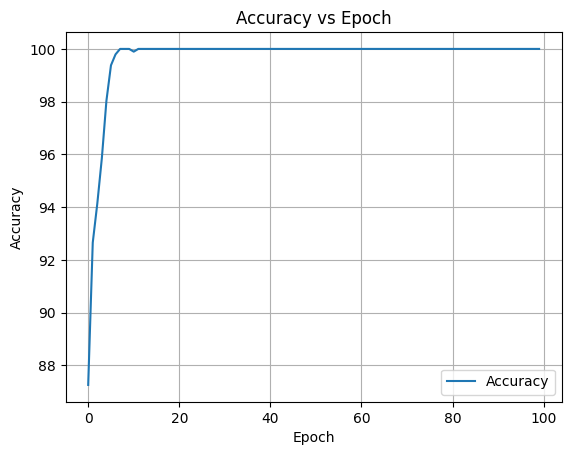

RT Threhold =  0.2086

Retraining Model in Progress...
Early stopping...


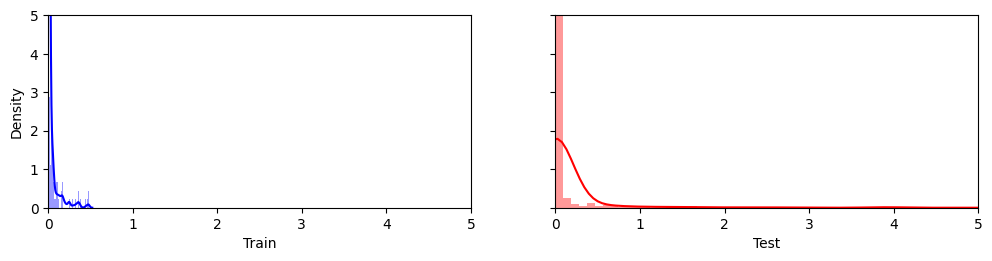

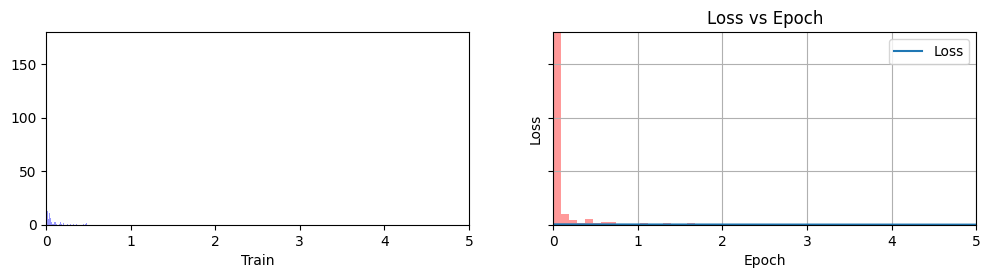

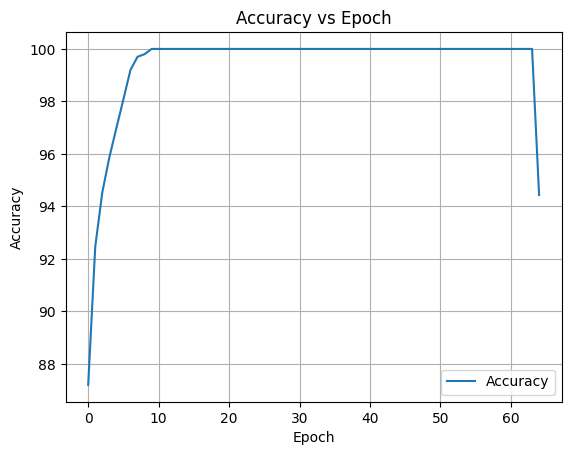

RT Threhold =  0.7932
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


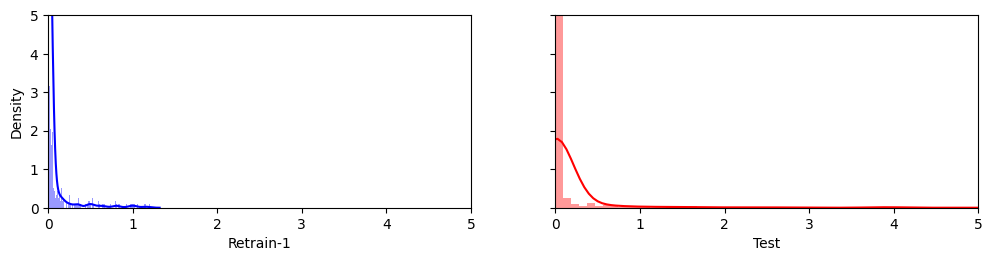

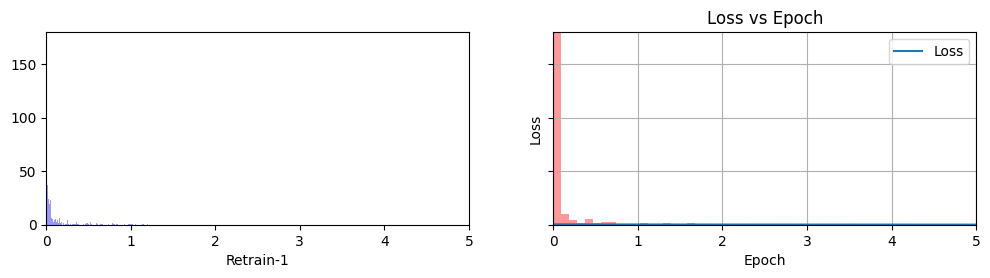

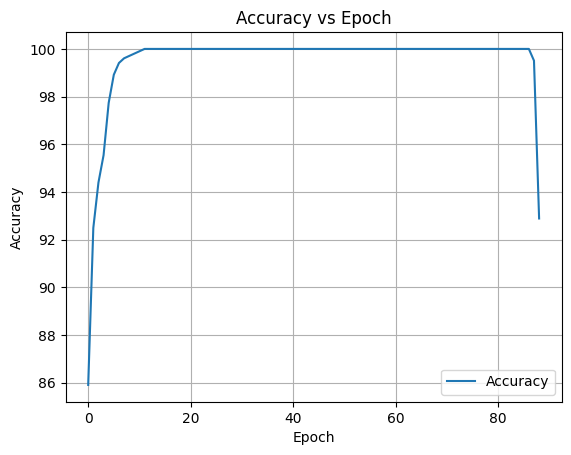

RT Threhold =  0.7405

Retraining Model in Progress...
Early stopping...


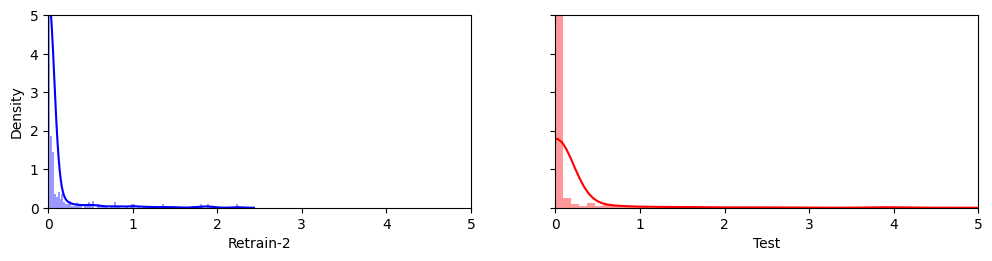

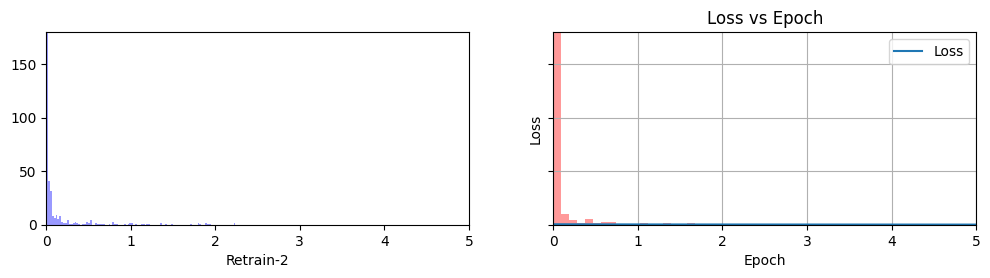

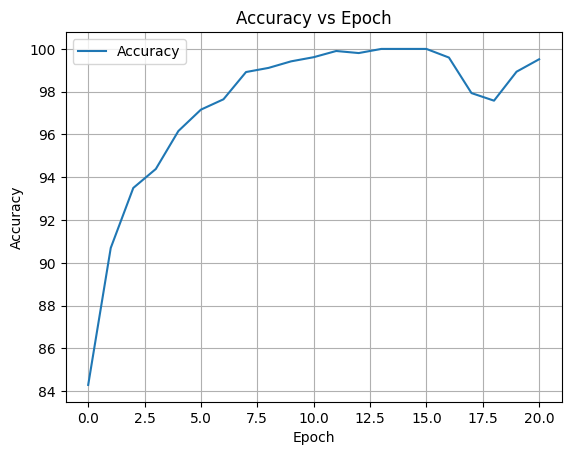

RT Threhold =  0.3215
3
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...


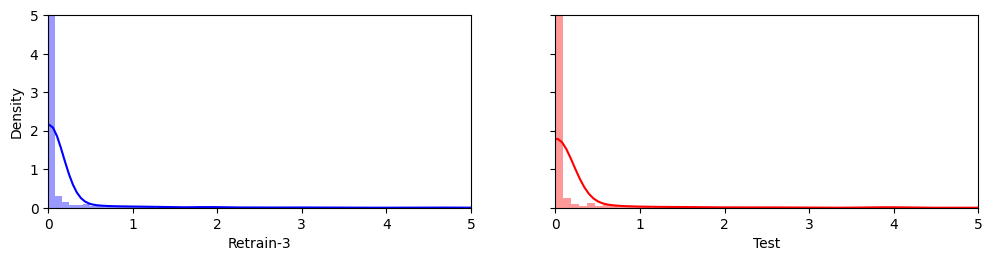

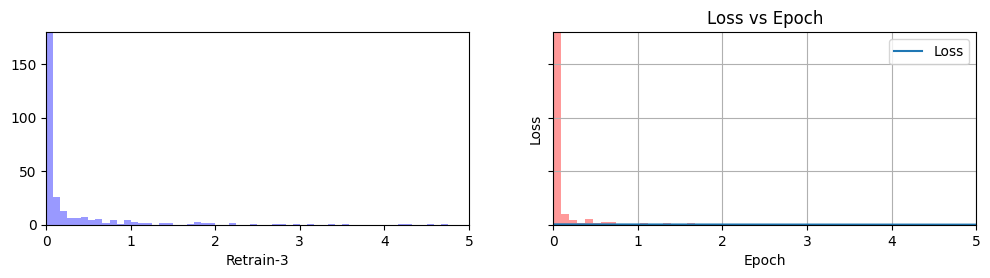

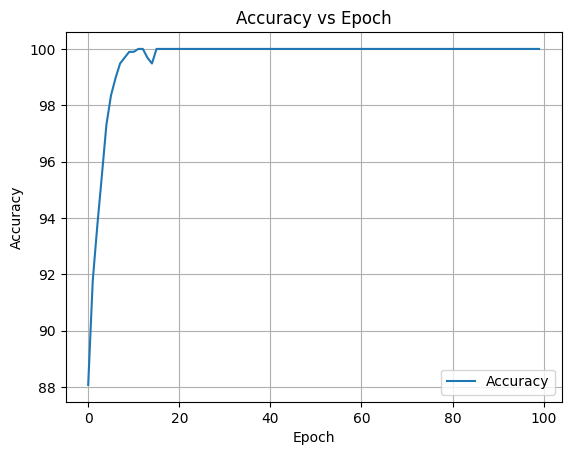

Train Threhold =  0.1319

Retraining Model in Progress...
Early stopping...


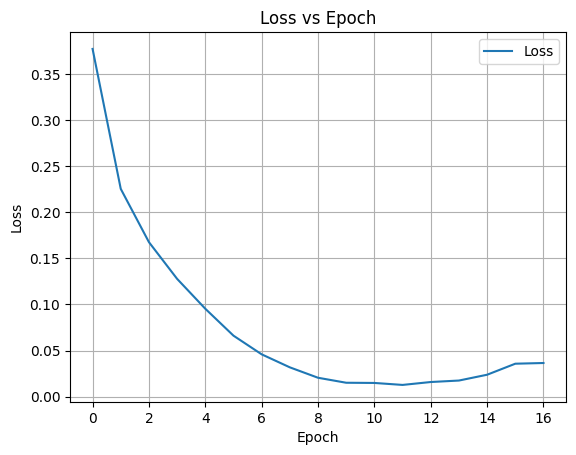

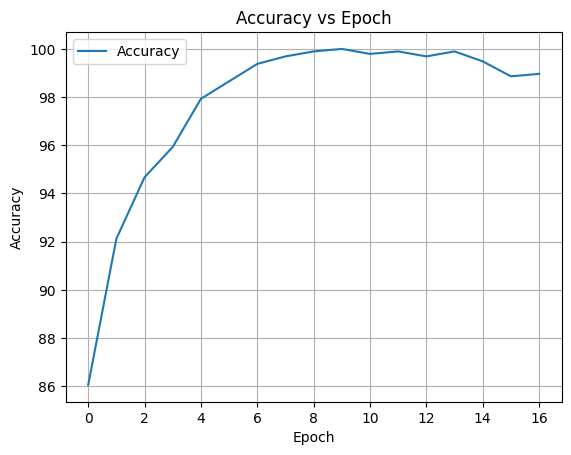

RT Threhold =  0.7723

Retraining Model in Progress...
Early stopping...


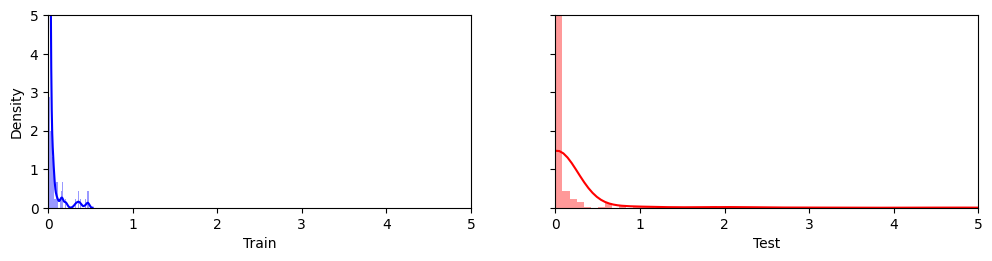

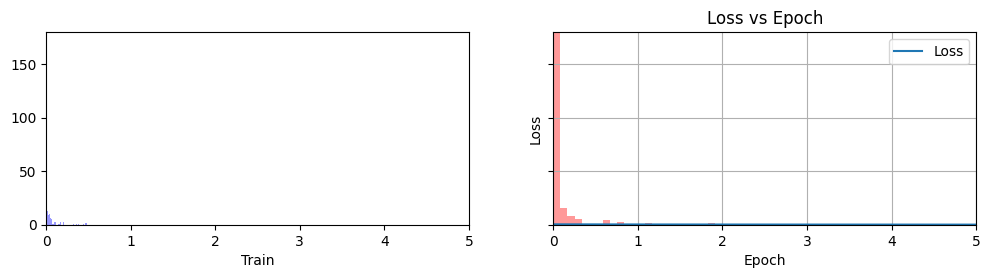

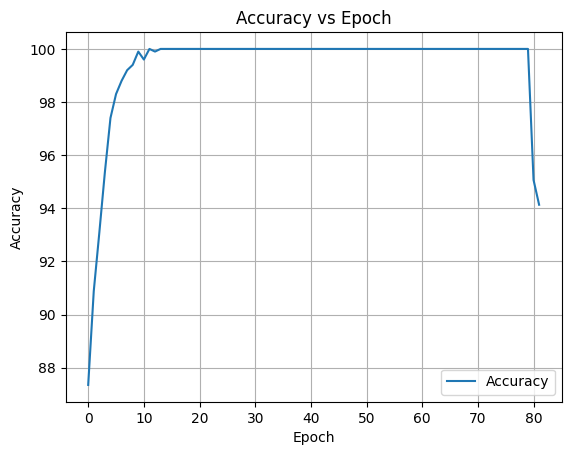

RT Threhold =  0.5714
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...


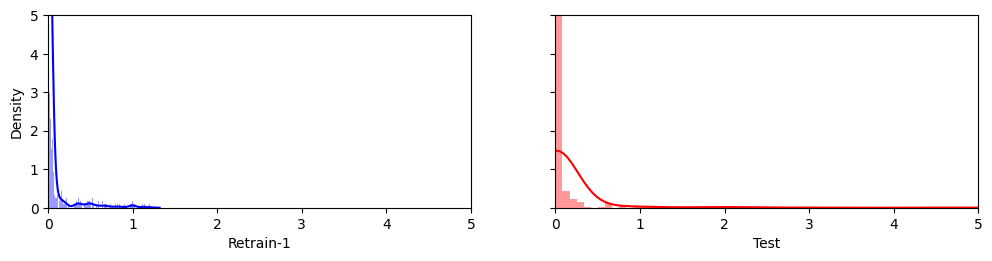

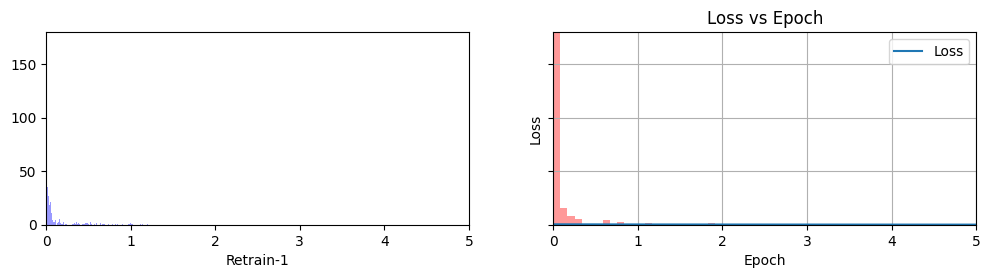

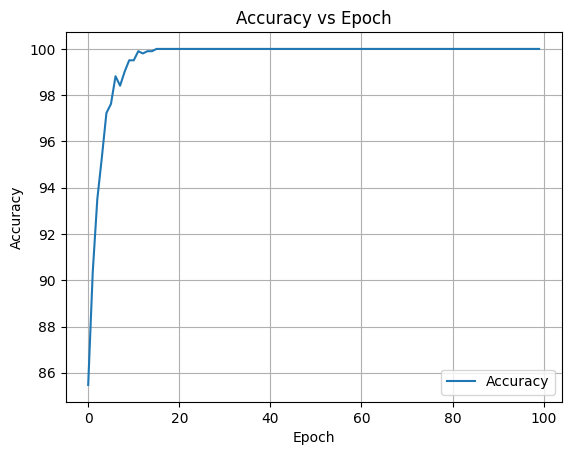

RT Threhold =  0.573

Retraining Model in Progress...
Early stopping...


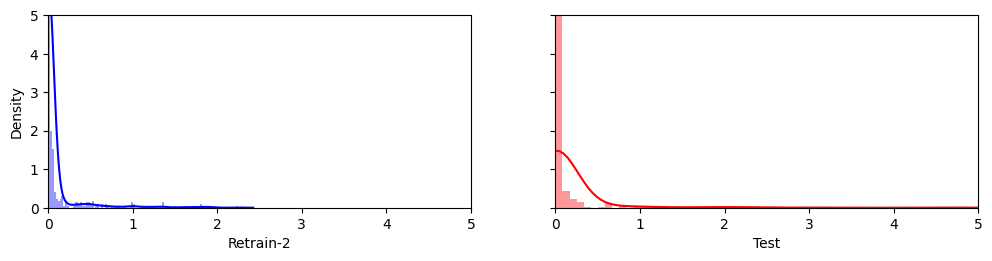

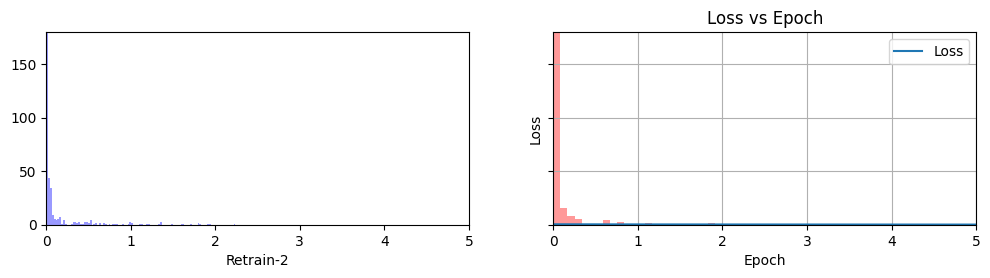

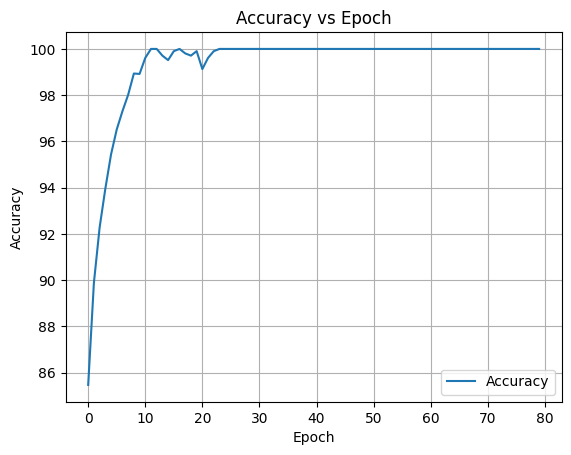

RT Threhold =  0.5362
4
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


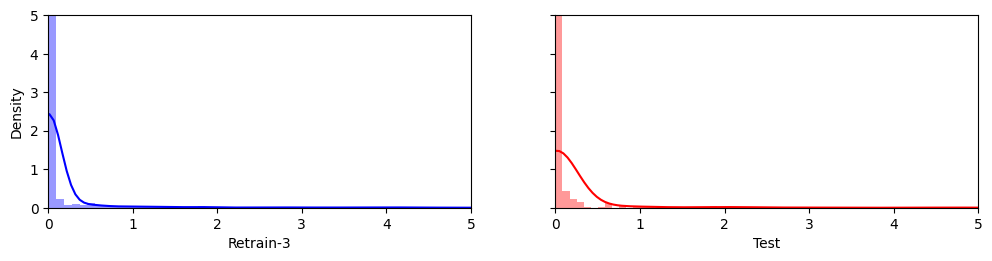

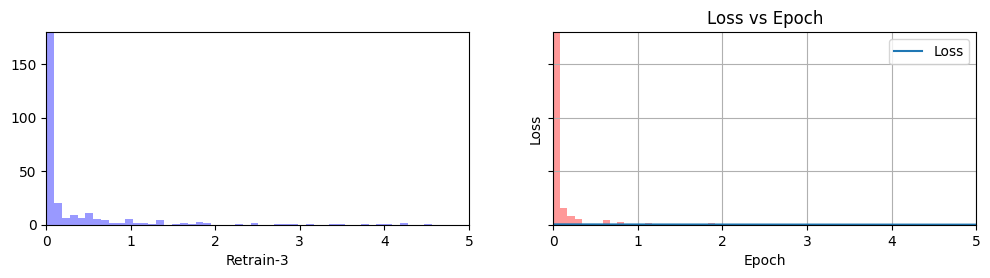

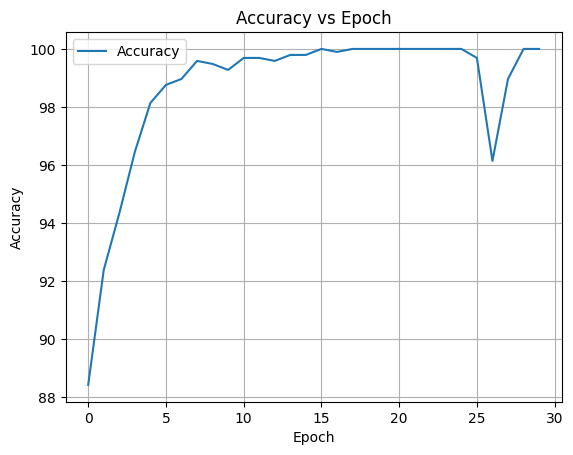

Train Threhold =  0.4437

Retraining Model in Progress...
Early stopping...


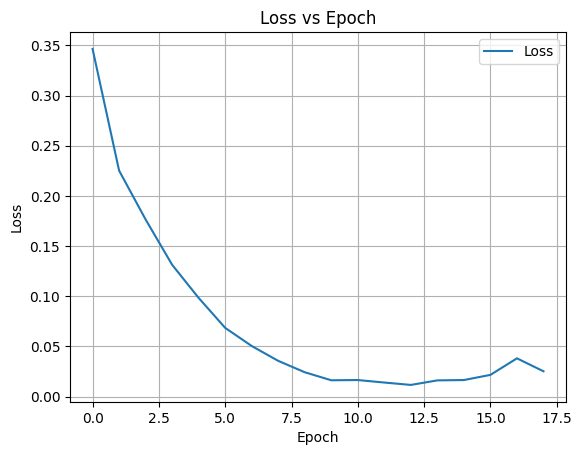

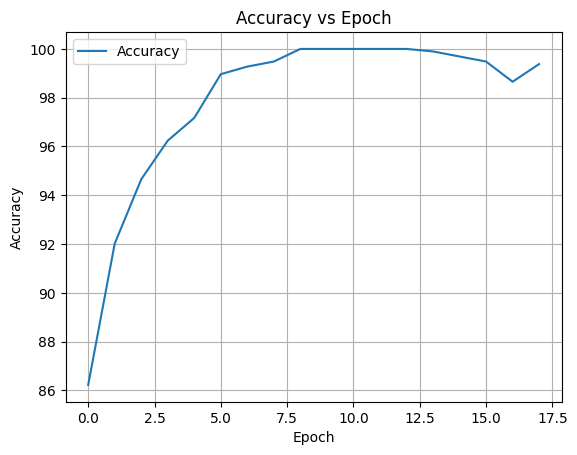

RT Threhold =  0.6376

Retraining Model in Progress...
Early stopping...


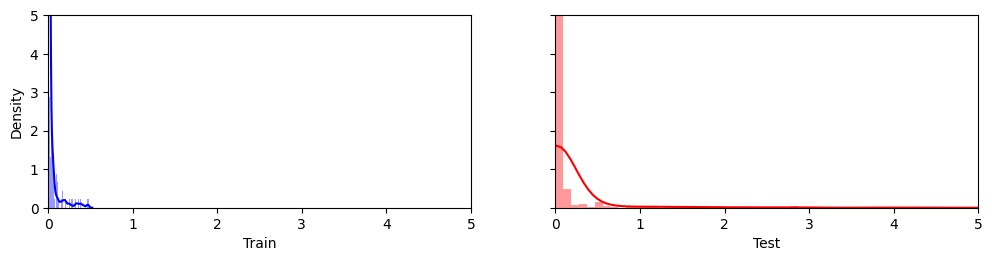

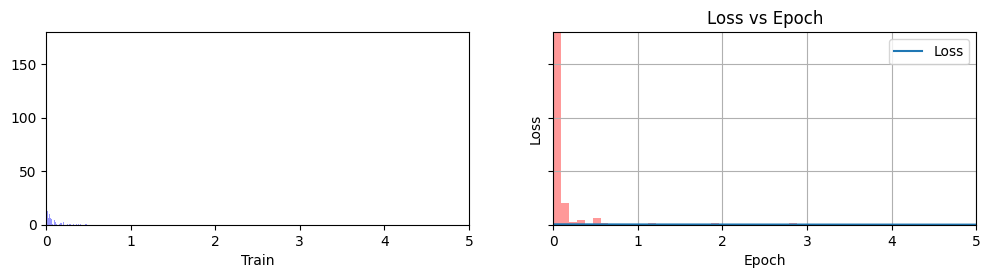

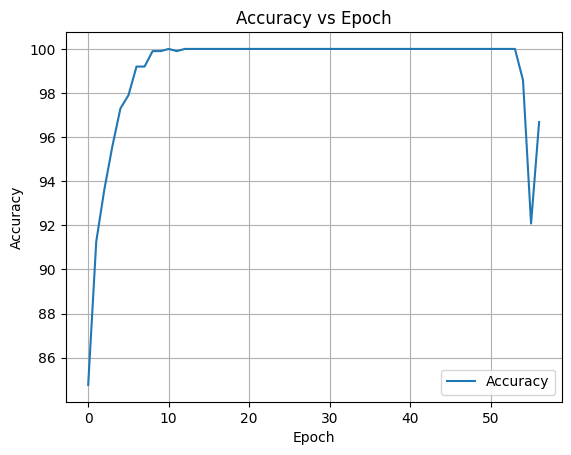

RT Threhold =  0.5604
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


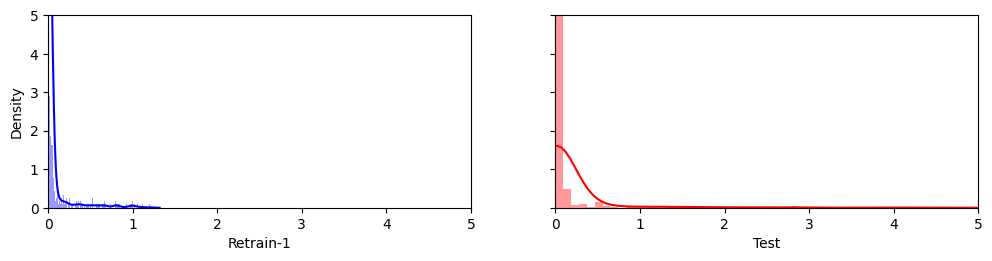

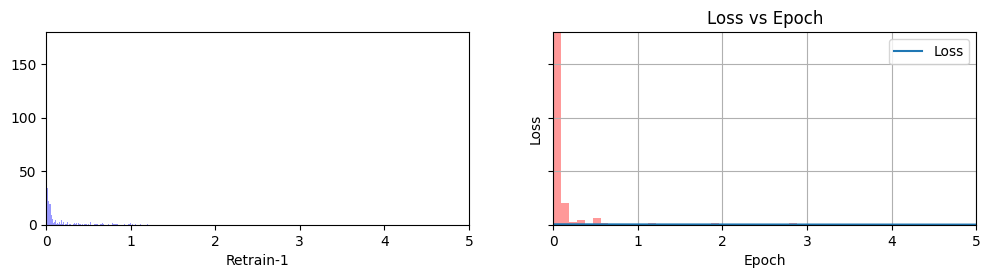

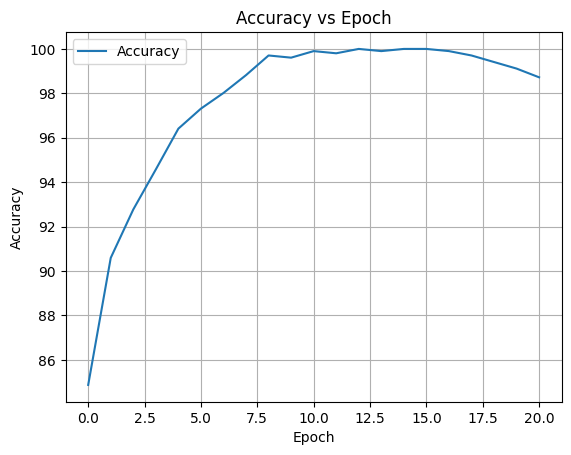

RT Threhold =  0.506

Retraining Model in Progress...
Early stopping...


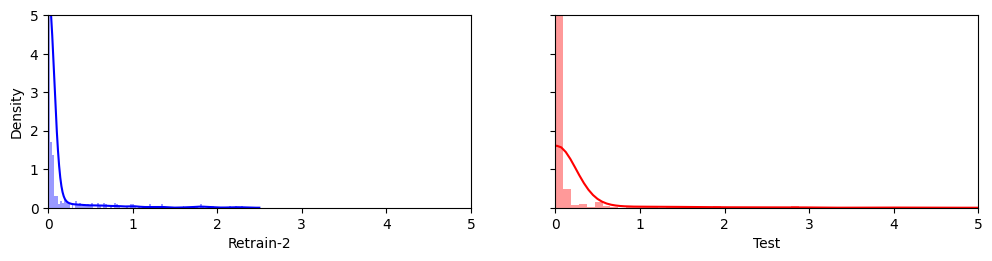

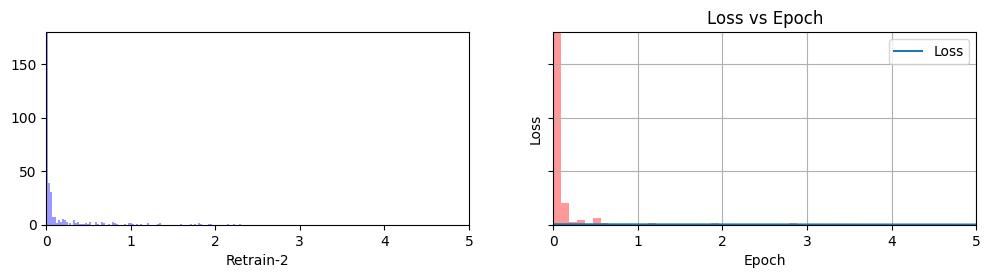

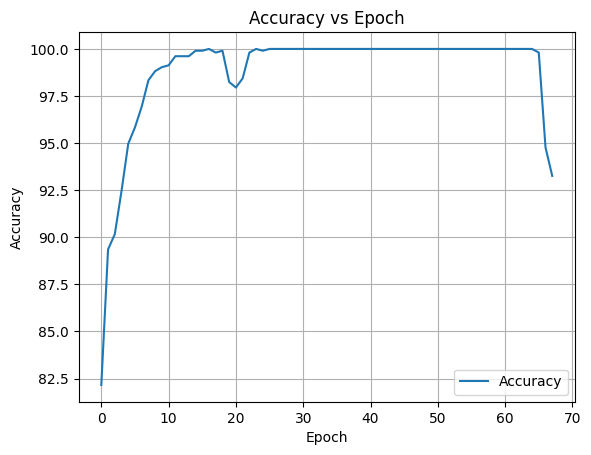

RT Threhold =  0.5215
5
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


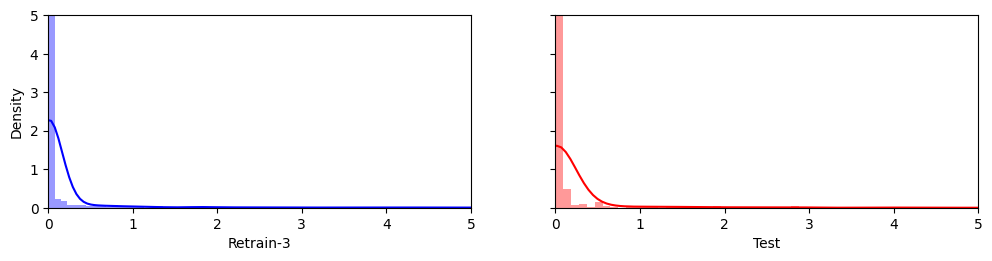

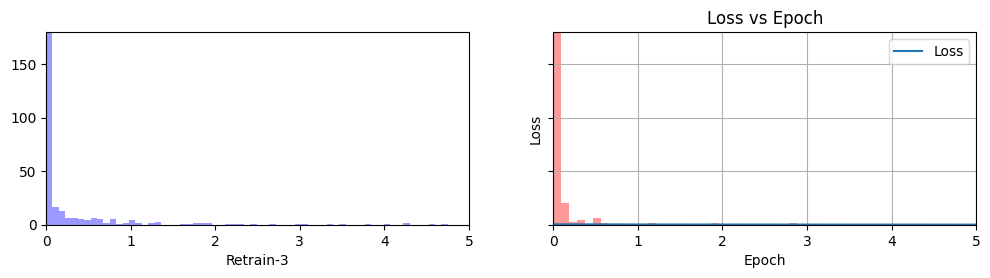

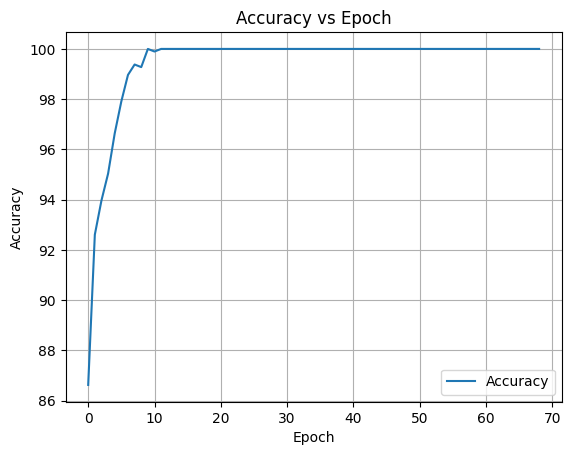

Train Threhold =  0.0856

Retraining Model in Progress...
Early stopping...


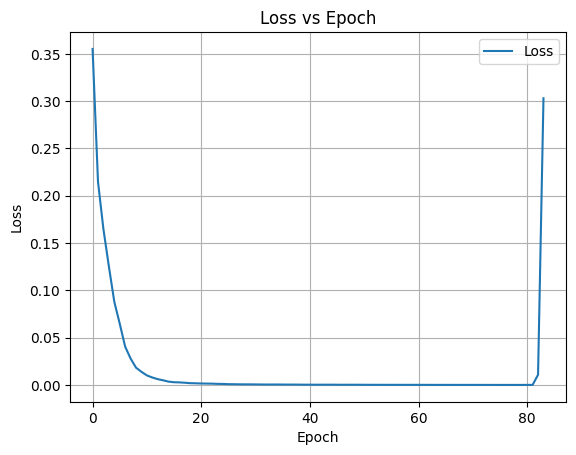

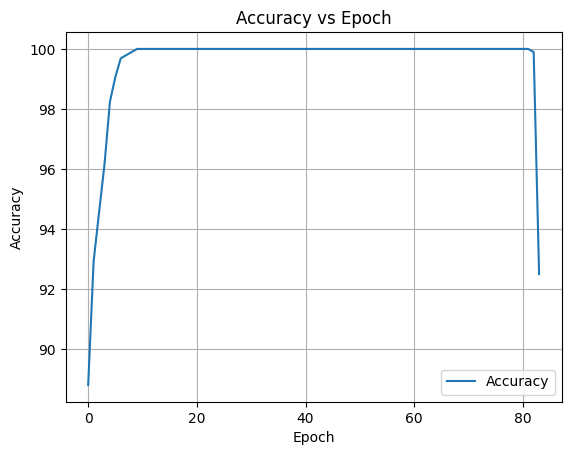

RT Threhold =  0.544

Retraining Model in Progress...
Early stopping...


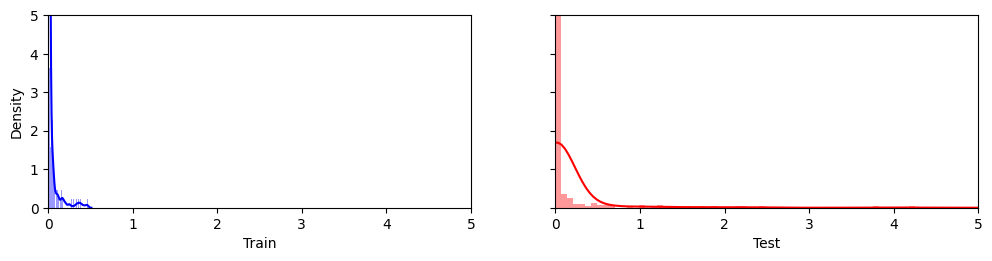

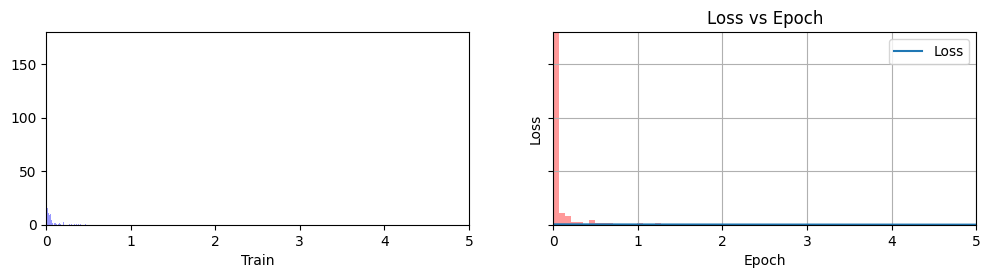

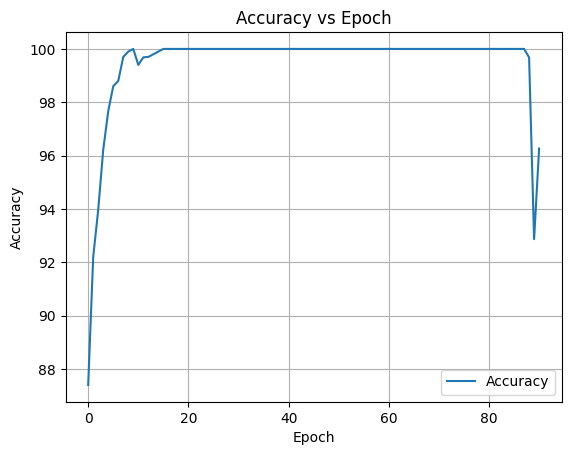

RT Threhold =  0.3881
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


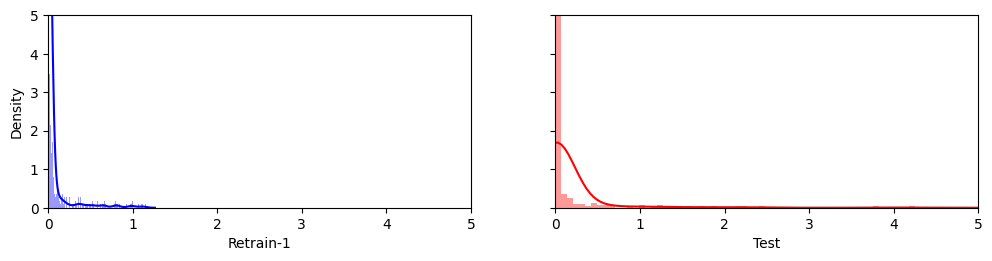

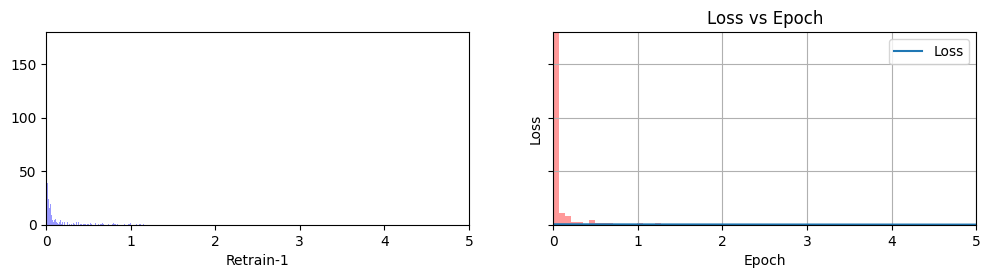

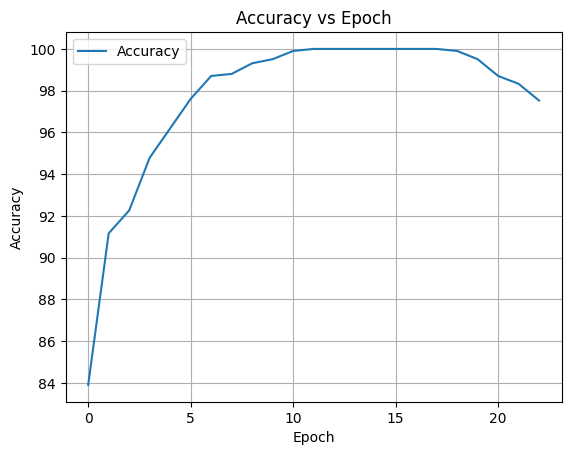

RT Threhold =  0.2516

Retraining Model in Progress...
Early stopping...


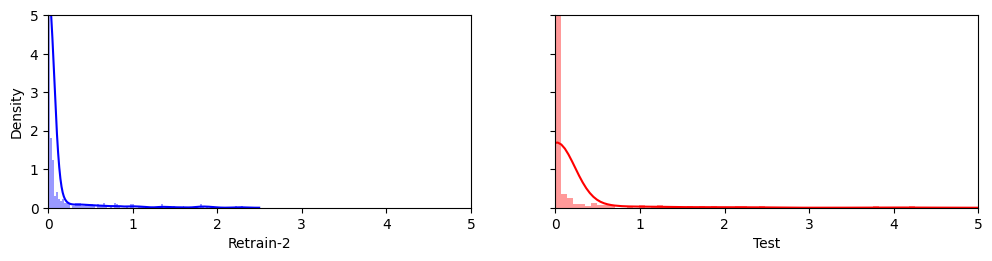

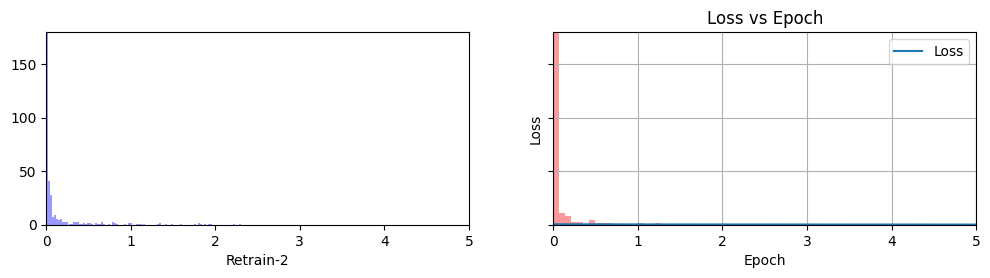

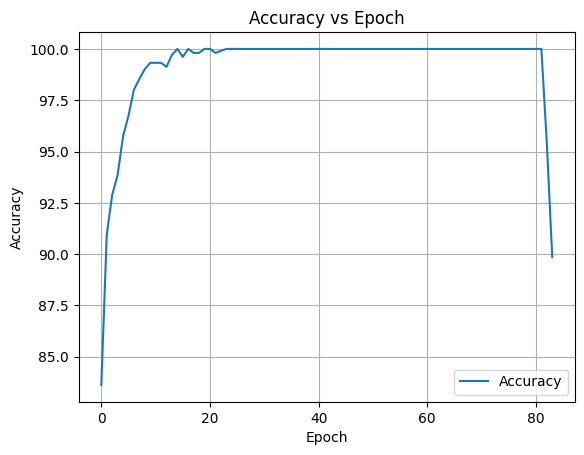

RT Threhold =  0.5437
6
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...


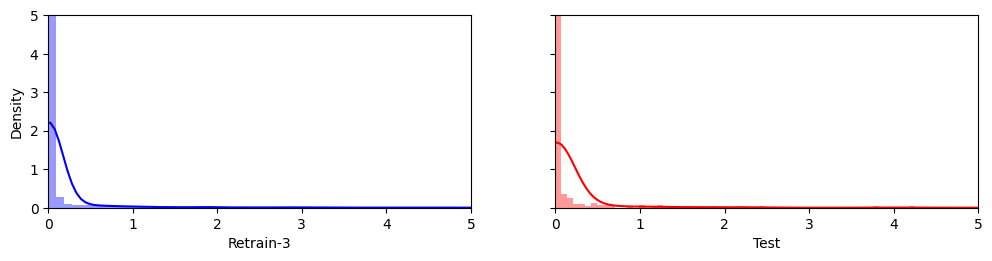

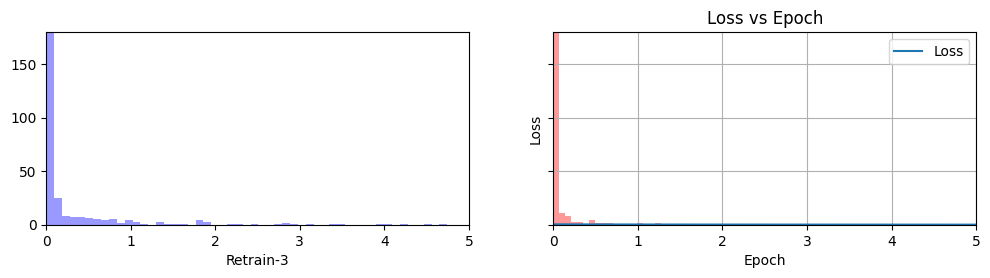

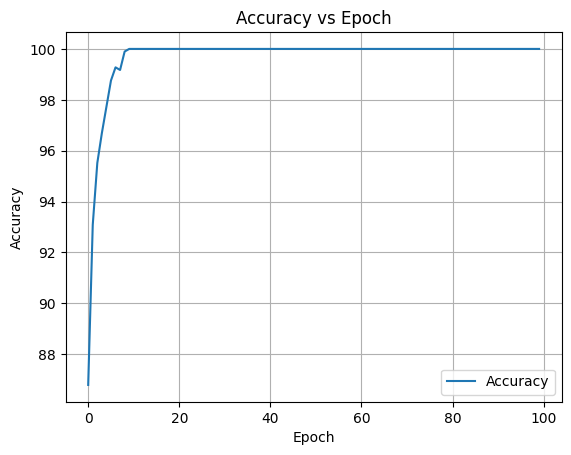

Train Threhold =  0.7344

Retraining Model in Progress...
Early stopping...


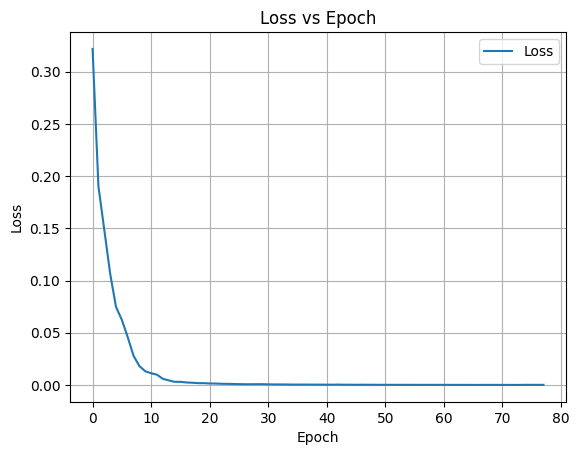

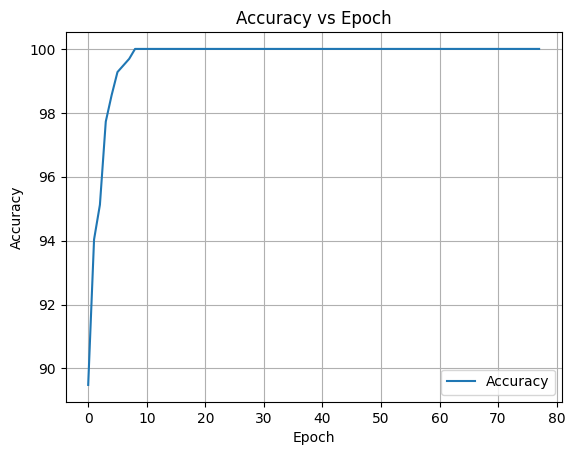

RT Threhold =  0.7097

Retraining Model in Progress...
Early stopping...


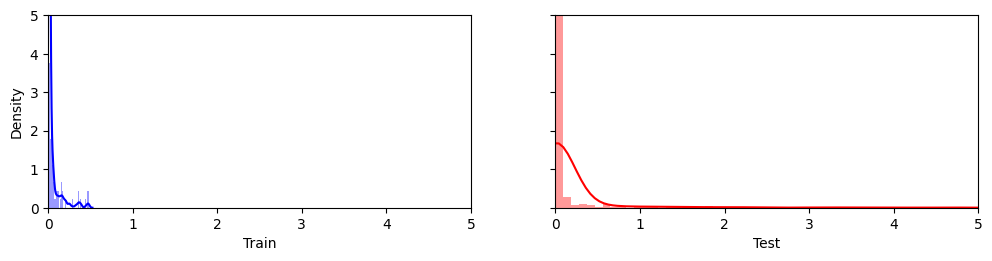

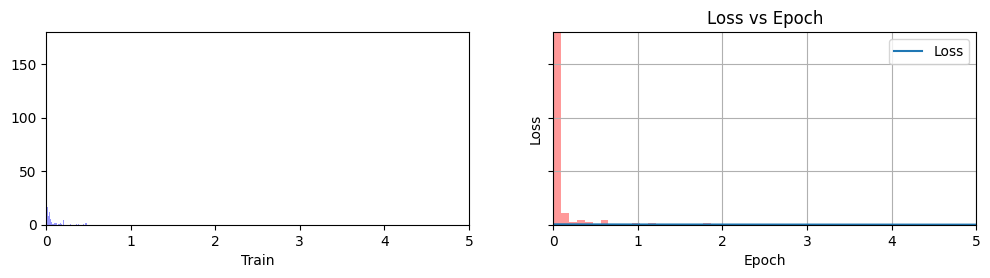

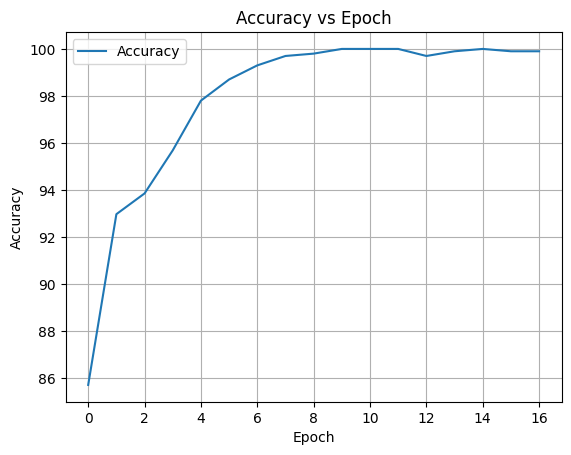

RT Threhold =  0.4237
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...


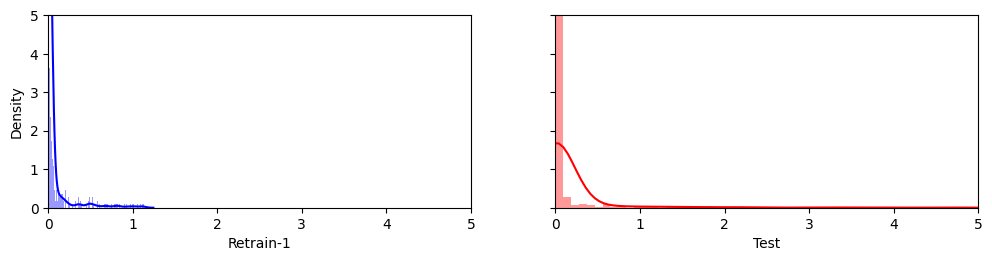

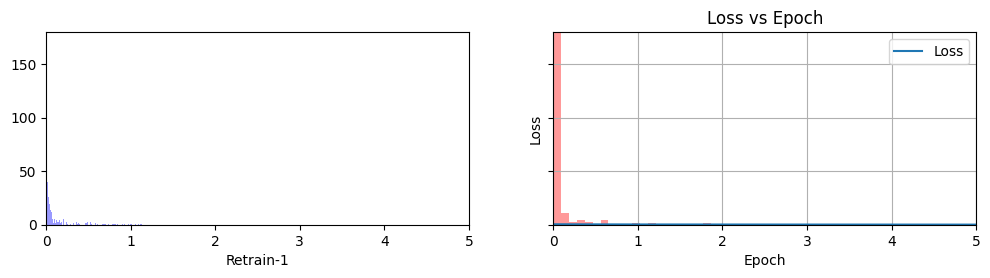

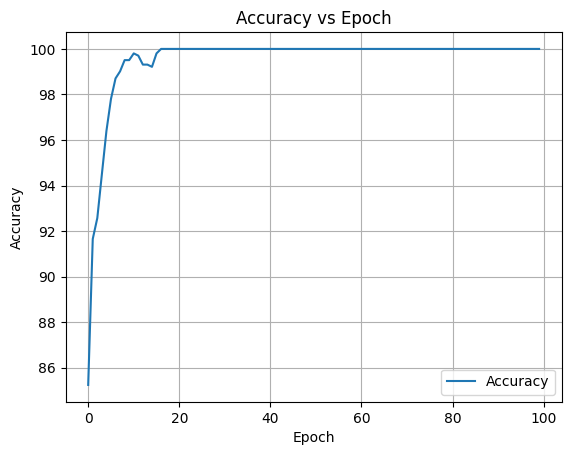

RT Threhold =  0.236

Retraining Model in Progress...


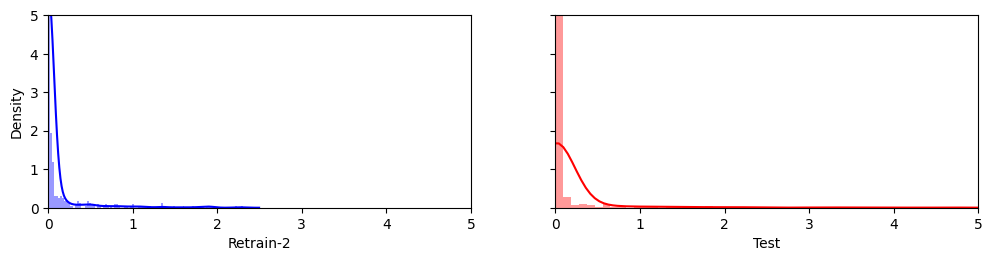

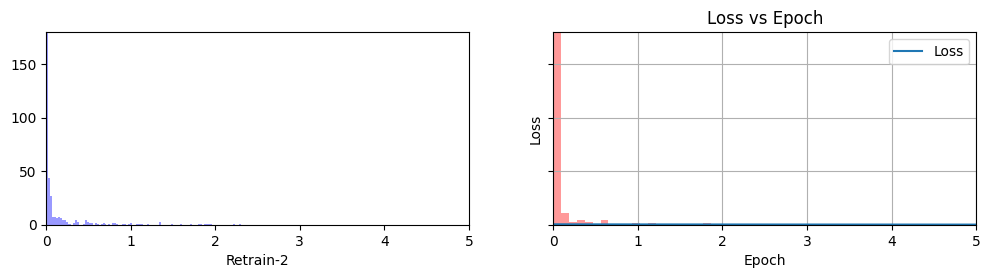

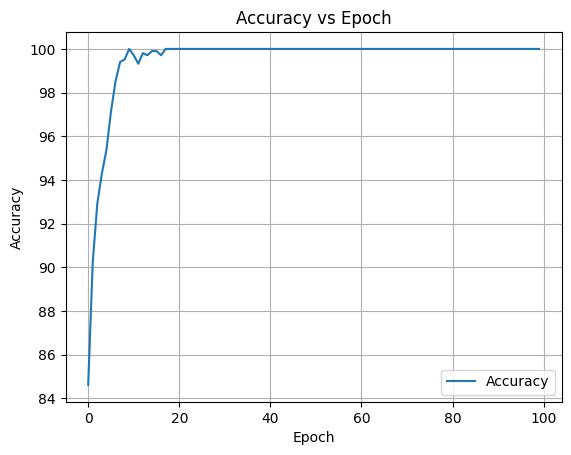

RT Threhold =  0.4446
7
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


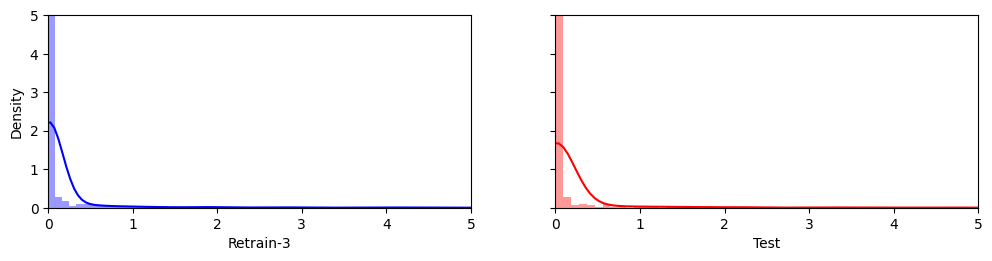

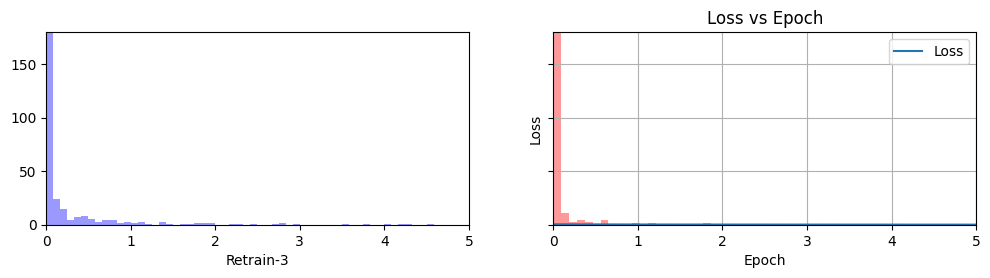

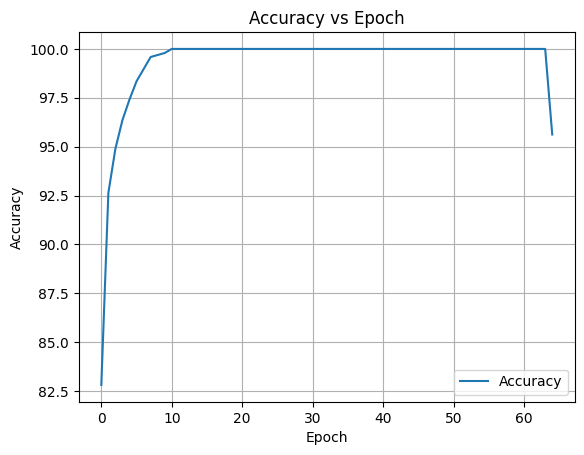

Train Threhold =  0.298

Retraining Model in Progress...
Early stopping...


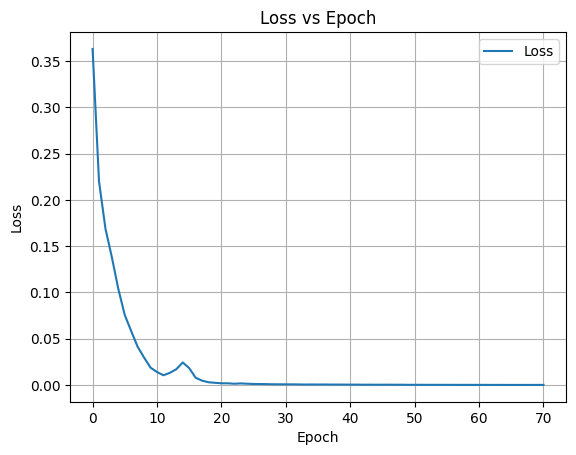

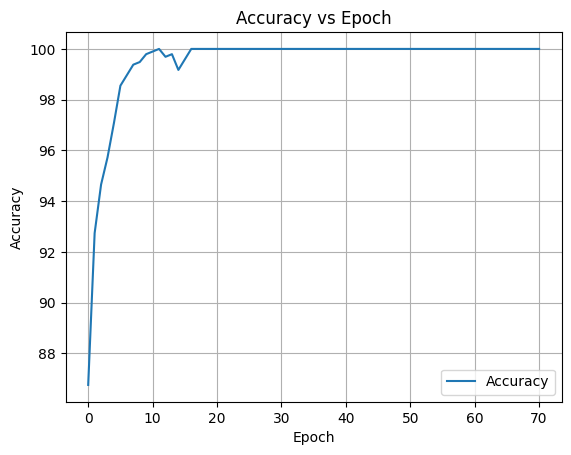

RT Threhold =  0.2489

Retraining Model in Progress...
Early stopping...


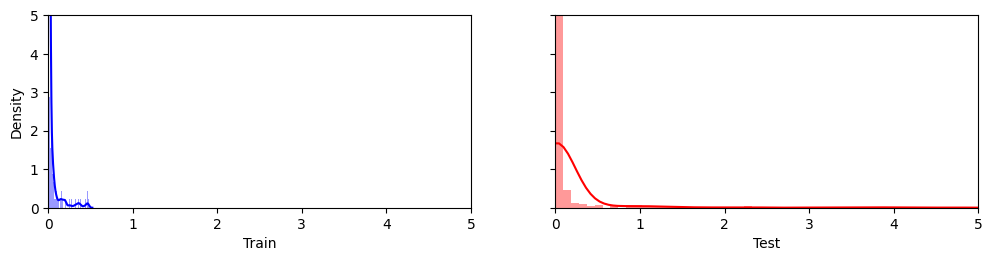

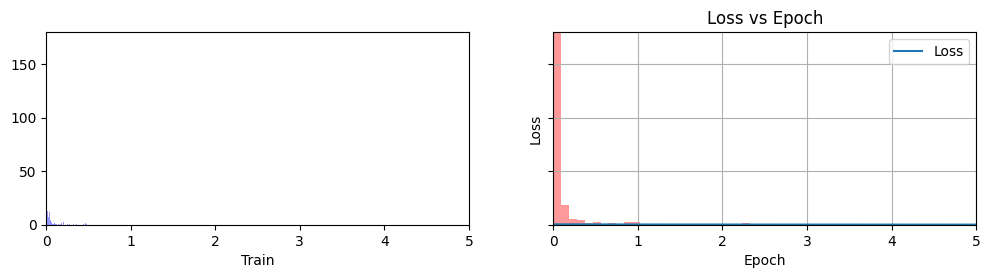

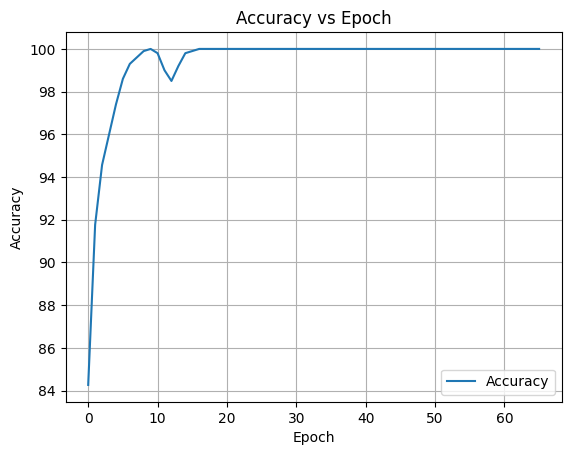

RT Threhold =  0.1029
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


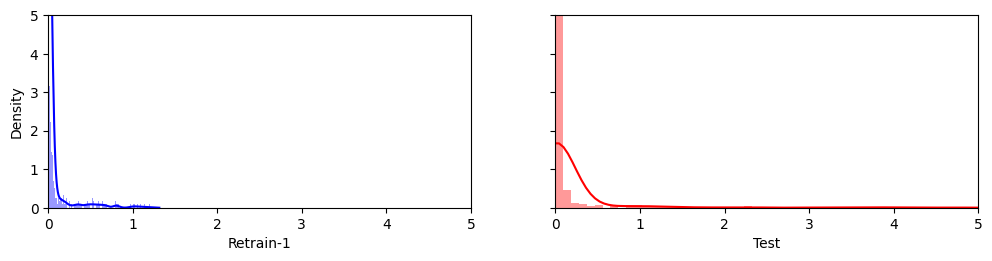

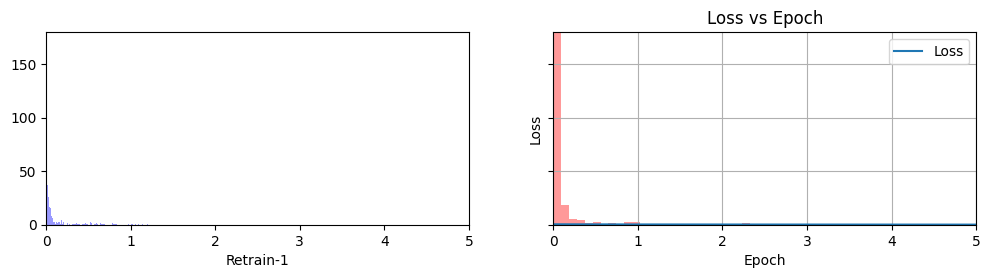

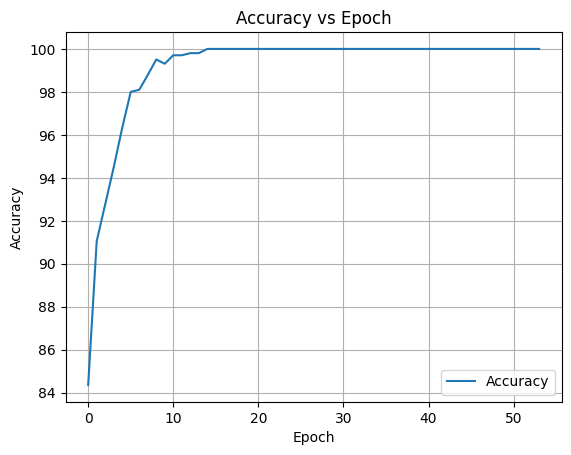

RT Threhold =  0.2202

Retraining Model in Progress...
Early stopping...


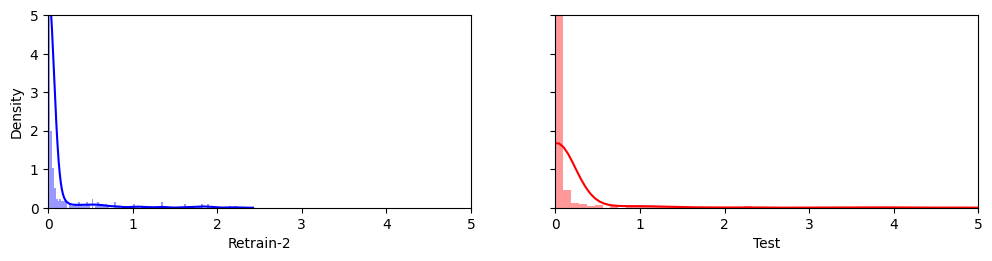

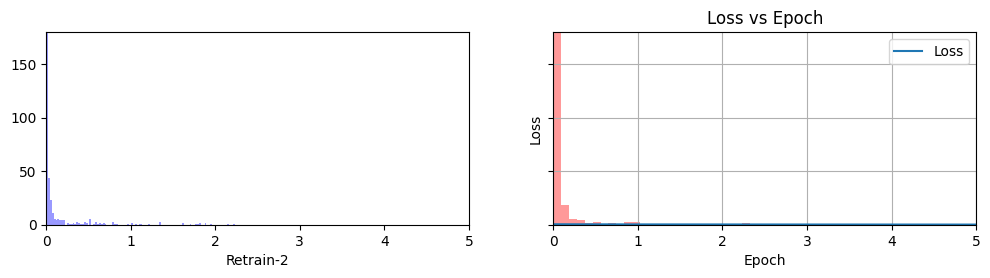

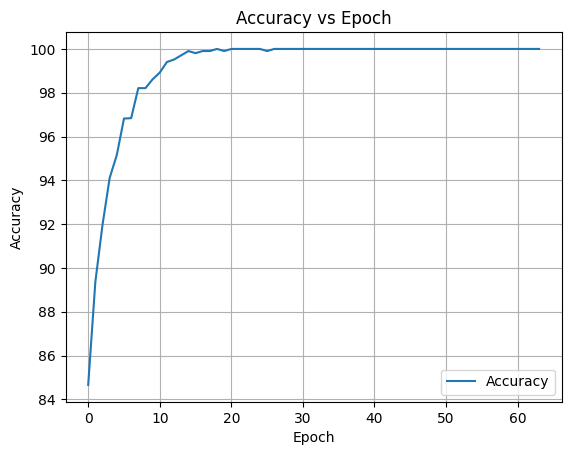

RT Threhold =  0.1732
8
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


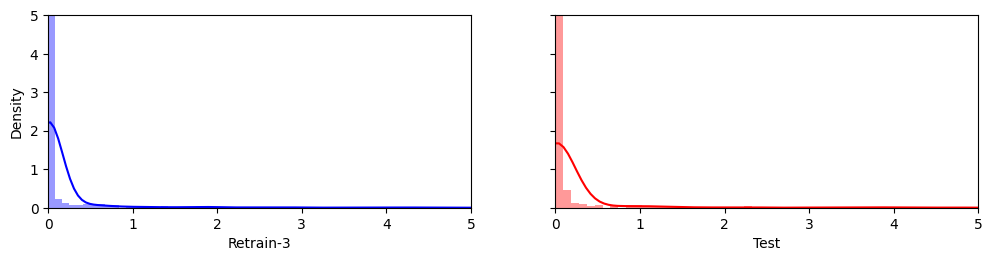

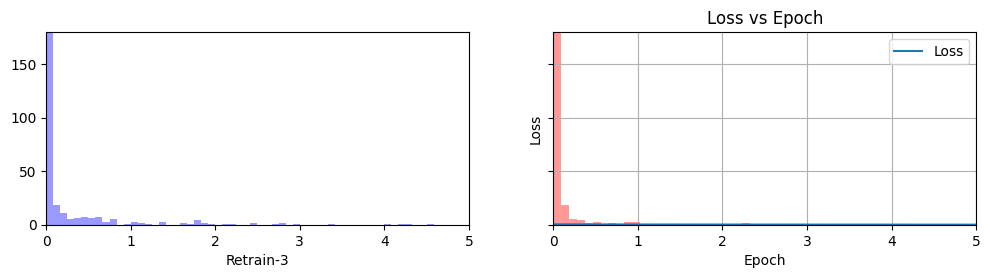

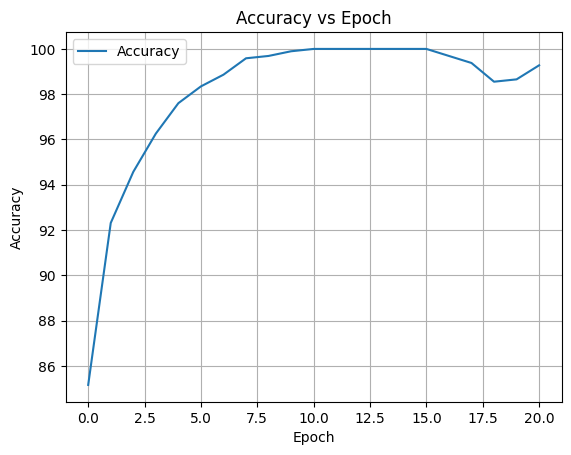

Train Threhold =  0.6908

Retraining Model in Progress...
Early stopping...


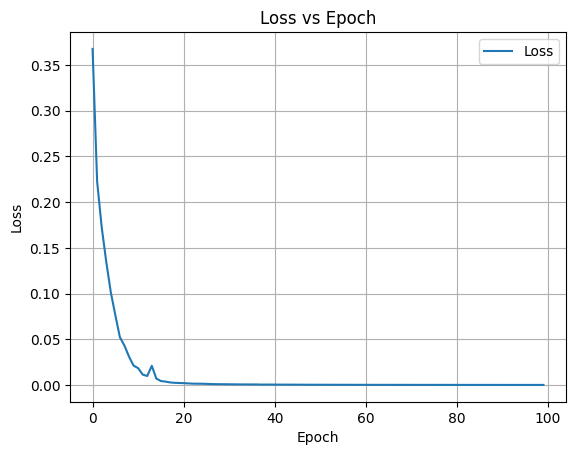

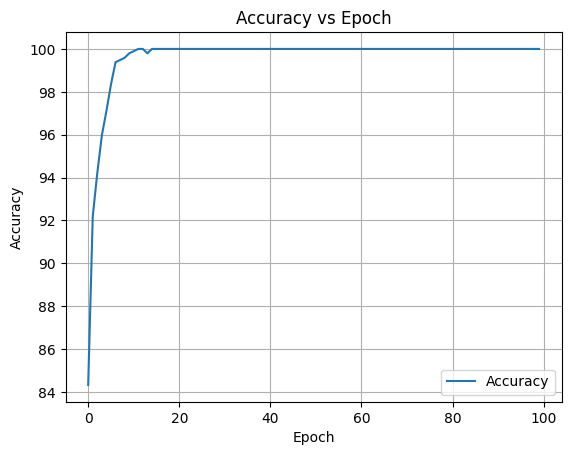

RT Threhold =  0.0599

Retraining Model in Progress...
Early stopping...


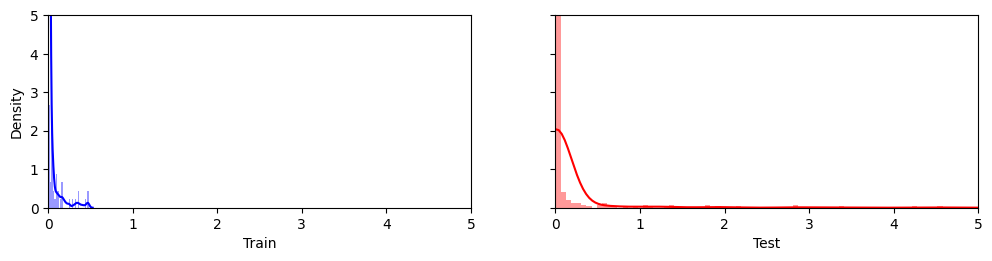

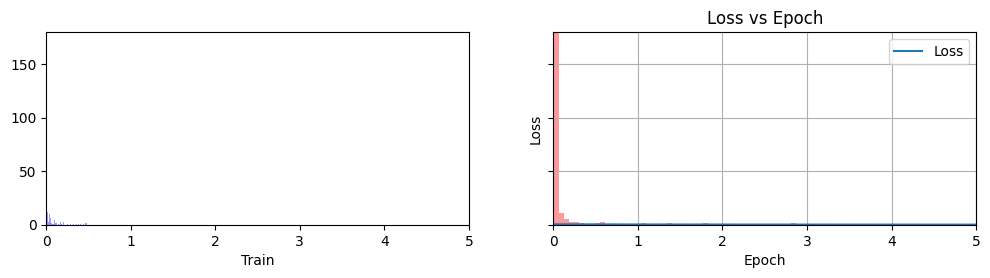

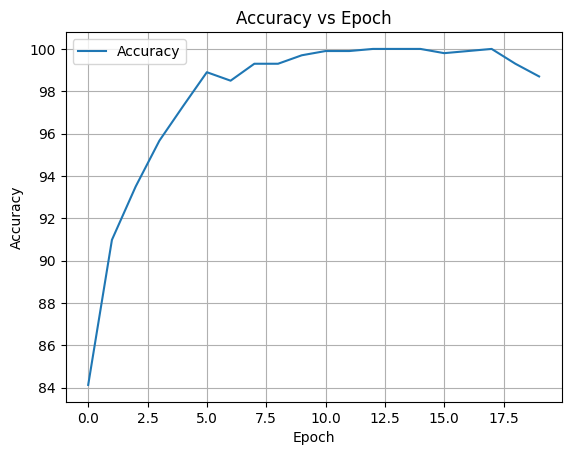

RT Threhold =  0.6267
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


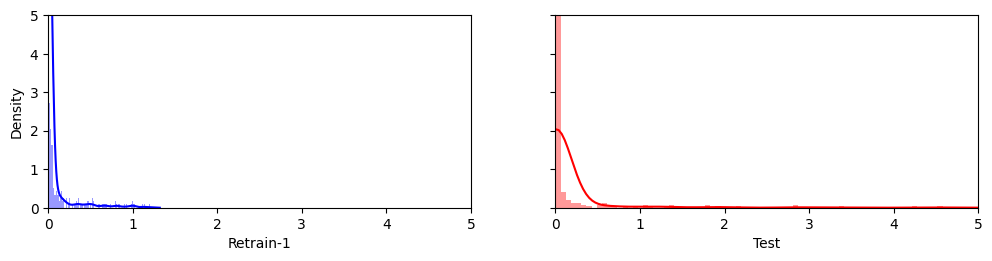

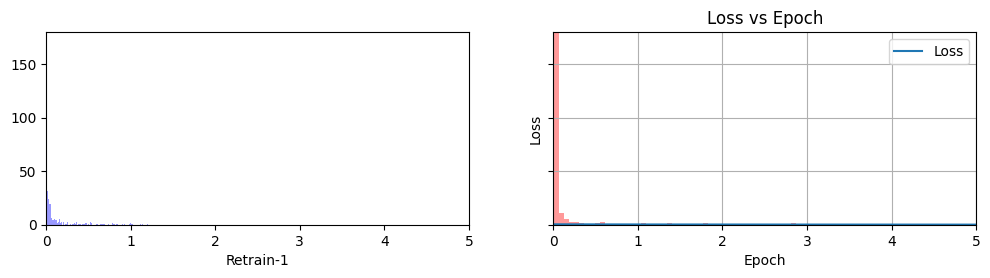

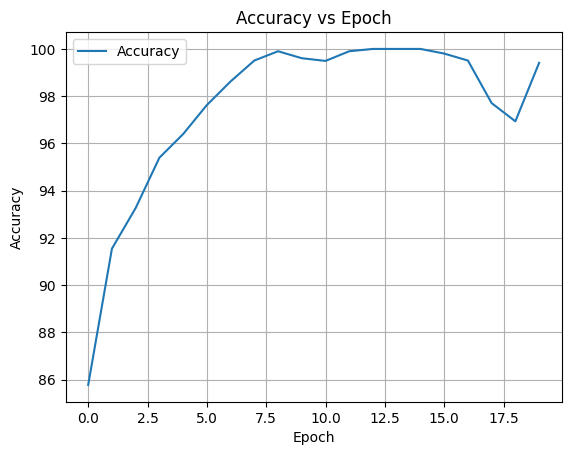

RT Threhold =  0.4891

Retraining Model in Progress...
Early stopping...


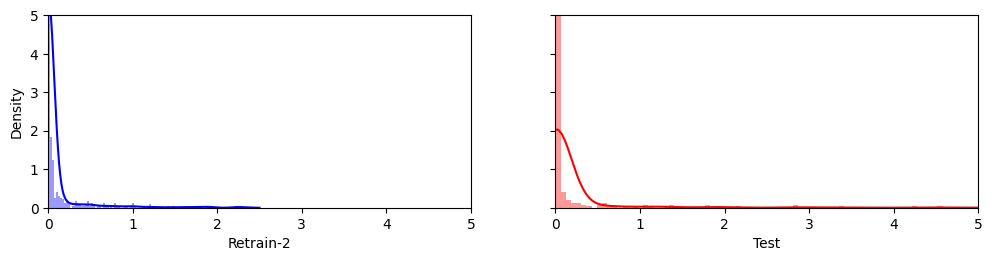

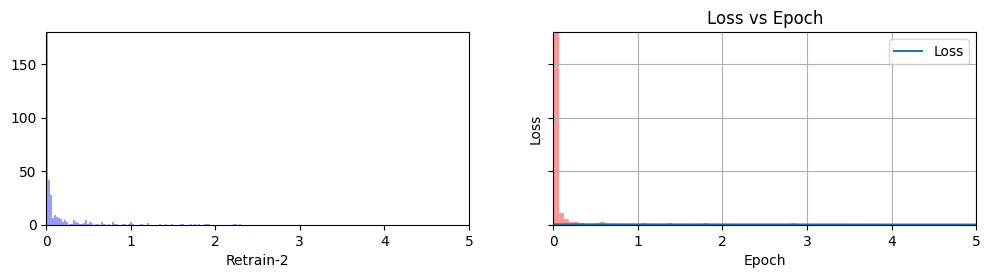

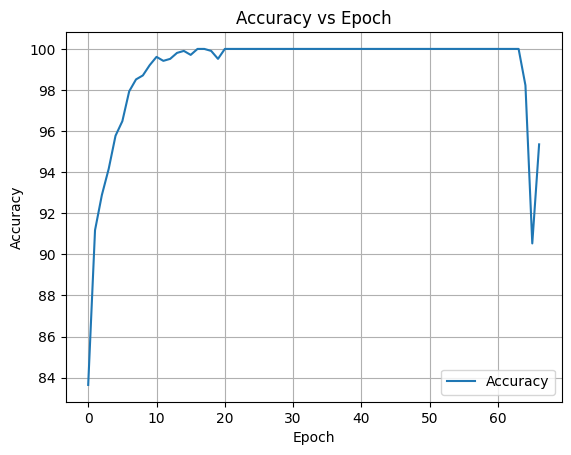

RT Threhold =  0.5906
9
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...


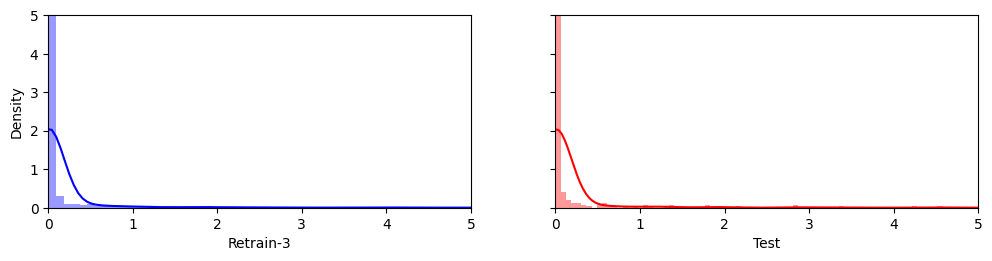

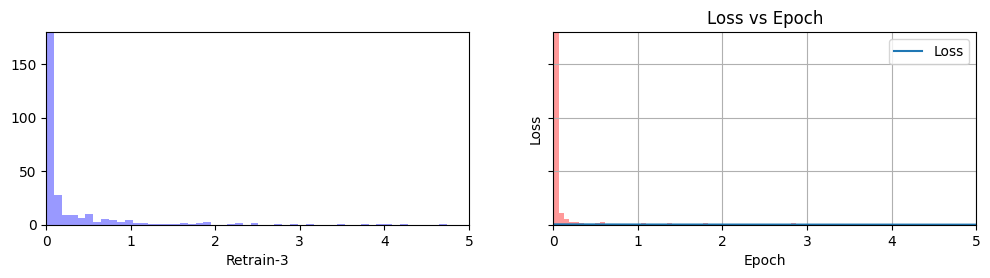

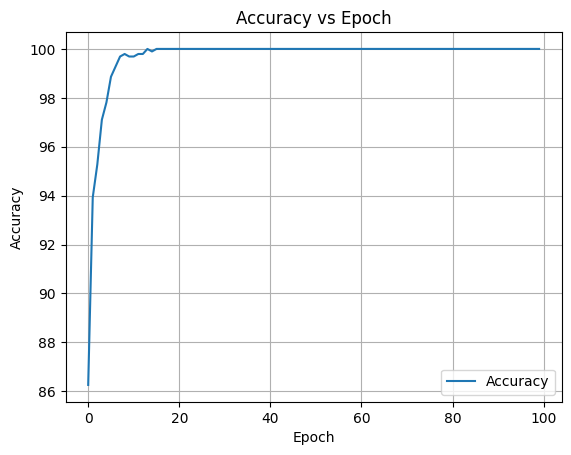

Train Threhold =  0.8038

Retraining Model in Progress...
Early stopping...


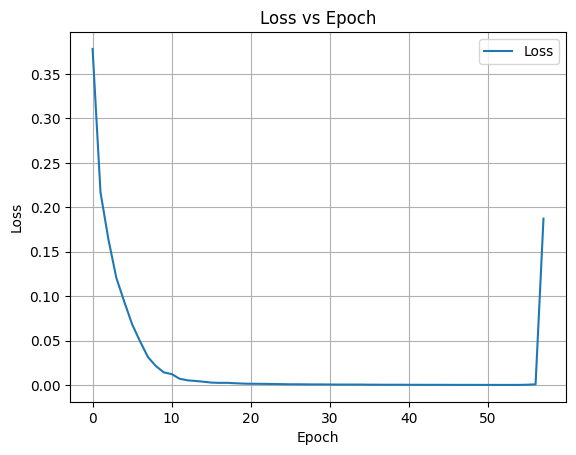

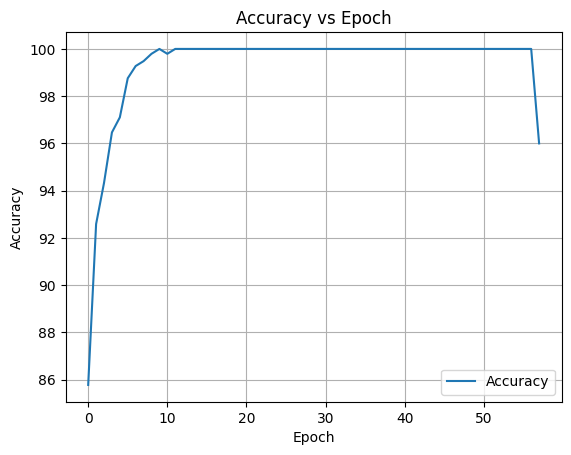

RT Threhold =  0.6292

Retraining Model in Progress...
Early stopping...


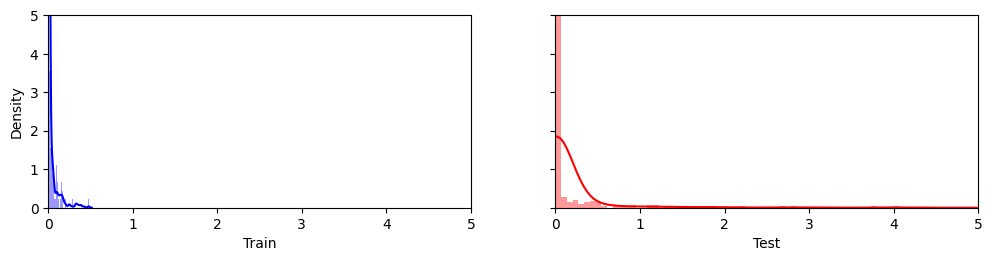

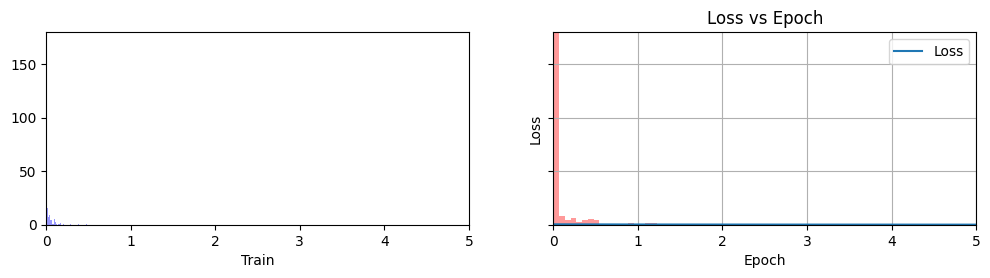

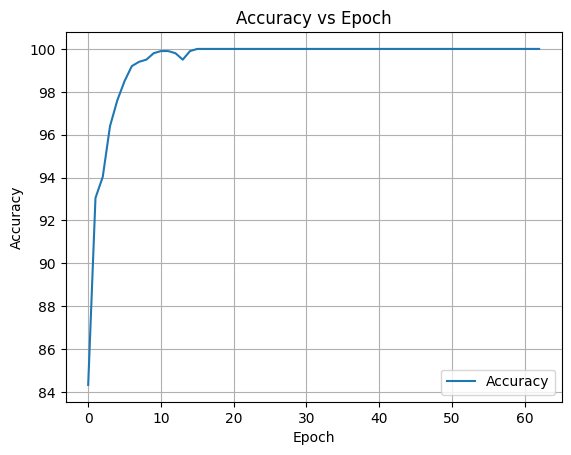

RT Threhold =  0.2636
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


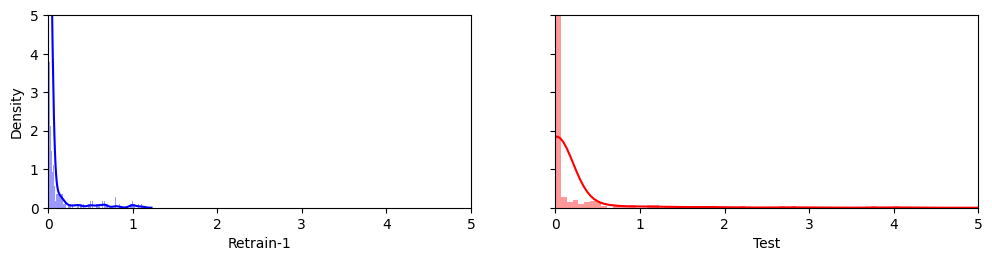

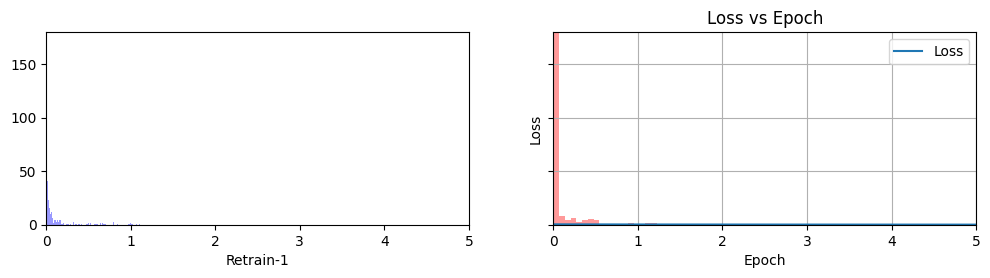

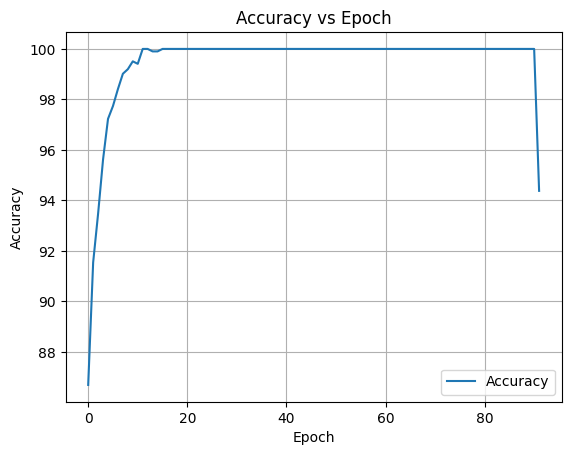

RT Threhold =  0.7342

Retraining Model in Progress...
Early stopping...


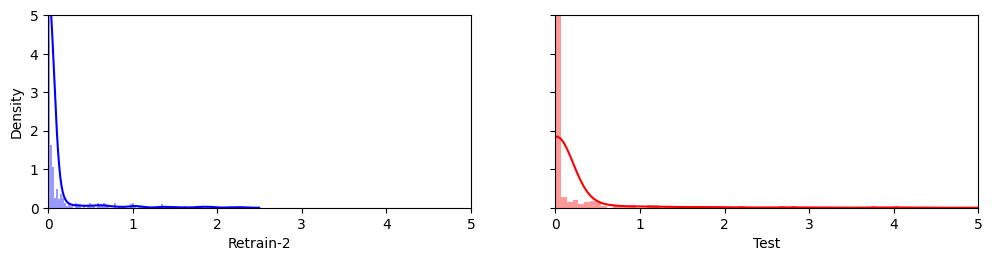

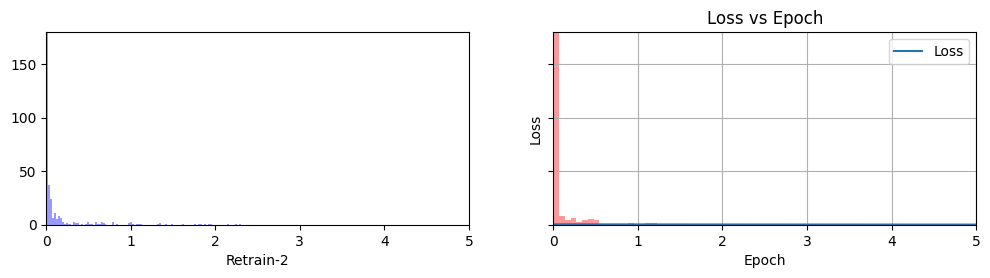

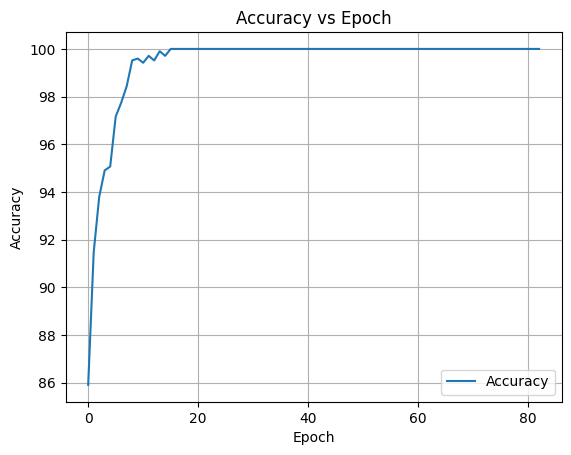

RT Threhold =  0.5369
10
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


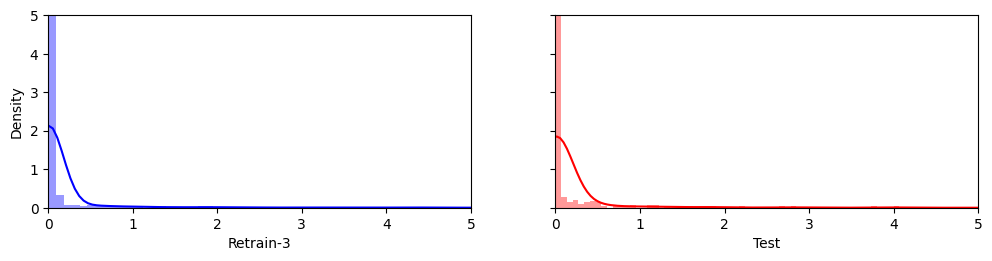

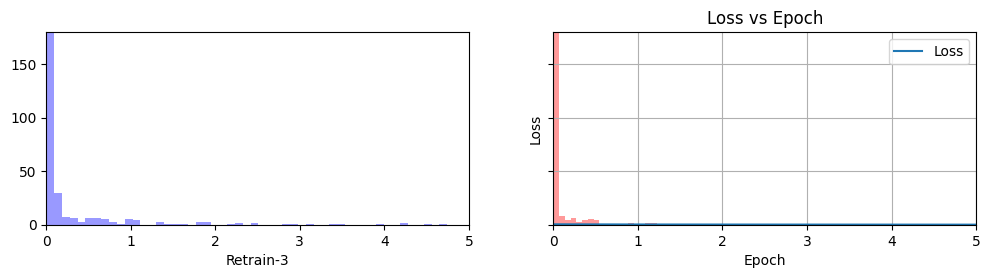

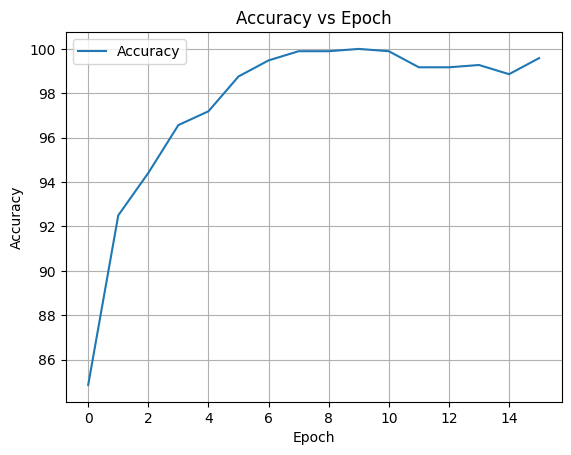

Train Threhold =  0.1179

Retraining Model in Progress...
Early stopping...


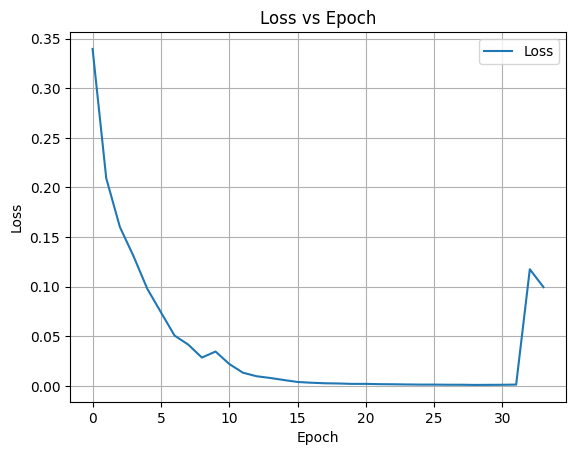

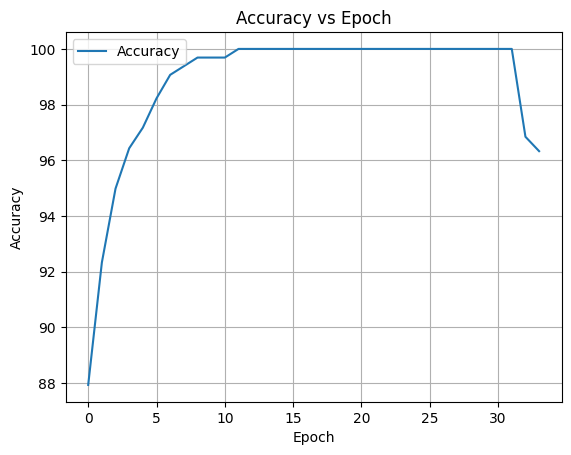

RT Threhold =  0.5197

Retraining Model in Progress...
Early stopping...


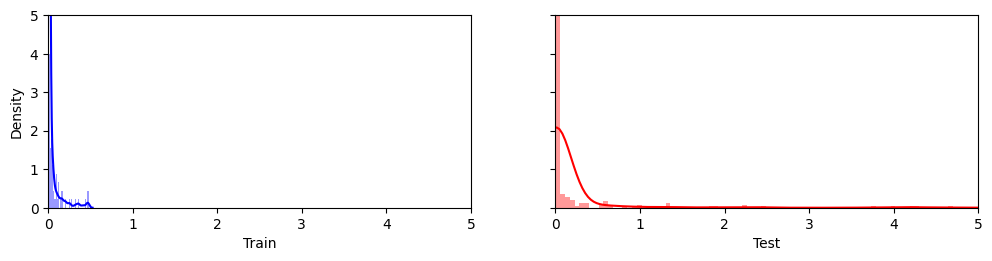

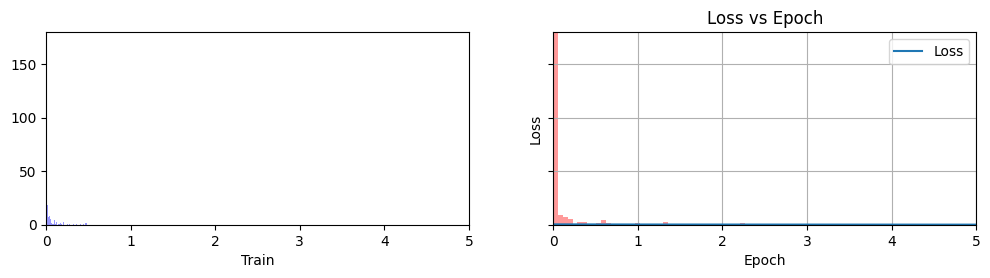

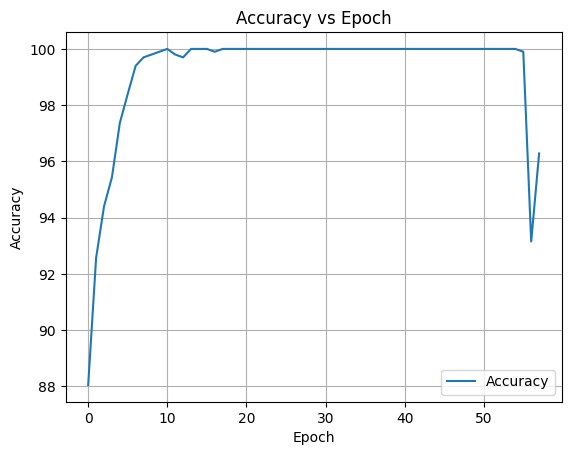

RT Threhold =  0.3874
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


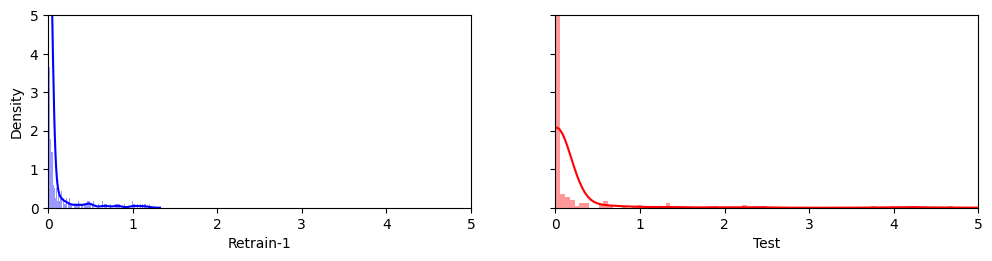

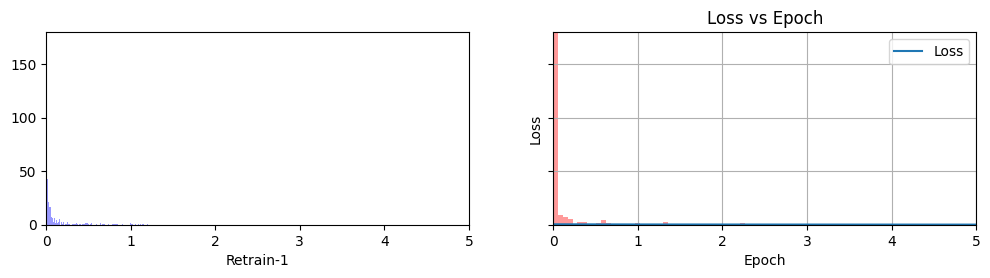

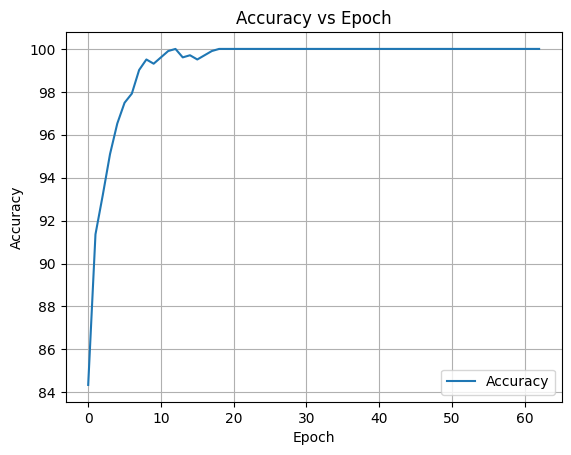

RT Threhold =  0.1123

Retraining Model in Progress...
Early stopping...


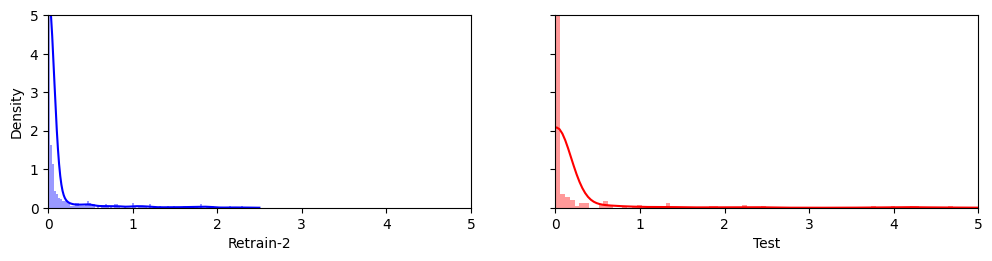

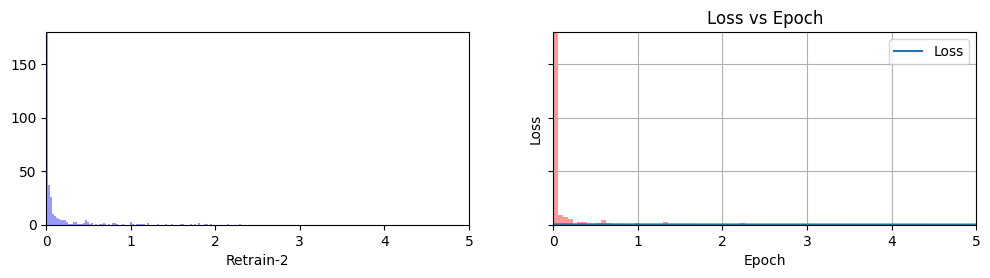

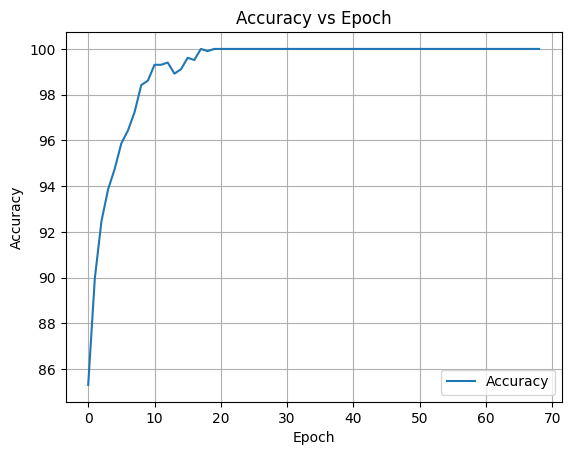

RT Threhold =  0.2039
11
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


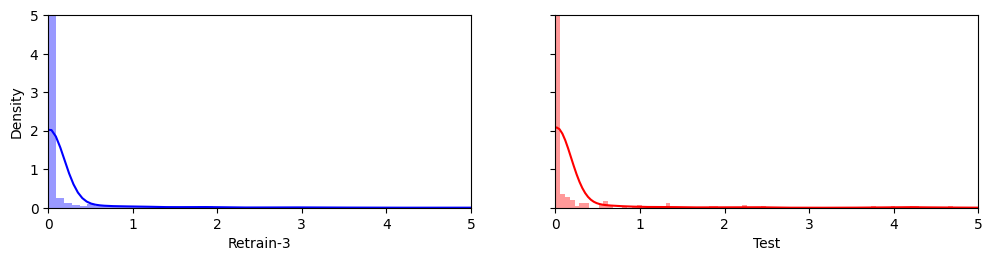

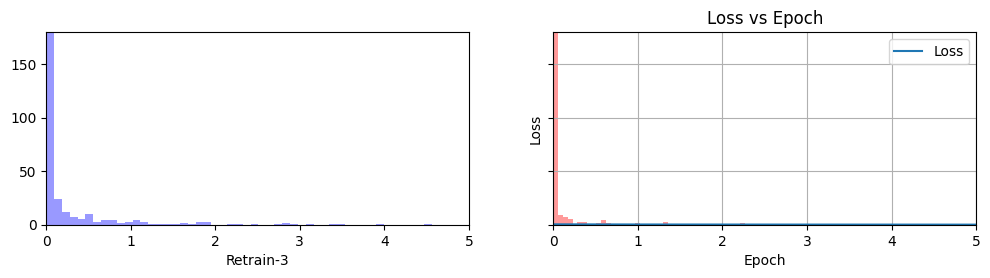

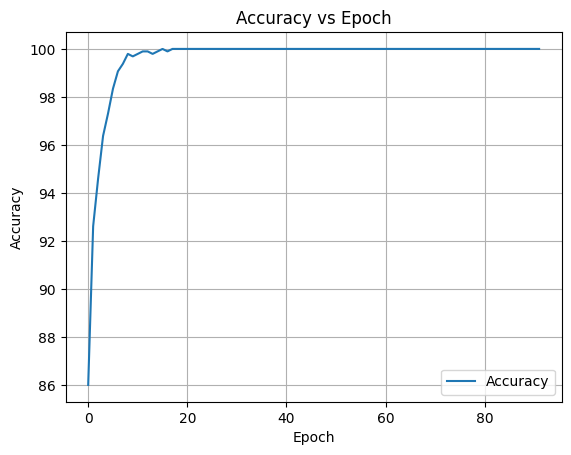

Train Threhold =  0.3297

Retraining Model in Progress...


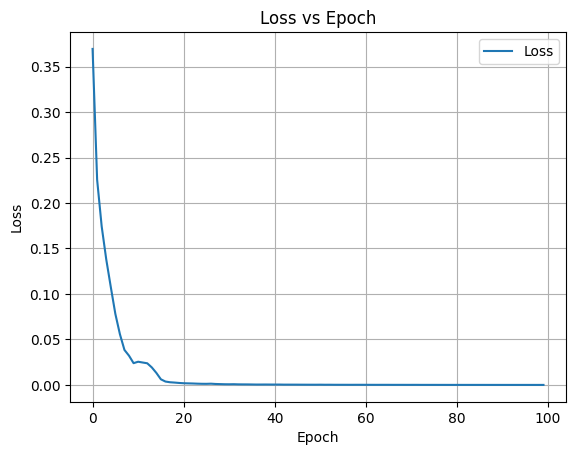

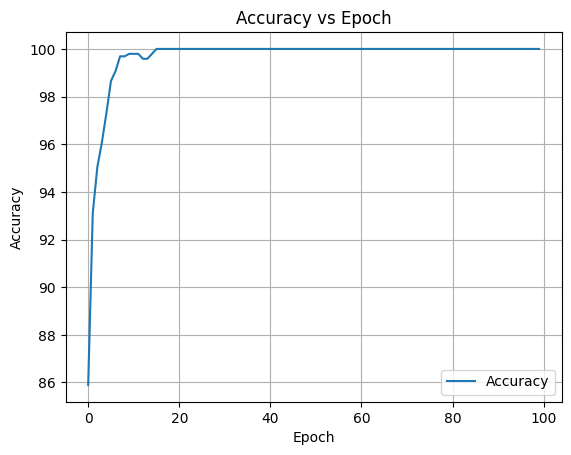

RT Threhold =  0.5219

Retraining Model in Progress...
Early stopping...


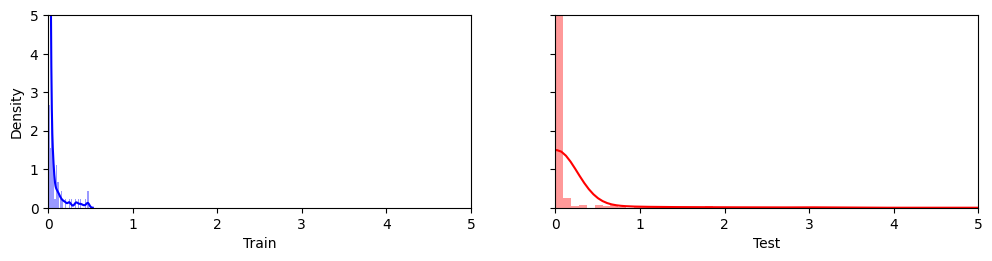

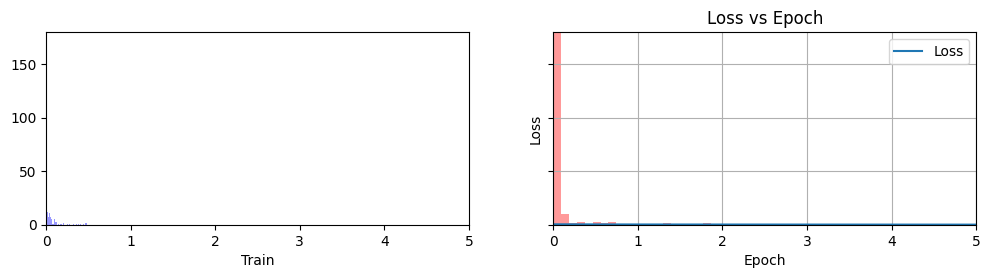

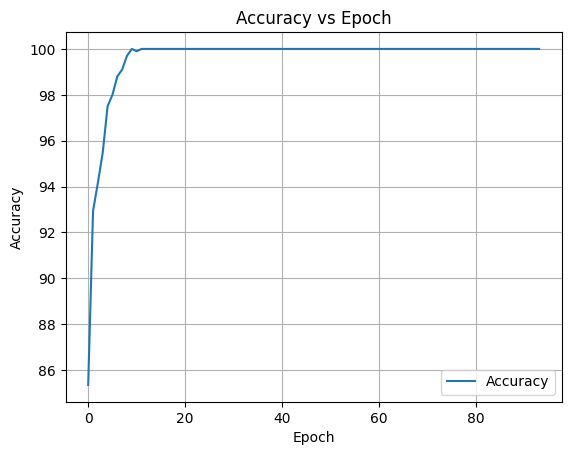

RT Threhold =  0.3221
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


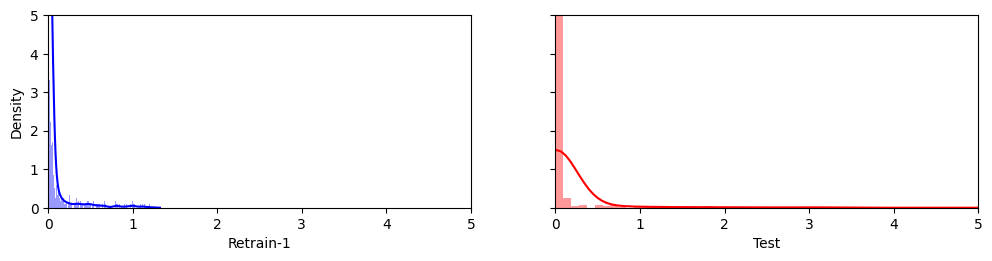

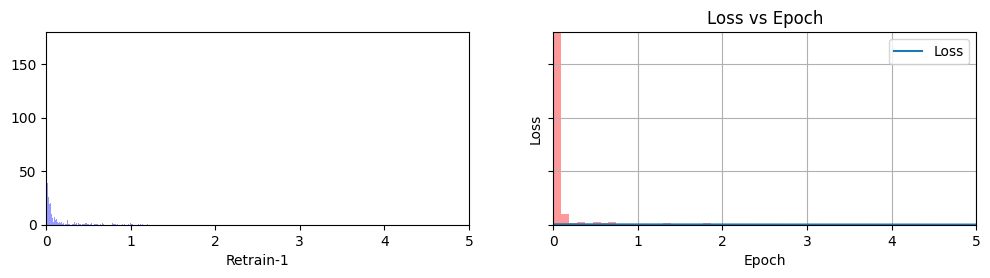

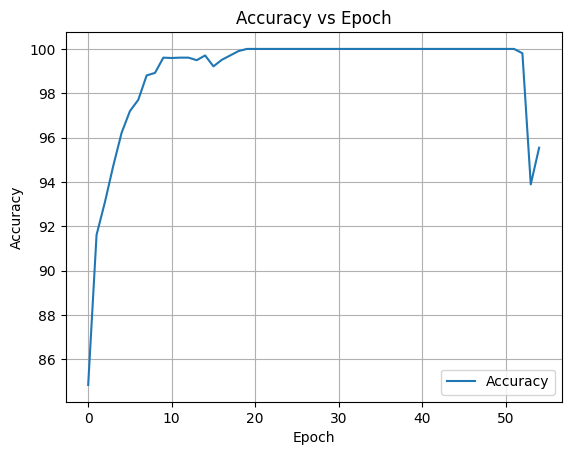

RT Threhold =  0.3029

Retraining Model in Progress...
Early stopping...


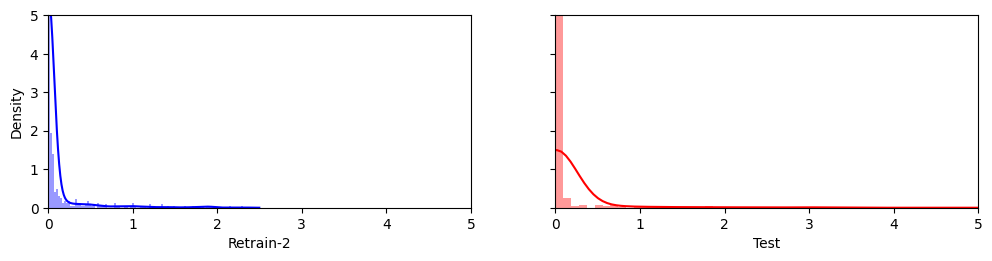

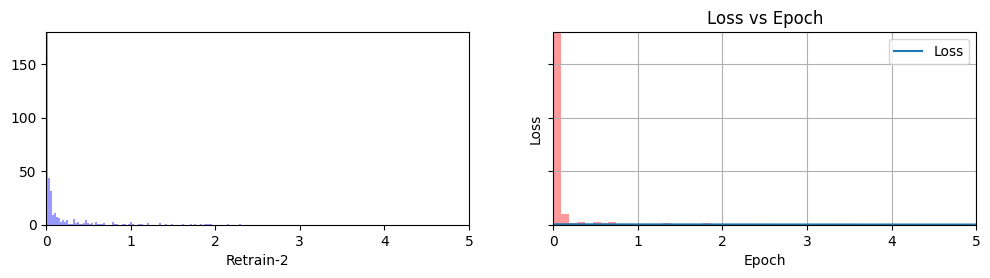

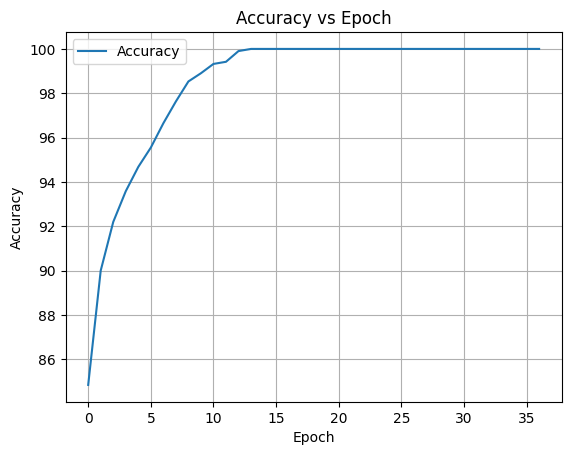

RT Threhold =  0.3925
12
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...


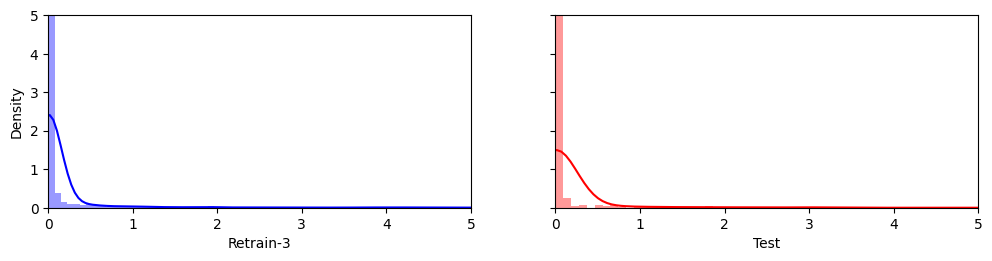

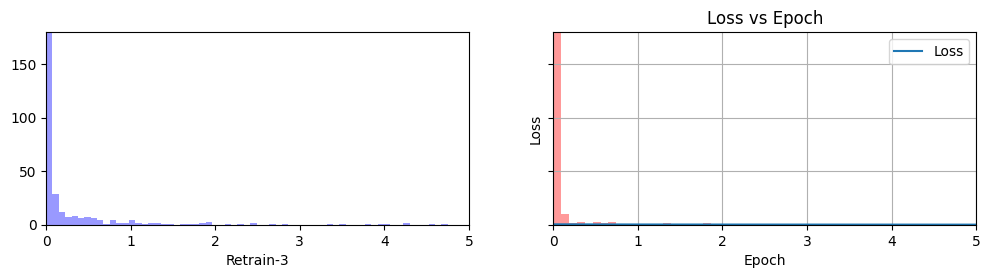

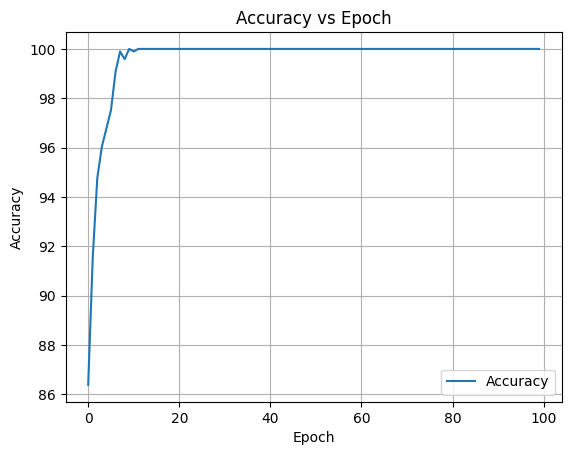

Train Threhold =  0.0949

Retraining Model in Progress...
Early stopping...


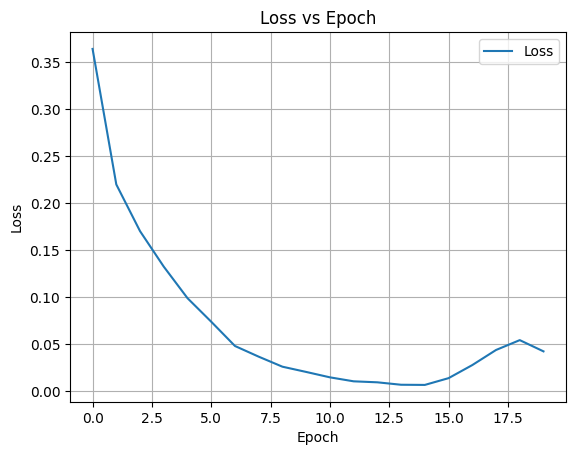

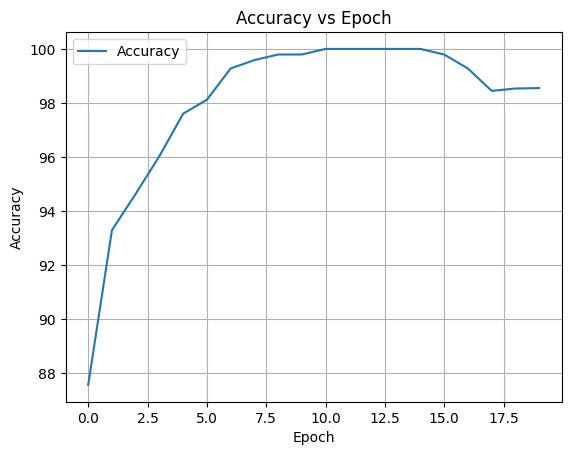

RT Threhold =  0.4623

Retraining Model in Progress...
Early stopping...


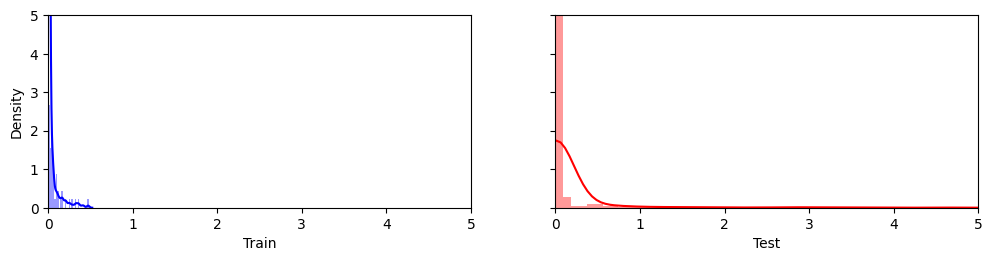

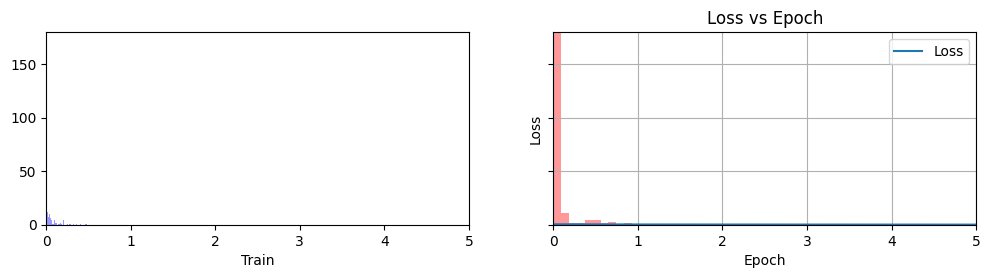

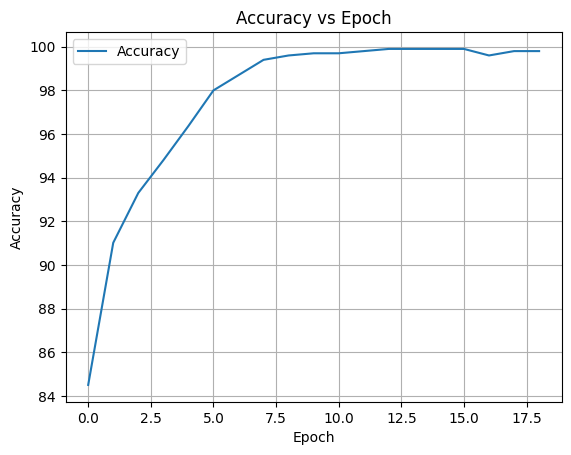

RT Threhold =  0.6167
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


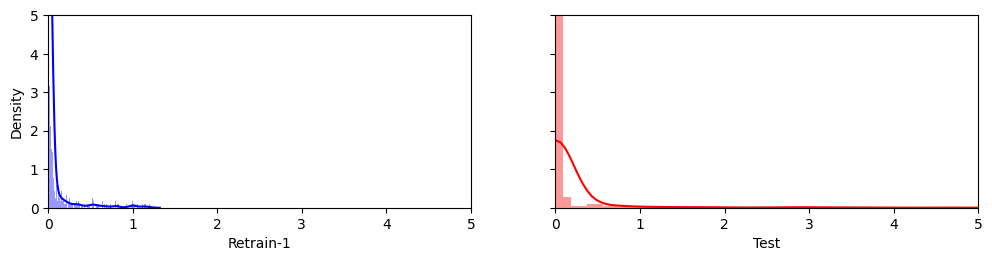

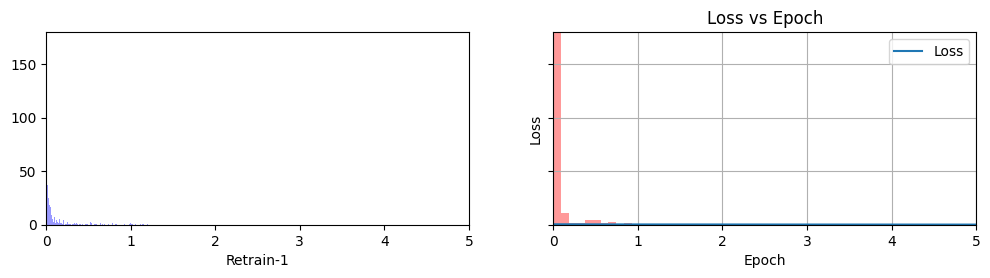

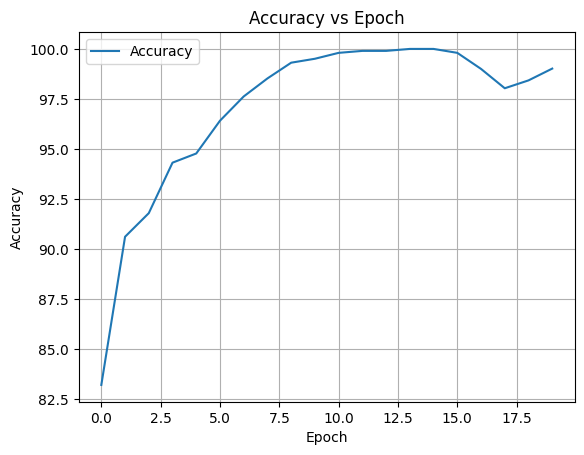

RT Threhold =  0.5427

Retraining Model in Progress...


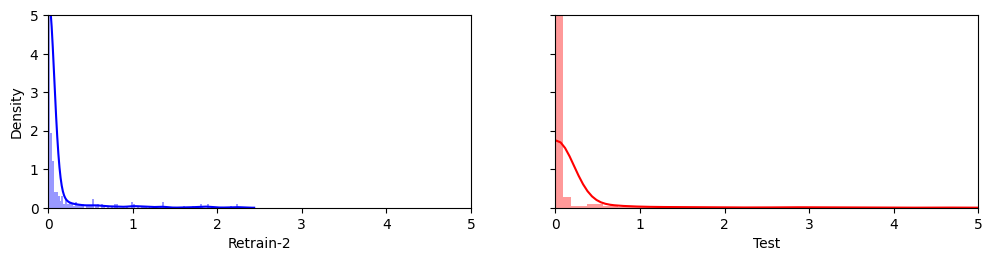

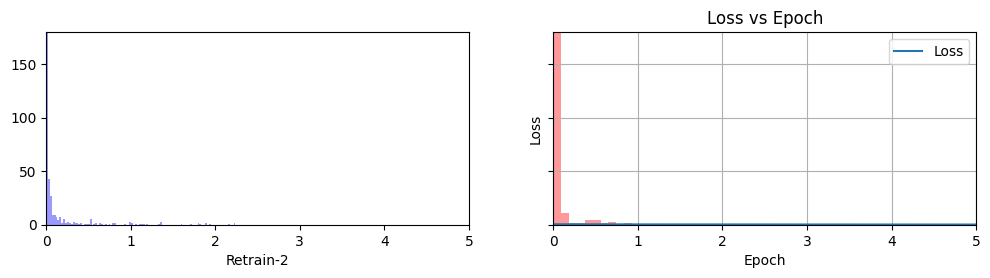

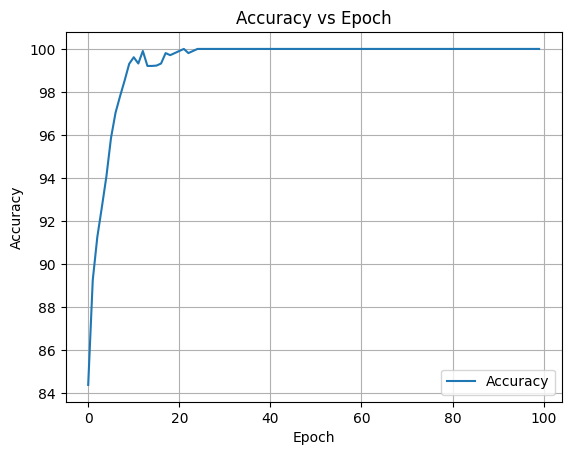

RT Threhold =  0.0539
13
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


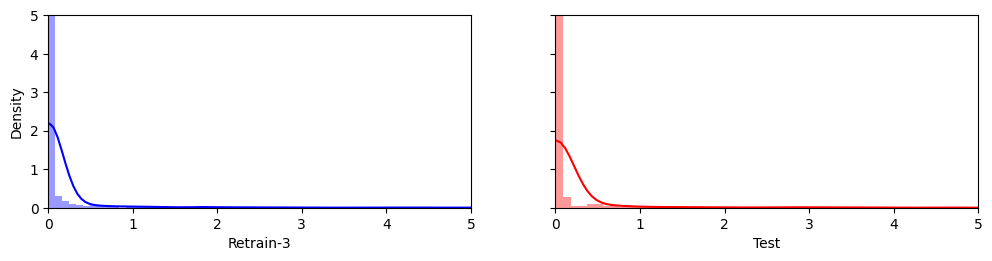

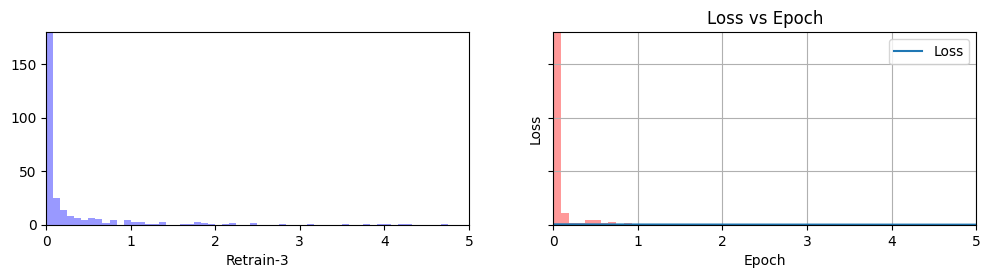

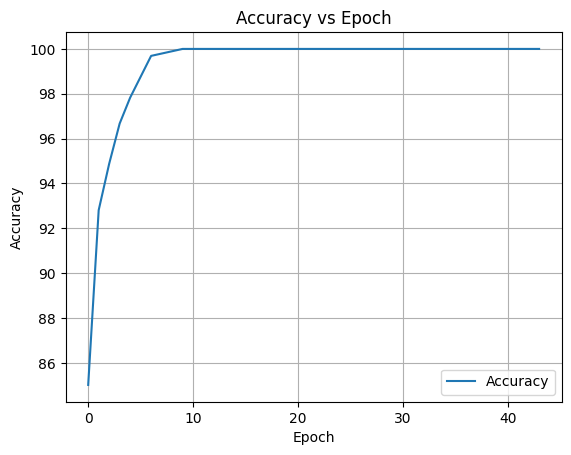

Train Threhold =  0.6886

Retraining Model in Progress...
Early stopping...


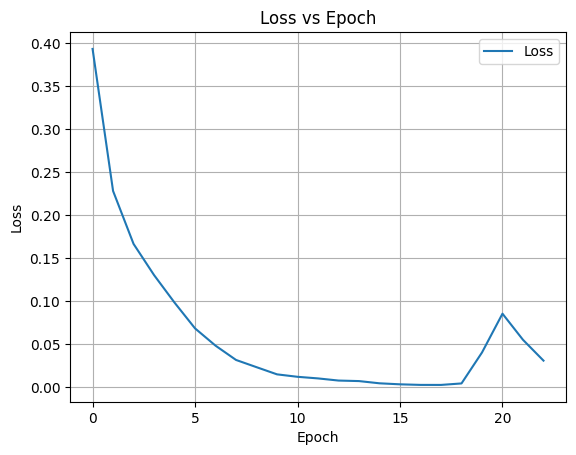

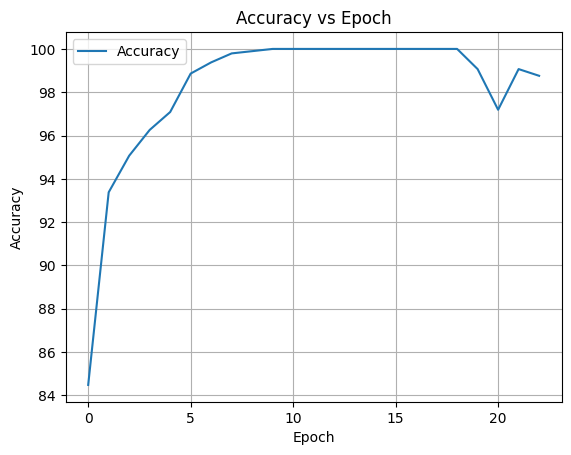

RT Threhold =  0.3552

Retraining Model in Progress...
Early stopping...


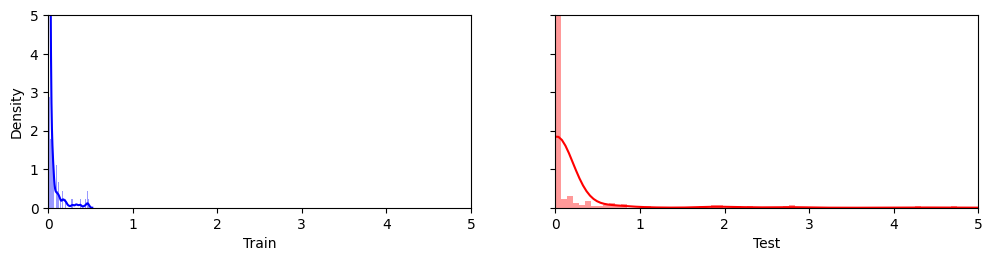

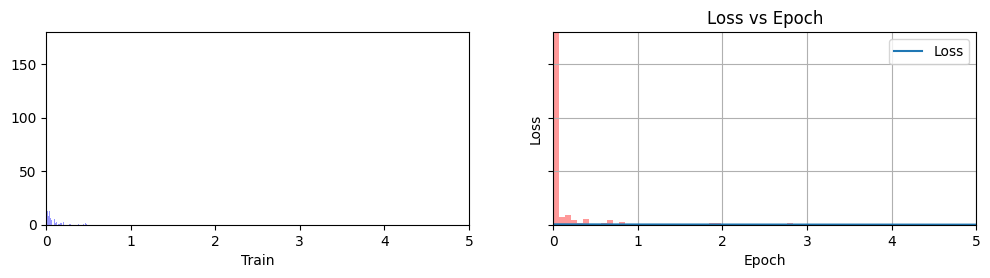

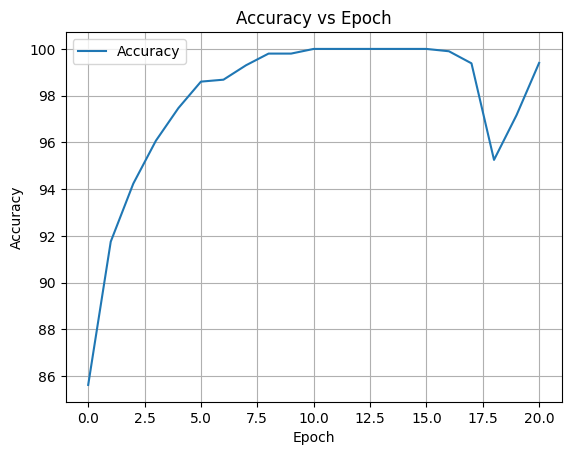

RT Threhold =  0.7622
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


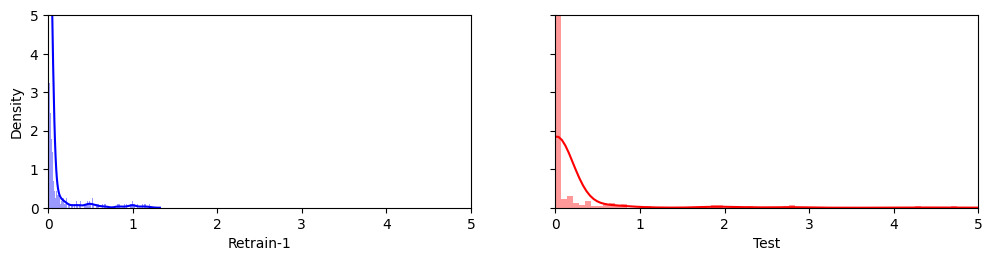

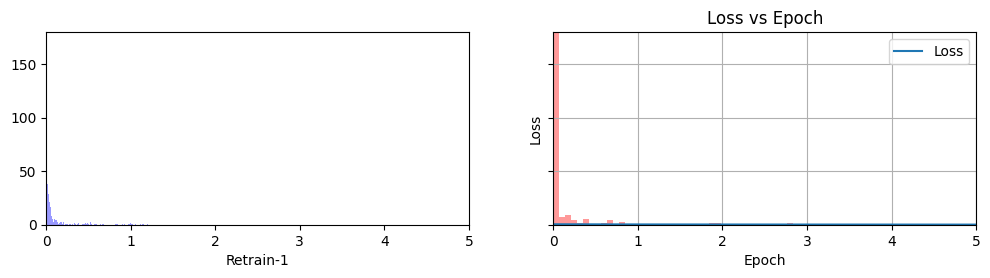

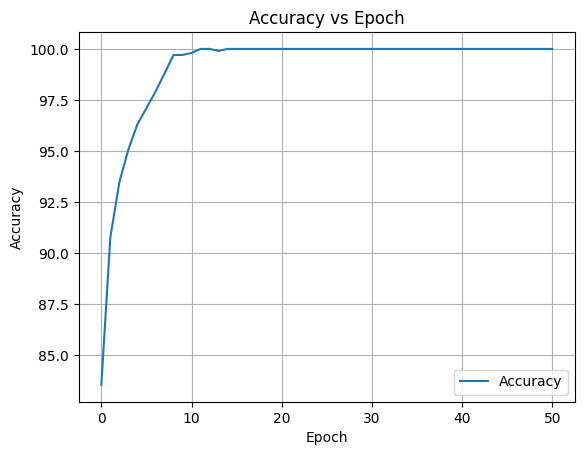

RT Threhold =  0.6646

Retraining Model in Progress...
Early stopping...


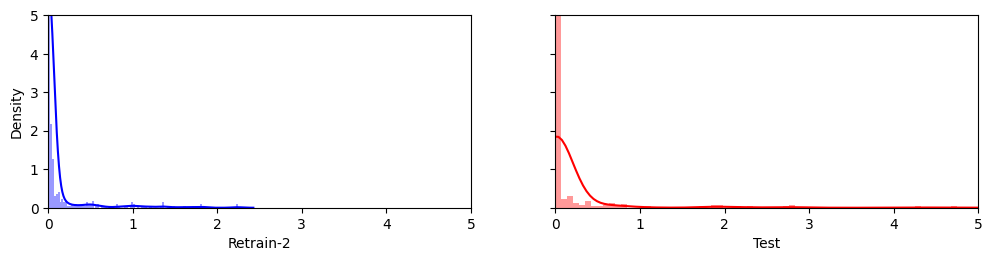

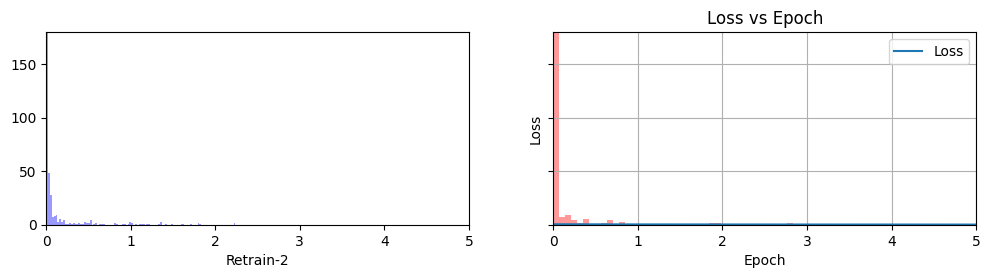

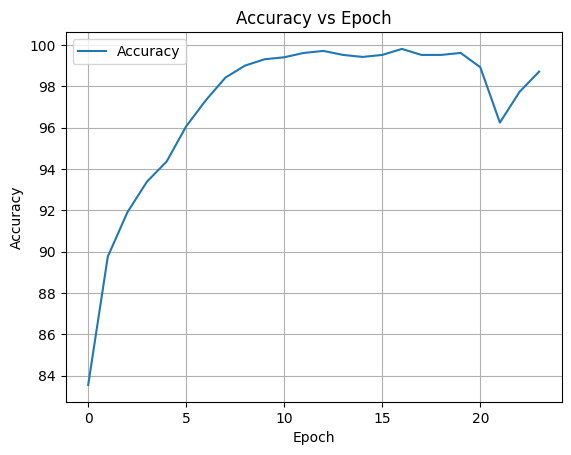

RT Threhold =  0.6189
14
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


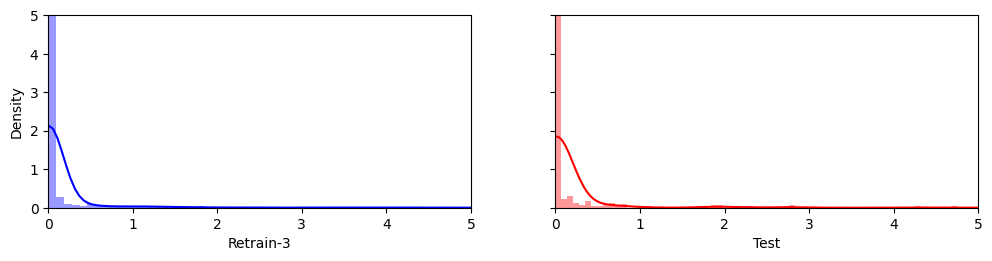

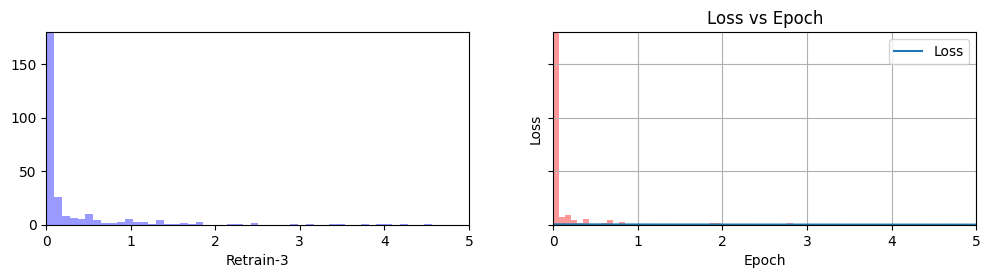

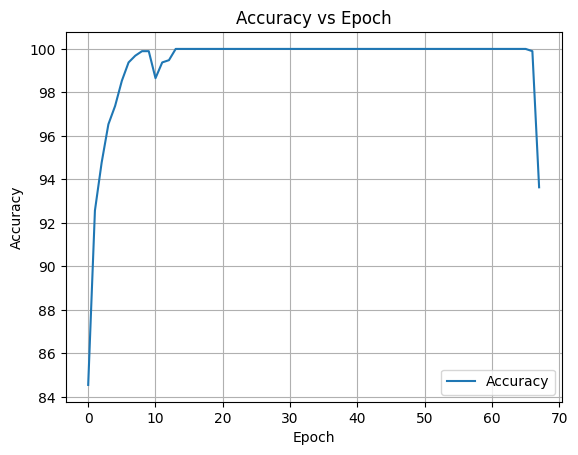

Train Threhold =  0.7685

Retraining Model in Progress...
Early stopping...


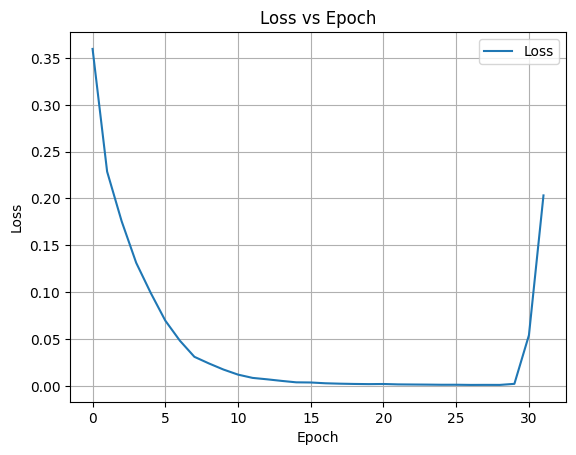

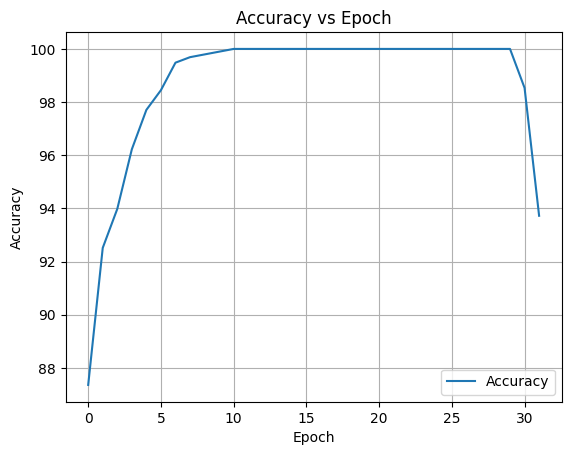

RT Threhold =  0.38

Retraining Model in Progress...
Early stopping...


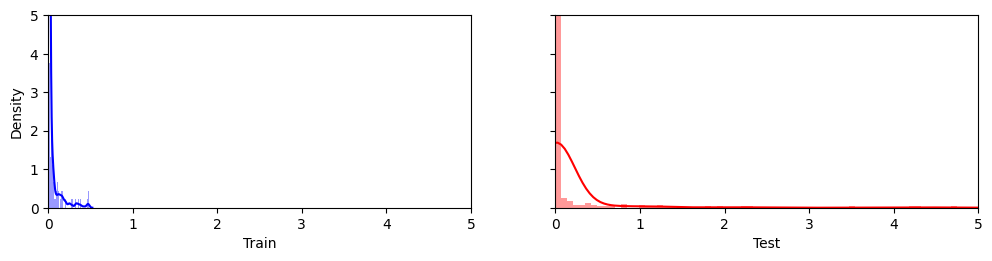

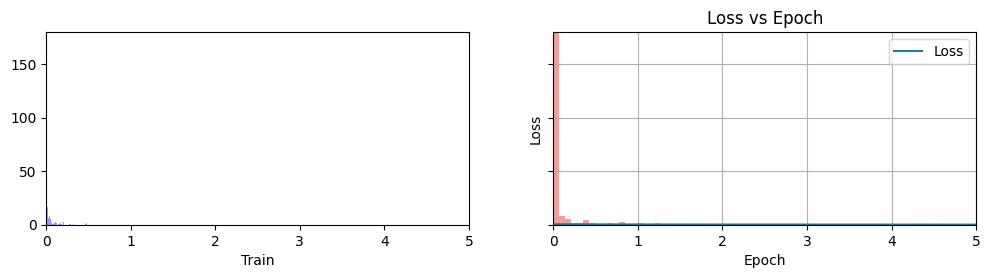

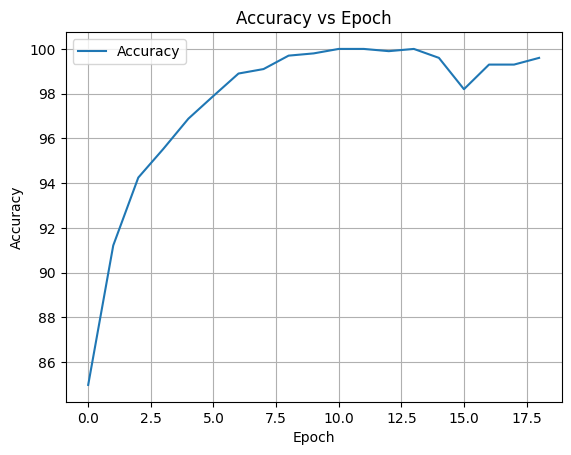

RT Threhold =  0.2538
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


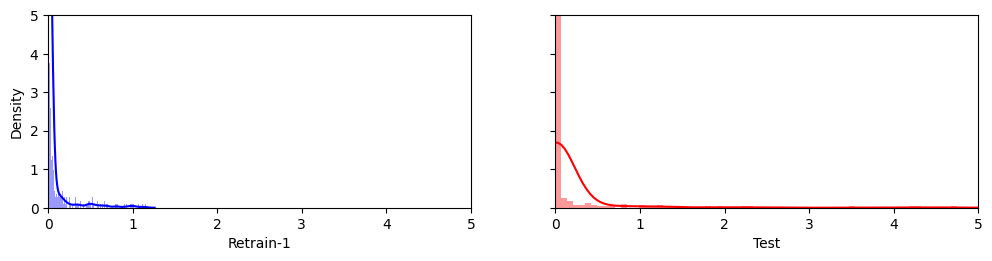

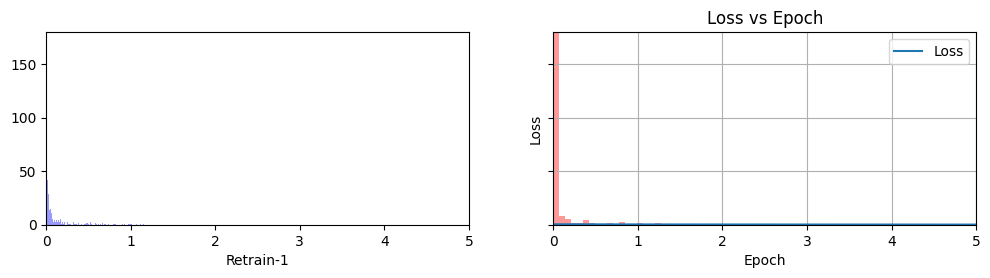

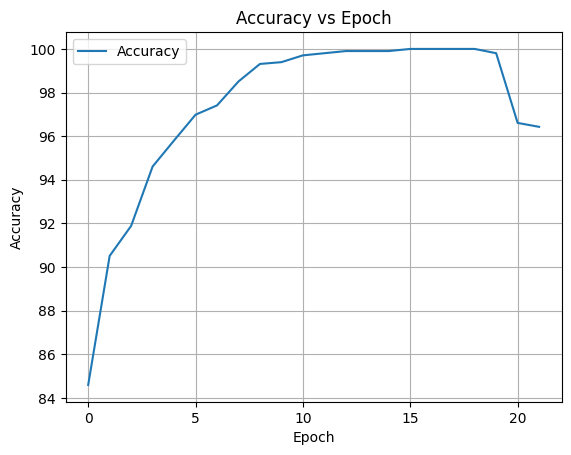

RT Threhold =  0.4509

Retraining Model in Progress...
Early stopping...


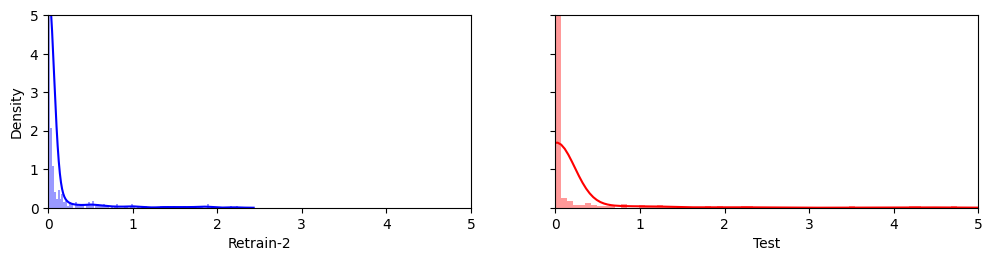

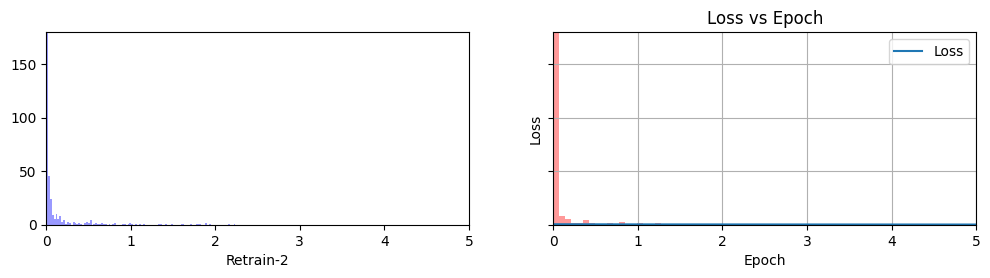

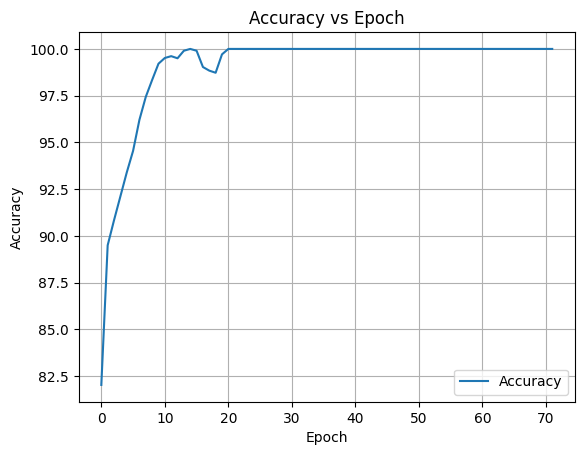

RT Threhold =  0.6456
15
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


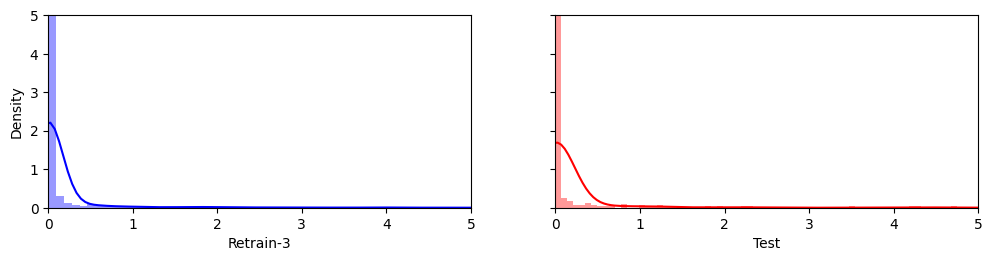

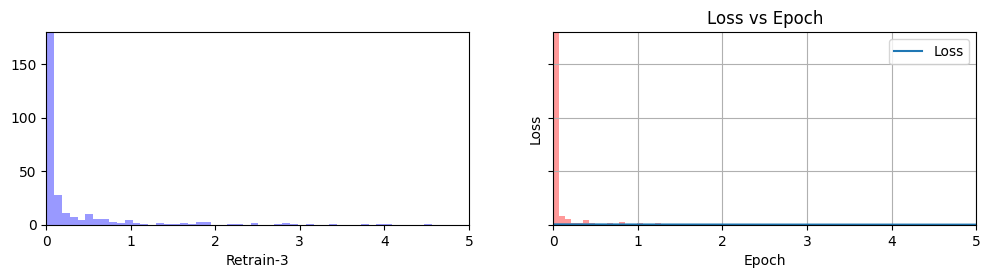

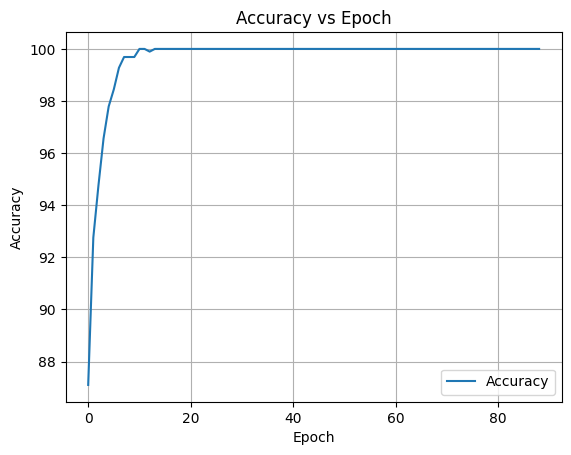

Train Threhold =  0.4105

Retraining Model in Progress...
Early stopping...


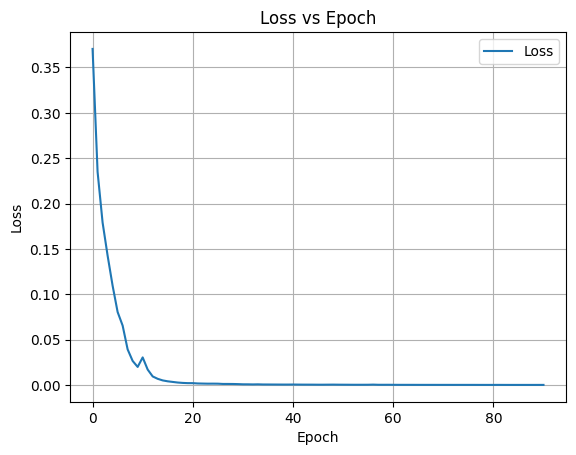

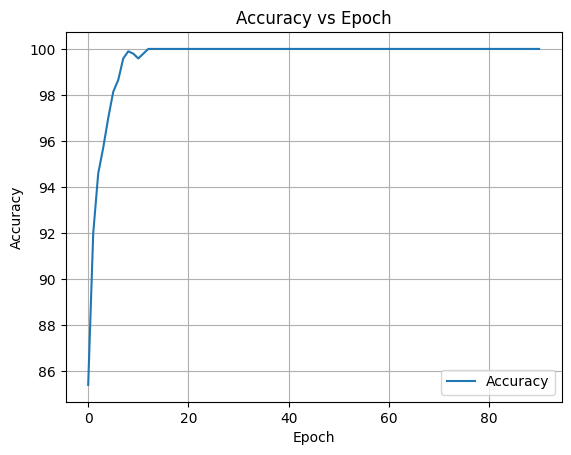

RT Threhold =  0.1776

Retraining Model in Progress...
Early stopping...


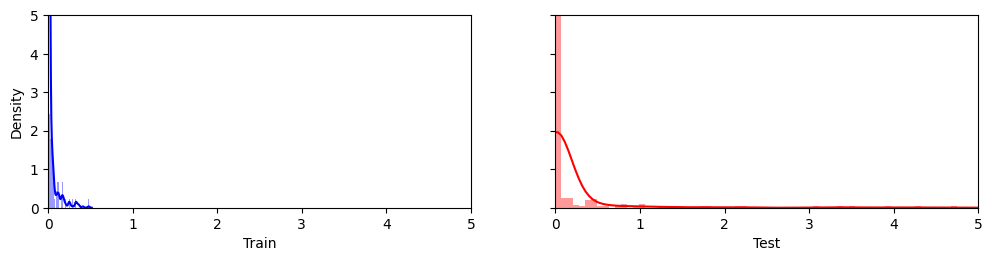

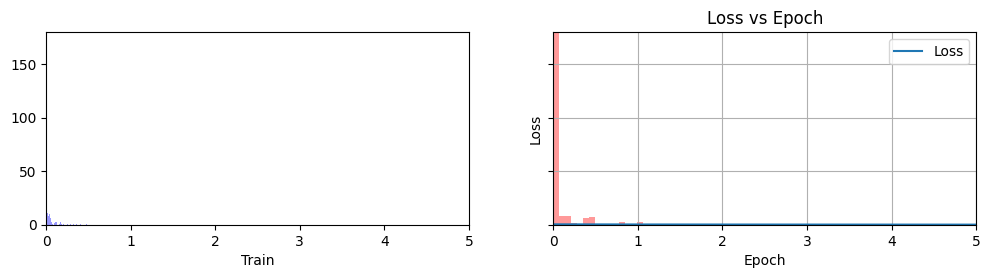

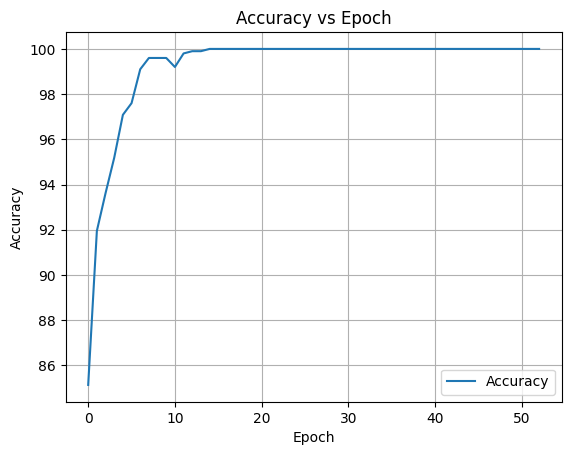

RT Threhold =  0.4547
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


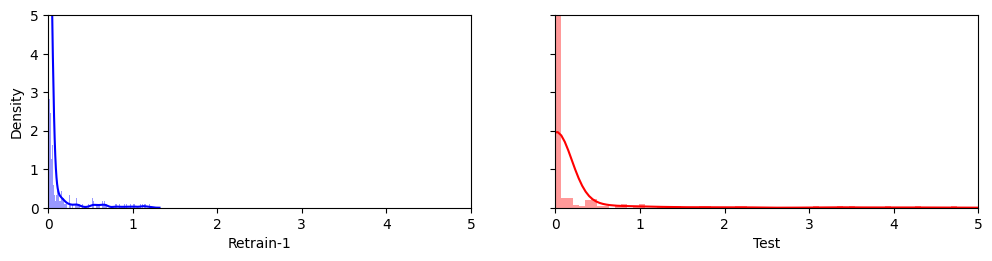

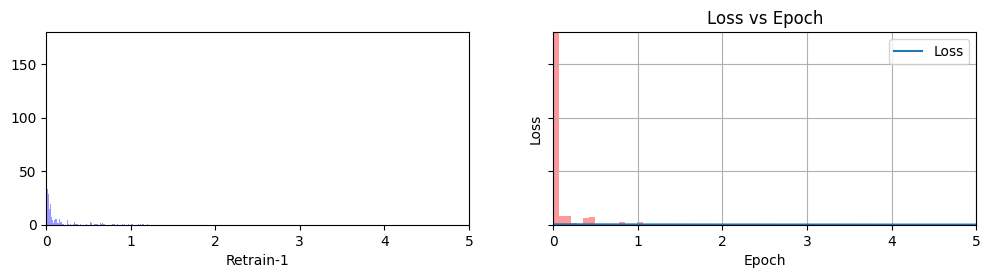

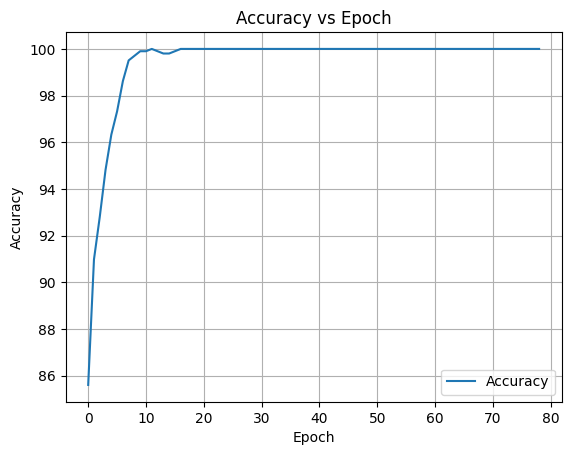

RT Threhold =  0.4312

Retraining Model in Progress...
Early stopping...


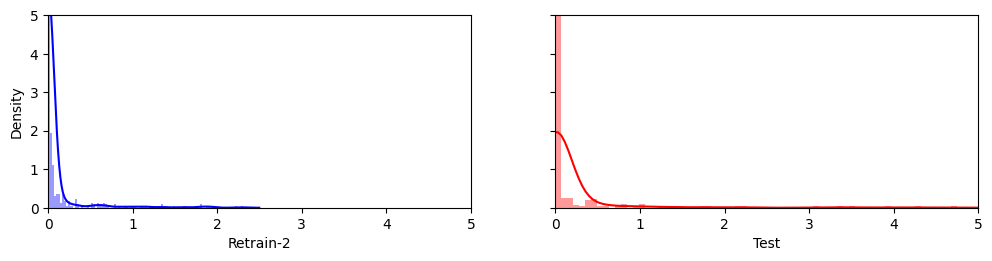

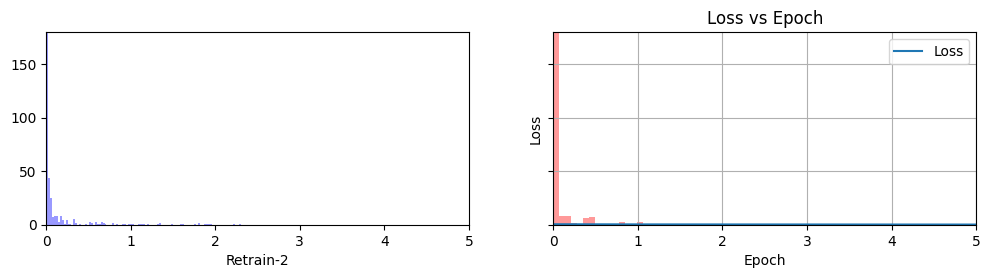

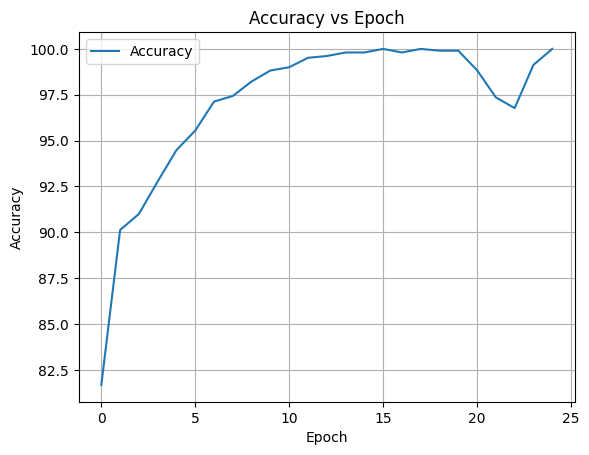

RT Threhold =  0.2181
16
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


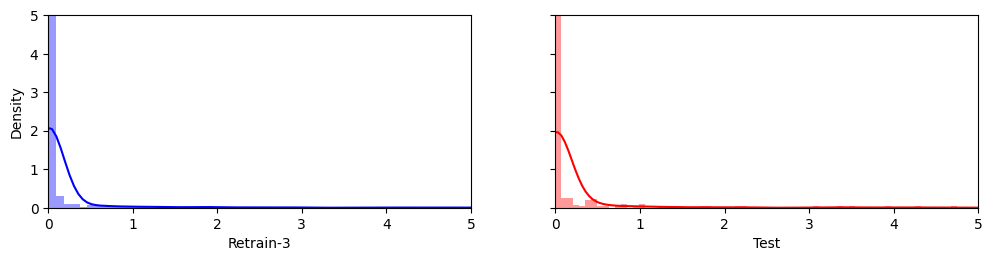

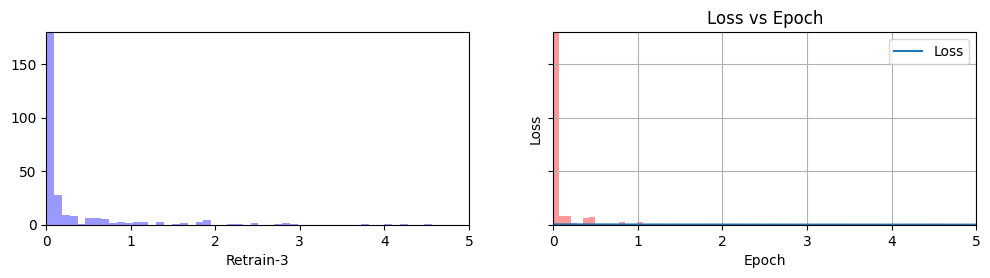

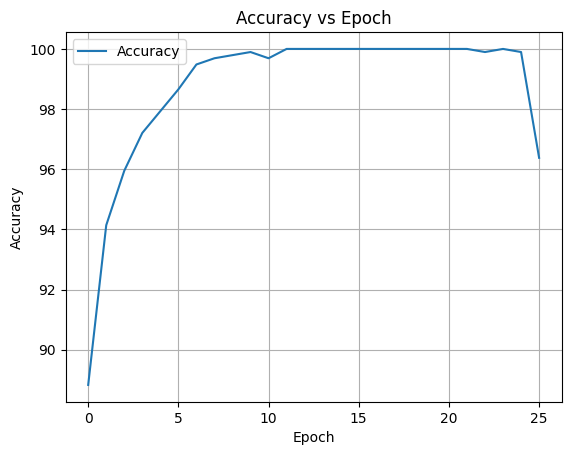

Train Threhold =  0.0323

Retraining Model in Progress...
Early stopping...


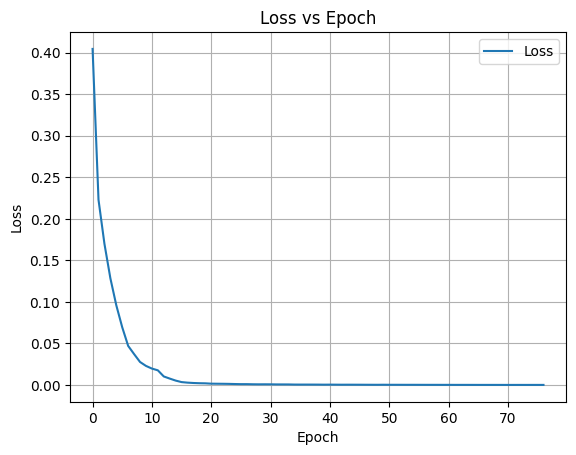

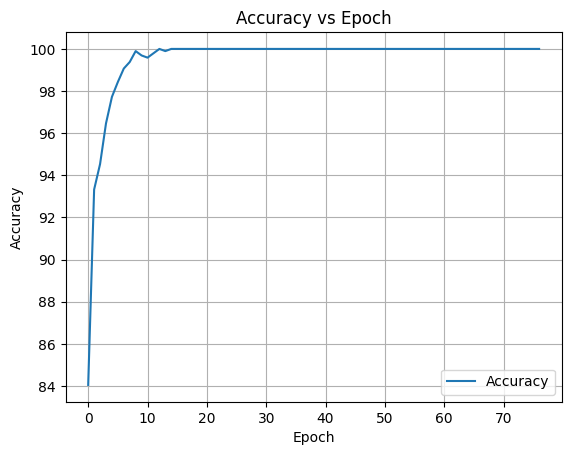

RT Threhold =  0.0928

Retraining Model in Progress...
Early stopping...


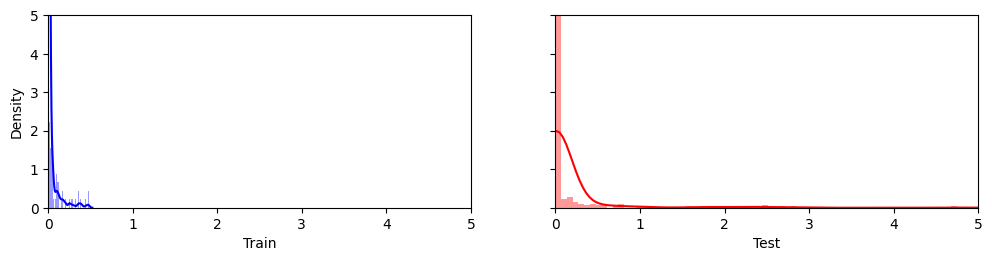

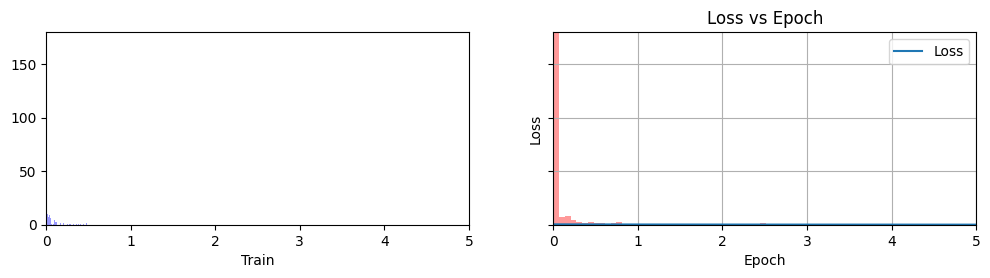

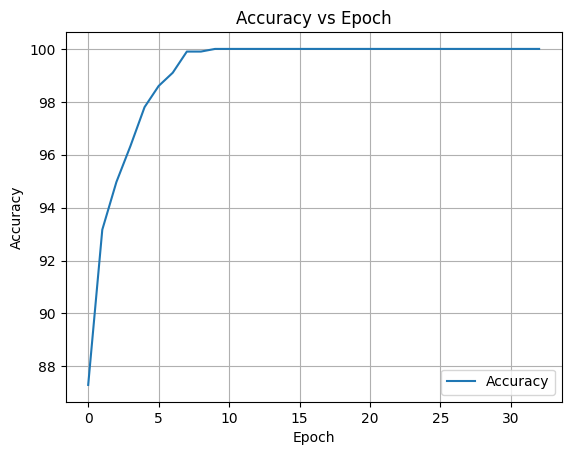

RT Threhold =  0.392
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


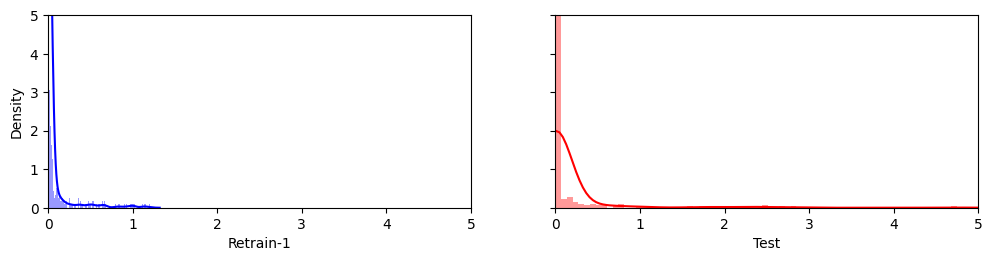

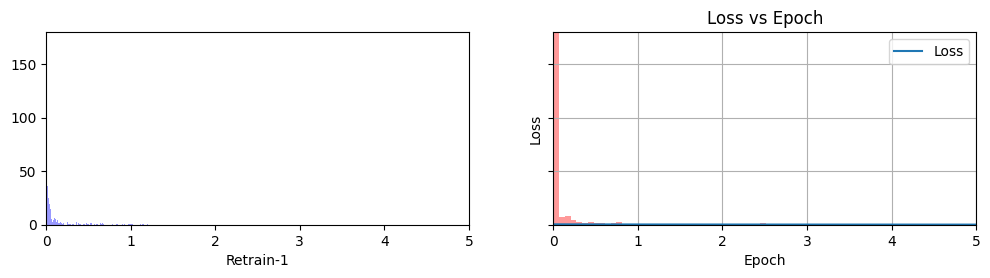

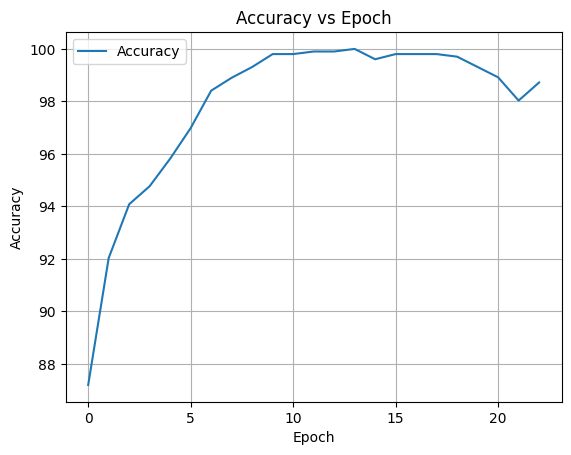

RT Threhold =  0.2297

Retraining Model in Progress...
Early stopping...


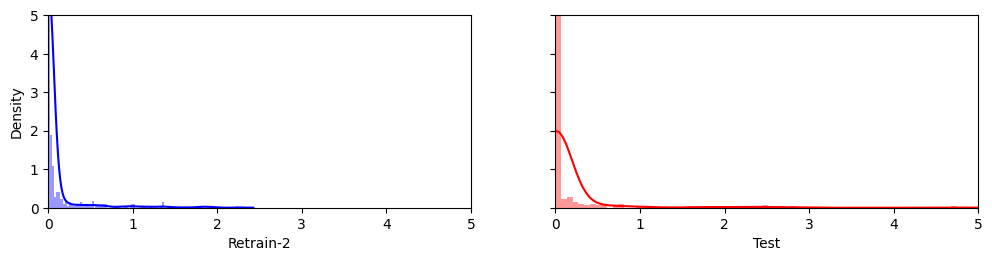

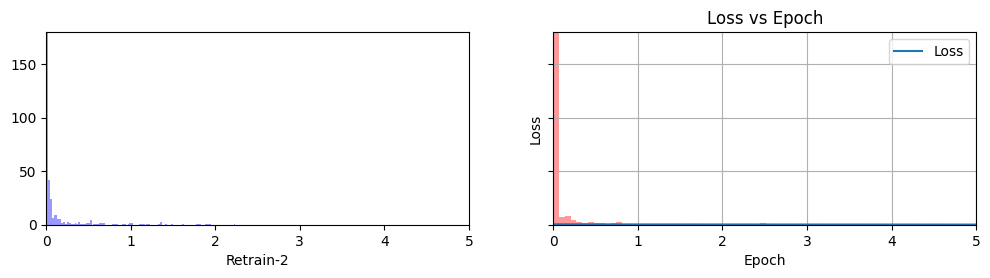

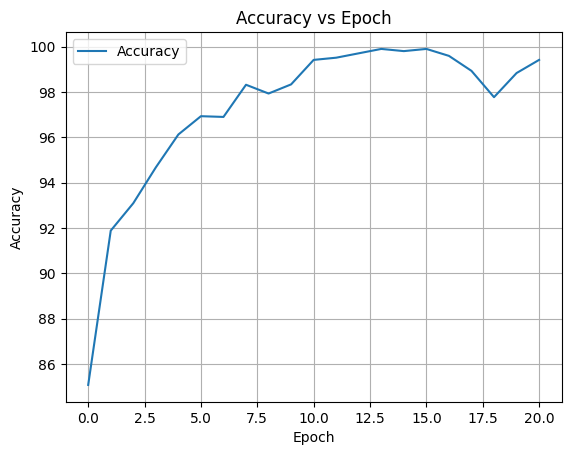

RT Threhold =  0.1142
17
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


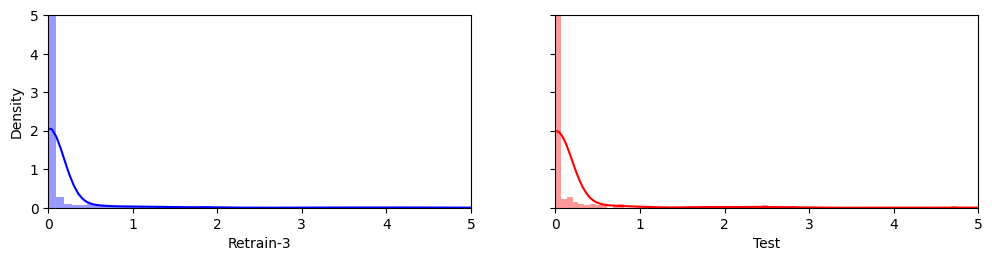

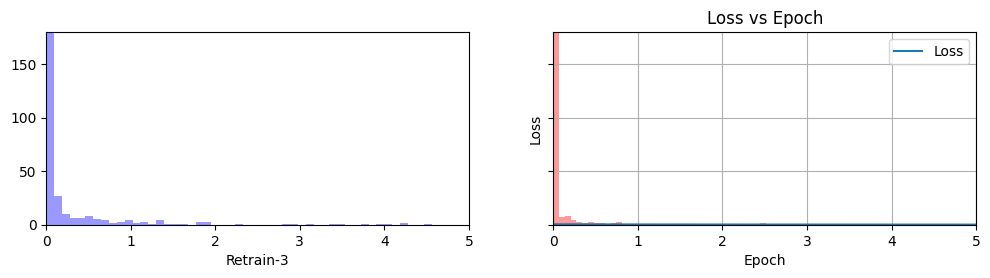

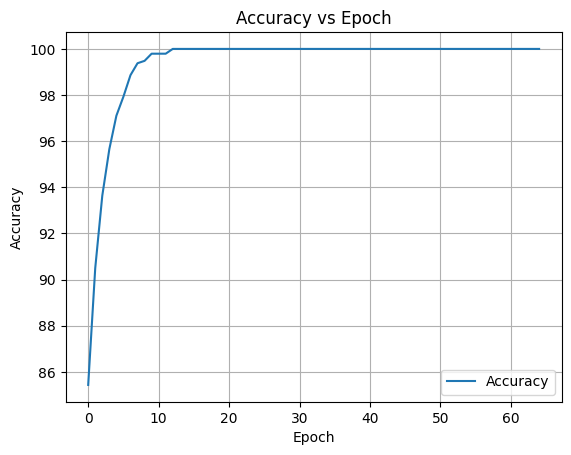

Train Threhold =  0.6018

Retraining Model in Progress...
Early stopping...


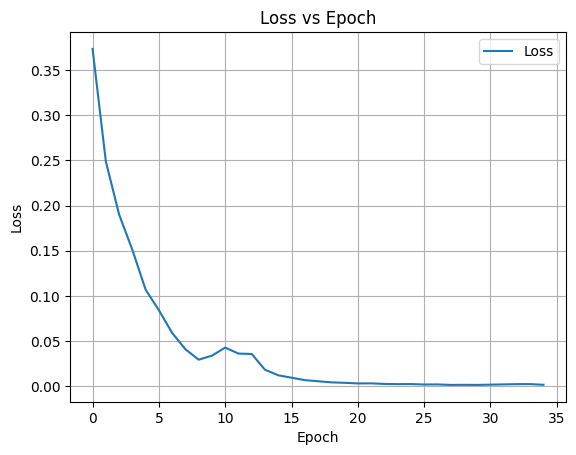

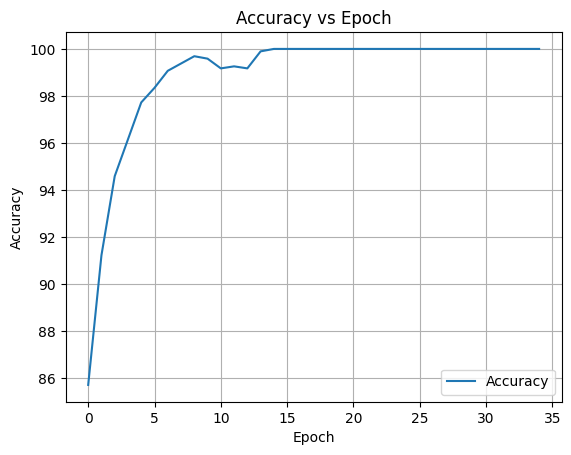

RT Threhold =  0.3706

Retraining Model in Progress...
Early stopping...


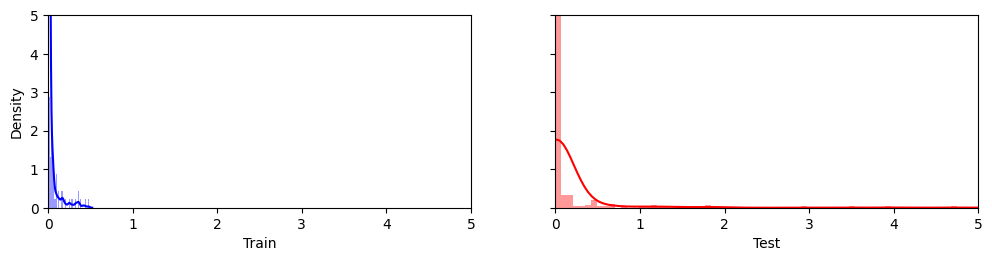

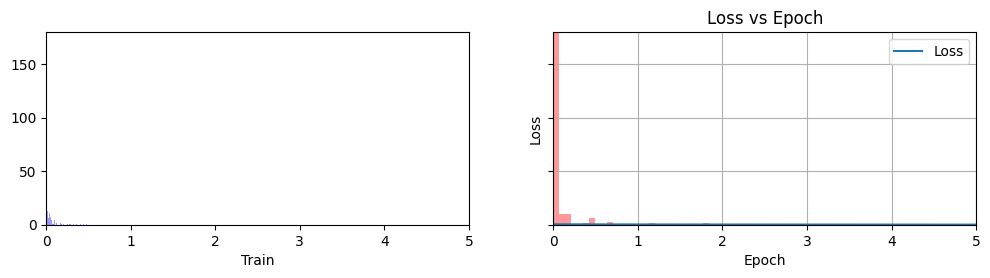

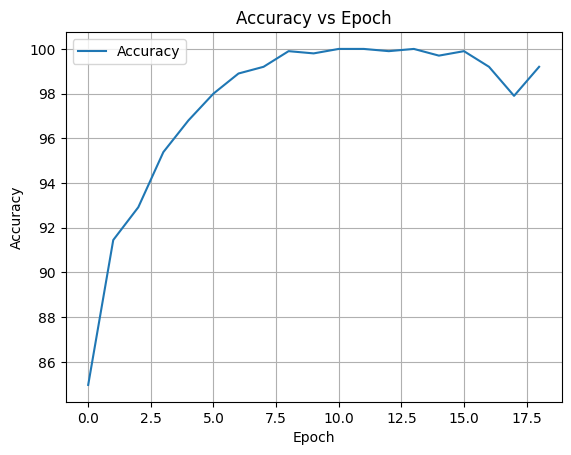

RT Threhold =  0.526
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


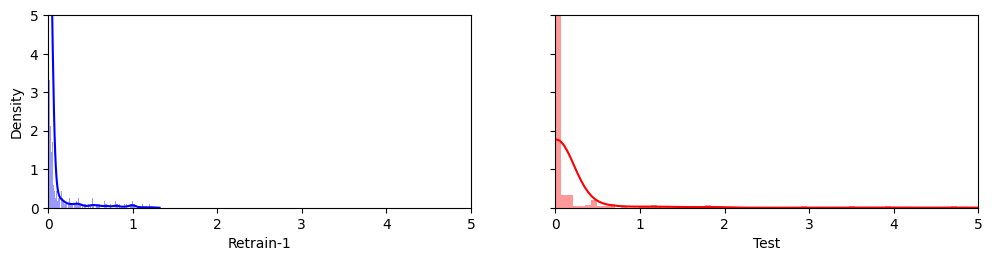

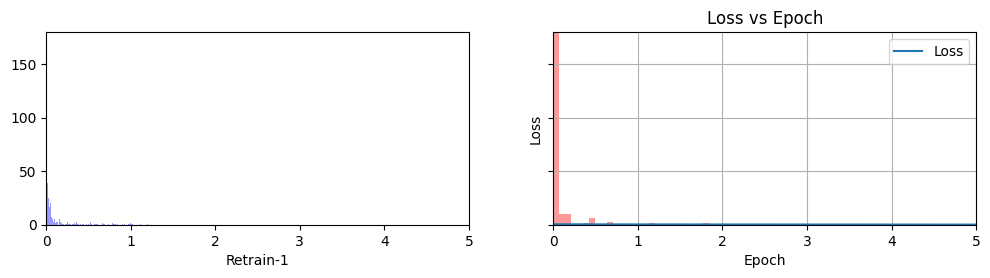

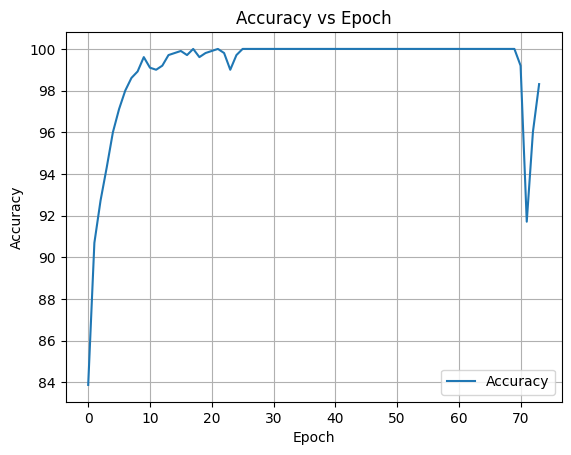

RT Threhold =  0.3859

Retraining Model in Progress...
Early stopping...


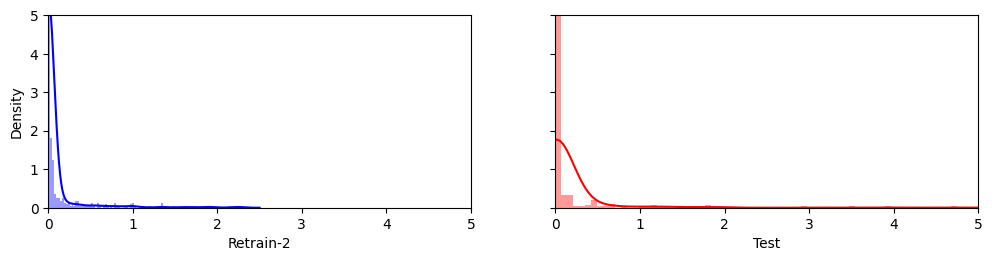

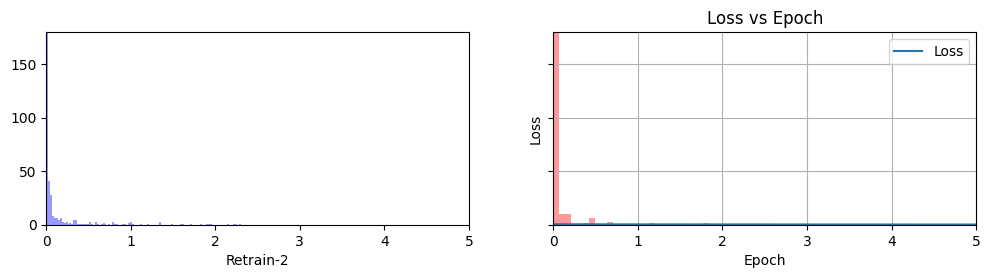

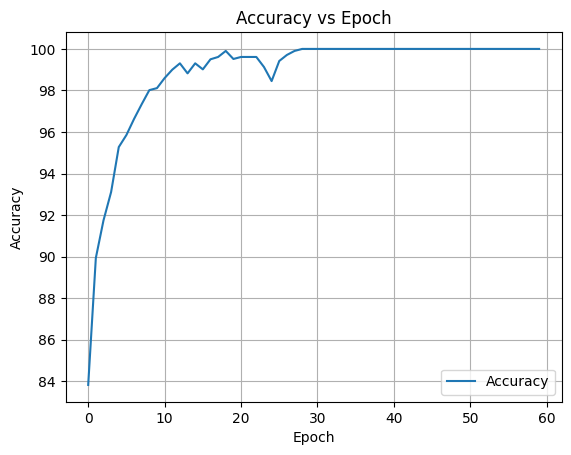

RT Threhold =  0.3574
18
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


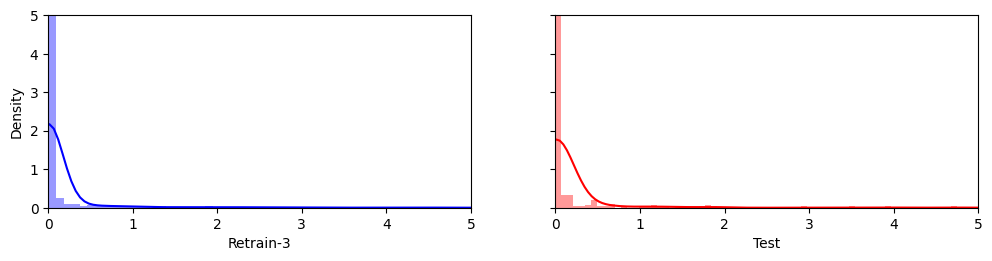

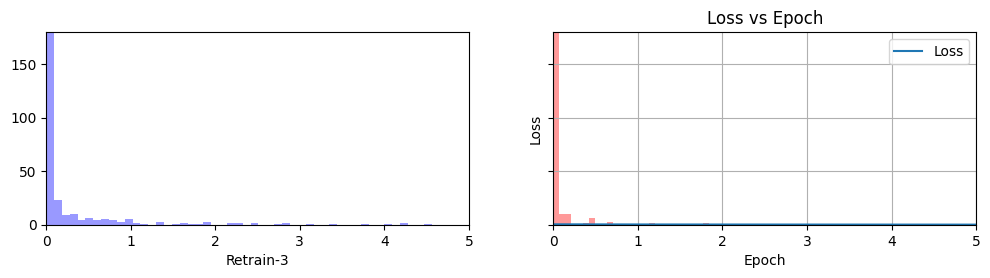

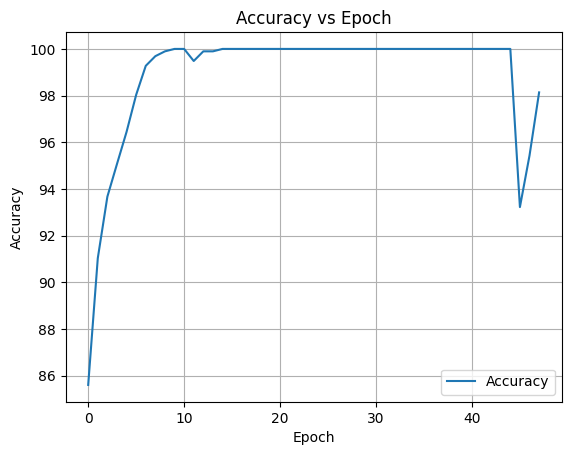

Train Threhold =  0.6823

Retraining Model in Progress...
Early stopping...


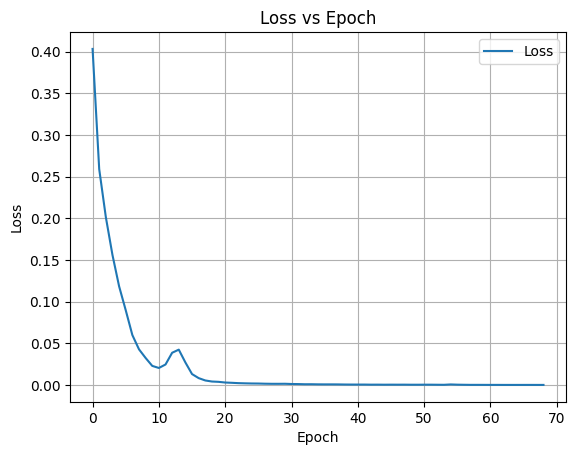

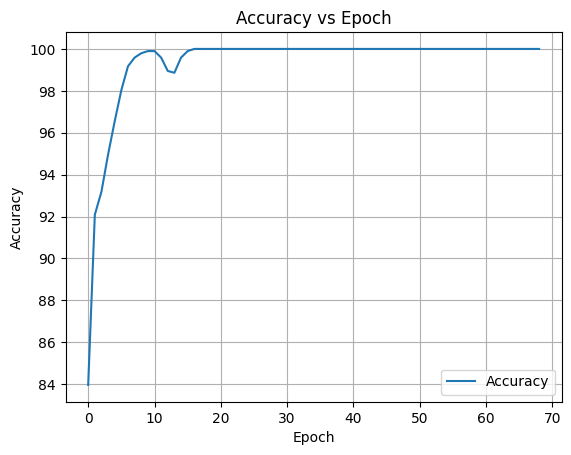

RT Threhold =  0.2882

Retraining Model in Progress...
Early stopping...


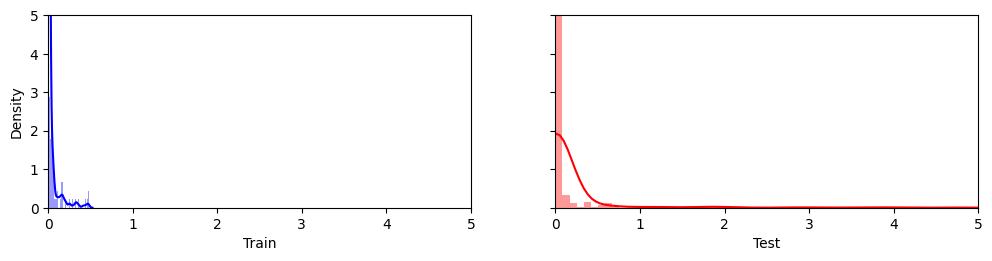

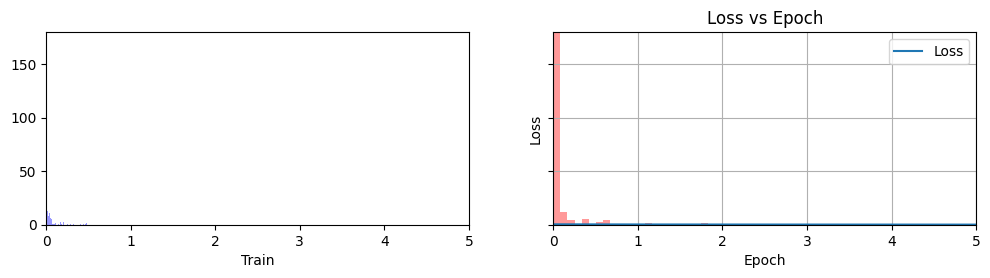

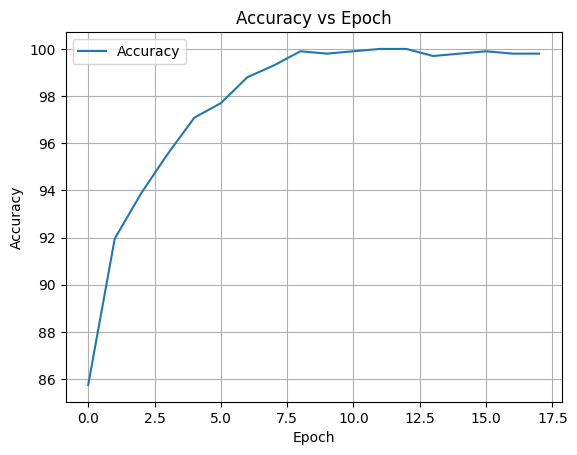

RT Threhold =  0.3478
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


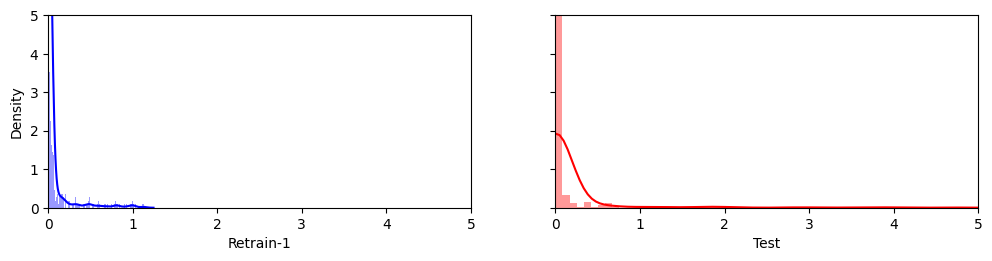

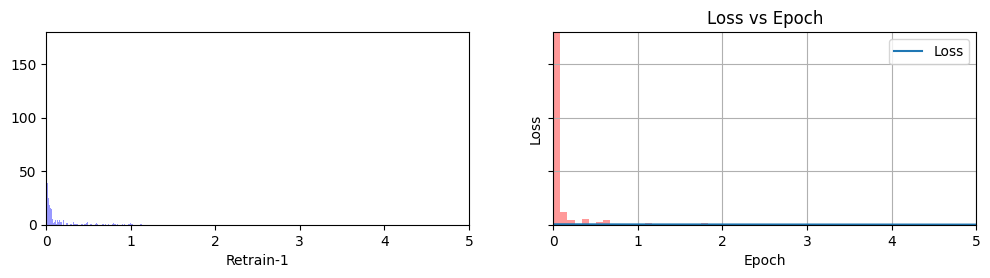

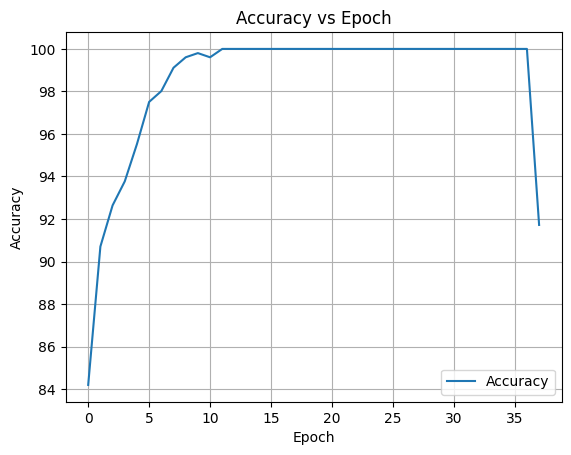

RT Threhold =  0.7834

Retraining Model in Progress...
Early stopping...


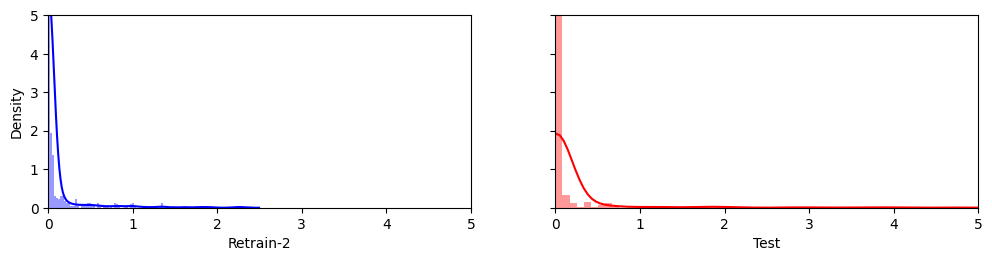

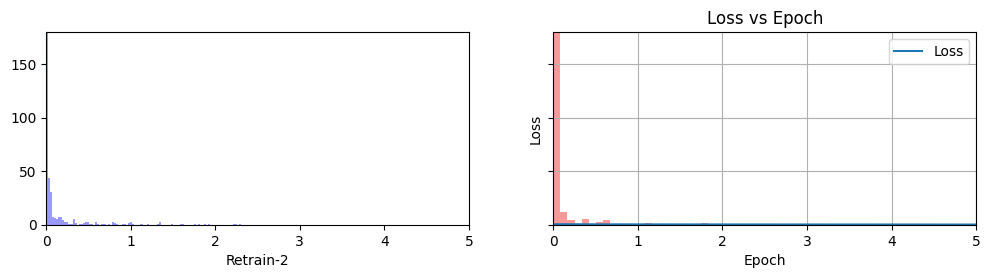

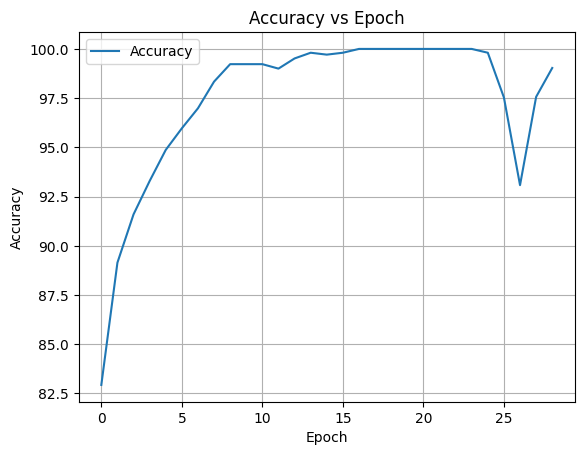

RT Threhold =  0.8353
19
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


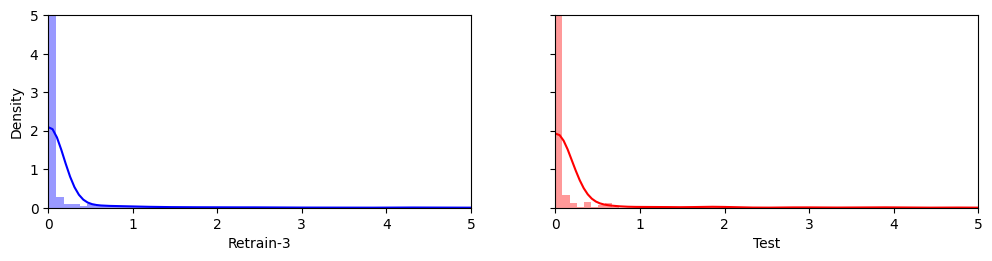

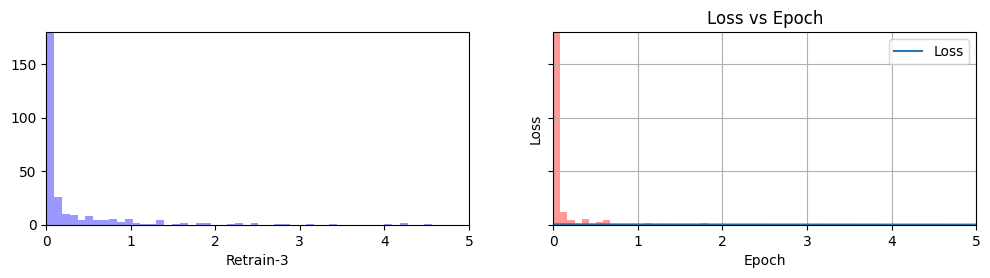

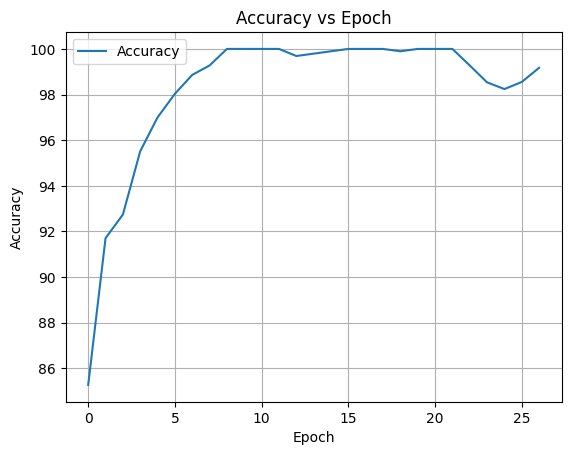

Train Threhold =  0.2069

Retraining Model in Progress...
Early stopping...


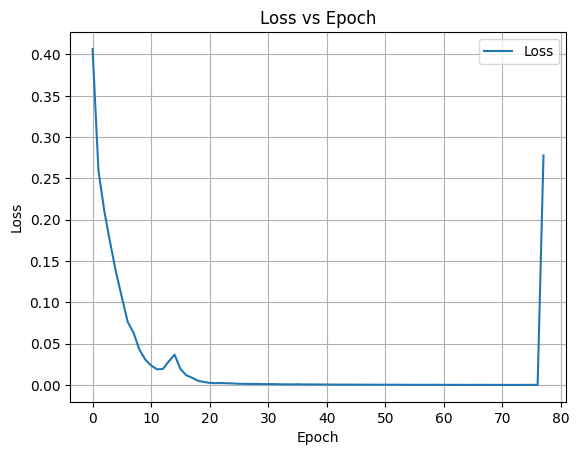

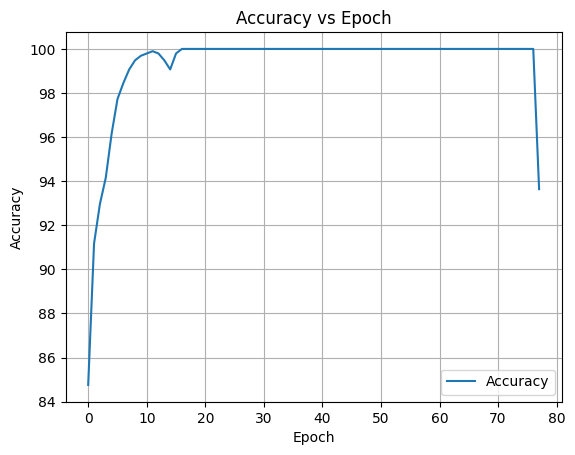

RT Threhold =  0.7001

Retraining Model in Progress...
Early stopping...


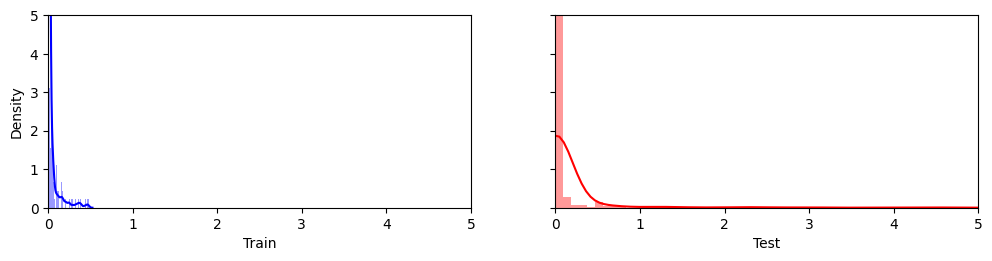

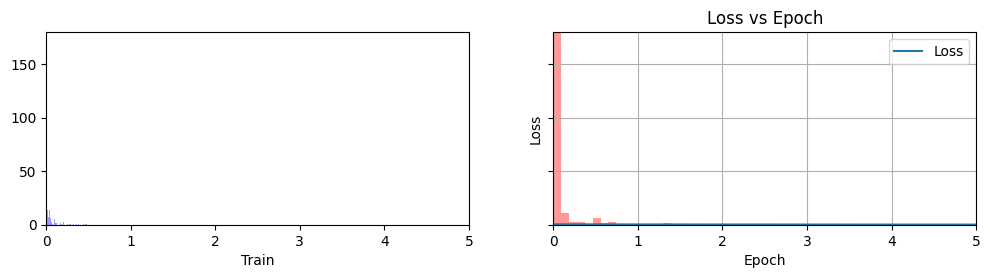

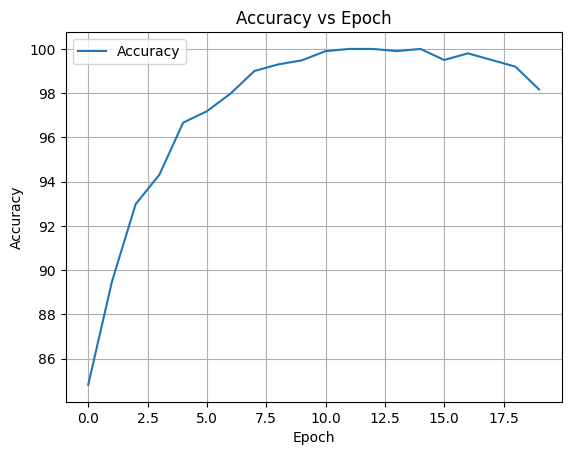

RT Threhold =  0.6571
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


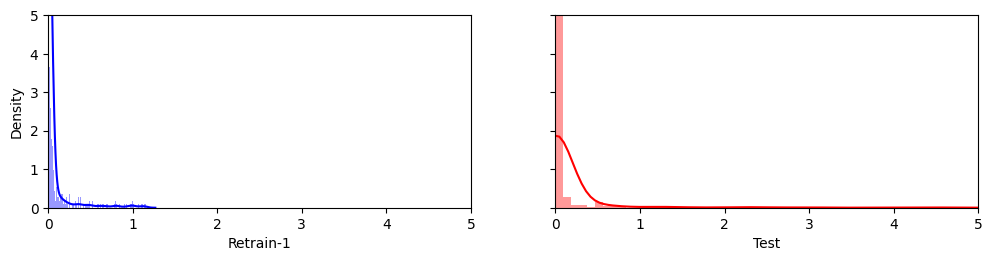

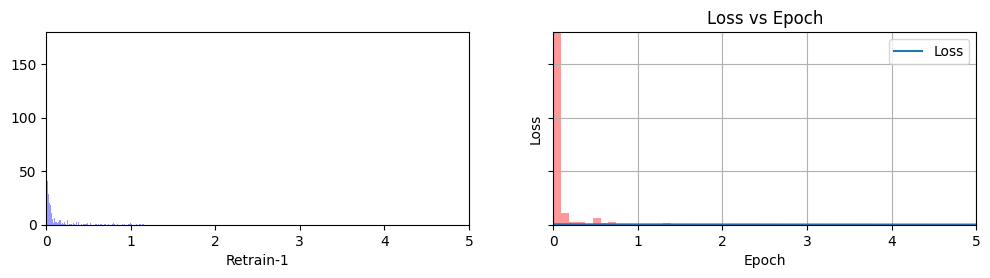

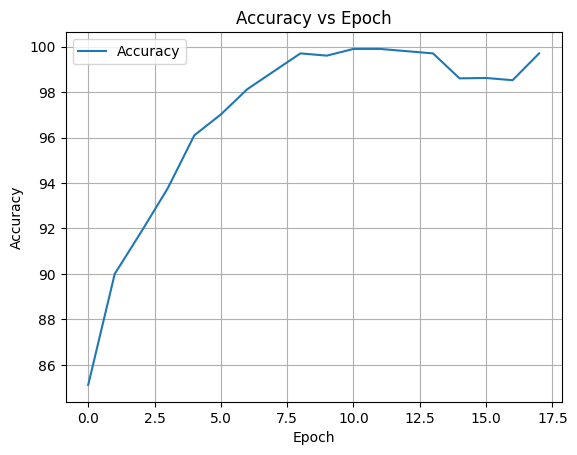

RT Threhold =  0.538

Retraining Model in Progress...
Early stopping...


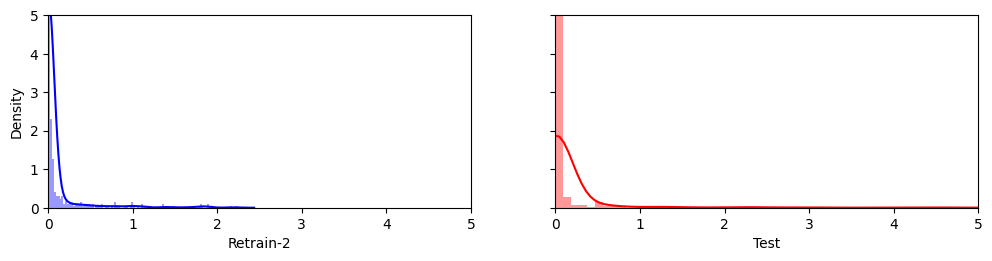

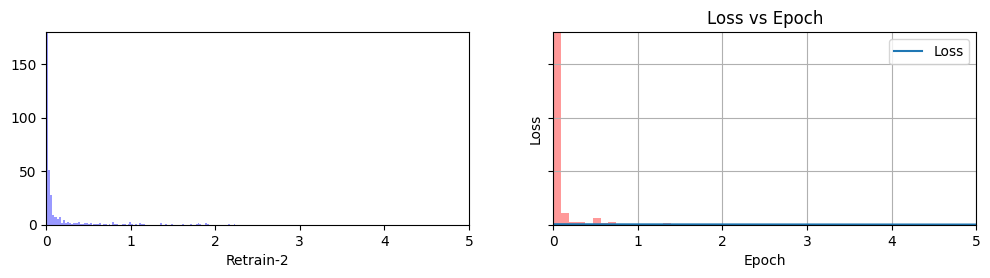

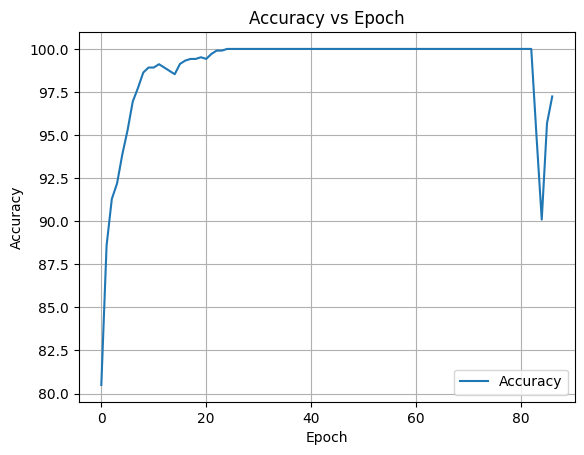

RT Threhold =  0.3292
20
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


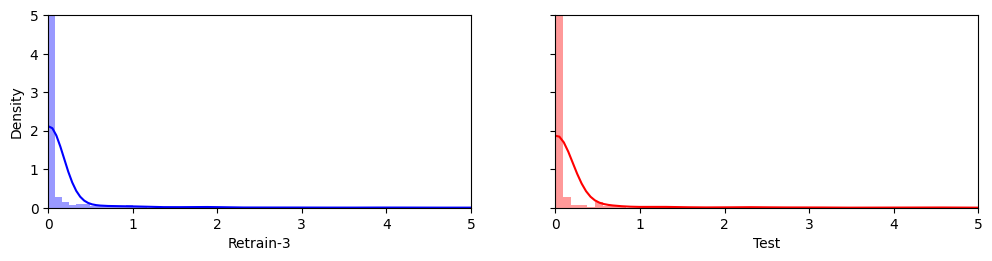

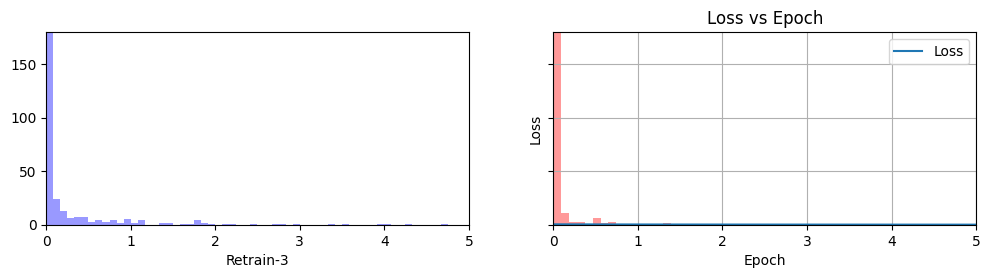

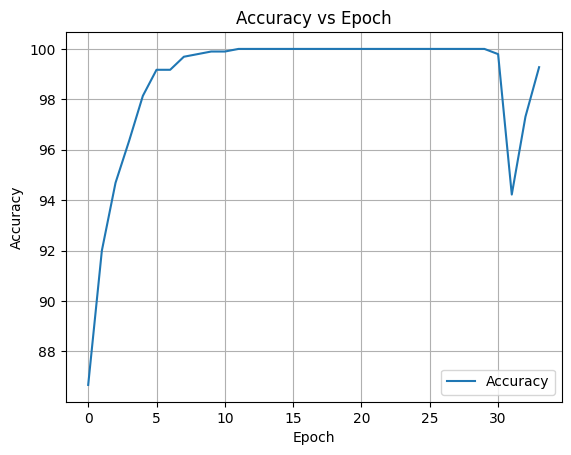

Train Threhold =  0.5857

Retraining Model in Progress...
Early stopping...


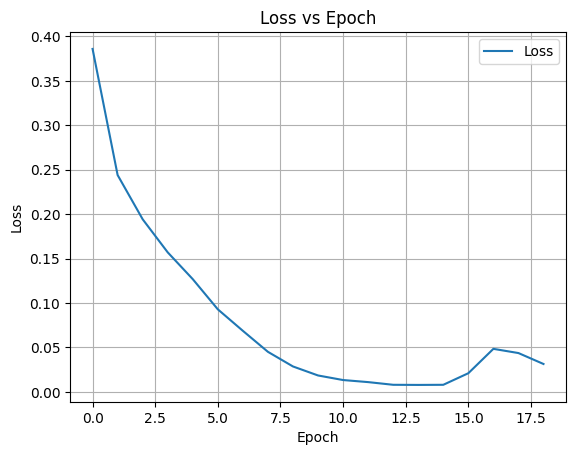

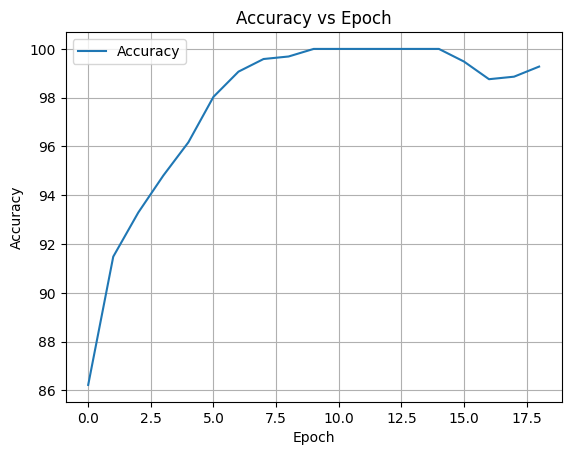

RT Threhold =  0.7443

Retraining Model in Progress...
Early stopping...


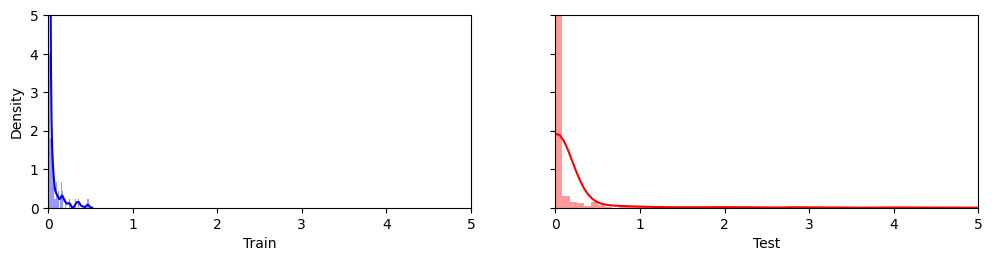

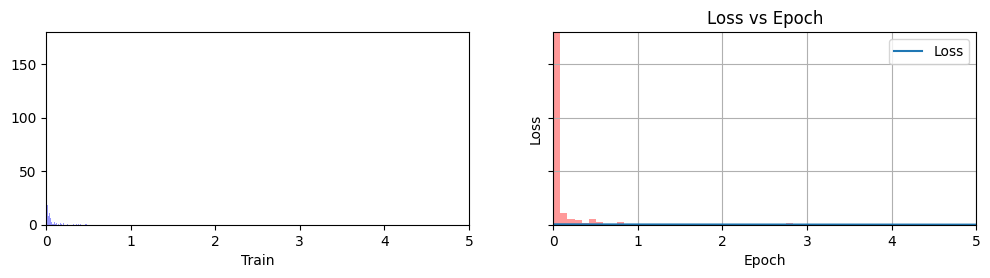

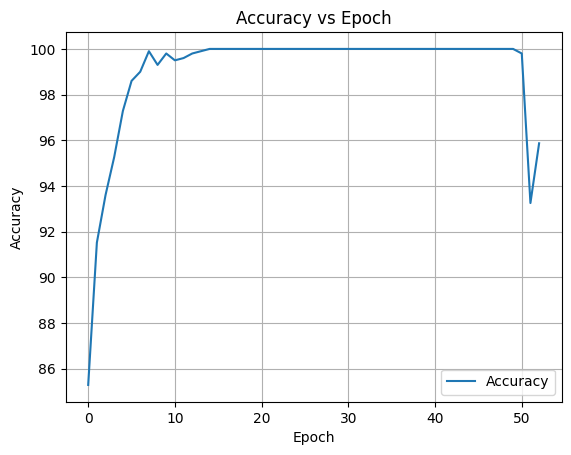

RT Threhold =  0.4725
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


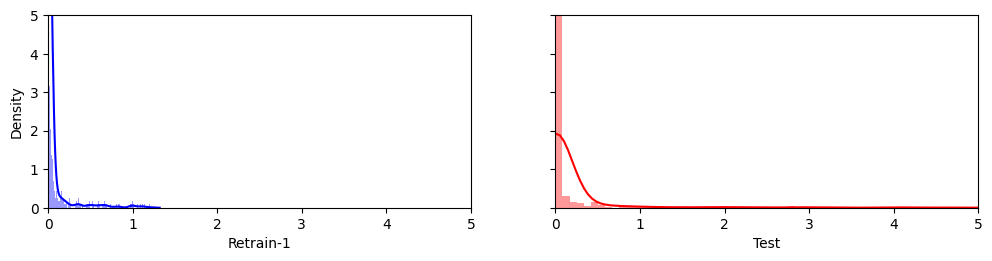

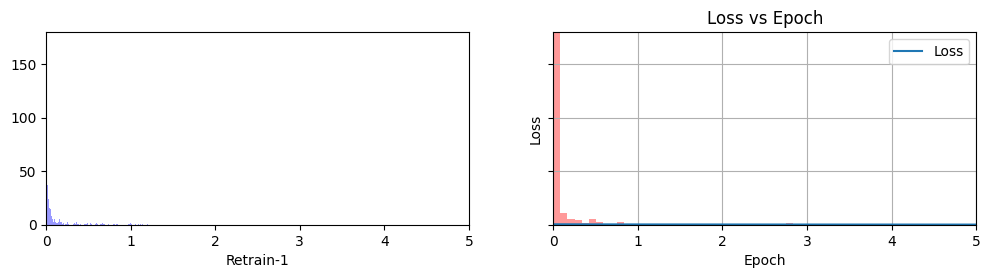

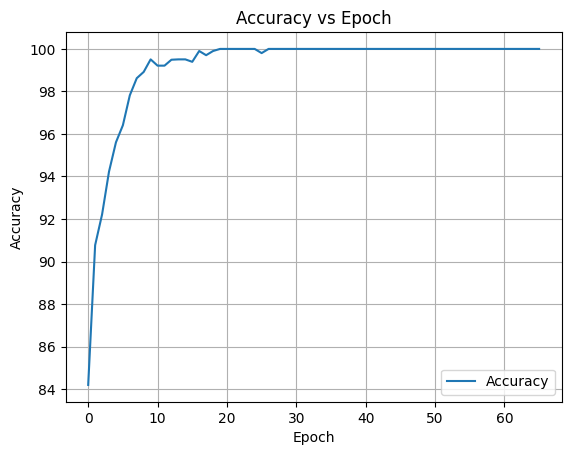

RT Threhold =  0.187

Retraining Model in Progress...
Early stopping...


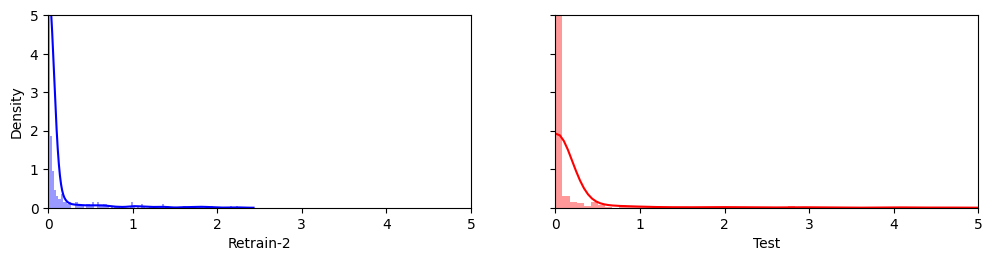

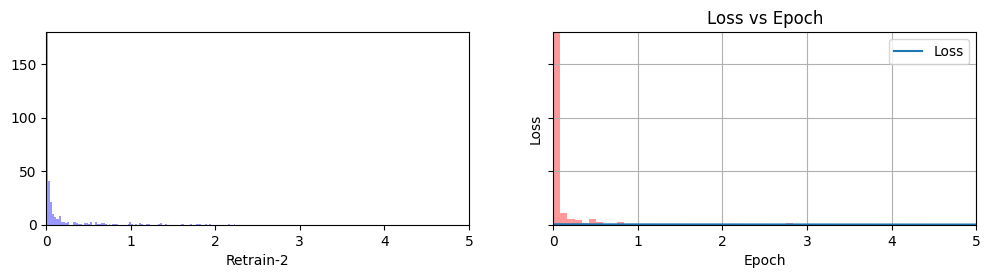

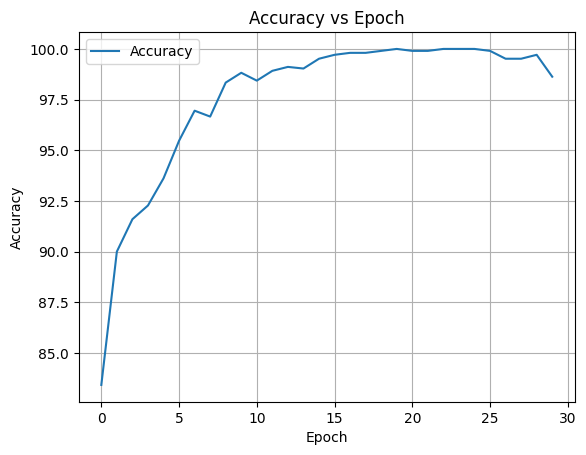

RT Threhold =  0.6297
21
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


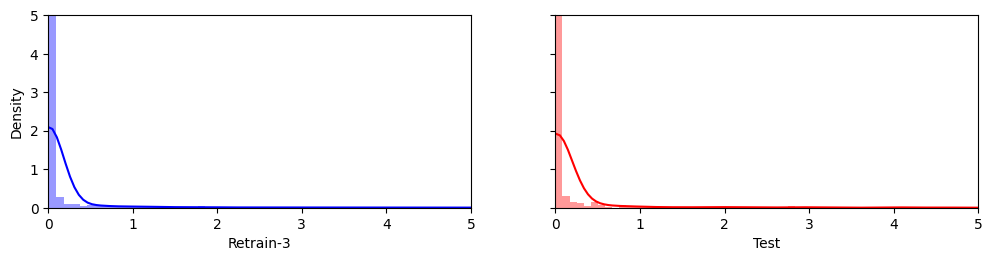

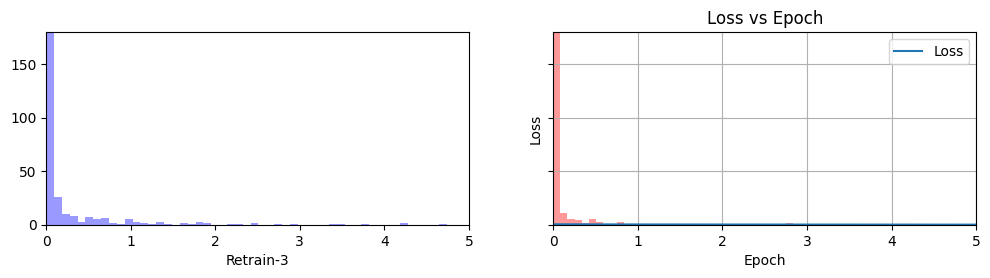

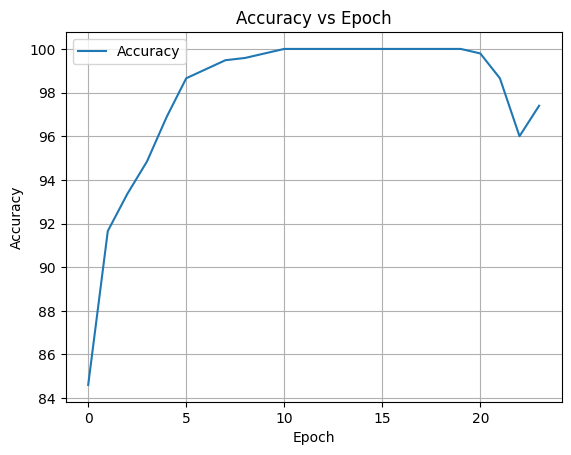

Train Threhold =  0.5377

Retraining Model in Progress...
Early stopping...


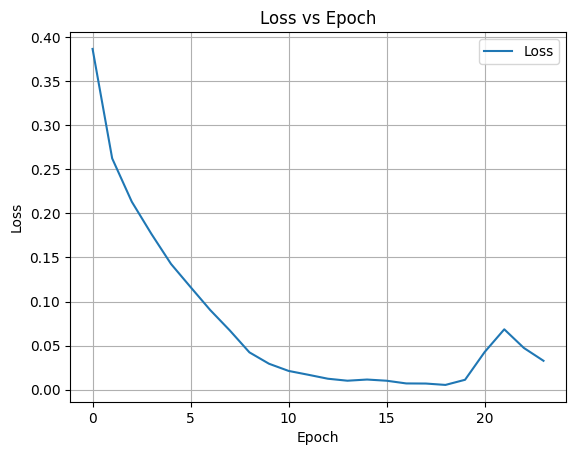

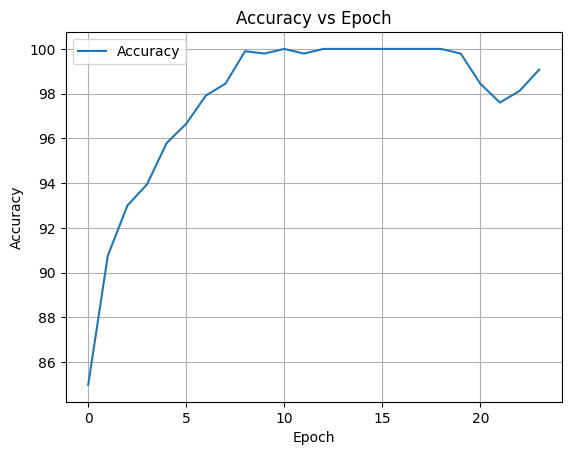

RT Threhold =  0.646

Retraining Model in Progress...
Early stopping...


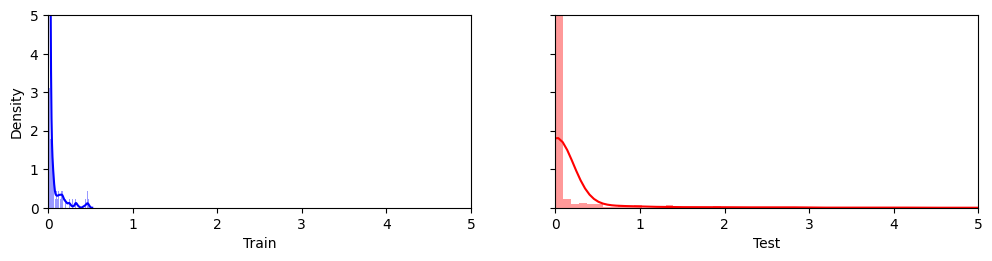

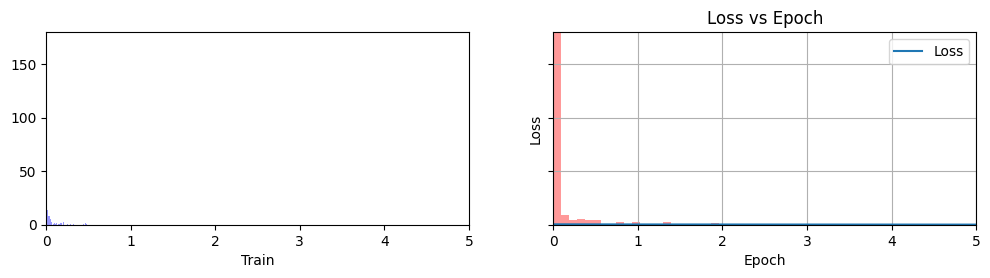

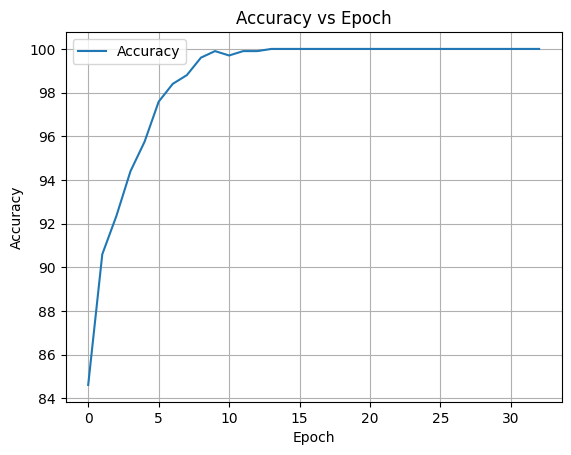

RT Threhold =  0.2159
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


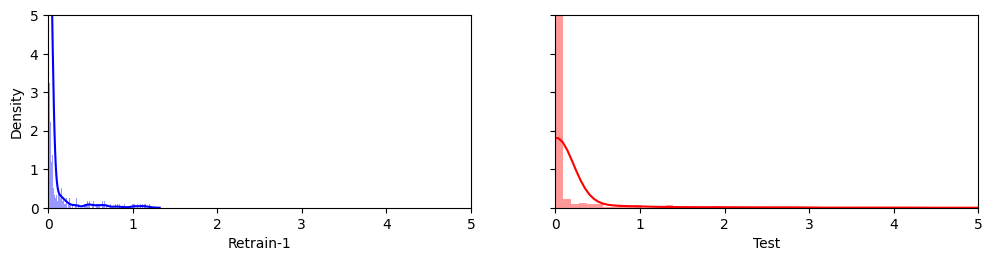

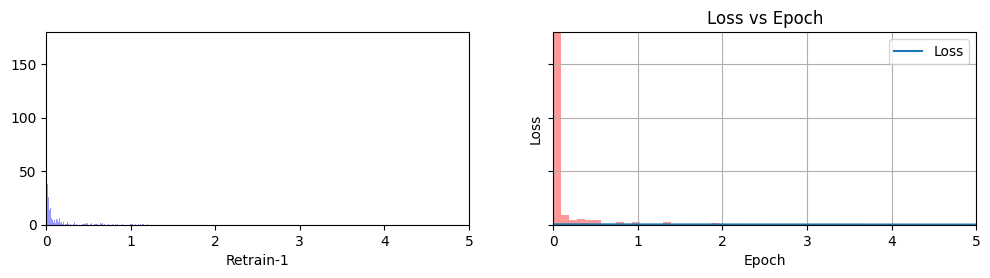

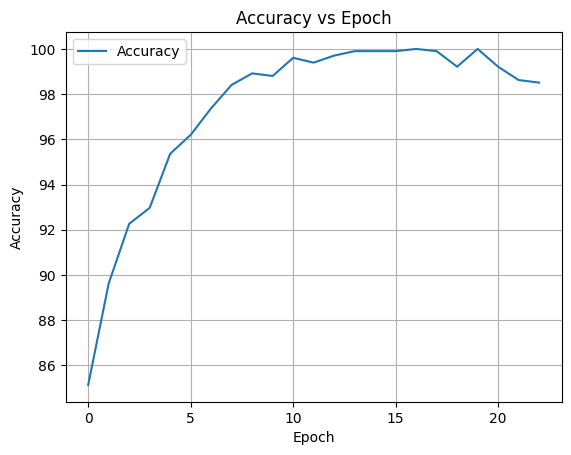

RT Threhold =  0.5471

Retraining Model in Progress...
Early stopping...


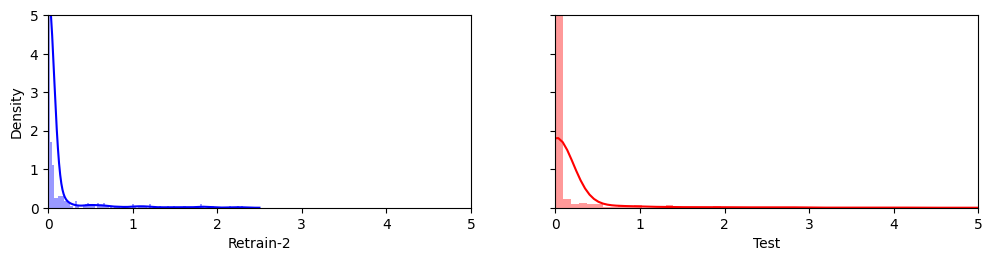

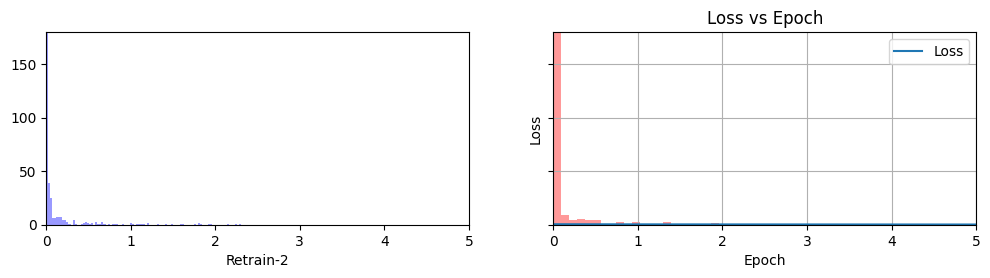

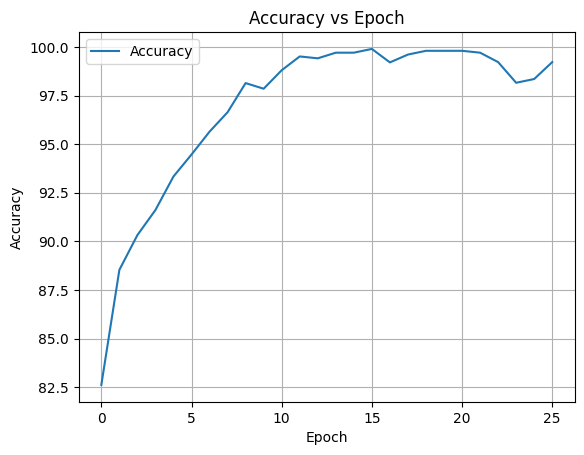

RT Threhold =  0.2723
22
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


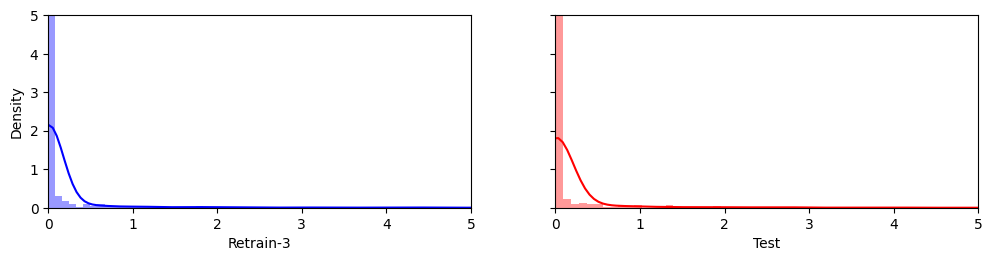

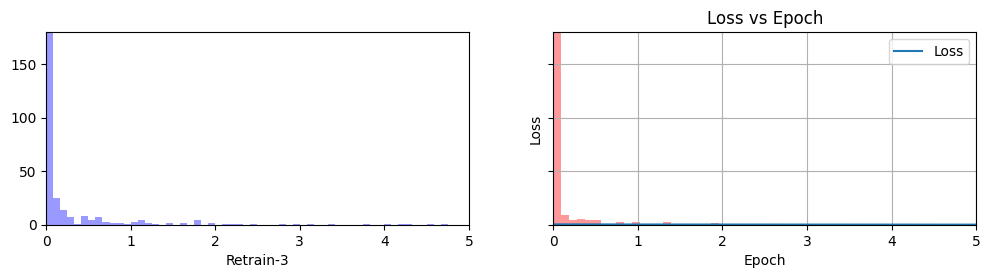

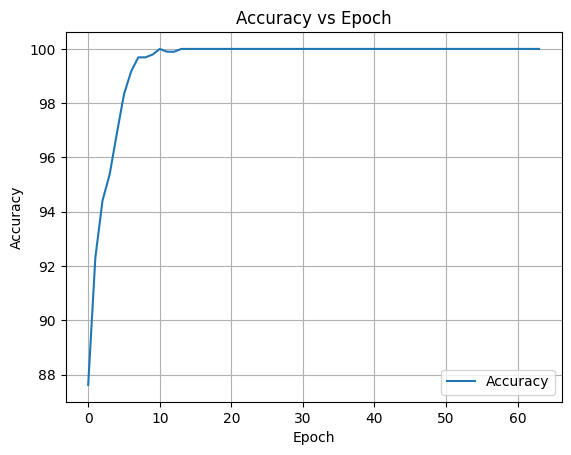

Train Threhold =  0.408

Retraining Model in Progress...
Early stopping...


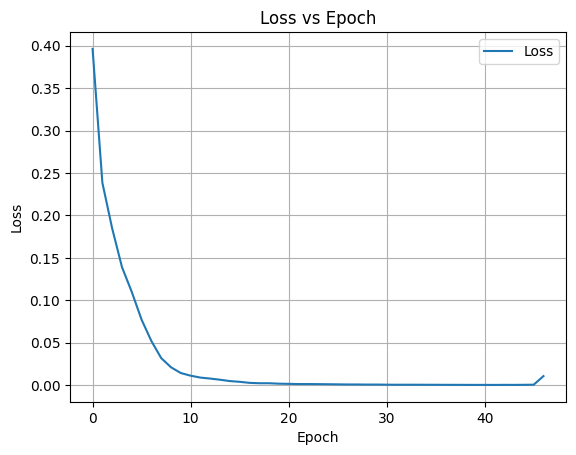

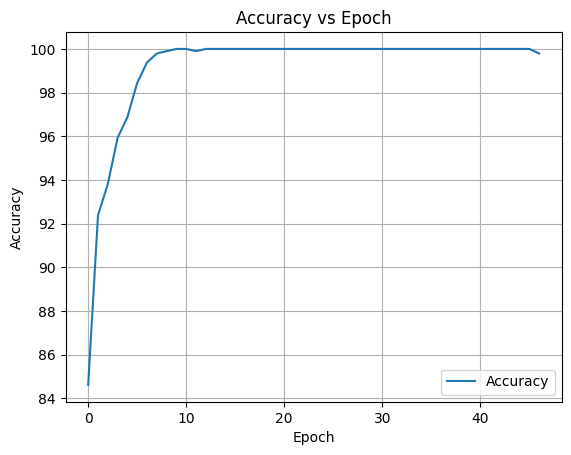

RT Threhold =  0.9023

Retraining Model in Progress...
Early stopping...


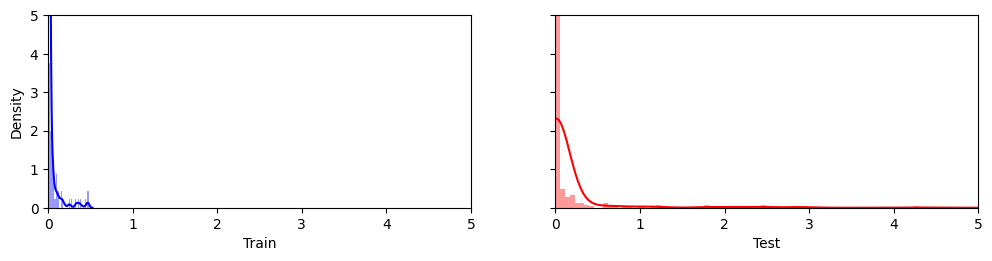

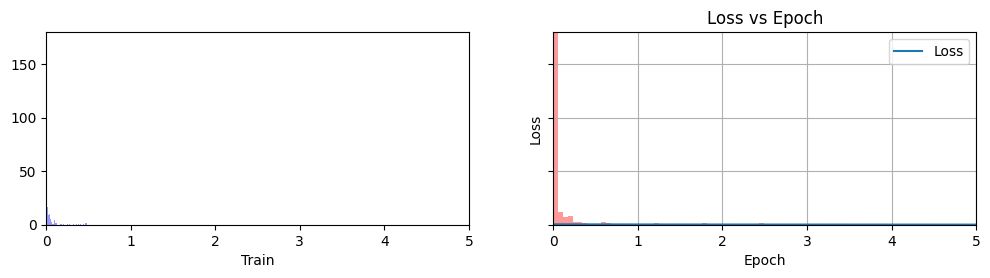

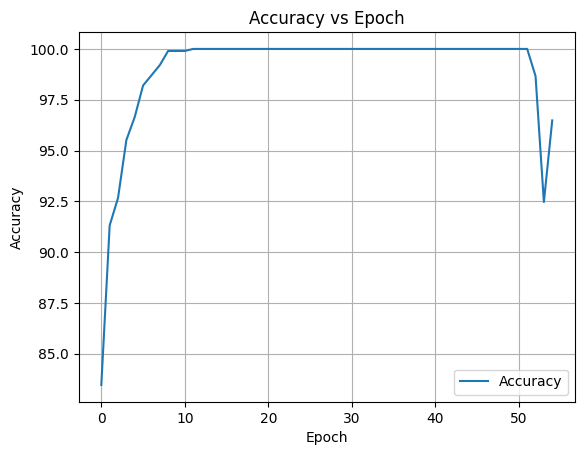

RT Threhold =  0.3695
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...


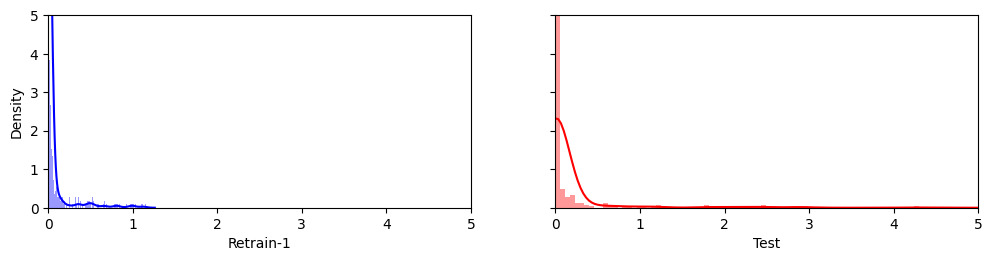

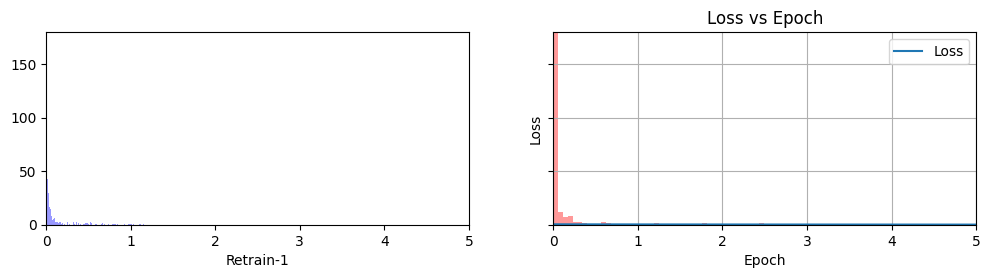

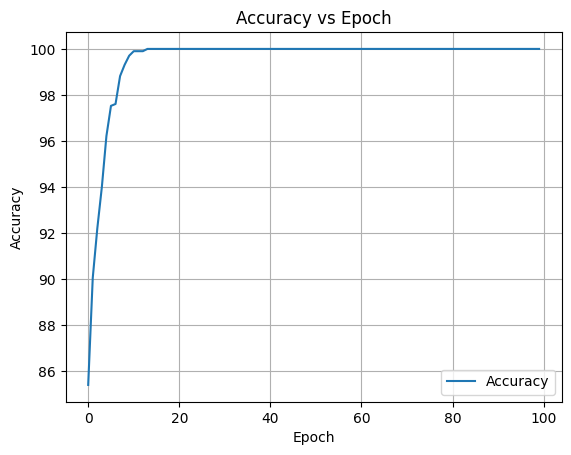

RT Threhold =  0.5544

Retraining Model in Progress...
Early stopping...


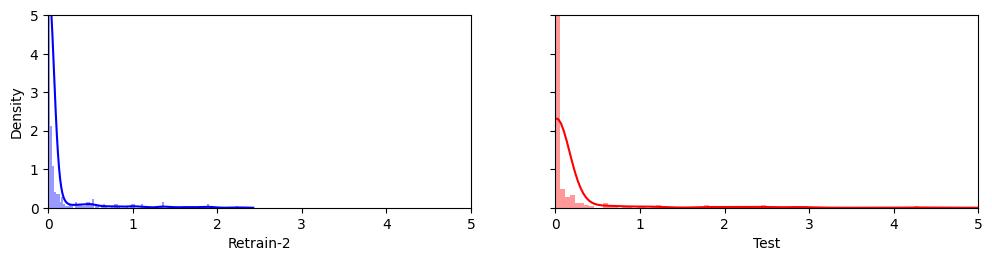

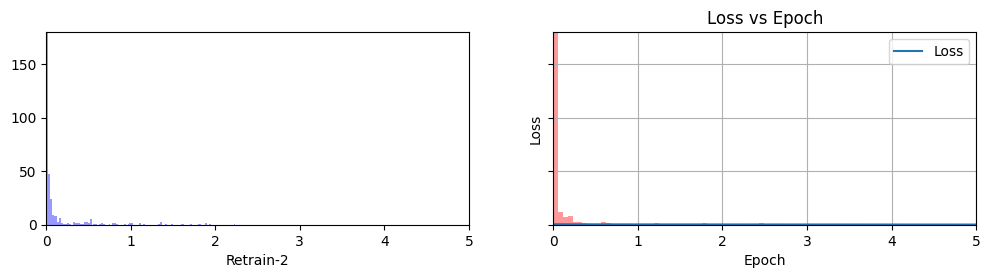

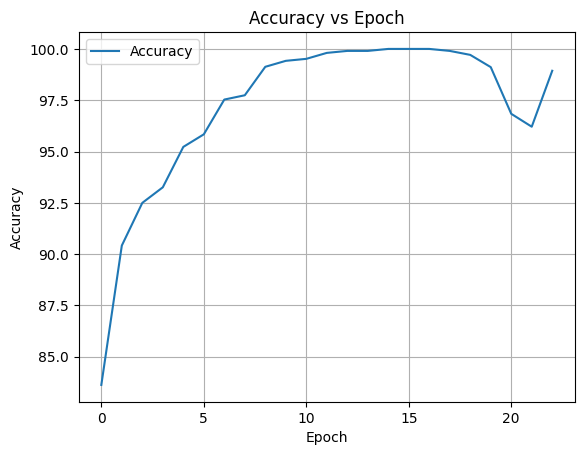

RT Threhold =  0.543
23
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


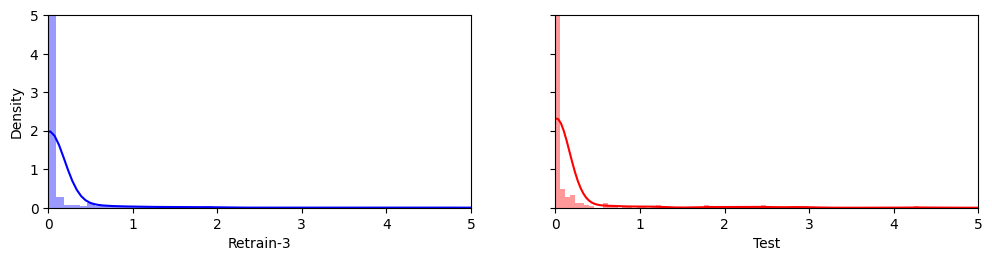

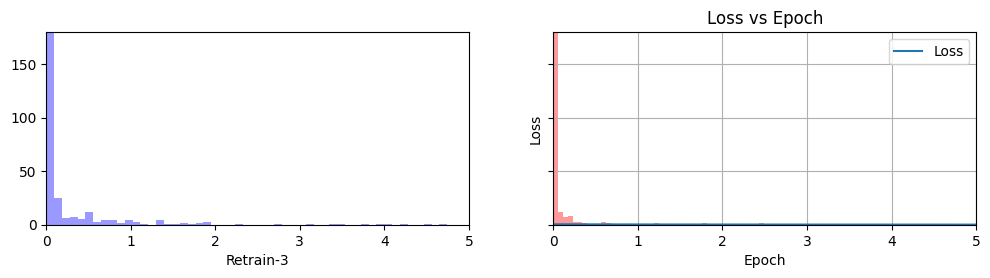

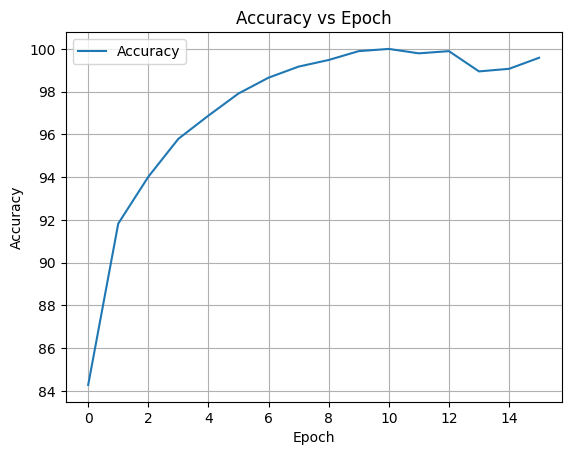

Train Threhold =  0.1787

Retraining Model in Progress...
Early stopping...


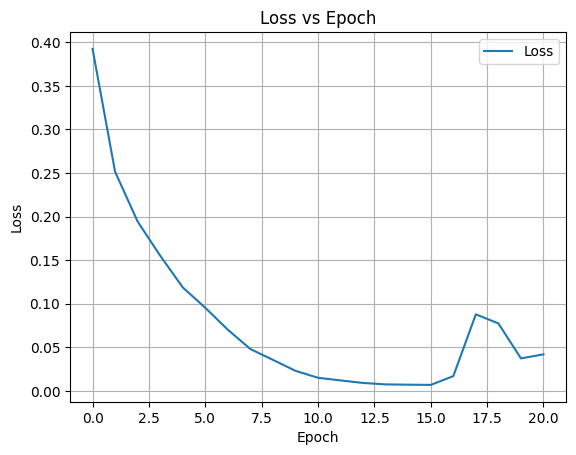

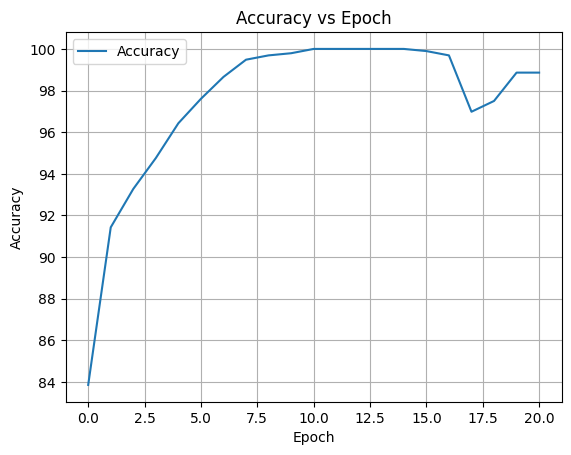

RT Threhold =  0.4129

Retraining Model in Progress...
Early stopping...


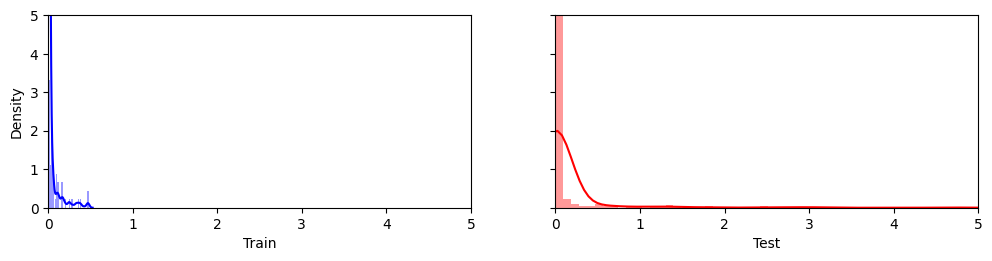

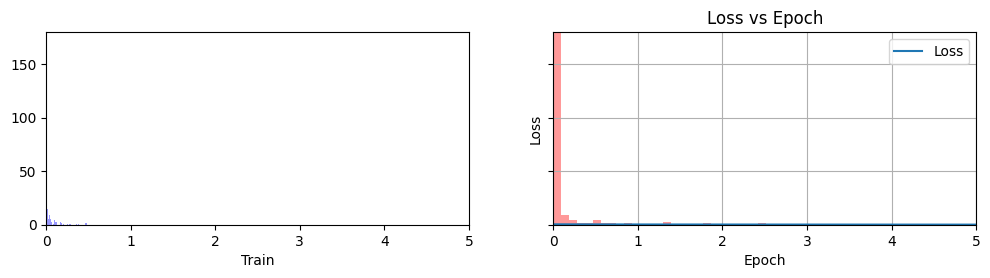

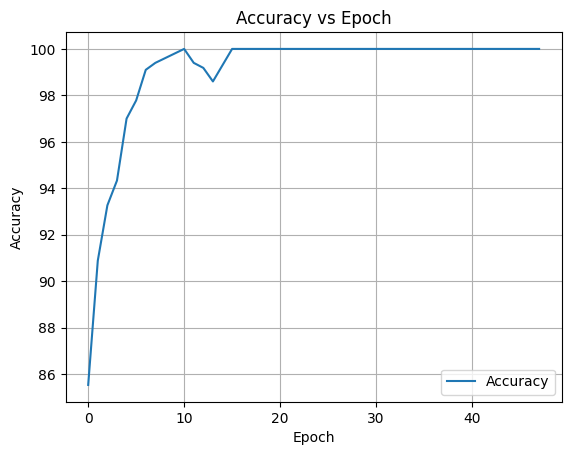

RT Threhold =  0.3183
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


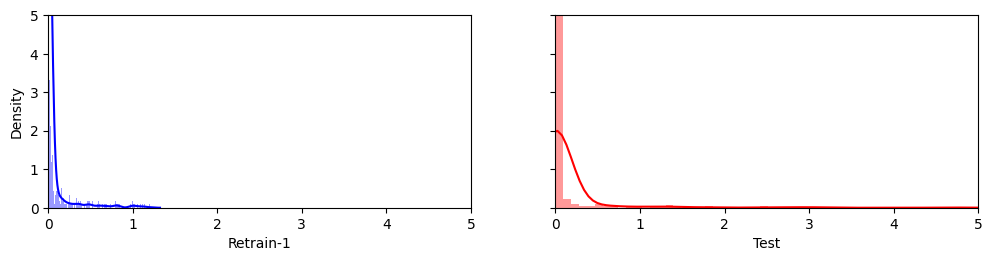

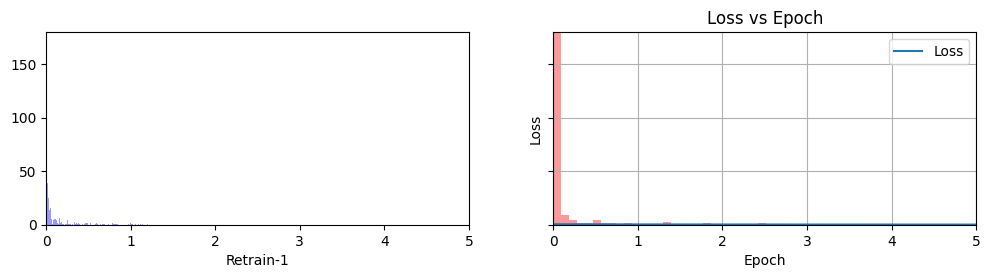

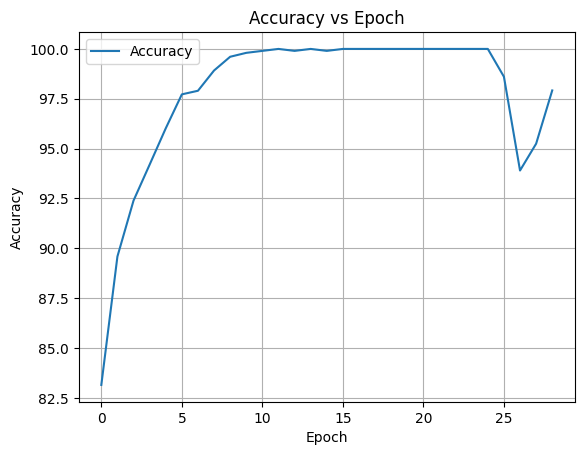

RT Threhold =  0.4108

Retraining Model in Progress...
Early stopping...


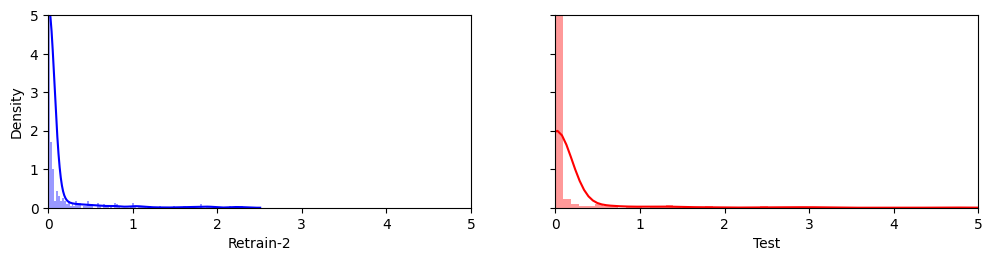

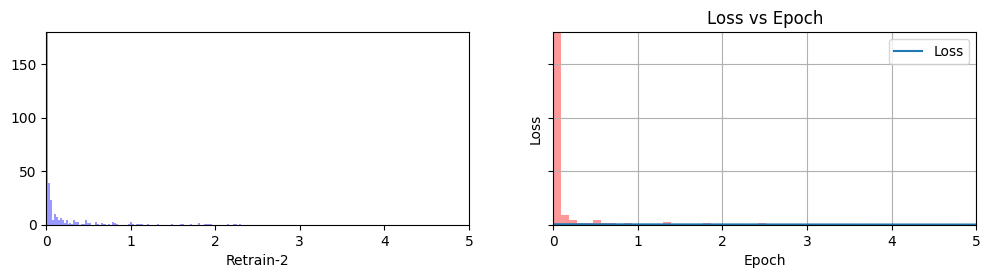

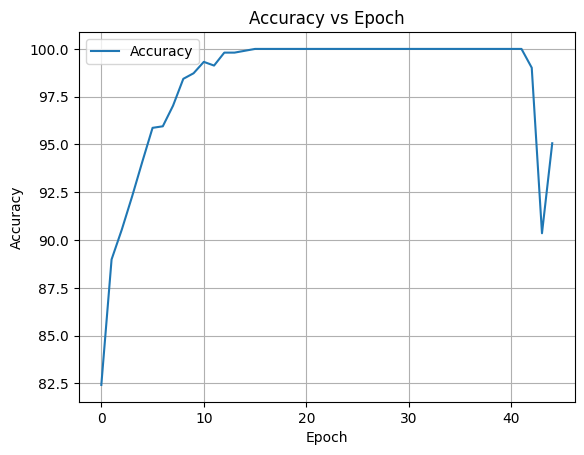

RT Threhold =  0.5246
24
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


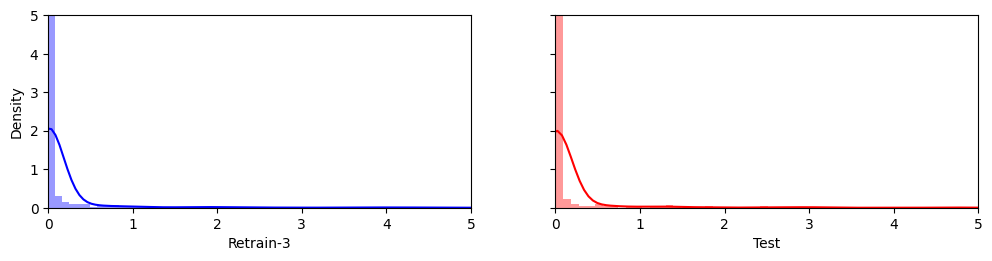

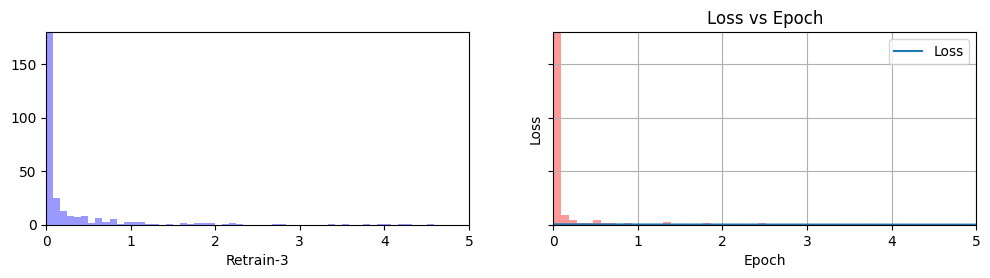

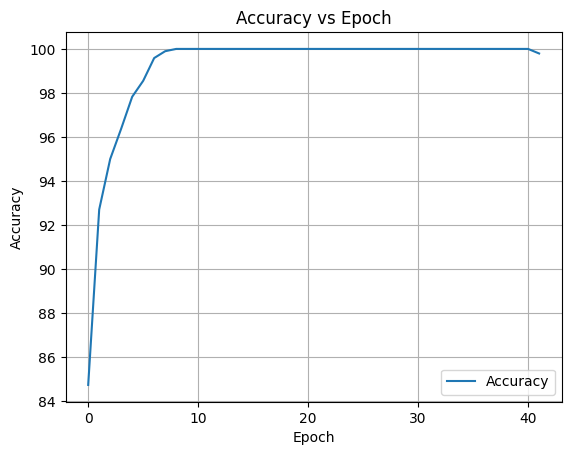

Train Threhold =  0.1197

Retraining Model in Progress...
Early stopping...


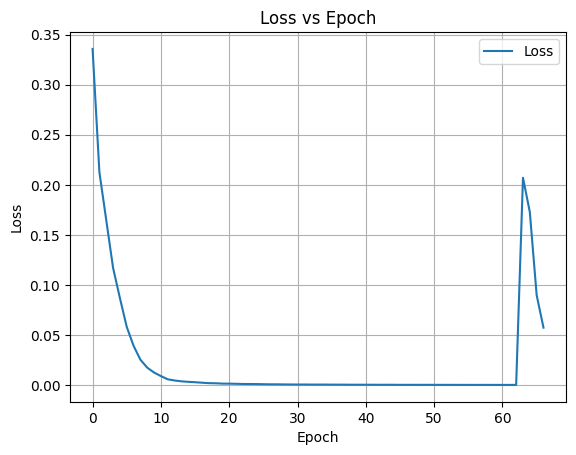

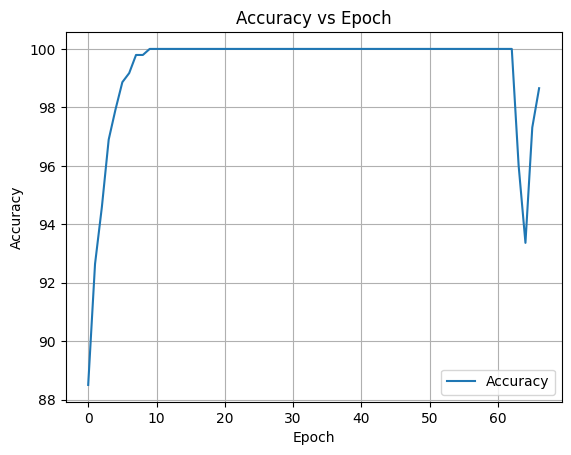

RT Threhold =  0.3469

Retraining Model in Progress...
Early stopping...


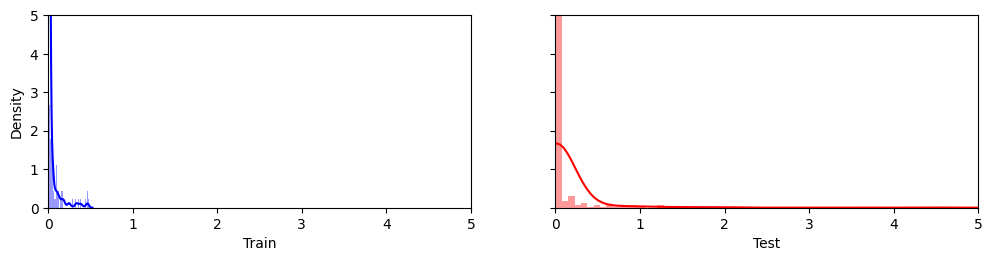

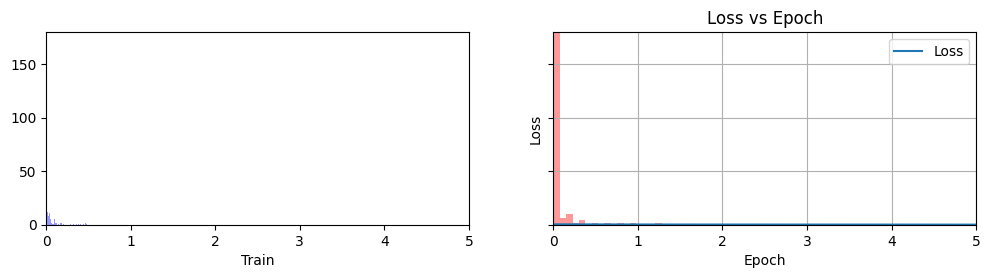

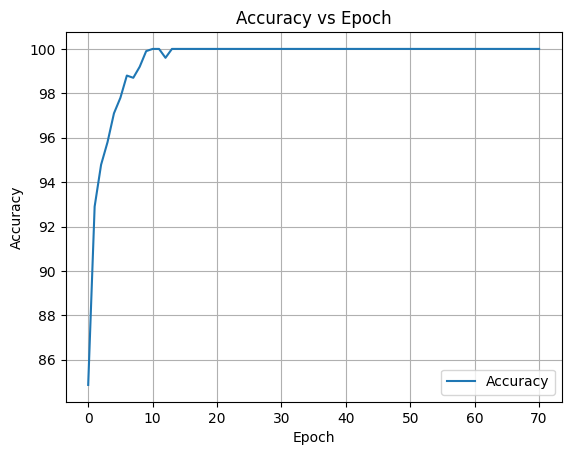

RT Threhold =  0.1893
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...


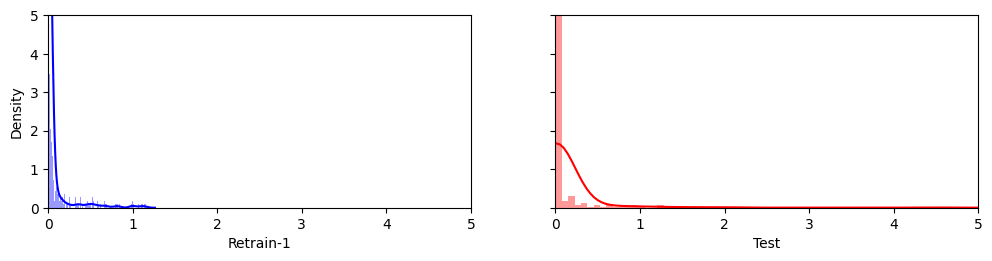

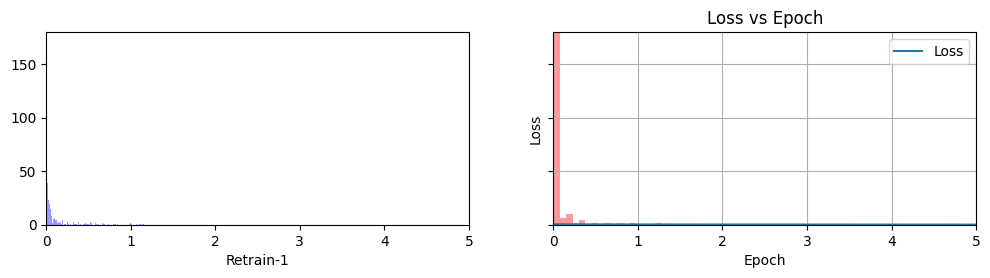

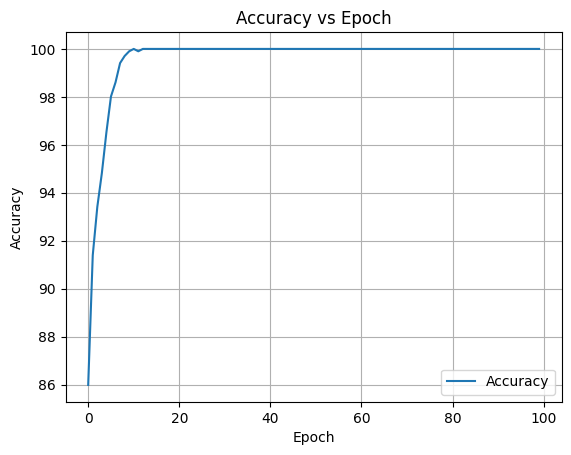

RT Threhold =  0.4771

Retraining Model in Progress...
Early stopping...


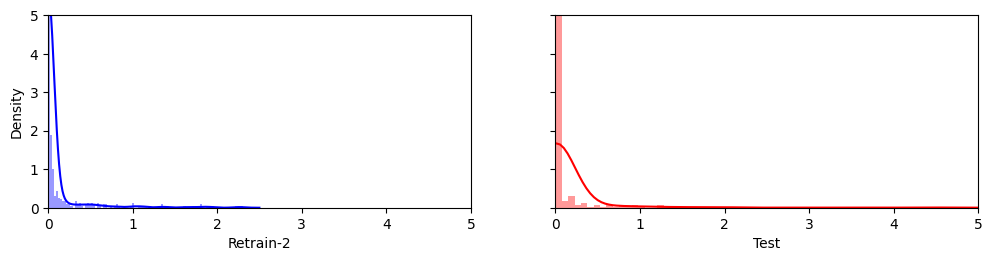

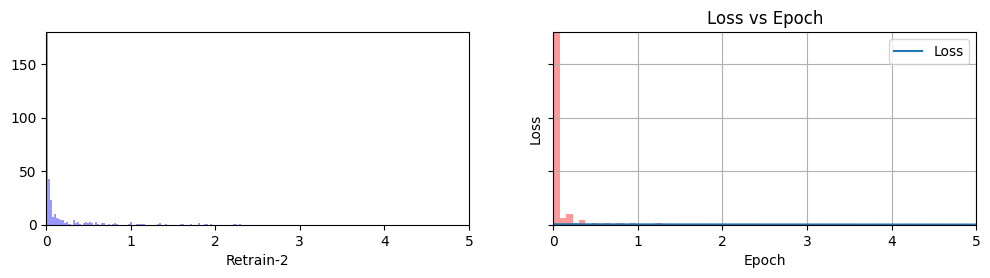

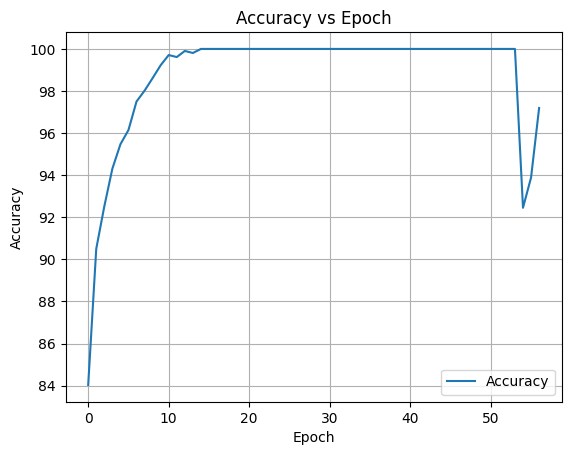

RT Threhold =  0.4643
25
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


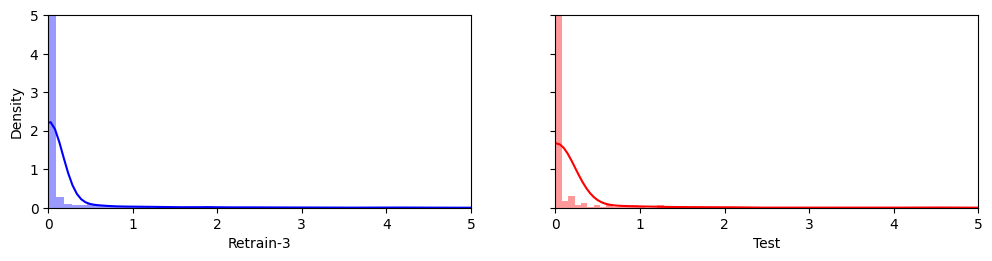

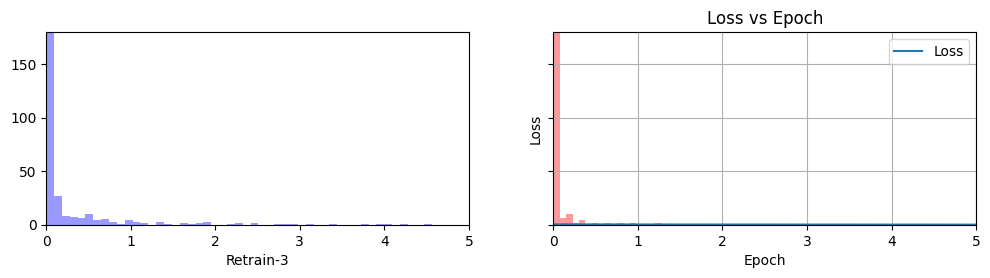

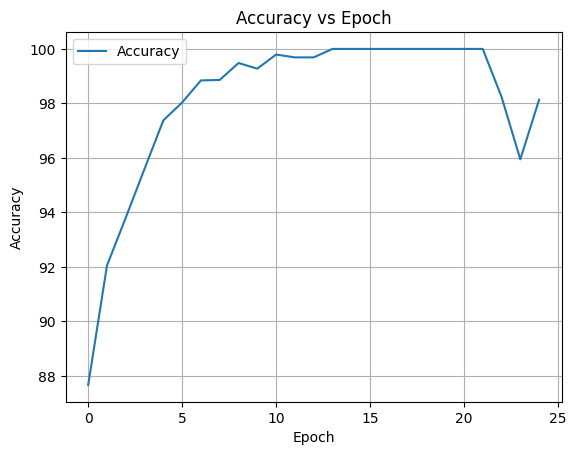

Train Threhold =  0.6989

Retraining Model in Progress...
Early stopping...


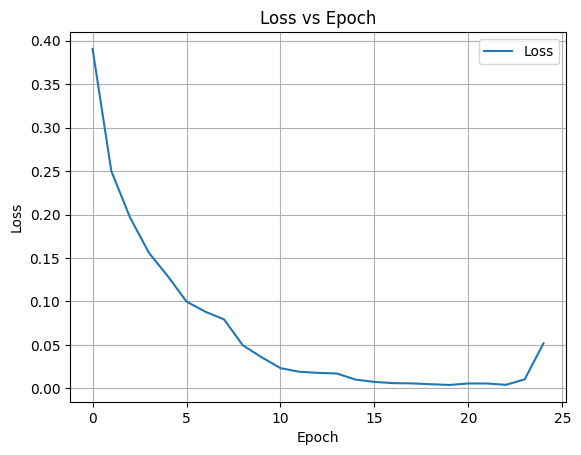

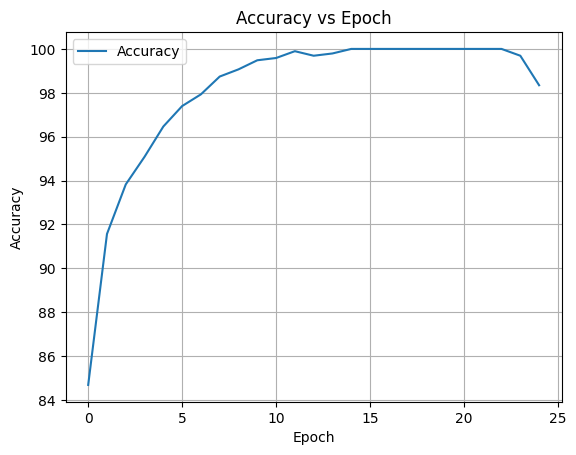

RT Threhold =  0.5029

Retraining Model in Progress...
Early stopping...


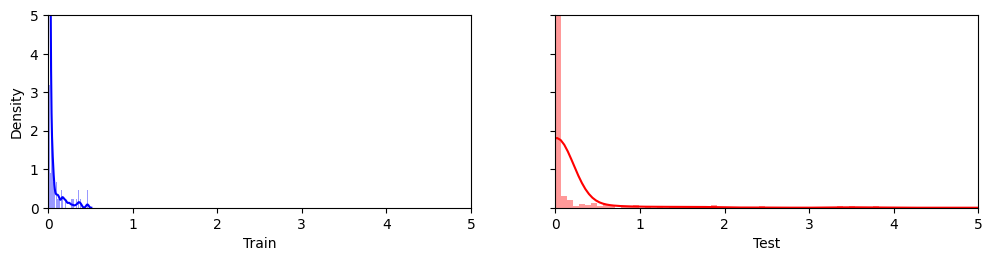

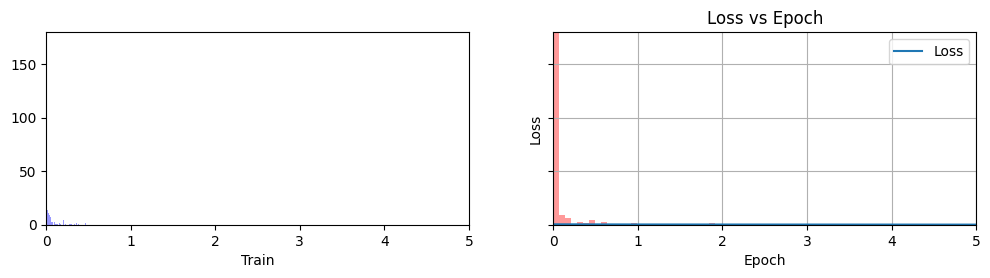

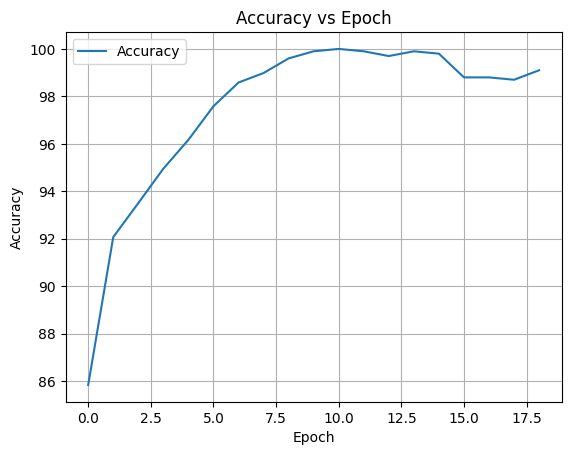

RT Threhold =  0.4217
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


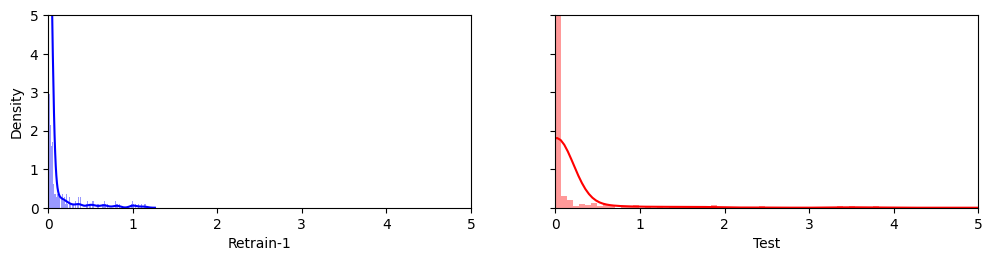

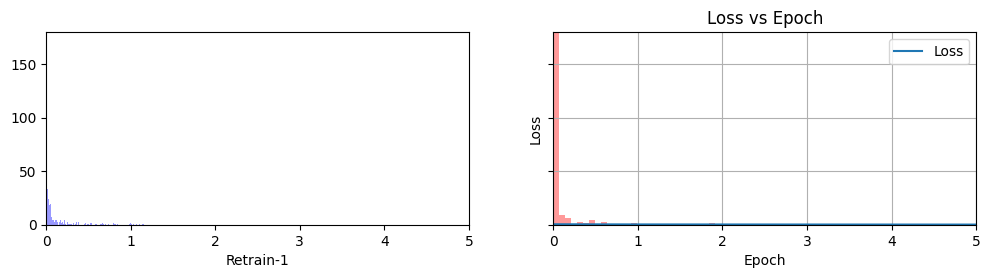

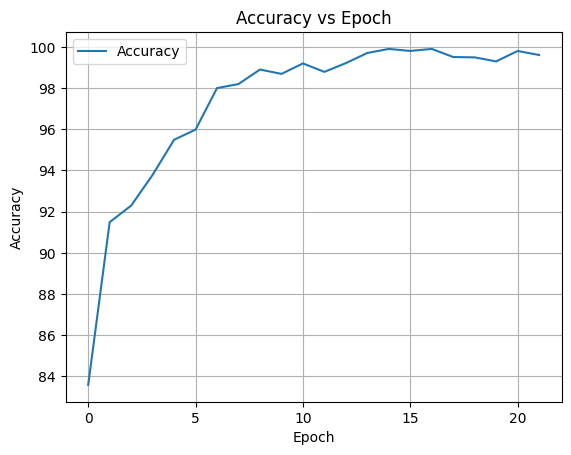

RT Threhold =  0.3891

Retraining Model in Progress...
Early stopping...


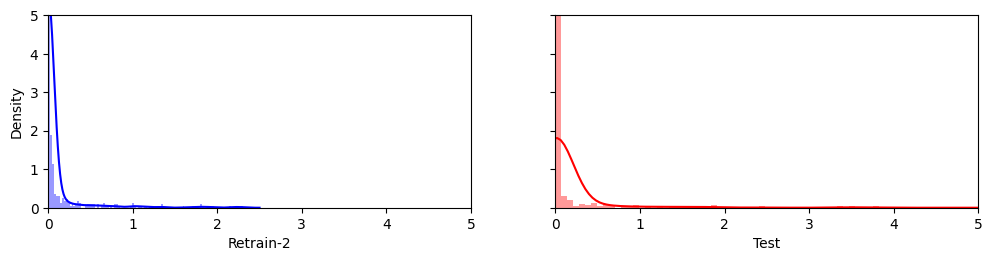

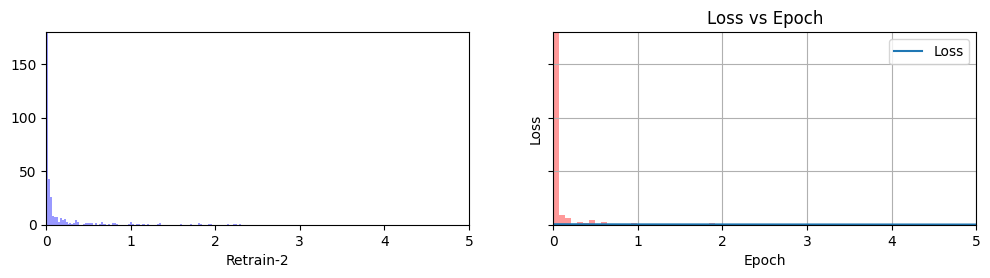

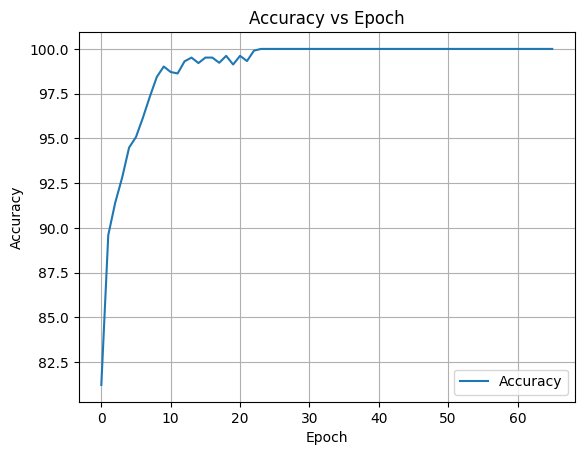

RT Threhold =  0.3563
26
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


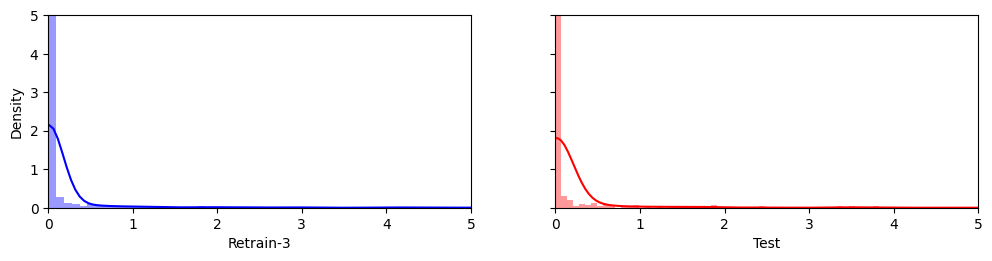

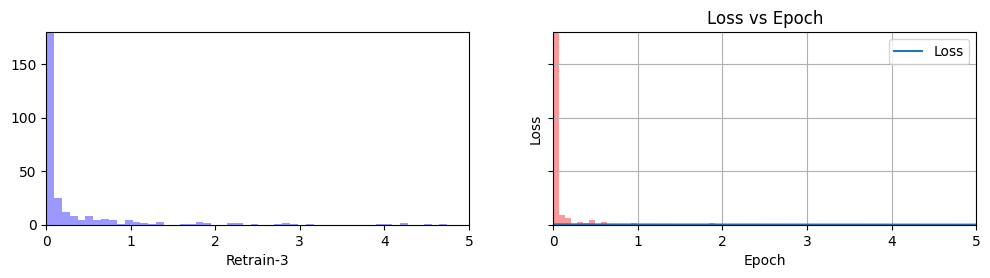

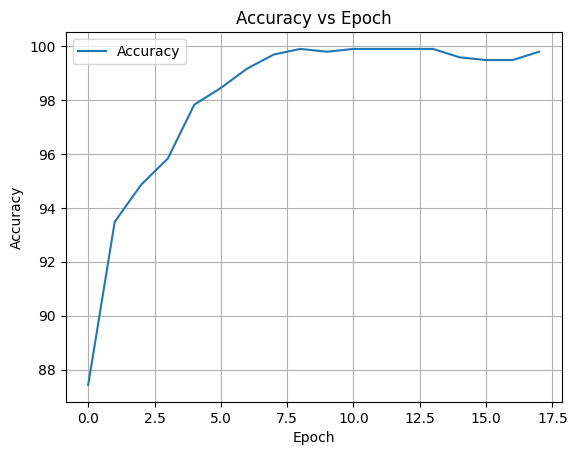

Train Threhold =  0.4575

Retraining Model in Progress...


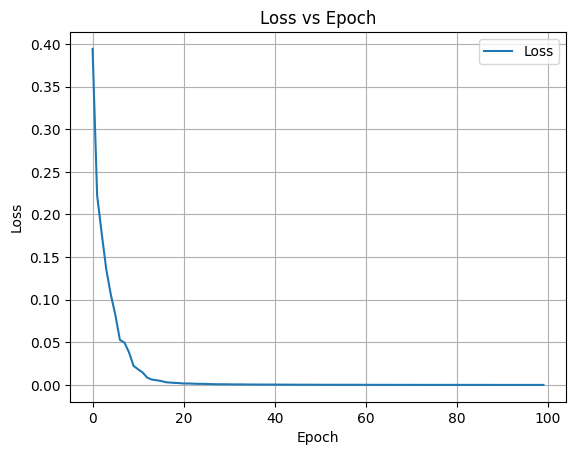

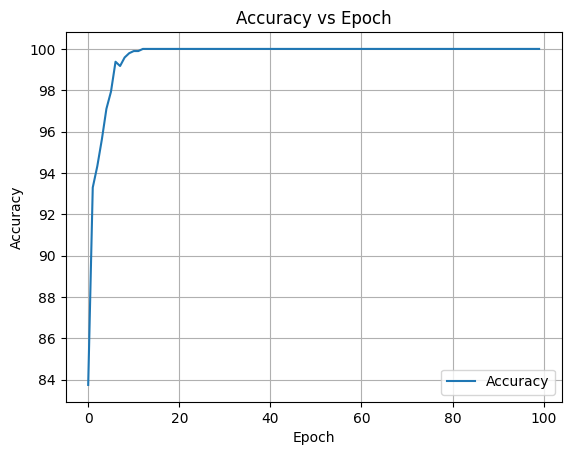

RT Threhold =  0.2757

Retraining Model in Progress...


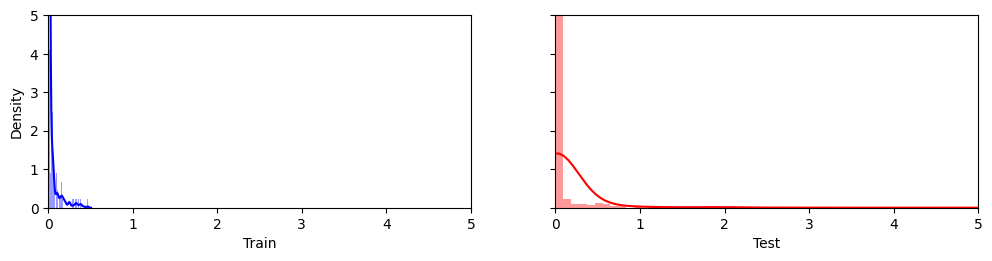

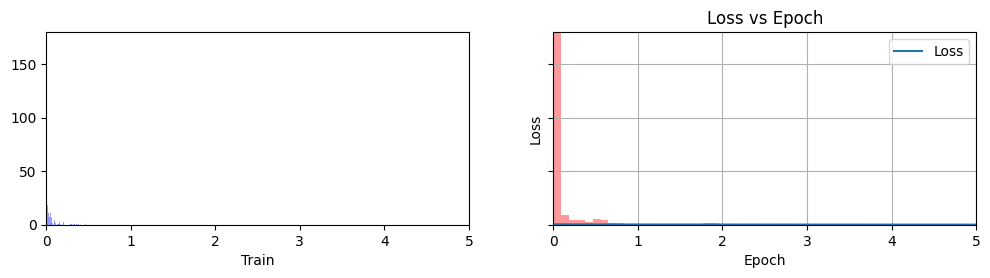

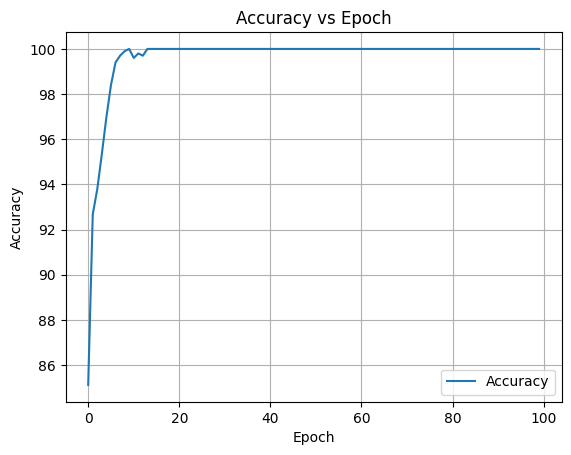

RT Threhold =  0.3679
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


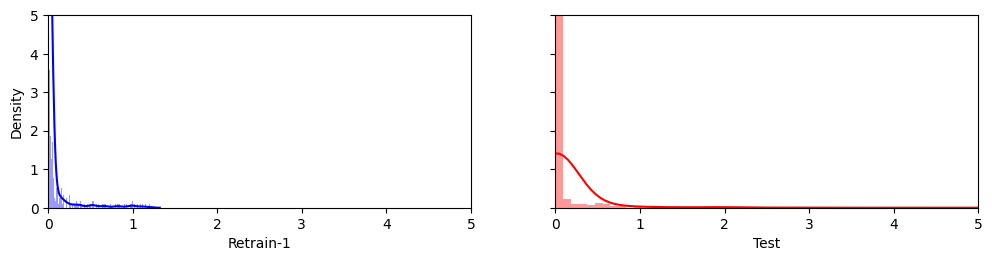

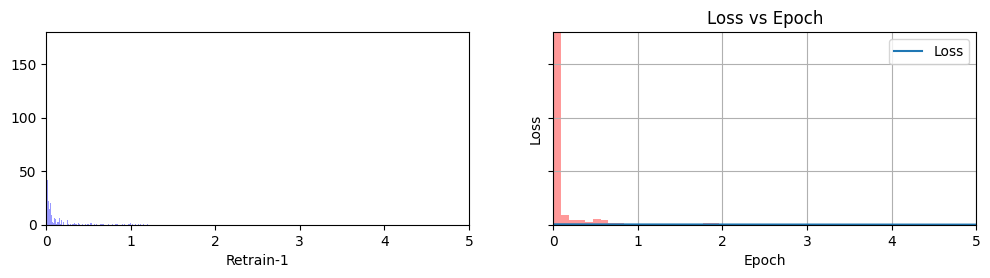

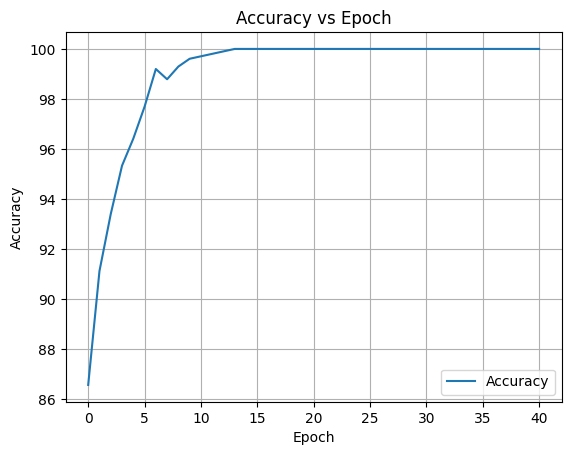

RT Threhold =  0.6657

Retraining Model in Progress...
Early stopping...


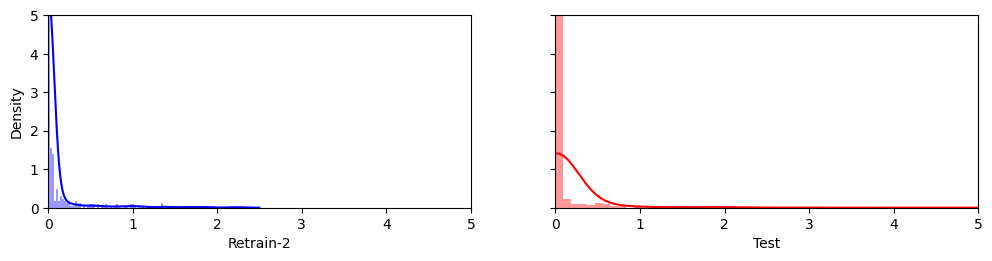

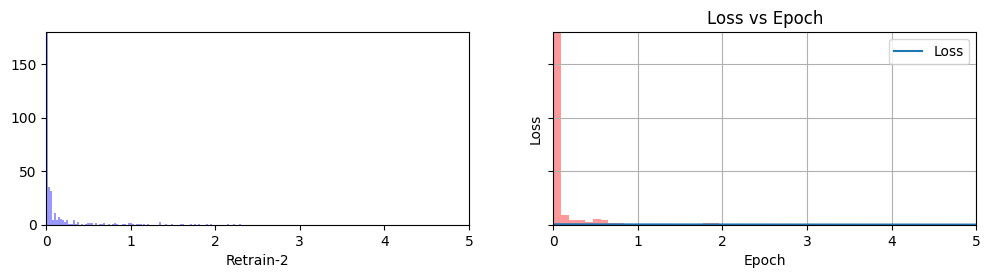

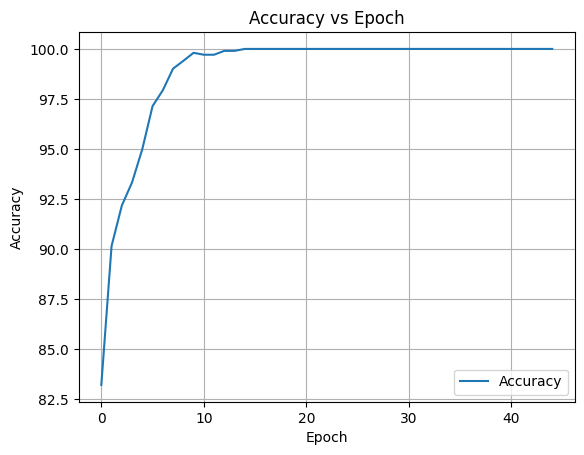

RT Threhold =  0.4942
27
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


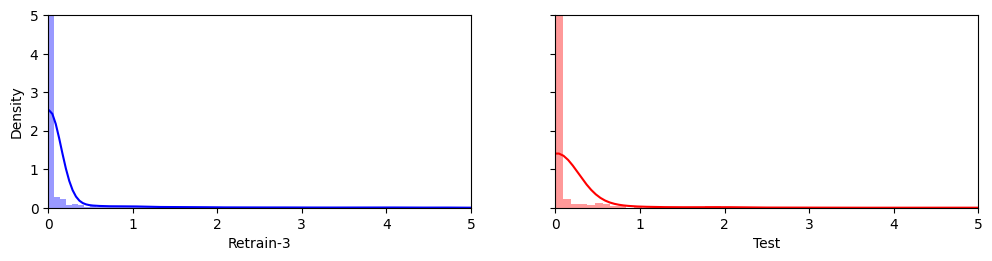

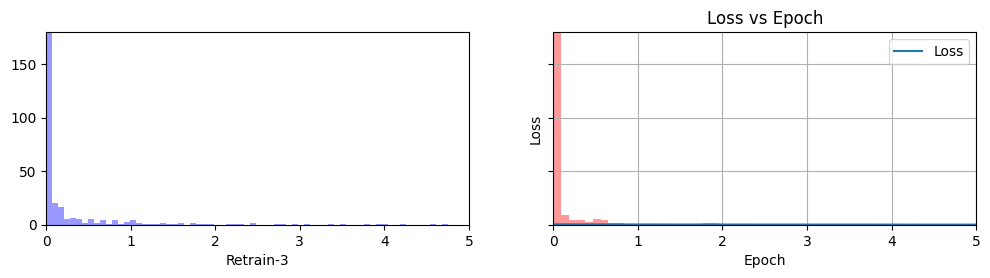

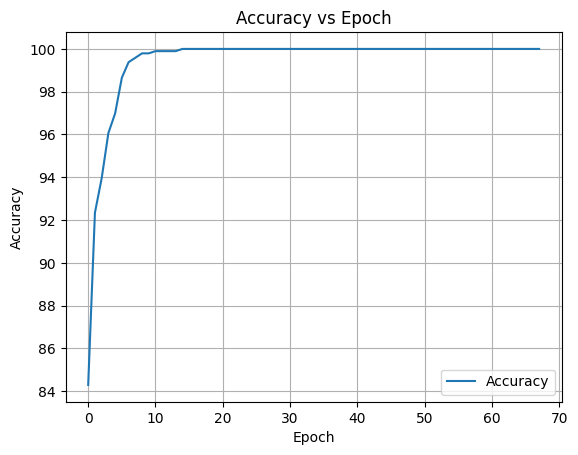

Train Threhold =  0.7165

Retraining Model in Progress...
Early stopping...


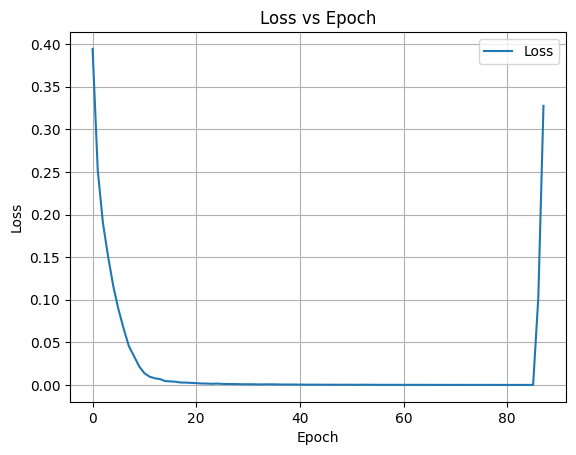

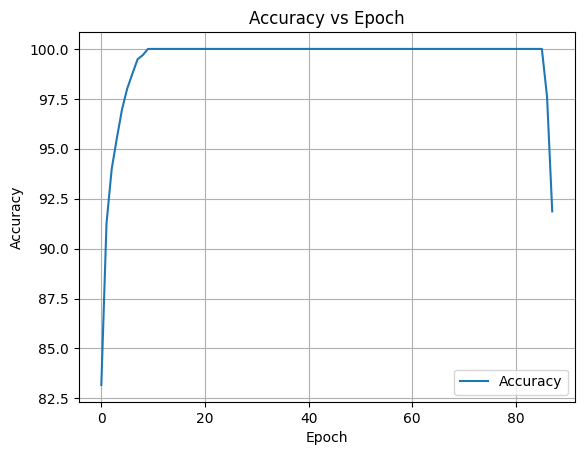

RT Threhold =  0.6324

Retraining Model in Progress...
Early stopping...


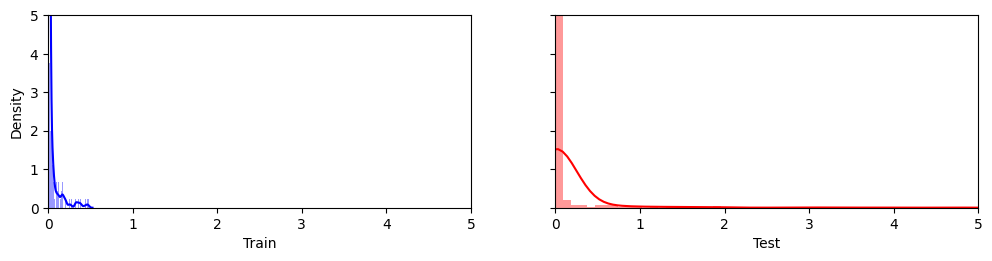

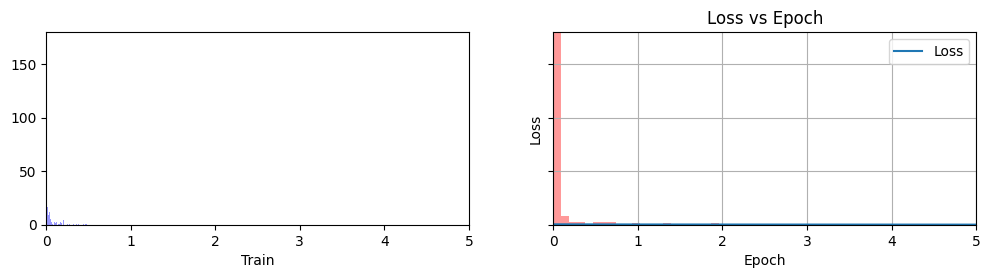

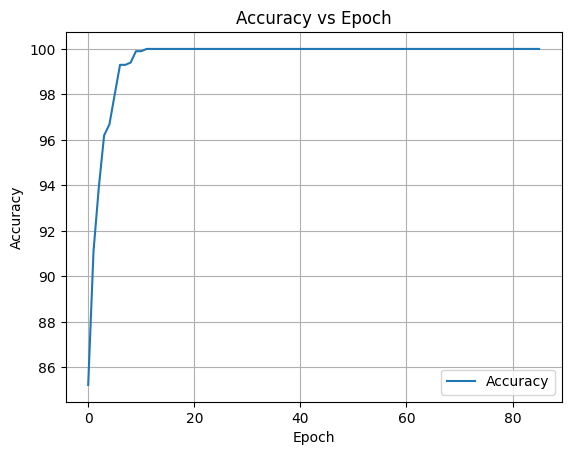

RT Threhold =  0.877
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


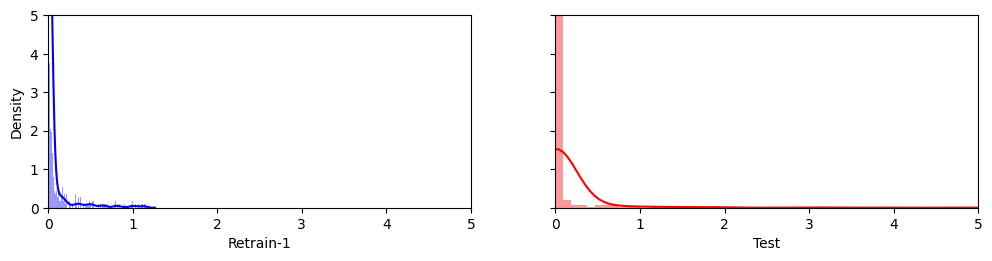

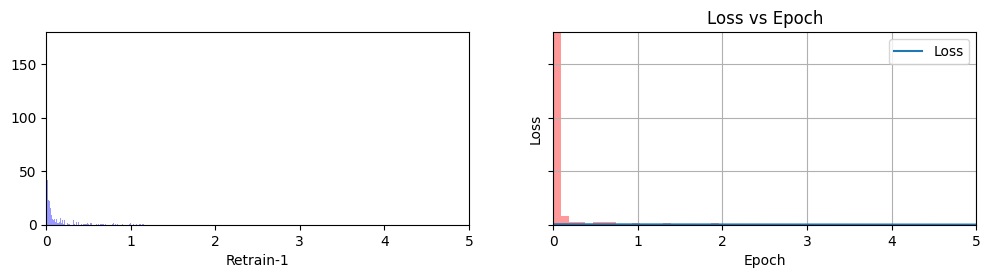

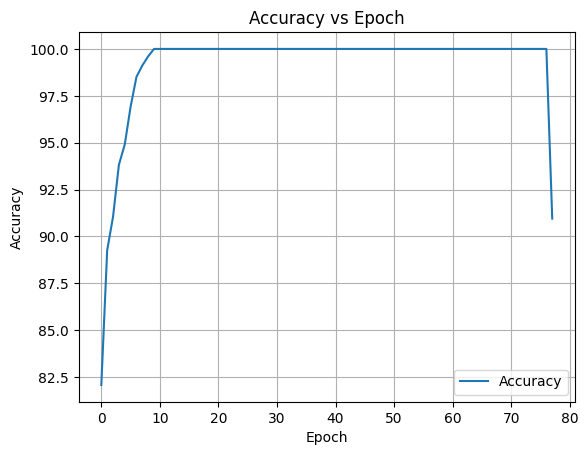

RT Threhold =  0.5769

Retraining Model in Progress...
Early stopping...


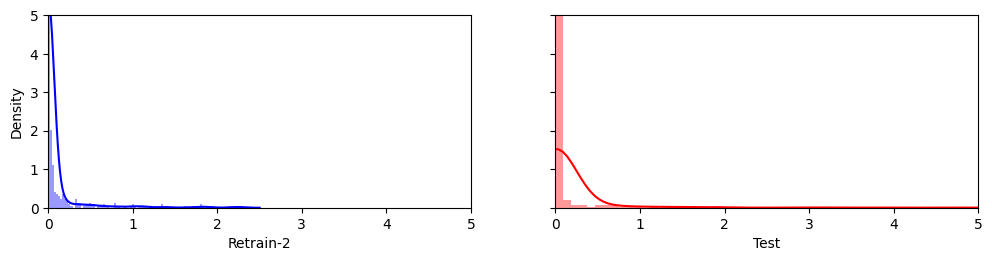

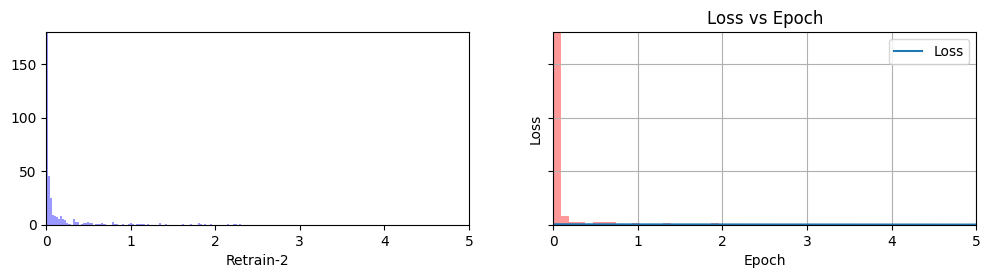

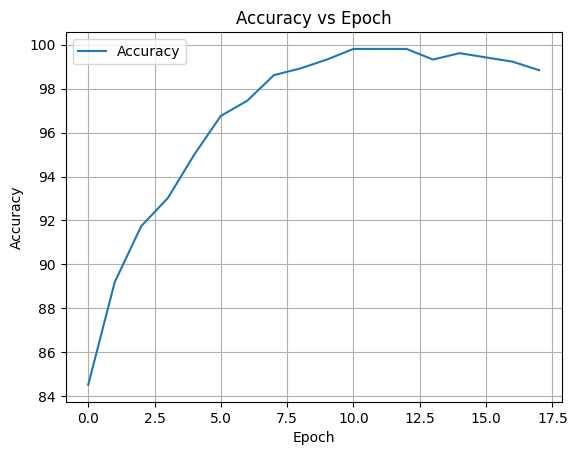

RT Threhold =  0.5744
28
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


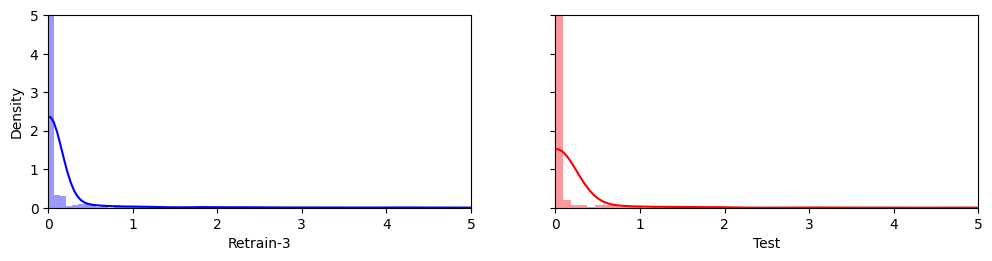

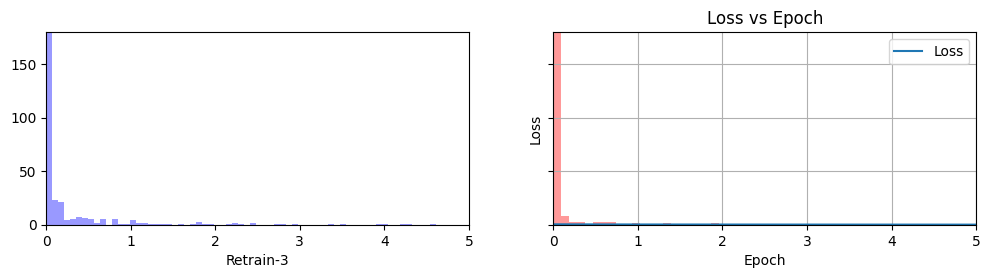

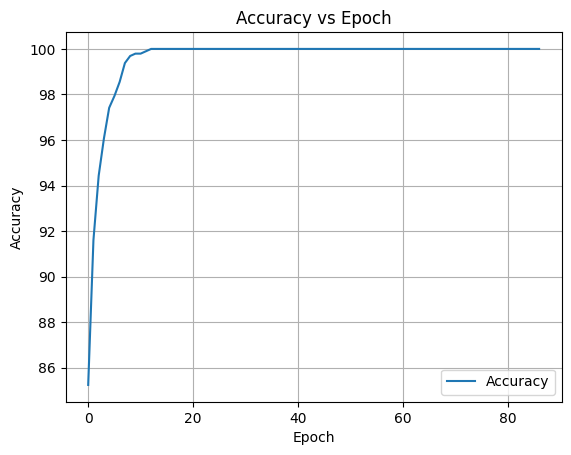

Train Threhold =  0.1764

Retraining Model in Progress...
Early stopping...


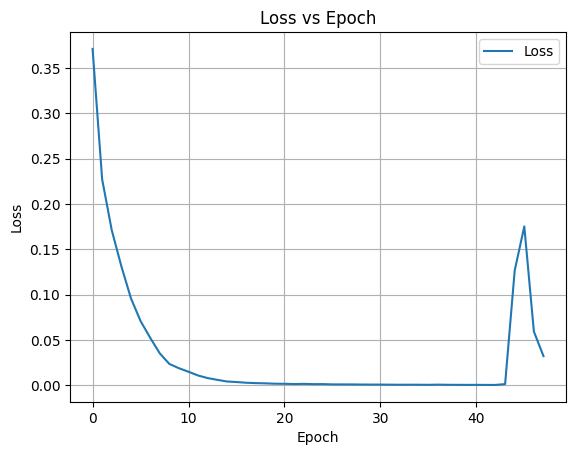

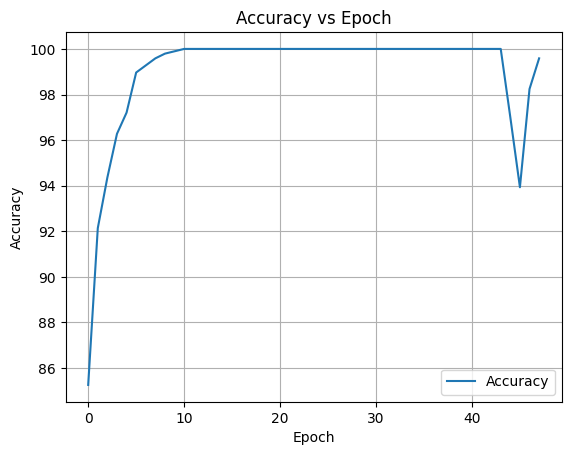

RT Threhold =  0.6651

Retraining Model in Progress...
Early stopping...


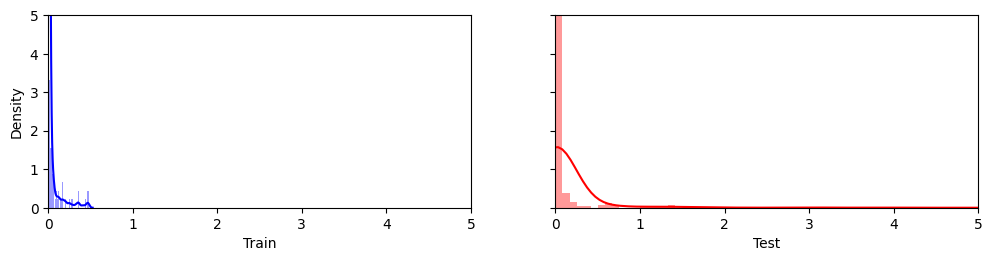

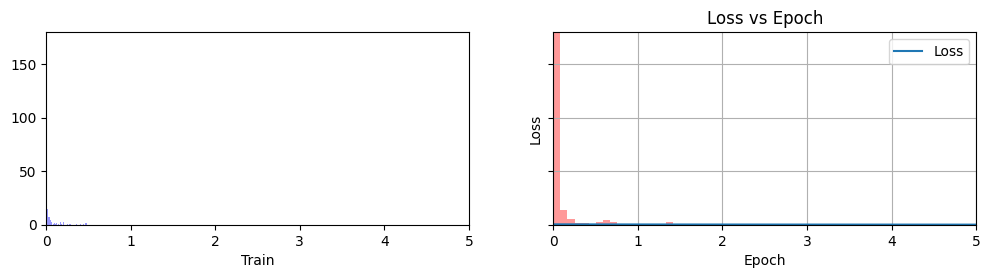

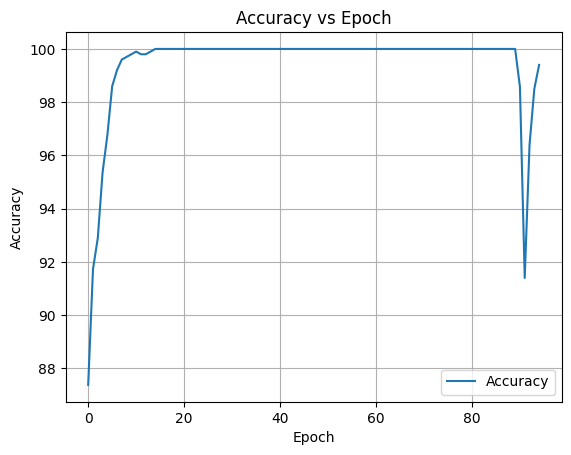

RT Threhold =  0.6953
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


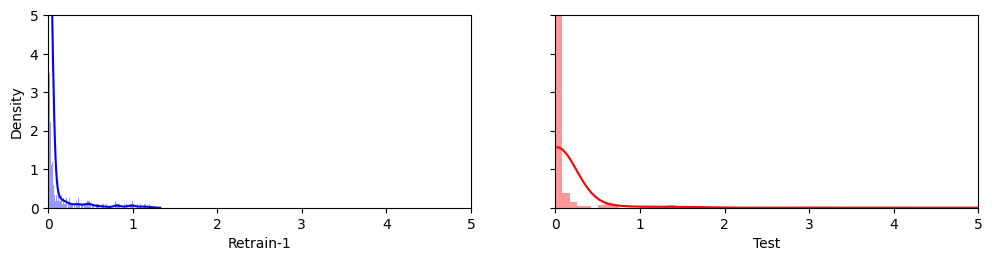

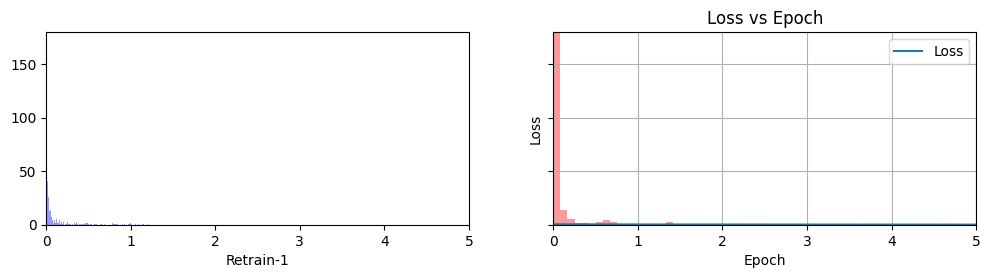

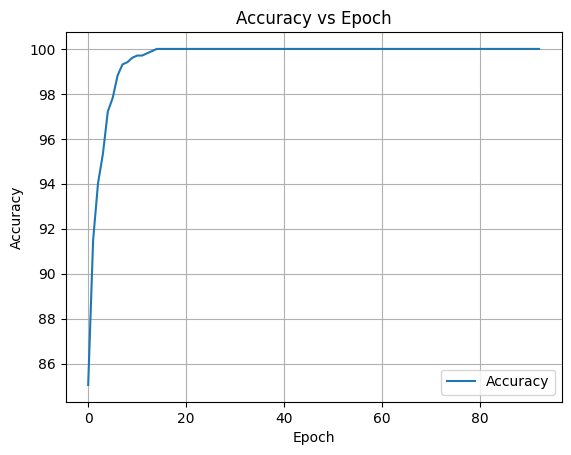

RT Threhold =  0.5095

Retraining Model in Progress...
Early stopping...


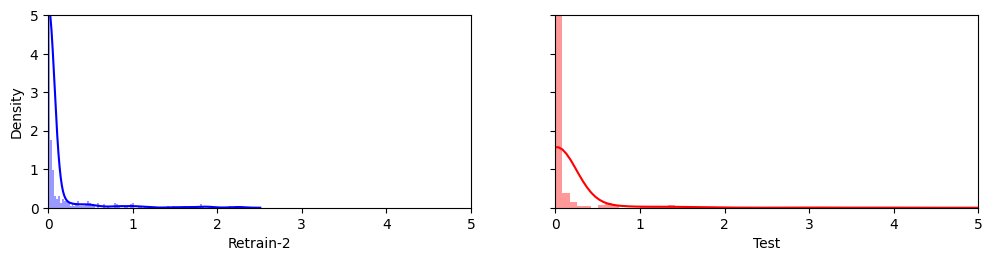

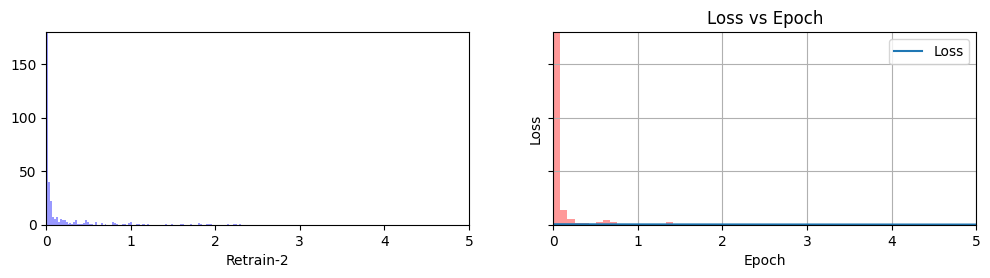

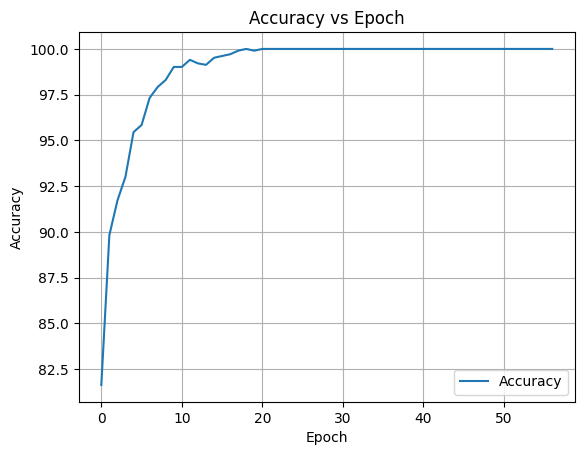

RT Threhold =  0.2419
29
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...
Early stopping...


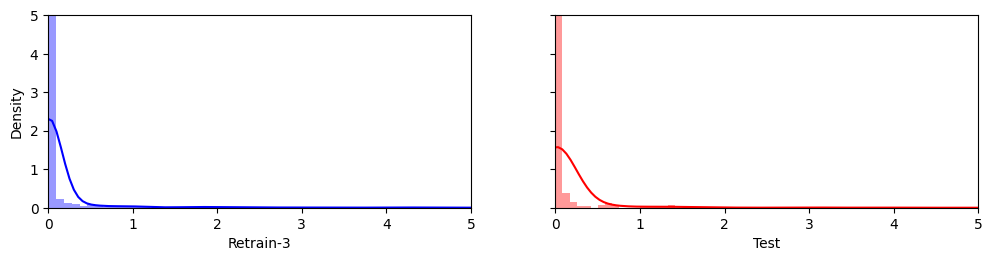

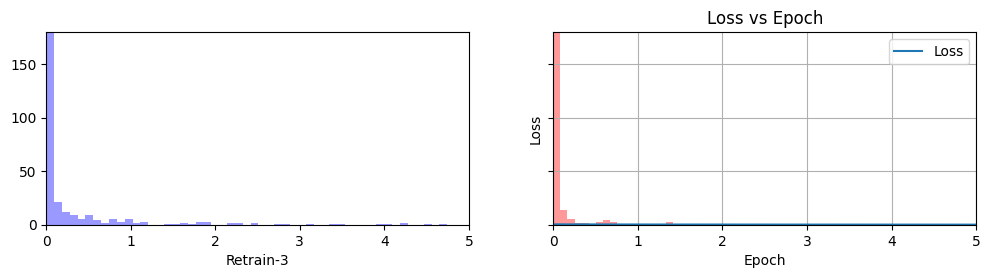

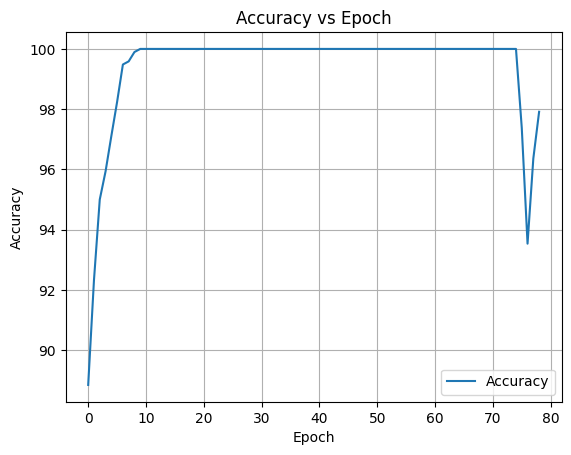

Train Threhold =  0.4655

Retraining Model in Progress...
Early stopping...


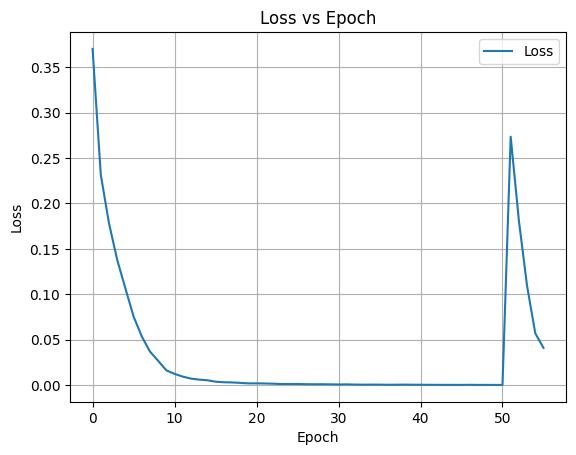

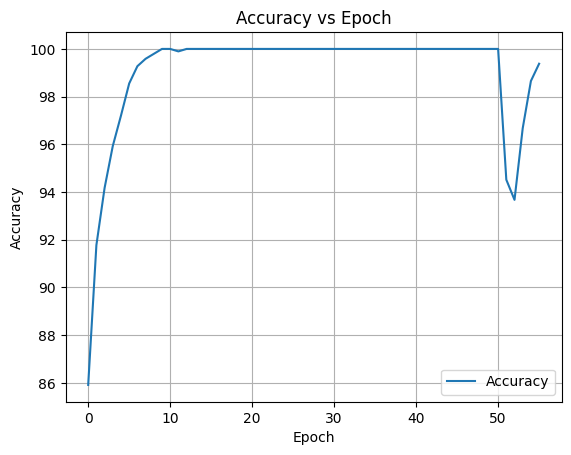

RT Threhold =  0.5657

Retraining Model in Progress...
Early stopping...


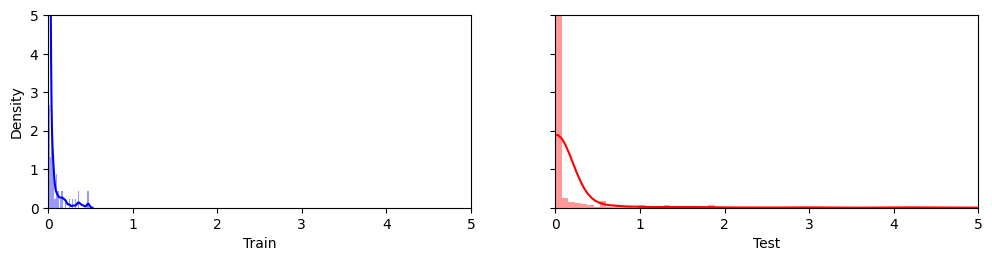

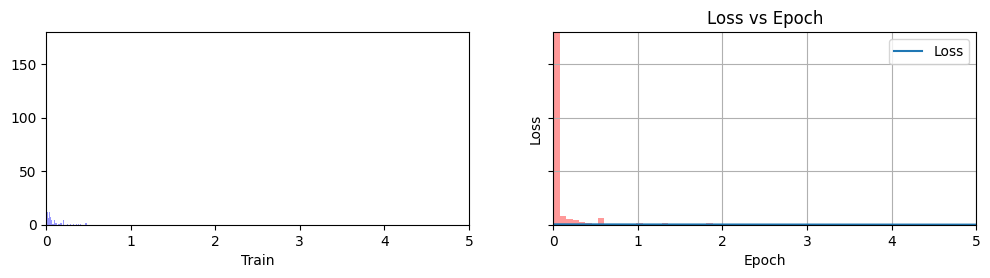

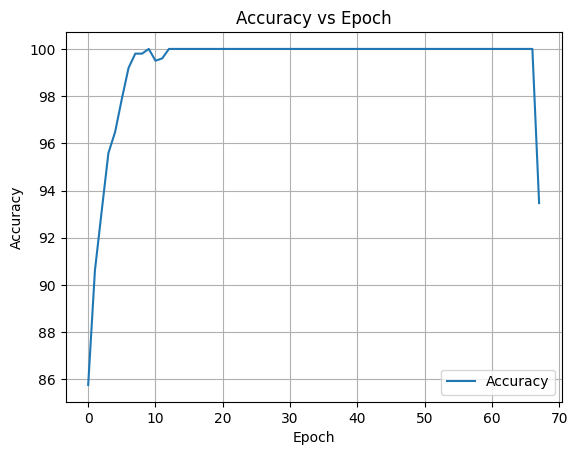

RT Threhold =  0.8571
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


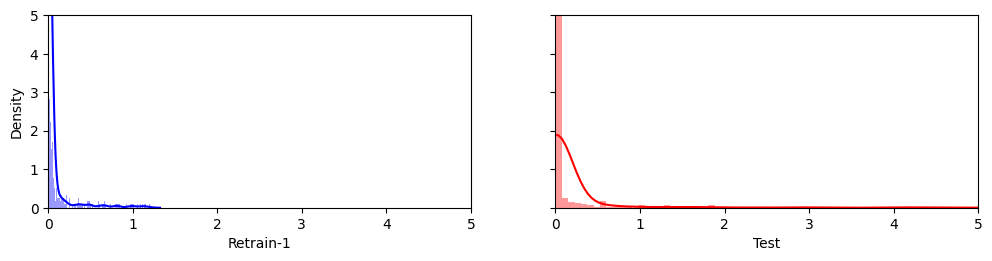

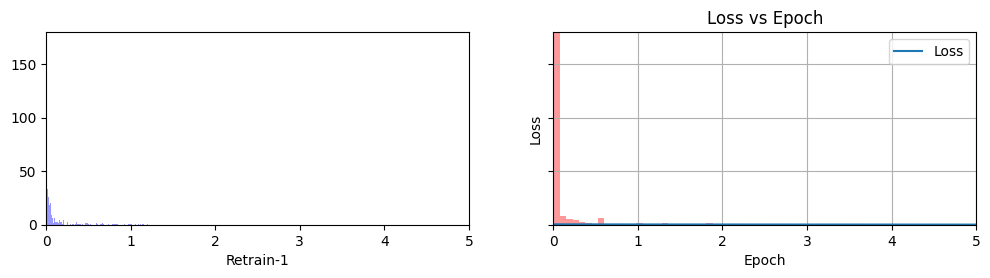

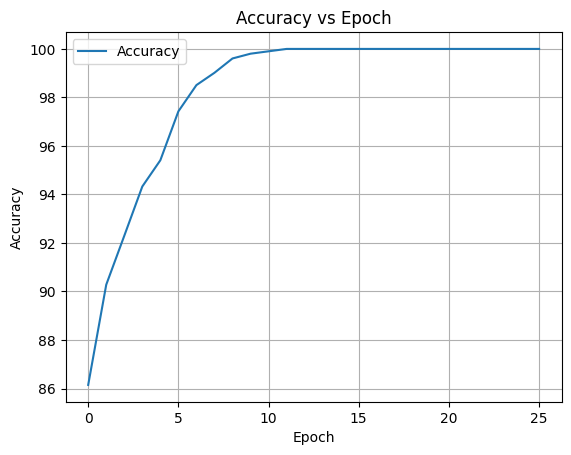

RT Threhold =  0.5611

Retraining Model in Progress...
Early stopping...


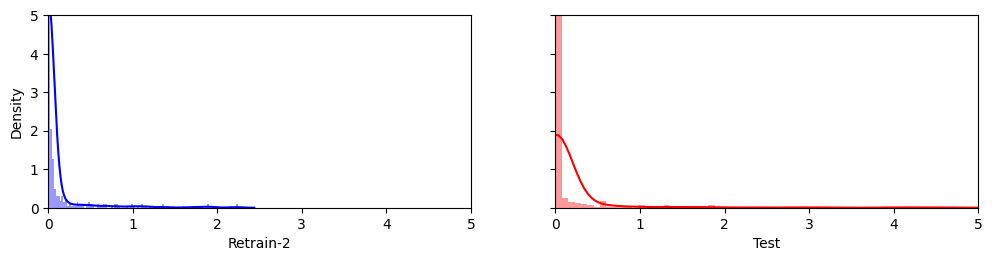

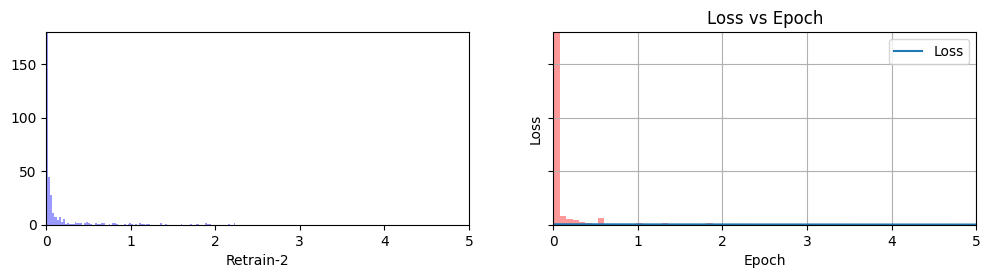

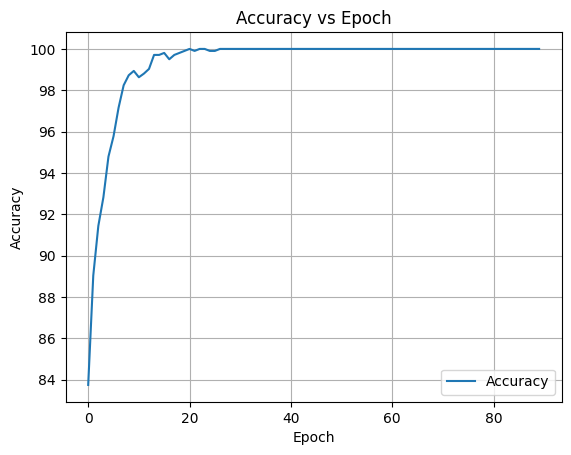

RT Threhold =  0.2211
30
topGroup4  =  0.489232
topGroup3  =  1.21
topGroup2  =  2.4
topGroup1  =  9.303887

Training Model in Progress...


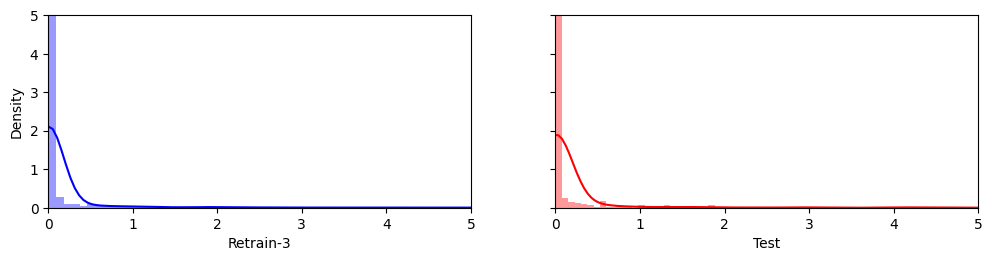

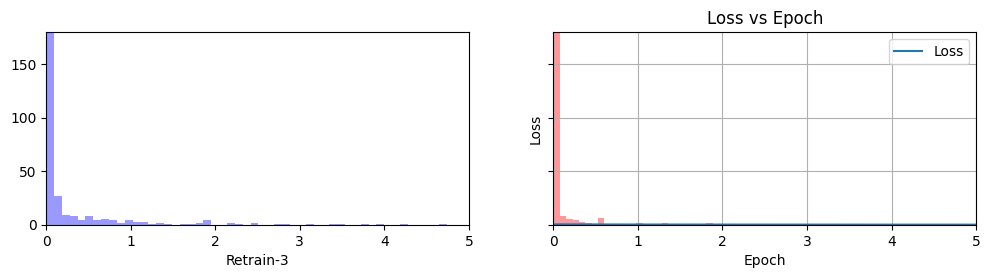

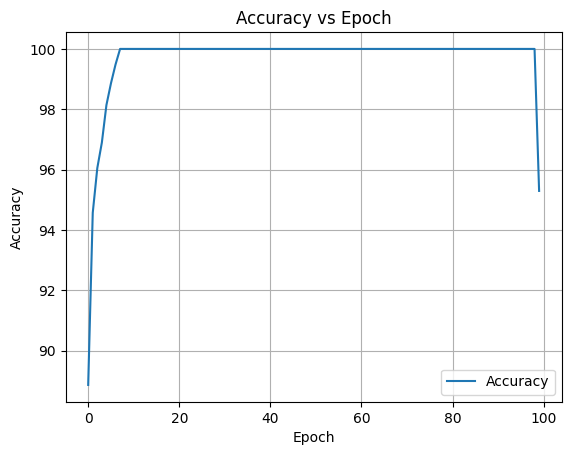

Train Threhold =  0.2308

Retraining Model in Progress...


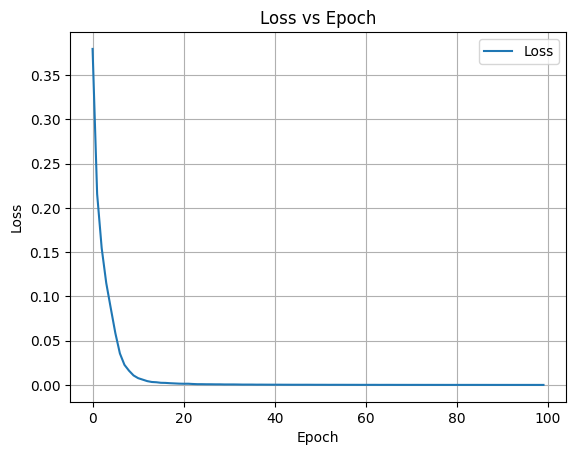

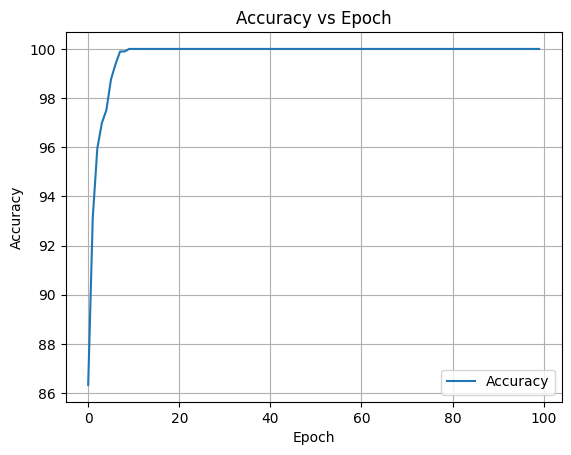

RT Threhold =  0.2008

Retraining Model in Progress...
Early stopping...


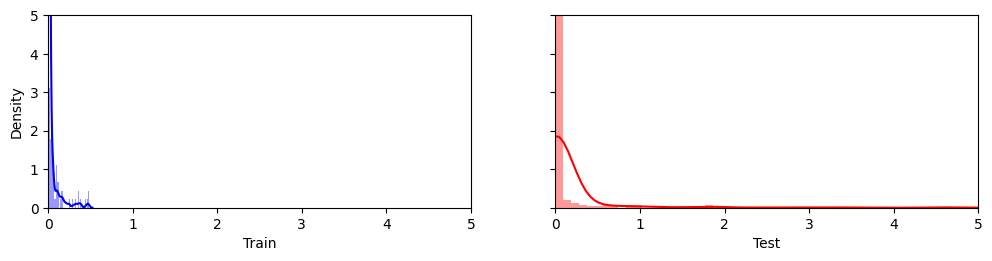

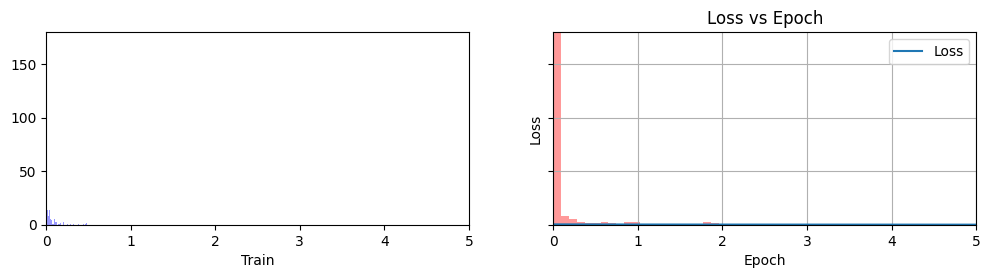

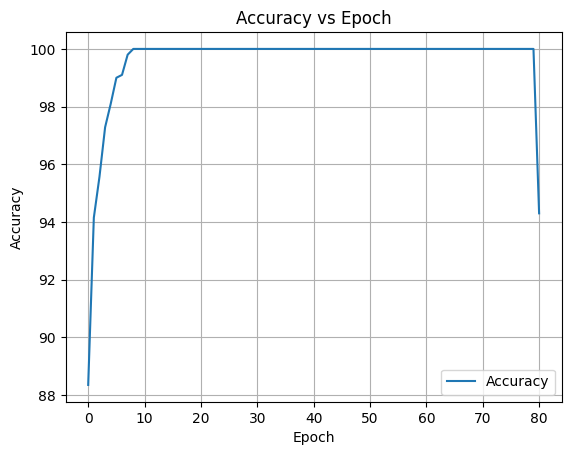

RT Threhold =  0.2293
exp 1_2 =  1.21 (44, 161)

Retraining Model in Progress...
Early stopping...


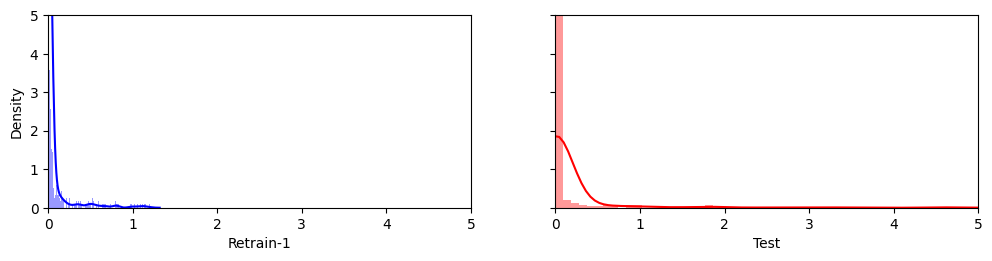

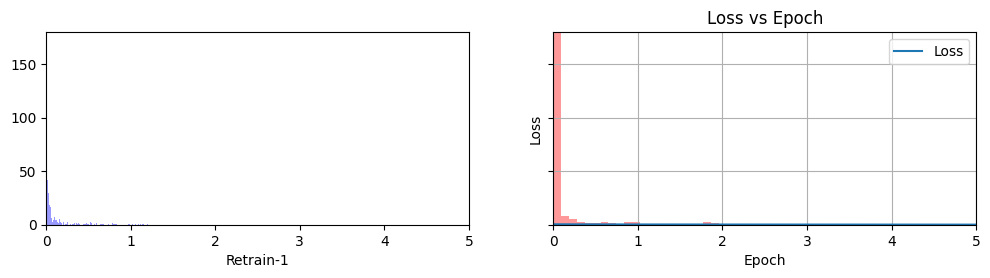

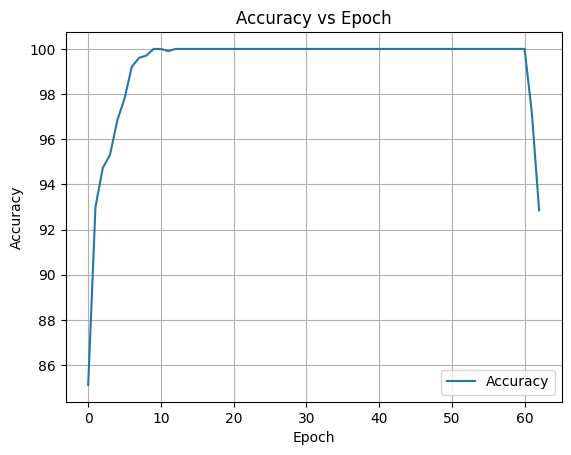

RT Threhold =  0.3708

Retraining Model in Progress...


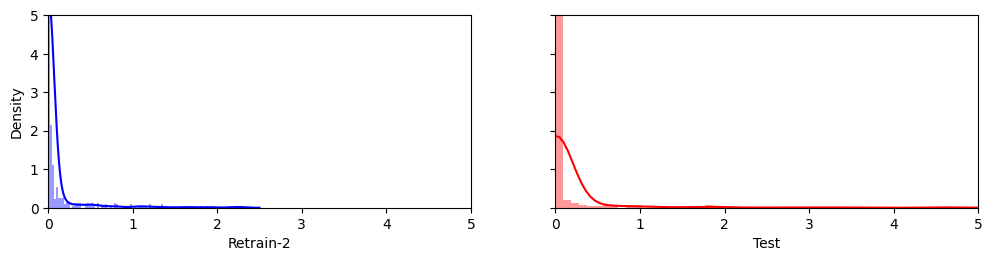

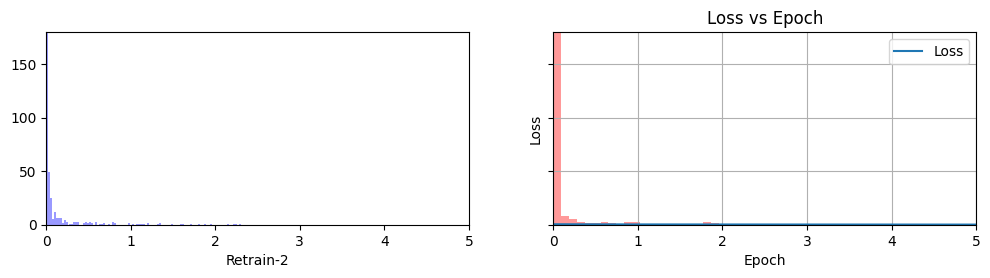

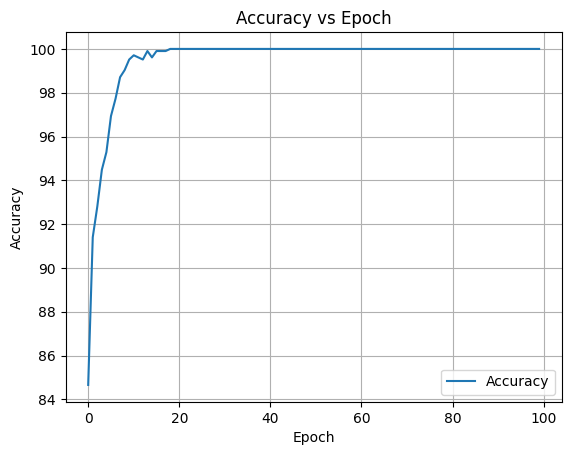

RT Threhold =  0.3184


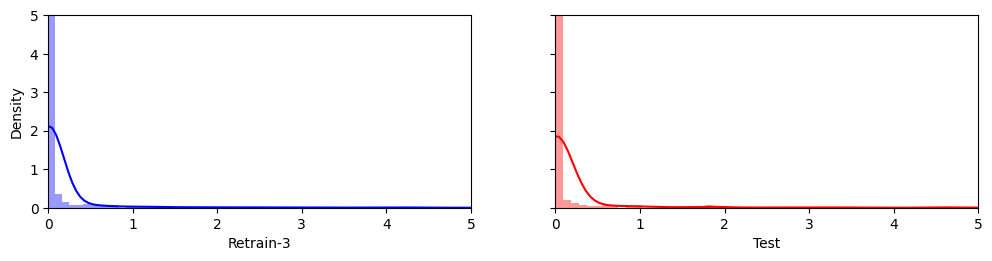

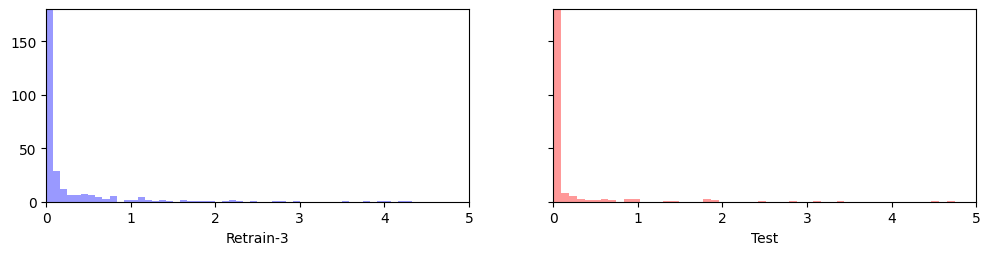

In [52]:
# Initialize KLD arrays
kl_divergenceALL_T_T1 = []
kl_divergenceALL_RT_T2 = []
kl_featuresALL_T_T1 = []
kl_featuresALL_RT_T2 = []

kl_divergenceALL_T_T1_ood = []
kl_divergenceALL_RT_T2_ood = []
kl_featuresALL_T_T1_ood = []
kl_featuresALL_RT_T2_ood = []


for i in range(1, 31):
    print(i)
    numIter = i
    # tran classifier
    gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, reserve_data, test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, gf1Smmy_reserve, gf1SmmX_test, gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, F1_gf1Smm_train, train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, test_TP, trainEpoch, w0, w1 = assignSample_trainClassifier(numIter, data_io, gf1_Threshold, yLname)

    # create retrain set and retrain classifier
    createRetrainSet(gf1Smm_train_dataF, gf1Smm_reserve_dataF, gf1Smm_test_dataF, gf1Smm_test_ID, gf1Smm_test_OOD, reserve_data, 
                     test_data, topGroup1, topGroup2, topGroup3, topGroup4, gf1SmmX_reserve, gf1Smmy_reserve, gf1SmmX_test, 
                     gf1Smmy_test, Sen_gf1Smm_train, Spe_gf1Smm_train, Acc_gf1Smm_train, Pre_gf1Smm_train, F1_gf1Smm_train, 
                     train_TN, train_FN, train_FP, train_TP, test_TN, test_FN, test_FP, test_TP, numIter, trainEpoch, w0, w1)
    

In [53]:
#  COMPUTE COUNTS, PERFORMANCE, KLD
# SHow counts and Performance indicators

len_exp = len(df_CM["Method"].unique())
experiments = df_CM["Method"].unique()


for j in range (1, len_exp+1):
    experimentID = experiments[j-1]
                
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
    getCounts(df_Counts, experimentID)
    getPerformance(df_CM, experimentID)
    getOoDScoreRange(df_OodRange, experimentID)
    getEpochs(df_Counts, experimentID)
    

    # Initialize KLD arrays
    kl_divergenceALL_T_T1 = []
    kl_divergenceALL_RT_T2 = []
    kl_featuresALL_T_T1 = []
    kl_featuresALL_RT_T2 = []
    
    kl_divergenceALL_T_T1_ood = []
    kl_divergenceALL_RT_T2_ood = []
    kl_featuresALL_T_T1_ood = []
    kl_featuresALL_RT_T2_ood = []


    # Compute average for KLD features
    # 'Experiment1_0' - is the original training/testing -- to compare all experiments with
    kl_divergenceALL_T_T1, kl_divergenceALL_RT_T2, kl_featuresALL_T_T1, kl_featuresALL_RT_T2 = avgKLDbyFeature('Experiment1_0', experimentID, "All")
    kl_divergenceALL_T_T1_ood, kl_divergenceALL_RT_T2_ood, kl_featuresALL_T_T1_ood, kl_featuresALL_RT_T2_ood = avgKLDbyFeature('Experiment1_0', experimentID, "OOD")

    
    # KLD Cumulative Graph
    KLD_cummulativeGraph(kl_divergenceALL_T_T1, kl_divergenceALL_RT_T2, kl_featuresALL_T_T1, kl_featuresALL_RT_T2)

    #KLD CI
    getKLDRange(experimentID, "All")
    getKLDRange(experimentID, "OOD")
    
    print(" ")
    print(" ")


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


TypeError: rv_generic.interval() missing 1 required positional argument: 'confidence'

#### Significant Test - 2-tail (if Difference is Significant)

In [ ]:
Acc_test0 = df_CM.where((df_CM.Method== "Experiment1_0")).dropna()['Acc_test']
Acc_test1 = df_CM.where((df_CM.Method== "Experiment1_1")).dropna()['Acc_test']
Acc_test2 = df_CM.where((df_CM.Method== "Experiment1_2")).dropna()['Acc_test']
Acc_test3 = df_CM.where((df_CM.Method== "Experiment1_3")).dropna()['Acc_test']
Acc_test4 = df_CM.where((df_CM.Method== "Experiment1_4")).dropna()['Acc_test']


stat1, p_value1 = stats.ttest_ind(Acc_test0, Acc_test1)
sigDesc1 = sigPval(p_value1)
stat2, p_value2 = stats.ttest_ind(Acc_test0, Acc_test2)
sigDesc2 = sigPval(p_value2)
stat3, p_value3 = stats.ttest_ind(Acc_test0, Acc_test3)
sigDesc3 = sigPval(p_value3)
stat4, p_value4 = stats.ttest_ind(Acc_test0, Acc_test4)
sigDesc4 = sigPval(p_value4)

print("Test - Satt. Sig.")
print('ACC - Test-Baseline and Test 10: p_value=%.4f - %s' % (p_value1, sigDesc1))
print('ACC - Test-Baseline and Test 20: p_value=%.4f - %s' % (p_value2, sigDesc2))
print('ACC - Test-Baseline and Test 30: p_value=%.4f - %s' % (p_value3, sigDesc3))
print('ACC - Test-Baseline and Test 40: p_value=%.4f - %s' % (p_value4, sigDesc4))

#### Significant Test - 1-tail -- TRAIN and TEST -- (if Difference is sig. more than what you are comparing it with)

In [ ]:
# TEST
Acc_test0 = df_CM.where((df_CM.Method== "Experiment1_0")).dropna()['Acc_test']
Acc_test1 = df_CM.where((df_CM.Method== "Experiment1_1")).dropna()['Acc_test']
Acc_test2 = df_CM.where((df_CM.Method== "Experiment1_2")).dropna()['Acc_test']
Acc_test3 = df_CM.where((df_CM.Method== "Experiment1_3")).dropna()['Acc_test']
Acc_test4 = df_CM.where((df_CM.Method== "Experiment1_4")).dropna()['Acc_test']


# test0 with all others
#ttest_1samp
stat1, p_value1 = stats.ttest_ind(Acc_test0, Acc_test1, alternative='less')
sigDesc1 = sigPval(p_value1)
stat2, p_value2 = stats.ttest_ind(Acc_test0, Acc_test2, alternative='less')
sigDesc2 = sigPval(p_value2)
stat3, p_value3 = stats.ttest_ind(Acc_test0, Acc_test3, alternative='less')
sigDesc3 = sigPval(p_value3)
stat4, p_value4 = stats.ttest_ind(Acc_test0, Acc_test4, alternative='less')
sigDesc4 = sigPval(p_value4)

# between tests 1, 2, 3, 4
stat5, p_value5 = stats.ttest_ind(Acc_test1, Acc_test2, alternative='less')  # 1 & 2
sigDesc5 = sigPval(p_value5)
stat6, p_value6 = stats.ttest_ind(Acc_test2, Acc_test3, alternative='less')  # 2 & 3
sigDesc6 = sigPval(p_value6)
stat7, p_value7 = stats.ttest_ind(Acc_test3, Acc_test4, alternative='less')  # 3 & 4
sigDesc7 = sigPval(p_value7)


print("TEST")
print("Test 1, 2, 3, 4 > Test 0 --- Sat. Sig. Greater?")
print('ACC - Test 0 and Test 1: p_value=%.4f - %s' % (p_value1, sigDesc1))
print('ACC - Test 0 and Test 2: p_value=%.4f - %s' % (p_value2, sigDesc2))
print('ACC - Test 0 and Test 3: p_value=%.4f - %s' % (p_value3, sigDesc3))
print('ACC - Test 0 and Test 4: p_value=%.4f - %s' % (p_value4, sigDesc4))

print(" ")
print("Test 1<2<3<4  --- Sat. Sig. Greater?")
print('ACC - Test 1 & 2: p_value=%.4f - %s' % (p_value5, sigDesc5))
print('ACC - Test 2 & 2: p_value=%.4f - %s' % (p_value6, sigDesc6))
print('ACC - Test 3 & 4: p_value=%.4f - %s' % (p_value7, sigDesc7))


In [ ]:
# TRAIN
Acc_train0 = df_CM.where((df_CM.Method== "Experiment1_0")).dropna()['Acc_train']
Acc_train1 = df_CM.where((df_CM.Method== "Experiment1_1")).dropna()['Acc_retrain']
Acc_train2 = df_CM.where((df_CM.Method== "Experiment1_2")).dropna()['Acc_retrain']
Acc_train3 = df_CM.where((df_CM.Method== "Experiment1_3")).dropna()['Acc_retrain']
Acc_train4 = df_CM.where((df_CM.Method== "Experiment1_4")).dropna()['Acc_retrain']

# train0 with all others
stat1, p_value1 = stats.ttest_ind(Acc_train0, Acc_train1, alternative='greater')
sigDesc1 = sigPval(p_value1)
stat2, p_value2 = stats.ttest_ind(Acc_train0, Acc_train2, alternative='greater')
sigDesc2 = sigPval(p_value2)
stat3, p_value3 = stats.ttest_ind(Acc_train0, Acc_train3, alternative='greater')
sigDesc3 = sigPval(p_value3)
stat4, p_value4 = stats.ttest_ind(Acc_train0, Acc_train4, alternative='greater')
sigDesc4 = sigPval(p_value4)

# between train 1, 2, 3, 4
stat5, p_value5 = stats.ttest_ind(Acc_train1, Acc_train2, alternative='greater')  # 1 & 2
sigDesc5 = sigPval(p_value5)
stat6, p_value6 = stats.ttest_ind(Acc_train2, Acc_train3, alternative='greater')  # 2 & 3
sigDesc6 = sigPval(p_value6)
stat7, p_value7 = stats.ttest_ind(Acc_train3, Acc_train4, alternative='greater')  # 3 & 4
sigDesc7 = sigPval(p_value7)

print("TRAIN")
print("Retrain 1, 2, 3, 4 > Train 0 --- Sat. Sig. Greater?")
print('ACC - Train 0 and Retrain 1: p_value=%.4f - %s' % (p_value1, sigDesc1))
print('ACC - Train 0 and Retrain 2: p_value=%.4f - %s' % (p_value2, sigDesc2))
print('ACC - Train 0 and Retrain 3: p_value=%.4f - %s' % (p_value3, sigDesc3))
print('ACC - Train 0 and Retrain 4: p_value=%.4f - %s' % (p_value4, sigDesc4))

print(" ")
print("Retrain 1<2<3<4  --- Sat. Sig. Greater?")
print('ACC - Retrain 1 & 2: p_value=%.4f - %s' % (p_value5, sigDesc5))
print('ACC - Retrain 2 & 2: p_value=%.4f - %s' % (p_value6, sigDesc6))
print('ACC - Retrain 3 & 4: p_value=%.4f - %s' % (p_value7, sigDesc7))

In [ ]:
# KLD - All samples
kld_train0 = df_KLD.where((df_KLD['Method'] == "Experiment1_0") & (df_KLD['Types'] == "All")).dropna()['KLD_t_t']
kld_train1 = df_KLD.where((df_KLD['Method'] == "Experiment1_1") & (df_KLD['Types'] == "All")).dropna()['KLD_rt_t']
kld_train2 = df_KLD.where((df_KLD['Method'] == "Experiment1_2") & (df_KLD['Types'] == "All")).dropna()['KLD_rt_t']
kld_train3 = df_KLD.where((df_KLD['Method'] == "Experiment1_3") & (df_KLD['Types'] == "All")).dropna()['KLD_rt_t']
kld_train4 = df_KLD.where((df_KLD['Method'] == "Experiment1_4") & (df_KLD['Types'] == "All")).dropna()['KLD_rt_t']

# train0 with all others
stat1, p_value1 = stats.ttest_ind(kld_train0, kld_train1, alternative='greater')
sigDesc1 = sigPval(p_value1)
stat2, p_value2 = stats.ttest_ind(kld_train0, kld_train2, alternative='greater')
sigDesc2 = sigPval(p_value2)
stat3, p_value3 = stats.ttest_ind(kld_train0, kld_train3, alternative='greater')
sigDesc3 = sigPval(p_value3)
stat4, p_value4 = stats.ttest_ind(kld_train0, kld_train4, alternative='greater')
sigDesc4 = sigPval(p_value4)

# between train 1, 2, 3, 4
stat5, p_value5 = stats.ttest_ind(kld_train1, kld_train2, alternative='greater')  # 1 & 2
sigDesc5 = sigPval(p_value5)
stat6, p_value6 = stats.ttest_ind(kld_train2, kld_train3, alternative='greater')  # 2 & 3
sigDesc6 = sigPval(p_value6)
stat7, p_value7 = stats.ttest_ind(kld_train3, kld_train4, alternative='greater')  # 3 & 4
sigDesc7 = sigPval(p_value7)

print("TRAIN")
print("Retrain 1, 2, 3, 4 > Train 0 --- Sat. Sig. Greater?")
print('kld - Train 0 and Retrain 1: p_value=%.4f - %s' % (p_value1, sigDesc1))
print('kld - Train 0 and Retrain 2: p_value=%.4f - %s' % (p_value2, sigDesc2))
print('kld - Train 0 and Retrain 3: p_value=%.4f - %s' % (p_value3, sigDesc3))
print('kld - Train 0 and Retrain 4: p_value=%.4f - %s' % (p_value4, sigDesc4))

print(" ")
print("Retrain 1<2<3<4  --- Sat. Sig. Greater?")
print('kld - Retrain 1 & 2: p_value=%.4f - %s' % (p_value5, sigDesc5))
print('kld - Retrain 2 & 2: p_value=%.4f - %s' % (p_value6, sigDesc6))
print('kld - Retrain 3 & 4: p_value=%.4f - %s' % (p_value7, sigDesc7))

In [ ]:
# KLD - OoD samples
kld_train0 = df_KLD.where((df_KLD['Method'] == "Experiment1_0") & (df_KLD['Types'] == "OOD")).dropna()['KLD_t_t']
kld_train1 = df_KLD.where((df_KLD['Method'] == "Experiment1_1") & (df_KLD['Types'] == "OOD")).dropna()['KLD_rt_t']
kld_train2 = df_KLD.where((df_KLD['Method'] == "Experiment1_2") & (df_KLD['Types'] == "OOD")).dropna()['KLD_rt_t']
kld_train3 = df_KLD.where((df_KLD['Method'] == "Experiment1_3") & (df_KLD['Types'] == "OOD")).dropna()['KLD_rt_t']
kld_train4 = df_KLD.where((df_KLD['Method'] == "Experiment1_4") & (df_KLD['Types'] == "OOD")).dropna()['KLD_rt_t']

# train0 with all others
stat1, p_value1 = stats.ttest_ind(kld_train0, kld_train1, alternative='greater')
sigDesc1 = sigPval(p_value1)
stat2, p_value2 = stats.ttest_ind(kld_train0, kld_train2, alternative='greater')
sigDesc2 = sigPval(p_value2)
stat3, p_value3 = stats.ttest_ind(kld_train0, kld_train3, alternative='greater')
sigDesc3 = sigPval(p_value3)
stat4, p_value4 = stats.ttest_ind(kld_train0, kld_train4, alternative='greater')
sigDesc4 = sigPval(p_value4)

# between train 1, 2, 3, 4
stat5, p_value5 = stats.ttest_ind(kld_train1, kld_train2, alternative='greater')  # 1 & 2
sigDesc5 = sigPval(p_value5)
stat6, p_value6 = stats.ttest_ind(kld_train2, kld_train3, alternative='greater')  # 2 & 3
sigDesc6 = sigPval(p_value6)
stat7, p_value7 = stats.ttest_ind(kld_train3, kld_train4, alternative='greater')  # 3 & 4
sigDesc7 = sigPval(p_value7)

print("TRAIN")
print("Retrain 1, 2, 3, 4 > Train 0 --- Sat. Sig. Greater?")
print('kld - Train 0 and Retrain 1: p_value=%.4f - %s' % (p_value1, sigDesc1))
print('kld - Train 0 and Retrain 2: p_value=%.4f - %s' % (p_value2, sigDesc2))
print('kld - Train 0 and Retrain 3: p_value=%.4f - %s' % (p_value3, sigDesc3))
print('kld - Train 0 and Retrain 4: p_value=%.4f - %s' % (p_value4, sigDesc4))

print(" ")
print("Retrain 1<2<3<4  --- Sat. Sig. Greater?")
print('kld - Retrain 1 & 2: p_value=%.4f - %s' % (p_value5, sigDesc5))
print('kld - Retrain 2 & 2: p_value=%.4f - %s' % (p_value6, sigDesc6))
print('kld - Retrain 3 & 4: p_value=%.4f - %s' % (p_value7, sigDesc7))